In [2]:
import cv2 
import os 
import glob
import json
import csv
import io
import numpy as np
import matplotlib.pyplot as plt 
import pandas as pd
from datetime import datetime


from pathlib import Path
from functools import partial
from p_tqdm import p_map
from tqdm import tqdm 
from module.utils import imread, imfindcircles, findProjectiveTransform, str2array, circle_detection_multi_thread, find_valid_dest_circles
from module.disp_measure import displacement_measure, homography_transformation
from module.apca import run_apca_cas 

# Import circle detection and APCA parameters 
with open('params.json') as param_config_json : 
    param_config = json.load(param_config_json)



In [3]:
'''
1. Check if any images where circles detection is not performed.
& Run imfindcircles for recently added images and save to csv 
'''
# if analysis_tabel is not empty 
clear_previous_detection_results = False

if clear_previous_detection_results : 
    analysis_table = pd.DataFrame(columns=['image_name','num_centers','x_displacement','y_displacement',
                                          'centers_of_detected_circles'])
else : 
    analysis_table = pd.read_csv('analysis_table.csv')
sensor_info = pd.read_csv('sensor_info.csv')
dataset_folder = '/media/sss/Seagate Backup Plus Drive/NIA_Smart_Monitoring/'

analysis_period = [20200901, 90200901] # [starting time, end time]

# sensor_info = sensor_info[(sensor_info['Slab No'] == 9)] # desired apca target group
# sensor_info = sensor_info[(sensor_info['Sensor ID'] == 181)] # desired apca target group
# sensor_info = sensor_info[(sensor_info['Slab No'] == 8) & (sensor_info['Sensor Location'] == 'S')] # desired apca target group
# sensor_info = sensor_info[(sensor_info['Block'] == 5) & (sensor_info['Sensor Location'] == 'E') ] # desired apca target group
# sensor_info = sensor_info[(sensor_info['Block'] == 5) ] # desired apca target group
sensor_info = sensor_info[(sensor_info['Sensor Installation Year'] == 2020)] # desired apca target group
sensor_info

,Sensor ID,Sensor Type,Pier,Slab No,Block,Sensor Direction,Sensor Location,Displacement Direction,Sensor Installation Year
0,93,Img,P1,1,1,S,S,FALSE,2020
1,94,Img,P1,1,1,E,S,Forward,2020
2,95,Tmp,P1,1,1,E,S,Forward,2020
3,97,Img,P1,1,1,S,S,FALSE,2020
4,98,Img,P1,1,1,W,S,Backward,2020
...,...,...,...,...,...,...,...,...,...
126,208,Img,P59,58,10,W,E,Forward,2020
127,209,Tmp,P59,58,10,S,E,FALSE,2020
134,211,Img,P59,58,10,N,E,FALSE,2020
135,212,Img,P59,58,10,E,E,Backward,2020


In [91]:
sensors_dict = {}

for idx, row in sensor_info.iterrows():
    sensor_id = str(row['Sensor ID']).zfill(3)
    
    sensors_dict[sensor_id] = {}
    sensors_dict[sensor_id]['type'] = row['Sensor Type']
    sensors_dict[sensor_id]['pier']= row['Pier ']
    sensors_dict[sensor_id]['slab']= row['Slab No']
    sensors_dict[sensor_id]['block']= row['Block']
    sensors_dict[sensor_id]['snsr_dir']= row['Sensor Direction']
    sensors_dict[sensor_id]['snsr_loc']= row['Sensor Location']
    sensors_dict[sensor_id]['disp_dir']= row['Displacement Direction']
    sensors_dict[sensor_id]['install_year']= row['Sensor Installation Year']
    sensors_dict[sensor_id]['circles'] = {}
        

In [4]:
img_sensor_list = sensor_info[(sensor_info['Sensor Type'] == 'Img')]['Sensor ID']
img_list_for_cd = []

for sensor_id in img_sensor_list:
    # check installation year 
    
    install_year = sensor_info[(sensor_info['Sensor ID'] == sensor_id)]['Sensor Installation Year'].values[0]
    img_foler_name = os.path.join(dataset_folder, str(install_year), 'data')
    sensor_img_list = glob.glob(os.path.join(img_foler_name, 'Img_' + str(sensor_id).zfill(3)+'*.jpg'))
    
    for sensor_img in sensor_img_list: 
        sensor_img_date = int(os.path.basename(sensor_img)[8:16])
        if (sensor_img_date >= analysis_period[0]) and (sensor_img_date <= analysis_period[1]):
            img_list_for_cd.append(sensor_img)

    
img_list_for_cd.sort()

In [7]:
circles_list = p_map(partial(circle_detection_multi_thread, param_config=param_config), img_list_for_cd)

In [24]:
for sensor_id, date, time, circles, circles_dest in circles_list: 
    if date not in sensors_dict[sensor_id]['circles']: 
        sensors_dict[sensor_id]['circles'][date] = {}
    
    if isinstance(circles_dest, str) : 
        sensors_dict[sensor_id]['circles'][date][time]= circles_dest
    else :
        sensors_dict[sensor_id]['circles'][date][time]= circles_dest.tolist()

In [25]:
import json
with open('data.json', 'w') as f:
    json.dump(sensors_dict, f)

In [26]:
# to do 

tmp_sensor_list = sensor_info[(sensor_info['Sensor Type'] == 'Tmp')]['Sensor ID']

tmp_list_for_cd = []

for sensor_id in tmp_sensor_list:
    # check installation year 
    install_year = sensor_info[(sensor_info['Sensor ID'] == sensor_id)]['Sensor Installation Year'].values[0]
    img_foler_name = os.path.join(dataset_folder, str(install_year), 'data')
    sensor_tmp_list = glob.glob(os.path.join(img_foler_name, 'Tmp_' + str(sensor_id).zfill(3)+'*.tpr'))
    
    for sensor_tmp in sensor_tmp_list: 
        sensor_tmp_date = int(os.path.basename(sensor_tmp)[8:16])
        if (sensor_tmp_date >= analysis_period[0]) and (sensor_tmp_date <= analysis_period[1]):
            tmp_list_for_cd.append(sensor_tmp)

    
tmp_list_for_cd.sort()



In [50]:
for tmp_file in tmp_list_for_cd:
    
    f = io.open(tmp_file, mode="r", encoding="utf-8")
    txt = f.read()
    if txt :
        tmp_measured = str2array(txt)[1]
        
    tmp_basename = os.path.basename(tmp_file)
    sensor_id = tmp_basename[4:7]
    date = tmp_basename[8:16]
    time = tmp_basename[17:23]
    
    if 'temp' not in sensors_dict[sensor_id] : 
        sensors_dict[sensor_id]['temp'] = {}
        
    if date not in sensors_dict[sensor_id]['temp']: 
        sensors_dict[sensor_id]['temp'][date] = {}
    
    
    sensors_dict[sensor_id]['temp'][date][time]= tmp_measured
    

In [53]:

with open('data.json', 'w') as f:
    json.dump(sensors_dict, f)

In [4]:
import json
with open('sensor_data.json') as f:
    sensors_dict = json.load(f)

In [4]:
for sensor_id, sensor in sensors_dict.items():
    if sensor['type'] == 'Img' : 
        src_filename = param_config[sensor_id]['src_img']
        src_date = src_filename[8:16]
        src_time = src_filename[17:23]
        src_circles = np.asarray(sensor['circles'][src_date][src_time])
        print(sensor_id)

        
        for date, times in sensor['circles'].items():
            for time, circle in times.items():
                
                if 'x_disp' not in sensors_dict[sensor_id] : 
                    sensors_dict[sensor_id]['x_disp'] = {}
                    
                if 'y_disp' not in sensors_dict[sensor_id] : 
                    sensors_dict[sensor_id]['y_disp'] = {}
                    
                if date not in sensors_dict[sensor_id]['x_disp']: 
                    sensors_dict[sensor_id]['x_disp'][date] = {}
                    
                if date not in sensors_dict[sensor_id]['y_disp']: 
                    sensors_dict[sensor_id]['y_disp'][date] = {}
                
                if not isinstance(circle, str): 
                
                    dest_circles = np.asarray(circle)
                    displacement = homography_transformation(src_circles, dest_circles)
                    print(displacement[0])
                    
                    sensors_dict[sensor_id]['x_disp'][date][time] = displacement[0][0]
                    sensors_dict[sensor_id]['y_disp'][date][time] = displacement[1][0]
                elif isinstance(circle, str) : 
                    sensors_dict[sensor_id]['x_disp'][date][time] = float("NaN")
                    sensors_dict[sensor_id]['y_disp'][date][time] = float("NaN")
                    
                

093
[[ 822.45089286  402.03125   ]
 [ 827.61137441  600.86255924]
 [1024.56666667  399.89047619]
 [1027.44660194  599.12135922]]
[[ 820.05106383  398.88510638   83.66600265]
 [ 824.70742358  596.49781659   83.66600265]
 [1020.45089286  396.55357143   83.66600265]
 [1023.48728814  594.72457627   83.66600265]]
[-0.49610691]
[[ 822.45089286  402.03125   ]
 [ 827.61137441  600.86255924]
 [1024.56666667  399.89047619]
 [1027.44660194  599.12135922]]
[[ 819.63755459  397.91266376   83.66600265]
 [ 824.46086957  595.56086957   83.66600265]
 [1020.075       395.71666667   83.66600265]
 [1022.85775862  593.34913793   83.66600265]]
[-0.54874425]
[[ 822.45089286  402.03125   ]
 [ 827.61137441  600.86255924]
 [1024.56666667  399.89047619]
 [1027.44660194  599.12135922]]
[[ 819.39574468  397.15319149   83.66600265]
 [ 823.9795082   594.08196721   83.66600265]
 [1019.60392157  394.90588235   83.66600265]
 [1022.59565217  592.65652174   83.66600265]]
[-0.59456818]
[[ 822.45089286  402.03125   ]
 [ 82

[[ 822.45089286  402.03125   ]
 [ 827.61137441  600.86255924]
 [1024.56666667  399.89047619]
 [1027.44660194  599.12135922]]
[[ 822.83486239  390.72018349   83.66600265]
 [ 827.37727273  586.55         83.66600265]
 [1021.55348837  388.67906977   83.66600265]
 [1024.24378109  584.91044776   83.66600265]]
[-0.27697383]
[[ 822.45089286  402.03125   ]
 [ 827.61137441  600.86255924]
 [1024.56666667  399.89047619]
 [1027.44660194  599.12135922]]
[[ 824.65024631  392.88669951   83.66600265]
 [ 829.03626943  589.73056995   83.66600265]
 [1023.77948718  390.74358974   83.66600265]
 [1026.56218905  587.8358209    83.66600265]]
[-0.02624142]
[[ 822.45089286  402.03125   ]
 [ 827.61137441  600.86255924]
 [1024.56666667  399.89047619]
 [1027.44660194  599.12135922]]
[[ 825.78923767  394.9955157    83.66600265]
 [ 830.45777778  591.95111111   83.66600265]
 [1025.5         392.64150943   83.66600265]
 [1028.44339623  590.30188679   83.66600265]]
[0.16671305]
[[ 822.45089286  402.03125   ]
 [ 827.611

[-0.09711355]
[[ 822.45089286  402.03125   ]
 [ 827.61137441  600.86255924]
 [1024.56666667  399.89047619]
 [1027.44660194  599.12135922]]
[[ 824.03448276  391.48275862   83.66600265]
 [ 828.89005236  588.10994764   83.66600265]
 [1023.55329949  389.76649746   83.66600265]
 [1025.98947368  586.22631579   83.66600265]]
[-0.0759371]
[[ 822.45089286  402.03125   ]
 [ 827.61137441  600.86255924]
 [1024.56666667  399.89047619]
 [1027.44660194  599.12135922]]
[[ 823.46188341  391.24215247   83.66600265]
 [ 827.77033493  587.95215311   83.66600265]
 [1022.59259259  389.51388889   83.66600265]
 [1025.34285714  586.23809524   83.66600265]]
[-0.17827937]
[[ 822.45089286  402.03125   ]
 [ 827.61137441  600.86255924]
 [1024.56666667  399.89047619]
 [1027.44660194  599.12135922]]
[[ 823.00990099  391.39108911   83.66600265]
 [ 827.50753769  587.61306533   83.66600265]
 [1021.96517413  389.20895522   83.66600265]
 [1024.83246073  585.76439791   83.66600265]]
[-0.23585835]
[[ 822.45089286  402.03125 

[-0.10098732]
[[ 822.45089286  402.03125   ]
 [ 827.61137441  600.86255924]
 [1024.56666667  399.89047619]
 [1027.44660194  599.12135922]]
[[ 824.18032787  393.94672131   83.66600265]
 [ 828.812       590.704        83.66600265]
 [1023.02713178  391.65891473   83.66600265]
 [1026.12698413  588.92460317   83.66600265]]
[-0.08344793]
[[ 822.45089286  402.03125   ]
 [ 827.61137441  600.86255924]
 [1024.56666667  399.89047619]
 [1027.44660194  599.12135922]]
[[ 823.89112903  393.26612903   83.66600265]
 [ 828.11934156  589.57613169   83.66600265]
 [1022.87649402  391.03585657   83.66600265]
 [1025.53571429  588.02777778   83.66600265]]
[-0.13787148]
[[ 822.45089286  402.03125   ]
 [ 827.61137441  600.86255924]
 [1024.56666667  399.89047619]
 [1027.44660194  599.12135922]]
[[ 823.52301255  391.9707113    83.66600265]
 [ 828.09482759  588.59051724   83.66600265]
 [1022.33884298  390.03305785   83.66600265]
 [1024.94017094  586.82051282   83.66600265]]
[-0.18601337]
[[ 822.45089286  402.03125

[[ 822.45089286  402.03125   ]
 [ 827.61137441  600.86255924]
 [1024.56666667  399.89047619]
 [1027.44660194  599.12135922]]
[[ 824.74895397  391.41422594   83.66600265]
 [ 829.26907631  587.42971888   83.66600265]
 [1023.5503876   389.           83.66600265]
 [1026.46666667  585.91764706   83.66600265]]
[-0.02750303]
[[ 822.45089286  402.03125   ]
 [ 827.61137441  600.86255924]
 [1024.56666667  399.89047619]
 [1027.44660194  599.12135922]]
[[ 824.01219512  389.87398374   83.66600265]
 [ 828.74901961  586.16078431   83.66600265]
 [1022.2248062   387.96124031   83.66600265]
 [1025.596       584.32         83.66600265]]
[-0.13545834]
[[ 822.45089286  402.03125   ]
 [ 827.61137441  600.86255924]
 [1024.56666667  399.89047619]
 [1027.44660194  599.12135922]]
[[ 823.61842105  389.44298246   83.66600265]
 [ 828.07949791  585.0460251    83.66600265]
 [1021.99170124  386.95435685   83.66600265]
 [1024.80769231  583.23076923   83.66600265]]
[-0.20114975]
[[ 822.45089286  402.03125   ]
 [ 827.61

[-0.37416373]
[[ 822.45089286  402.03125   ]
 [ 827.61137441  600.86255924]
 [1024.56666667  399.89047619]
 [1027.44660194  599.12135922]]
[[ 823.69047619  382.68095238   83.66600265]
 [ 828.00512821  576.77948718   83.66600265]
 [1020.49753695  380.48768473   83.66600265]
 [1023.37        574.975        83.66600265]]
[-0.29833967]
[[ 822.45089286  402.03125   ]
 [ 827.61137441  600.86255924]
 [1024.56666667  399.89047619]
 [1027.44660194  599.12135922]]
[[ 823.14705882  382.36764706   83.66600265]
 [ 827.54146341  576.42926829   83.66600265]
 [1020.12871287  380.38613861   83.66600265]
 [1022.84491979  574.64171123   83.66600265]]
[-0.35753881]
[[ 822.45089286  402.03125   ]
 [ 827.61137441  600.86255924]
 [1024.56666667  399.89047619]
 [1027.44660194  599.12135922]]
[[ 823.45833333  382.47083333   83.66600265]
 [ 827.78087649  576.09960159   83.66600265]
 [1019.82916667  380.05833333   83.66600265]
 [1022.47033898  574.71186441   83.66600265]]
[-0.36127039]
[[ 822.45089286  402.03125

[-0.78493052]
[[ 822.45089286  402.03125   ]
 [ 827.61137441  600.86255924]
 [1024.56666667  399.89047619]
 [1027.44660194  599.12135922]]
[[ 820.73933649  380.34597156   83.66600265]
 [ 825.08530806  573.46445498   83.66600265]
 [1016.87373737  378.24747475   83.66600265]
 [1019.86432161  571.9798995    83.66600265]]
[-0.70325998]
[[ 822.45089286  402.03125   ]
 [ 827.61137441  600.86255924]
 [1024.56666667  399.89047619]
 [1027.44660194  599.12135922]]
[[ 821.82        384.29         83.66600265]
 [ 826.23300971  578.99514563   83.66600265]
 [1019.33        382.145        83.66600265]
 [1021.63902439  577.34634146   83.66600265]]
[-0.49944003]
[[ 822.45089286  402.03125   ]
 [ 827.61137441  600.86255924]
 [1024.56666667  399.89047619]
 [1027.44660194  599.12135922]]
[[ 821.92417062  385.8056872    83.66600265]
 [ 826.40669856  581.10526316   83.66600265]
 [1019.69767442  383.64651163   83.66600265]
 [1022.695       579.135        83.66600265]]
[-0.44515276]
[[ 822.45089286  402.03125

[-1.24438312]
[[ 822.45089286  402.03125   ]
 [ 827.61137441  600.86255924]
 [1024.56666667  399.89047619]
 [1027.44660194  599.12135922]]
[[ 817.10194175  372.42718447   83.66600265]
 [ 821.66019417  563.54854369   83.66600265]
 [1011.01030928  370.20618557   83.66600265]
 [1013.91145833  562.03645833   83.66600265]]
[-1.29507615]
[[ 822.45089286  402.03125   ]
 [ 827.61137441  600.86255924]
 [1024.56666667  399.89047619]
 [1027.44660194  599.12135922]]
[[ 817.34597156  373.33175355   83.66600265]
 [ 821.83084577  564.8159204    83.66600265]
 [1011.3627451   370.90686275   83.66600265]
 [1014.09326425  562.94300518   83.66600265]]
[-1.26501592]
[[ 822.45089286  402.03125   ]
 [ 827.61137441  600.86255924]
 [1024.56666667  399.89047619]
 [1027.44660194  599.12135922]]
[[ 817.52606635  373.34123223   83.66600265]
 [ 822.07920792  564.85148515   83.66600265]
 [1011.72413793  371.11330049   83.66600265]
 [1014.58974359  563.21538462   83.66600265]]
[-1.22502725]
[[ 822.45089286  402.03125

 [1027.44660194  599.12135922]]
[[ 819.12145749  369.55465587   83.66600265]
 [ 823.71841155  559.47292419   83.66600265]
 [1012.14227642  367.03658537   83.66600265]
 [1015.          558.           83.66600265]]
[-1.10289729]
[[ 822.45089286  402.03125   ]
 [ 827.61137441  600.86255924]
 [1024.56666667  399.89047619]
 [1027.44660194  599.12135922]]
[[ 818.76712329  368.24657534   83.66600265]
 [ 823.50746269  558.35447761   83.66600265]
 [1011.32608696  366.06956522   83.66600265]
 [1014.38429752  556.42975207   83.66600265]]
[-1.16566287]
[[ 822.45089286  402.03125   ]
 [ 827.61137441  600.86255924]
 [1024.56666667  399.89047619]
 [1027.44660194  599.12135922]]
[[ 818.23529412  367.22171946   83.66600265]
 [ 822.88617886  557.53658537   83.66600265]
 [1010.77876106  365.33628319   83.66600265]
 [1013.07594937  555.37130802   83.66600265]]
[-1.25976367]
[[ 822.45089286  402.03125   ]
 [ 827.61137441  600.86255924]
 [1024.56666667  399.89047619]
 [1027.44660194  599.12135922]]
[[ 818.3

[11.52747959]
[[767.22641509 348.74528302]
 [767.39613527 544.44444444]
 [964.68202765 349.79723502]
 [963.90731707 546.13658537]]
[[ 861.82478632  351.21794872   83.66600265]
 [ 861.96484375  545.84375      83.66600265]
 [1058.42639594  352.73604061   83.66600265]
 [1057.57429719  547.32931727   83.66600265]]
[12.01348571]
[[767.22641509 348.74528302]
 [767.39613527 544.44444444]
 [964.68202765 349.79723502]
 [963.90731707 546.13658537]]
[[ 865.14590747  351.16014235   83.66600265]
 [ 865.51803279  545.03278689   83.66600265]
 [1061.44106464  352.90114068   83.66600265]
 [1060.65492958  547.93309859   83.66600265]]
[12.42524345]
[[767.22641509 348.74528302]
 [767.39613527 544.44444444]
 [964.68202765 349.79723502]
 [963.90731707 546.13658537]]
[[ 868.58113208  351.84150943   83.66600265]
 [ 868.79020979  545.80769231   83.66600265]
 [1065.28057554  352.39928058   83.66600265]
 [1063.87543253  547.64359862   83.66600265]]
[12.862118]
[[767.22641509 348.74528302]
 [767.39613527 544.4444

[[767.22641509 348.74528302]
 [767.39613527 544.44444444]
 [964.68202765 349.79723502]
 [963.90731707 546.13658537]]
[[ 837.7         350.44285714   83.66600265]
 [ 837.2952381   546.33333333   83.66600265]
 [1034.97044335  351.66502463   83.66600265]
 [1033.42647059  547.72058824   83.66600265]]
[8.95315861]
[[767.22641509 348.74528302]
 [767.39613527 544.44444444]
 [964.68202765 349.79723502]
 [963.90731707 546.13658537]]
[[ 832.          350.26732673   83.66600265]
 [ 831.83333333  545.96969697   83.66600265]
 [1029.43283582  351.4079602    83.66600265]
 [1028.17098446  547.71502591   83.66600265]]
[8.25599581]
[[767.22641509 348.74528302]
 [767.39613527 544.44444444]
 [964.68202765 349.79723502]
 [963.90731707 546.13658537]]
[[ 837.52727273  350.65         83.66600265]
 [ 837.21052632  546.20614035   83.66600265]
 [1034.65765766  351.57657658   83.66600265]
 [1033.53393665  547.47963801   83.66600265]]
[8.93844111]
[[767.22641509 348.74528302]
 [767.39613527 544.44444444]
 [964.682

[19.24060732]
[[767.22641509 348.74528302]
 [767.39613527 544.44444444]
 [964.68202765 349.79723502]
 [963.90731707 546.13658537]]
[[ 922.528       351.188        83.66600265]
 [ 922.06504065  545.81707317   83.66600265]
 [1118.61965812  352.85897436   83.66600265]
 [1117.03305785  547.85123967   83.66600265]]
[19.6401149]
[[767.22641509 348.74528302]
 [767.39613527 544.44444444]
 [964.68202765 349.79723502]
 [963.90731707 546.13658537]]
[[ 926.12676056  351.46948357   83.66600265]
 [ 925.02926829  546.14634146   83.66600265]
 [1122.53554502  352.51658768   83.66600265]
 [1120.7755102   547.90816327   83.66600265]]
[20.09082352]
[[767.22641509 348.74528302]
 [767.39613527 544.44444444]
 [964.68202765 349.79723502]
 [963.90731707 546.13658537]]
[[ 925.27830189  351.45754717   83.66600265]
 [ 924.36057692  546.375        83.66600265]
 [1121.63414634  352.62926829   83.66600265]
 [1119.67307692  548.04807692   83.66600265]]
[19.97920081]
[[767.22641509 348.74528302]
 [767.39613527 544.444

[9.50914996]
[[767.22641509 348.74528302]
 [767.39613527 544.44444444]
 [964.68202765 349.79723502]
 [963.90731707 546.13658537]]
[[ 845.17037037  350.32962963   83.66600265]
 [ 844.94795539  545.28252788   83.66600265]
 [1041.65298507  351.53358209   83.66600265]
 [1040.43846154  547.02307692   83.66600265]]
[9.86868787]
[[767.22641509 348.74528302]
 [767.39613527 544.44444444]
 [964.68202765 349.79723502]
 [963.90731707 546.13658537]]
[[ 848.17916667  350.2          83.66600265]
 [ 847.92460317  545.04761905   83.66600265]
 [1044.82882883  351.78378378   83.66600265]
 [1043.25630252  547.28571429   83.66600265]]
[10.24910133]
[[767.22641509 348.74528302]
 [767.39613527 544.44444444]
 [964.68202765 349.79723502]
 [963.90731707 546.13658537]]
[[ 851.63095238  350.46825397   83.66600265]
 [ 851.08366534  545.27888446   83.66600265]
 [1048.13709677  352.07258065   83.66600265]
 [1046.81707317  547.18292683   83.66600265]]
[10.67684727]
[[767.22641509 348.74528302]
 [767.39613527 544.4444

[7.18607894]
[[767.22641509 348.74528302]
 [767.39613527 544.44444444]
 [964.68202765 349.79723502]
 [963.90731707 546.13658537]]
[[ 820.55172414  349.21674877   83.66600265]
 [ 820.33490566  545.26415094   83.66600265]
 [1018.035       350.98         83.66600265]
 [1016.5915493   546.96713615   83.66600265]]
[6.79768716]
[[767.22641509 348.74528302]
 [767.39613527 544.44444444]
 [964.68202765 349.79723502]
 [963.90731707 546.13658537]]
[[ 822.00485437  349.75728155   83.66600265]
 [ 821.5804878   545.42926829   83.66600265]
 [1019.13043478  350.89371981   83.66600265]
 [1018.04807692  547.32692308   83.66600265]]
[6.96426438]
[[767.22641509 348.74528302]
 [767.39613527 544.44444444]
 [964.68202765 349.79723502]
 [963.90731707 546.13658537]]
[[ 823.09716599  350.02834008   83.66600265]
 [ 823.24904215  545.31800766   83.66600265]
 [1020.49159664  351.22689076   83.66600265]
 [1019.03937008  547.40551181   83.66600265]]
[7.12667004]
[[767.22641509 348.74528302]
 [767.39613527 544.444444

[[ 897.72519084  351.72137405   83.66600265]
 [ 897.38235294  546.42279412   83.66600265]
 [1094.14516129  353.09274194   83.66600265]
 [1092.31325301  548.00401606   83.66600265]]
[16.51138663]
[[767.22641509 348.74528302]
 [767.39613527 544.44444444]
 [964.68202765 349.79723502]
 [963.90731707 546.13658537]]
[[ 902.60085837  351.26180258   83.66600265]
 [ 901.86122449  546.11428571   83.66600265]
 [1099.40807175  353.0896861    83.66600265]
 [1097.1120332   548.36514523   83.66600265]]
[17.1273004]
[[767.22641509 348.74528302]
 [767.39613527 544.44444444]
 [964.68202765 349.79723502]
 [963.90731707 546.13658537]]
[[ 906.39846743  351.2835249    83.66600265]
 [ 905.6802974   546.35315985   83.66600265]
 [1102.7109375   352.92578125   83.66600265]
 [1100.58490566  547.93584906   83.66600265]]
[17.58363101]
[[767.22641509 348.74528302]
 [767.39613527 544.44444444]
 [964.68202765 349.79723502]
 [963.90731707 546.13658537]]
[[ 907.24884793  351.58064516   83.66600265]
 [ 906.32407407  546

[[767.22641509 348.74528302]
 [767.39613527 544.44444444]
 [964.68202765 349.79723502]
 [963.90731707 546.13658537]]
[[ 856.26717557  349.13740458   83.66600265]
 [ 855.82417582  544.45054945   83.66600265]
 [1053.17131474  350.98804781   83.66600265]
 [1051.83534137  546.72690763   83.66600265]]
[11.29454897]
[[767.22641509 348.74528302]
 [767.39613527 544.44444444]
 [964.68202765 349.79723502]
 [963.90731707 546.13658537]]
[[ 859.47177419  350.07258065   83.66600265]
 [ 858.609375    544.8515625    83.66600265]
 [1055.7704918   351.15163934   83.66600265]
 [1053.95121951  546.89430894   83.66600265]]
[11.63402854]
[[767.22641509 348.74528302]
 [767.39613527 544.44444444]
 [964.68202765 349.79723502]
 [963.90731707 546.13658537]]
[[ 862.4921875   349.93359375   83.66600265]
 [ 861.83018868  544.98490566   83.66600265]
 [1059.21487603  351.79338843   83.66600265]
 [1057.17916667  546.76666667   83.66600265]]
[12.0438]
[[767.22641509 348.74528302]
 [767.39613527 544.44444444]
 [964.6820

[19.37401897]
[[767.22641509 348.74528302]
 [767.39613527 544.44444444]
 [964.68202765 349.79723502]
 [963.90731707 546.13658537]]
[[ 920.70813397  351.07177033   83.66600265]
 [ 919.31730769  545.98557692   83.66600265]
 [1117.35680751  352.4084507    83.66600265]
 [1115.18137255  547.82352941   83.66600265]]
[19.39682983]
[[767.22641509 348.74528302]
 [767.39613527 544.44444444]
 [964.68202765 349.79723502]
 [963.90731707 546.13658537]]
[[ 919.01895735  351.57819905   83.66600265]
 [ 917.77725118  546.62559242   83.66600265]
 [1115.66359447  352.64516129   83.66600265]
 [1113.72815534  548.2184466    83.66600265]]
[19.19442691]
[[767.22641509 348.74528302]
 [767.39613527 544.44444444]
 [964.68202765 349.79723502]
 [963.90731707 546.13658537]]
[[ 916.38916256  351.22660099   83.66600265]
 [ 915.          546.34782609   83.66600265]
 [1112.86153846  352.47692308   83.66600265]
 [1110.65829146  548.11557789   83.66600265]]
[18.83710187]
[[767.22641509 348.74528302]
 [767.39613527 544.44

[-0.79453496]
[[ 874.3622449   658.43877551]
 [ 875.96315789  851.54210526]
 [1069.96256684  655.52406417]
 [1070.19191919  848.        ]]
[[ 872.92753623  647.48309179   83.66600265]
 [ 873.6125      835.7875       83.66600265]
 [1063.27102804  644.46261682   83.66600265]
 [1063.81222707  832.52401747   83.66600265]]
[-0.80896091]
[[ 874.3622449   658.43877551]
 [ 875.96315789  851.54210526]
 [1069.96256684  655.52406417]
 [1070.19191919  848.        ]]
[[ 872.6745283   647.35849057   83.66600265]
 [ 873.44672131  835.81147541   83.66600265]
 [1063.52422907  644.32599119   83.66600265]
 [1063.48163265  832.53061224   83.66600265]]
[-0.82532274]
[[ 874.3622449   658.43877551]
 [ 875.96315789  851.54210526]
 [1069.96256684  655.52406417]
 [1070.19191919  848.        ]]
[[ 873.07960199  647.08955224   83.66600265]
 [ 873.79912664  835.49781659   83.66600265]
 [1063.62559242  644.12796209   83.66600265]
 [1063.96875     832.47767857   83.66600265]]
[-0.78267508]
[[ 874.3622449   658.43877

[0.04513744]
[[ 874.3622449   658.43877551]
 [ 875.96315789  851.54210526]
 [1069.96256684  655.52406417]
 [1070.19191919  848.        ]]
[[ 878.98461538  648.98461538   83.66600265]
 [ 879.93467337  838.47738693   83.66600265]
 [1070.5483871   646.06989247   83.66600265]
 [1071.03030303  835.14141414   83.66600265]]
[0.04660899]
[[ 874.3622449   658.43877551]
 [ 875.96315789  851.54210526]
 [1069.96256684  655.52406417]
 [1070.19191919  848.        ]]
[[ 878.34871795  648.87692308   83.66600265]
 [ 879.63402062  838.05154639   83.66600265]
 [1070.33157895  645.89473684   83.66600265]
 [1070.44607843  834.74019608   83.66600265]]
[-0.00933671]
[[ 874.3622449   658.43877551]
 [ 875.96315789  851.54210526]
 [1069.96256684  655.52406417]
 [1070.19191919  848.        ]]
[[ 878.25125628  648.05527638   83.66600265]
 [ 879.51923077  837.54807692   83.66600265]
 [1069.94607843  645.25         83.66600265]
 [1070.21226415  834.25943396   83.66600265]]
[-0.03662352]
[[ 874.3622449   658.4387755

[[ 874.3622449   658.43877551]
 [ 875.96315789  851.54210526]
 [1069.96256684  655.52406417]
 [1070.19191919  848.        ]]
[[ 877.91341991  639.           83.66600265]
 [ 879.04        825.796        83.66600265]
 [1066.52918288  636.79766537   83.66600265]
 [1066.95219124  822.64541833   83.66600265]]
[-0.29255859]
[[ 874.3622449   658.43877551]
 [ 875.96315789  851.54210526]
 [1069.96256684  655.52406417]
 [1070.19191919  848.        ]]
[[ 877.74166667  638.90833333   83.66600265]
 [ 879.10483871  825.46774194   83.66600265]
 [1066.46586345  636.86746988   83.66600265]
 [1066.76348548  822.5186722    83.66600265]]
[-0.30420783]
[[ 874.3622449   658.43877551]
 [ 875.96315789  851.54210526]
 [1069.96256684  655.52406417]
 [1070.19191919  848.        ]]
[[ 877.4841629   638.53393665   83.66600265]
 [ 878.47280335  824.9707113    83.66600265]
 [1065.83783784  636.22972973   83.66600265]
 [1066.09236948  821.99196787   83.66600265]]
[-0.37452204]
[[ 874.3622449   658.43877551]
 [ 875.96

[[ 874.3622449   658.43877551]
 [ 875.96315789  851.54210526]
 [1069.96256684  655.52406417]
 [1070.19191919  848.        ]]
[[ 883.42857143  645.07373272   83.66600265]
 [ 884.69736842  833.5745614    83.66600265]
 [1073.61576355  642.07389163   83.66600265]
 [1074.03755869  829.99061033   83.66600265]]
[0.52303143]
[[ 874.3622449   658.43877551]
 [ 875.96315789  851.54210526]
 [1069.96256684  655.52406417]
 [1070.19191919  848.        ]]
[[ 883.4556962   645.00843882   83.66600265]
 [ 884.38461538  832.85897436   83.66600265]
 [1073.65898618  642.07373272   83.66600265]
 [1074.18454936  829.93562232   83.66600265]]
[0.51955966]
[[ 874.3622449   658.43877551]
 [ 875.96315789  851.54210526]
 [1069.96256684  655.52406417]
 [1070.19191919  848.        ]]
[[ 883.59813084  644.55607477   83.66600265]
 [ 884.52968037  832.34703196   83.66600265]
 [1073.4368932   641.89805825   83.66600265]
 [1073.88888889  829.51851852   83.66600265]]
[0.51163241]
[[ 874.3622449   658.43877551]
 [ 875.96315

[-0.39558813]
[[ 874.3622449   658.43877551]
 [ 875.96315789  851.54210526]
 [1069.96256684  655.52406417]
 [1070.19191919  848.        ]]
[[ 877.6         638.995        83.66600265]
 [ 878.8358209   825.66666667   83.66600265]
 [1066.09326425  636.15544041   83.66600265]
 [1066.53333333  822.47619048   83.66600265]]
[-0.33637481]
[[ 874.3622449   658.43877551]
 [ 875.96315789  851.54210526]
 [1069.96256684  655.52406417]
 [1070.19191919  848.        ]]
[[ 877.34951456  640.17475728   83.66600265]
 [ 878.63333333  827.59047619   83.66600265]
 [1066.66502463  637.46305419   83.66600265]
 [1067.25961538  824.14423077   83.66600265]]
[-0.30694265]
[[ 874.3622449   658.43877551]
 [ 875.96315789  851.54210526]
 [1069.96256684  655.52406417]
 [1070.19191919  848.        ]]
[[ 877.30582524  641.4368932    83.66600265]
 [ 878.38755981  829.3062201    83.66600265]
 [1066.895       638.9          83.66600265]
 [1067.50485437  826.11165049   83.66600265]]
[-0.29811337]
[[ 874.3622449   658.43877

[[ 874.3622449   658.43877551]
 [ 875.96315789  851.54210526]
 [1069.96256684  655.52406417]
 [1070.19191919  848.        ]]
[[ 881.17085427  641.31658291   83.66600265]
 [ 882.75565611  828.43438914   83.66600265]
 [1070.38383838  638.89393939   83.66600265]
 [1071.00434783  825.01304348   83.66600265]]
[0.1835739]
[[ 874.3622449   658.43877551]
 [ 875.96315789  851.54210526]
 [1069.96256684  655.52406417]
 [1070.19191919  848.        ]]
[[ 881.85781991  640.63033175   83.66600265]
 [ 882.9137931   827.38793103   83.66600265]
 [1070.64186047  638.5255814    83.66600265]
 [1071.08333333  824.29583333   83.66600265]]
[0.21959791]
[[ 874.3622449   658.43877551]
 [ 875.96315789  851.54210526]
 [1069.96256684  655.52406417]
 [1070.19191919  848.        ]]
[[ 881.64782609  639.95652174   83.66600265]
 [ 883.02904564  826.71784232   83.66600265]
 [1070.68269231  637.28846154   83.66600265]
 [1071.0122449   823.35510204   83.66600265]]
[0.21386689]
[[ 874.3622449   658.43877551]
 [ 875.963157

[0.10601063]
[[ 874.3622449   658.43877551]
 [ 875.96315789  851.54210526]
 [1069.96256684  655.52406417]
 [1070.19191919  848.        ]]
[[ 880.64090909  638.69090909   83.66600265]
 [ 881.85777778  825.02222222   83.66600265]
 [1069.25603865  635.97584541   83.66600265]
 [1069.52017937  821.52017937   83.66600265]]
[0.04941447]
[[ 874.3622449   658.43877551]
 [ 875.96315789  851.54210526]
 [1069.96256684  655.52406417]
 [1070.19191919  848.        ]]
[[ 880.60619469  638.19911504   83.66600265]
 [ 882.27083333  824.60416667   83.66600265]
 [1068.97435897  635.5          83.66600265]
 [1069.65587045  821.32388664   83.66600265]]
[0.05657524]
[[ 874.3622449   658.43877551]
 [ 875.96315789  851.54210526]
 [1069.96256684  655.52406417]
 [1070.19191919  848.        ]]
[[ 881.28270042  637.84388186   83.66600265]
 [ 882.76612903  823.47177419   83.66600265]
 [1069.05416667  634.64583333   83.66600265]
 [1069.74        820.316        83.66600265]]
[0.0974882]
[[ 874.3622449   658.43877551]


[-0.43286449]
[[ 874.3622449   658.43877551]
 [ 875.96315789  851.54210526]
 [1069.96256684  655.52406417]
 [1070.19191919  848.        ]]
[[ 877.81122449  628.42857143   83.66600265]
 [ 878.90769231  812.12820513   83.66600265]
 [1063.2287234   625.81382979   83.66600265]
 [1063.72105263  809.15263158   83.66600265]]
[-0.52895524]
[[ 874.3622449   658.43877551]
 [ 875.96315789  851.54210526]
 [1069.96256684  655.52406417]
 [1070.19191919  848.        ]]
[[ 876.41203704  629.375        83.66600265]
 [ 877.90277778  813.42592593   83.66600265]
 [1062.40669856  626.86124402   83.66600265]
 [1062.8202765   810.05069124   83.66600265]]
[-0.65791992]
[[ 874.3622449   658.43877551]
 [ 875.96315789  851.54210526]
 [1069.96256684  655.52406417]
 [1070.19191919  848.        ]]
[[ 873.91346154  630.55769231   83.66600265]
 [ 875.30952381  815.04761905   83.66600265]
 [1060.50480769  627.92307692   83.66600265]
 [1061.12669683  811.49321267   83.66600265]]
[-0.93079142]
[[ 874.3622449   658.43877

[-8.92026856]
[[ 832.10194175  478.34466019]
 [ 836.5915493   677.42723005]
 [1032.3490566   474.43396226]
 [1035.50980392  673.01960784]]
[[770.05803571 477.36607143  83.66600265]
 [774.32394366 676.19248826  83.66600265]
 [969.69406393 473.51598174  83.66600265]
 [973.45070423 671.65258216  83.66600265]]
[-7.90676735]
[[ 832.10194175  478.34466019]
 [ 836.5915493   677.42723005]
 [1032.3490566   474.43396226]
 [1035.50980392  673.01960784]]
[[776.27830189 477.31603774  83.66600265]
 [780.5879397  676.02512563  83.66600265]
 [976.33014354 473.44976077  83.66600265]
 [979.64039409 671.58128079  83.66600265]]
[-7.12206351]
[[ 832.10194175  478.34466019]
 [ 836.5915493   677.42723005]
 [1032.3490566   474.43396226]
 [1035.50980392  673.01960784]]
[[777.56944444 476.47222222  83.66600265]
 [782.06829268 675.2097561   83.66600265]
 [977.3963964  472.60810811  83.66600265]
 [981.27536232 671.01932367  83.66600265]]
[-6.95358502]
[[ 832.10194175  478.34466019]
 [ 836.5915493   677.42723005]


[-15.41042939]
[[ 832.10194175  478.34466019]
 [ 836.5915493   677.42723005]
 [1032.3490566   474.43396226]
 [1035.50980392  673.01960784]]
[[705.70040486 478.69635628  83.66600265]
 [710.43173432 677.33948339  83.66600265]
 [905.53149606 474.86614173  83.66600265]
 [909.02281369 673.48669202  83.66600265]]
[-15.86627432]
[[ 832.10194175  478.34466019]
 [ 836.5915493   677.42723005]
 [1032.3490566   474.43396226]
 [1035.50980392  673.01960784]]
[[701.66666667 478.83882784  83.66600265]
 [707.07042254 677.49295775  83.66600265]
 [901.10071942 475.45683453  83.66600265]
 [904.83216783 673.31118881  83.66600265]]
[-16.36179073]
[[ 832.10194175  478.34466019]
 [ 836.5915493   677.42723005]
 [1032.3490566   474.43396226]
 [1035.50980392  673.01960784]]
[[697.68303571 479.08482143  83.66600265]
 [702.35294118 677.53393665  83.66600265]
 [897.51612903 475.25806452  83.66600265]
 [901.35211268 673.26760563  83.66600265]]
[-16.85045531]
[[ 832.10194175  478.34466019]
 [ 836.5915493   677.427230

[-4.65472714]
[[ 832.10194175  478.34466019]
 [ 836.5915493   677.42723005]
 [1032.3490566   474.43396226]
 [1035.50980392  673.01960784]]
[[ 797.23222749  476.28436019   83.66600265]
 [ 801.63768116  675.00483092   83.66600265]
 [ 996.76497696  472.43317972   83.66600265]
 [1000.33173077  670.84615385   83.66600265]]
[-4.5442668]
[[ 832.10194175  478.34466019]
 [ 836.5915493   677.42723005]
 [1032.3490566   474.43396226]
 [1035.50980392  673.01960784]]
[[796.29433962 475.84528302  83.66600265]
 [800.65591398 674.53763441  83.66600265]
 [995.92335766 472.68248175  83.66600265]
 [999.53183521 670.45318352  83.66600265]]
[-4.65543649]
[[ 832.10194175  478.34466019]
 [ 836.5915493   677.42723005]
 [1032.3490566   474.43396226]
 [1035.50980392  673.01960784]]
[[795.6097561  476.76655052  83.66600265]
 [800.2919708  675.24087591  83.66600265]
 [995.55390335 472.78810409  83.66600265]
 [998.51711027 670.64638783  83.66600265]]
[-4.7301945]
[[ 832.10194175  478.34466019]
 [ 836.5915493   677.

[-12.26971017]
[[ 832.10194175  478.34466019]
 [ 836.5915493   677.42723005]
 [1032.3490566   474.43396226]
 [1035.50980392  673.01960784]]
[[729.11673152 477.41245136  83.66600265]
 [734.03030303 675.53409091  83.66600265]
 [928.59786477 473.35587189  83.66600265]
 [932.34661355 671.60159363  83.66600265]]
[-12.97484812]
[[ 832.10194175  478.34466019]
 [ 836.5915493   677.42723005]
 [1032.3490566   474.43396226]
 [1035.50980392  673.01960784]]
[[723.17228464 477.39700375  83.66600265]
 [727.24535316 675.88847584  83.66600265]
 [922.54444444 473.78518519  83.66600265]
 [926.29844961 671.6124031   83.66600265]]
[-13.74424078]
[[ 832.10194175  478.34466019]
 [ 836.5915493   677.42723005]
 [1032.3490566   474.43396226]
 [1035.50980392  673.01960784]]
[[716.99598394 477.51807229  83.66600265]
 [721.15671642 675.81343284  83.66600265]
 [916.26415094 473.91320755  83.66600265]
 [919.76470588 671.4627451   83.66600265]]
[-14.52149967]
[[ 832.10194175  478.34466019]
 [ 836.5915493   677.427230

[-10.88869116]
[[ 832.10194175  478.34466019]
 [ 836.5915493   677.42723005]
 [1032.3490566   474.43396226]
 [1035.50980392  673.01960784]]
[[744.69585253 476.43778802  83.66600265]
 [749.215311   674.77511962  83.66600265]
 [944.52857143 472.42857143  83.66600265]
 [947.79425837 670.86602871  83.66600265]]
[-11.05058139]
[[ 832.10194175  478.34466019]
 [ 836.5915493   677.42723005]
 [1032.3490566   474.43396226]
 [1035.50980392  673.01960784]]
[[742.08571429 476.15918367  83.66600265]
 [747.05241935 674.77419355  83.66600265]
 [941.46774194 472.34677419  83.66600265]
 [945.448      670.44        83.66600265]]
[-11.3661281]
[[ 832.10194175  478.34466019]
 [ 836.5915493   677.42723005]
 [1032.3490566   474.43396226]
 [1035.50980392  673.01960784]]
[[737.5962963  476.1962963   83.66600265]
 [742.05415162 675.10108303  83.66600265]
 [936.74131274 472.85714286  83.66600265]
 [940.17910448 670.6380597   83.66600265]]
[-11.96983857]
[[ 832.10194175  478.34466019]
 [ 836.5915493   677.4272300

[-11.87675295]
[[ 832.10194175  478.34466019]
 [ 836.5915493   677.42723005]
 [1032.3490566   474.43396226]
 [1035.50980392  673.01960784]]
[[734.32635983 476.44769874  83.66600265]
 [739.12757202 675.23045267  83.66600265]
 [933.51764706 473.21960784  83.66600265]
 [937.48547718 670.75518672  83.66600265]]
[-12.34462728]
[[ 832.10194175  478.34466019]
 [ 836.5915493   677.42723005]
 [1032.3490566   474.43396226]
 [1035.50980392  673.01960784]]
[[729.62857143 477.63571429  83.66600265]
 [733.69090909 675.13818182  83.66600265]
 [928.81549815 473.34317343  83.66600265]
 [932.65671642 671.4738806   83.66600265]]
[-12.95340433]
[[ 832.10194175  478.34466019]
 [ 836.5915493   677.42723005]
 [1032.3490566   474.43396226]
 [1035.50980392  673.01960784]]
[[724.16923077 476.89230769  83.66600265]
 [728.5        675.2109375   83.66600265]
 [923.55805243 473.34082397  83.66600265]
 [926.65151515 671.11363636  83.66600265]]
[-13.63339353]
[[ 832.10194175  478.34466019]
 [ 836.5915493   677.427230

[-18.59638921]
[[ 832.10194175  478.34466019]
 [ 836.5915493   677.42723005]
 [1032.3490566   474.43396226]
 [1035.50980392  673.01960784]]
[[681.28151261 476.78571429  83.66600265]
 [685.67381974 675.22317597  83.66600265]
 [880.44537815 472.92016807  83.66600265]
 [884.09504132 670.76033058  83.66600265]]
[-18.94281485]
[[ 832.10194175  478.34466019]
 [ 836.5915493   677.42723005]
 [1032.3490566   474.43396226]
 [1035.50980392  673.01960784]]
[[677.84803922 476.96078431  83.66600265]
 [682.57281553 675.5         83.66600265]
 [877.33802817 473.36150235  83.66600265]
 [881.03       671.1         83.66600265]]
[-19.33564889]
[[ 832.10194175  478.34466019]
 [ 836.5915493   677.42723005]
 [1032.3490566   474.43396226]
 [1035.50980392  673.01960784]]
[[676.13215859 477.12334802  83.66600265]
 [680.62616822 675.62616822  83.66600265]
 [875.73755656 473.42081448  83.66600265]
 [879.27619048 671.19047619  83.66600265]]
[-19.55285782]
[[ 832.10194175  478.34466019]
 [ 836.5915493   677.427230

[-1.62326671]
[[793.4084507  475.03286385]
 [796.74545455 671.93636364]
 [990.085      470.975     ]
 [992.50917431 666.82568807]]
[[784.22167488 472.3546798   83.66600265]
 [787.41871921 665.14285714  83.66600265]
 [977.70984456 468.06217617  83.66600265]
 [980.16190476 660.3047619   83.66600265]]
[-1.6020552]
[[793.4084507  475.03286385]
 [796.74545455 671.93636364]
 [990.085      470.975     ]
 [992.50917431 666.82568807]]
[[783.36407767 471.99029126  83.66600265]
 [786.93596059 664.66995074  83.66600265]
 [976.99033816 467.78743961  83.66600265]
 [979.41284404 659.70183486  83.66600265]]
[-1.69169465]
[[793.4084507  475.03286385]
 [796.74545455 671.93636364]
 [990.085      470.975     ]
 [992.50917431 666.82568807]]
[[783.57711443 471.95024876  83.66600265]
 [787.34343434 665.13636364  83.66600265]
 [977.03571429 467.97959184  83.66600265]
 [979.95477387 660.          83.66600265]]
[-1.65262687]
[[793.4084507  475.03286385]
 [796.74545455 671.93636364]
 [990.085      470.975     ]


[[793.4084507  475.03286385]
 [796.74545455 671.93636364]
 [990.085      470.975     ]
 [992.50917431 666.82568807]]
[[770.75728155 471.48058252  83.66600265]
 [774.4278607  664.29850746  83.66600265]
 [964.51941748 467.45145631  83.66600265]
 [966.95192308 659.68269231  83.66600265]]
[-3.26788596]
[[793.4084507  475.03286385]
 [796.74545455 671.93636364]
 [990.085      470.975     ]
 [992.50917431 666.82568807]]
[[771.3857868  471.37563452  83.66600265]
 [774.8556701  664.79896907  83.66600265]
 [964.94029851 467.22885572  83.66600265]
 [967.33980583 659.45145631  83.66600265]]
[-3.20926175]
[[793.4084507  475.03286385]
 [796.74545455 671.93636364]
 [990.085      470.975     ]
 [992.50917431 666.82568807]]
[[771.03045685 471.39593909  83.66600265]
 [774.63131313 664.30808081  83.66600265]
 [964.68686869 467.06060606  83.66600265]
 [967.25       659.79716981  83.66600265]]
[-3.23835436]
[[793.4084507  475.03286385]
 [796.74545455 671.93636364]
 [990.085      470.975     ]
 [992.5091743

[-2.77089267]
[[793.4084507  475.03286385]
 [796.74545455 671.93636364]
 [990.085      470.975     ]
 [992.50917431 666.82568807]]
[[775.44444444 469.625       83.66600265]
 [778.95348837 661.7255814   83.66600265]
 [968.05339806 465.67475728  83.66600265]
 [970.97807018 656.78508772  83.66600265]]
[-2.74578566]
[[793.4084507  475.03286385]
 [796.74545455 671.93636364]
 [990.085      470.975     ]
 [992.50917431 666.82568807]]
[[775.47982063 469.51121076  83.66600265]
 [779.19491525 661.93644068  83.66600265]
 [968.         465.56363636  83.66600265]
 [970.97609562 656.70517928  83.66600265]]
[-2.73878194]
[[793.4084507  475.03286385]
 [796.74545455 671.93636364]
 [990.085      470.975     ]
 [992.50917431 666.82568807]]
[[775.89270386 469.74678112  83.66600265]
 [779.40816327 662.50612245  83.66600265]
 [968.08333333 466.20416667  83.66600265]
 [971.204      656.884       83.66600265]]
[-2.70805095]
[[793.4084507  475.03286385]
 [796.74545455 671.93636364]
 [990.085      470.975     ]

[-3.25121437]
[[793.4084507  475.03286385]
 [796.74545455 671.93636364]
 [990.085      470.975     ]
 [992.50917431 666.82568807]]
[[771.27615063 473.32217573  83.66600265]
 [774.5509434  666.18867925  83.66600265]
 [964.36065574 469.36065574  83.66600265]
 [967.20481928 661.06425703  83.66600265]]
[-3.23958789]
[[793.4084507  475.03286385]
 [796.74545455 671.93636364]
 [990.085      470.975     ]
 [992.50917431 666.82568807]]
[[770.83760684 474.26923077  83.66600265]
 [773.41544118 666.60294118  83.66600265]
 [963.43722944 469.55844156  83.66600265]
 [966.46096654 661.4795539   83.66600265]]
[-3.34015412]
[[793.4084507  475.03286385]
 [796.74545455 671.93636364]
 [990.085      470.975     ]
 [992.50917431 666.82568807]]
[[770.02880658 474.12345679  83.66600265]
 [773.42123288 666.33219178  83.66600265]
 [963.236      470.012       83.66600265]
 [966.45620438 661.54379562  83.66600265]]
[-3.37172407]
[[793.4084507  475.03286385]
 [796.74545455 671.93636364]
 [990.085      470.975     ]

[-3.57299785]
[[793.4084507  475.03286385]
 [796.74545455 671.93636364]
 [990.085      470.975     ]
 [992.50917431 666.82568807]]
[[769.76495726 472.88461538  83.66600265]
 [772.78625954 663.88167939  83.66600265]
 [960.86956522 468.60869565  83.66600265]
 [963.30072464 658.13405797  83.66600265]]
[-3.57969689]
[[793.4084507  475.03286385]
 [796.74545455 671.93636364]
 [990.085      470.975     ]
 [992.50917431 666.82568807]]
[[769.53393665 472.47963801  83.66600265]
 [772.43243243 663.30888031  83.66600265]
 [960.54310345 468.98706897  83.66600265]
 [963.43243243 658.67567568  83.66600265]]
[-3.60392633]
[[793.4084507  475.03286385]
 [796.74545455 671.93636364]
 [990.085      470.975     ]
 [992.50917431 666.82568807]]
[[769.24630542 472.55665025  83.66600265]
 [772.97029703 663.97029703  83.66600265]
 [960.88038278 468.6507177   83.66600265]
 [963.66359447 658.64516129  83.66600265]]
[-3.57798912]
[[793.4084507  475.03286385]
 [796.74545455 671.93636364]
 [990.085      470.975     ]

[[ 837.20746888  293.50207469]
 [ 832.63436123  500.83700441]
 [1044.66        298.548     ]
 [1039.05777778  505.40444444]]
[[ 923.48695652  295.86086957   83.66600265]
 [ 918.56709957  502.58874459   83.66600265]
 [1129.97925311  300.38174274   83.66600265]
 [1124.03070175  506.72368421   83.66600265]]
[10.17355187]
[[ 837.20746888  293.50207469]
 [ 832.63436123  500.83700441]
 [1044.66        298.548     ]
 [1039.05777778  505.40444444]]
[[ 921.55263158  295.55263158   83.66600265]
 [ 916.74883721  502.21395349   83.66600265]
 [1128.01801802  300.45945946   83.66600265]
 [1122.2907489   506.57709251   83.66600265]]
[9.94998598]
[[ 837.20746888  293.50207469]
 [ 832.63436123  500.83700441]
 [1044.66        298.548     ]
 [1039.05777778  505.40444444]]
[[ 919.76495726  295.21367521   83.66600265]
 [ 914.60273973  502.20547945   83.66600265]
 [1126.43722944  300.22510823   83.66600265]
 [1120.48165138  506.44954128   83.66600265]]
[9.7300614]
[[ 837.20746888  293.50207469]
 [ 832.63436

[10.25976384]
[[ 837.20746888  293.50207469]
 [ 832.63436123  500.83700441]
 [1044.66        298.548     ]
 [1039.05777778  505.40444444]]
[[ 923.46581197  294.06837607   83.66600265]
 [ 918.16521739  500.34782609   83.66600265]
 [1129.18292683  298.95934959   83.66600265]
 [1123.125       504.51785714   83.66600265]]
[10.11491106]
[[ 837.20746888  293.50207469]
 [ 832.63436123  500.83700441]
 [1044.66        298.548     ]
 [1039.05777778  505.40444444]]
[[ 923.224       294.204        83.66600265]
 [ 918.40329218  500.38271605   83.66600265]
 [1129.17063492  299.43650794   83.66600265]
 [1123.29460581  504.52282158   83.66600265]]
[10.11913545]
[[ 837.20746888  293.50207469]
 [ 832.63436123  500.83700441]
 [1044.66        298.548     ]
 [1039.05777778  505.40444444]]
[[ 921.68644068  294.16949153   83.66600265]
 [ 917.04347826  500.23913043   83.66600265]
 [1128.00819672  298.95491803   83.66600265]
 [1122.13100437  504.57641921   83.66600265]]
[9.96246822]
[[ 837.20746888  293.502074

[11.95352829]
[[ 837.20746888  293.50207469]
 [ 832.63436123  500.83700441]
 [1044.66        298.548     ]
 [1039.05777778  505.40444444]]
[[ 938.84291188  294.52490421   83.66600265]
 [ 933.352       501.24         83.66600265]
 [1144.50896057  299.390681     83.66600265]
 [1138.62403101  504.90697674   83.66600265]]
[11.95988608]
[[ 837.20746888  293.50207469]
 [ 832.63436123  500.83700441]
 [1044.66        298.548     ]
 [1039.05777778  505.40444444]]
[[ 938.3704918   294.90491803   83.66600265]
 [ 933.8         500.08727273   83.66600265]
 [1143.80067568  299.98648649   83.66600265]
 [1137.68498168  505.04029304   83.66600265]]
[11.90975606]
[[ 837.20746888  293.50207469]
 [ 832.63436123  500.83700441]
 [1044.66        298.548     ]
 [1039.05777778  505.40444444]]
[[ 938.63508772  294.91578947   83.66600265]
 [ 934.10791367  500.16906475   83.66600265]
 [1144.07446809  299.92553191   83.66600265]
 [1138.09328358  504.29477612   83.66600265]]
[11.94794059]
[[ 837.20746888  293.50207

[[ 837.20746888  293.50207469]
 [ 832.63436123  500.83700441]
 [1044.66        298.548     ]
 [1039.05777778  505.40444444]]
[[ 914.20529801  293.59271523   83.66600265]
 [ 908.94964029  498.67266187   83.66600265]
 [1118.88070175  298.21052632   83.66600265]
 [1113.11764706  502.65882353   83.66600265]]
[8.95205599]
[[ 837.20746888  293.50207469]
 [ 832.63436123  500.83700441]
 [1044.66        298.548     ]
 [1039.05777778  505.40444444]]
[[ 913.41603053  293.40076336   83.66600265]
 [ 908.6770428   498.39688716   83.66600265]
 [1118.48920863  298.11870504   83.66600265]
 [1112.71595331  503.10505837   83.66600265]]
[8.89643461]
[[ 837.20746888  293.50207469]
 [ 832.63436123  500.83700441]
 [1044.66        298.548     ]
 [1039.05777778  505.40444444]]
[[ 913.35099338  292.74503311   83.66600265]
 [ 908.70143885  497.92805755   83.66600265]
 [1118.45659164  297.77813505   83.66600265]
 [1113.00775194  502.57364341   83.66600265]]
[8.90448787]
[[ 837.20746888  293.50207469]
 [ 832.63436

[[ 837.20746888  293.50207469]
 [ 832.63436123  500.83700441]
 [1044.66        298.548     ]
 [1039.05777778  505.40444444]]
[[ 954.61065574  292.89344262   83.66600265]
 [ 949.76824034  498.28755365   83.66600265]
 [1159.76859504  297.81818182   83.66600265]
 [1153.95670996  502.52380952   83.66600265]]
[13.85445556]
[[ 837.20746888  293.50207469]
 [ 832.63436123  500.83700441]
 [1044.66        298.548     ]
 [1039.05777778  505.40444444]]
[[ 953.67510549  293.07172996   83.66600265]
 [ 948.65652174  498.70434783   83.66600265]
 [1158.95020747  298.04564315   83.66600265]
 [1153.48648649  502.58108108   83.66600265]]
[13.75352214]
[[ 837.20746888  293.50207469]
 [ 832.63436123  500.83700441]
 [1044.66        298.548     ]
 [1039.05777778  505.40444444]]
[[ 953.90638298  292.83404255   83.66600265]
 [ 948.96475771  498.25991189   83.66600265]
 [1159.00413223  297.89256198   83.66600265]
 [1153.34977578  502.3632287    83.66600265]]
[13.7679629]
[[ 837.20746888  293.50207469]
 [ 832.634

[[ 895.67741935  731.12096774]
 [ 896.94537815  940.44957983]
 [1105.07053942  729.58091286]
 [1106.19672131  938.88114754]]
[[ 897.86134454  727.96638655   83.66600265]
 [ 898.81355932  935.71610169   83.66600265]
 [1105.72874494  726.57489879   83.66600265]
 [1106.35714286  933.83482143   83.66600265]]
[0.12267459]
[[ 895.67741935  731.12096774]
 [ 896.94537815  940.44957983]
 [1105.07053942  729.58091286]
 [1106.19672131  938.88114754]]
[[ 897.6173913   727.94347826   83.66600265]
 [ 898.78017241  935.43103448   83.66600265]
 [1105.53813559  726.39830508   83.66600265]
 [1106.15859031  933.6123348    83.66600265]]
[0.10264083]
[[ 895.67741935  731.12096774]
 [ 896.94537815  940.44957983]
 [1105.07053942  729.58091286]
 [1106.19672131  938.88114754]]
[[ 899.07079646  727.36725664   83.66600265]
 [ 899.93670886  934.89873418   83.66600265]
 [1106.48888889  726.           83.66600265]
 [1107.34529148  933.5426009    83.66600265]]
[0.24395328]
[[ 895.67741935  731.12096774]
 [ 896.94537

[[ 895.67741935  731.12096774]
 [ 896.94537815  940.44957983]
 [1105.07053942  729.58091286]
 [1106.19672131  938.88114754]]
[[ 906.79399142  730.22317597   83.66600265]
 [ 907.73245614  938.35526316   83.66600265]
 [1114.93589744  728.73931624   83.66600265]
 [1115.7264574   937.19730942   83.66600265]]
[1.21169898]
[[ 895.67741935  731.12096774]
 [ 896.94537815  940.44957983]
 [1105.07053942  729.58091286]
 [1106.19672131  938.88114754]]
[[ 906.09871245  729.39484979   83.66600265]
 [ 906.93927126  937.48582996   83.66600265]
 [1114.07024793  728.25206612   83.66600265]
 [1115.0619469   936.00884956   83.66600265]]
[1.12091524]
[[ 895.67741935  731.12096774]
 [ 896.94537815  940.44957983]
 [1105.07053942  729.58091286]
 [1106.19672131  938.88114754]]
[[ 905.22727273  729.28636364   83.66600265]
 [ 906.29464286  936.8125       83.66600265]
 [1113.55399061  727.63380282   83.66600265]
 [1114.35746606  935.7918552    83.66600265]]
[1.0389063]
[[ 895.67741935  731.12096774]
 [ 896.945378

[0.96253761]
[[ 895.67741935  731.12096774]
 [ 896.94537815  940.44957983]
 [1105.07053942  729.58091286]
 [1106.19672131  938.88114754]]
[[ 906.37837838  724.27927928   83.66600265]
 [ 907.          929.37826087   83.66600265]
 [1111.5173913   722.87826087   83.66600265]
 [1112.09205021  928.12133891   83.66600265]]
[0.96062163]
[[ 895.67741935  731.12096774]
 [ 896.94537815  940.44957983]
 [1105.07053942  729.58091286]
 [1106.19672131  938.88114754]]
[[ 905.17622951  724.86065574   83.66600265]
 [ 906.12        930.988        83.66600265]
 [1111.24497992  724.03614458   83.66600265]
 [1112.02419355  929.90725806   83.66600265]]
[0.88946056]
[[ 895.67741935  731.12096774]
 [ 896.94537815  940.44957983]
 [1105.07053942  729.58091286]
 [1106.19672131  938.88114754]]
[[ 904.45238095  726.09920635   83.66600265]
 [ 905.3255814   933.41472868   83.66600265]
 [1111.35365854  725.25609756   83.66600265]
 [1112.16666667  932.29583333   83.66600265]]
[0.85321686]
[[ 895.67741935  731.12096774]

[0.55550407]
[[ 895.67741935  731.12096774]
 [ 896.94537815  940.44957983]
 [1105.07053942  729.58091286]
 [1106.19672131  938.88114754]]
[[ 901.83613445  727.18907563   83.66600265]
 [ 902.5814978   934.96475771   83.66600265]
 [1108.88888889  726.60444444   83.66600265]
 [1109.62162162  933.59009009   83.66600265]]
[0.54498022]
[[ 895.67741935  731.12096774]
 [ 896.94537815  940.44957983]
 [1105.07053942  729.58091286]
 [1106.19672131  938.88114754]]
[[ 900.8440367   727.89908257   83.66600265]
 [ 901.55760369  935.66359447   83.66600265]
 [1108.25        726.78773585   83.66600265]
 [1108.6981982   934.53603604   83.66600265]]
[0.43876097]
[[ 895.67741935  731.12096774]
 [ 896.94537815  940.44957983]
 [1105.07053942  729.58091286]
 [1106.19672131  938.88114754]]
[[ 900.48878924  727.8206278    83.66600265]
 [ 901.03813559  936.05084746   83.66600265]
 [1108.15450644  727.20171674   83.66600265]
 [1108.61434978  934.74887892   83.66600265]]
[0.40750299]
[[ 895.67741935  731.12096774]

[1.12452627]
[[ 895.67741935  731.12096774]
 [ 896.94537815  940.44957983]
 [1105.07053942  729.58091286]
 [1106.19672131  938.88114754]]
[[ 907.75285171  726.09885932   83.66600265]
 [ 908.57894737  931.71804511   83.66600265]
 [1113.41666667  725.48106061   83.66600265]
 [1113.77011494  930.72030651   83.66600265]]
[1.15746605]
[[ 895.67741935  731.12096774]
 [ 896.94537815  940.44957983]
 [1105.07053942  729.58091286]
 [1106.19672131  938.88114754]]
[[ 908.3099631   724.94833948   83.66600265]
 [ 908.92775665  930.51711027   83.66600265]
 [1113.38095238  724.41758242   83.66600265]
 [1113.73800738  929.26199262   83.66600265]]
[1.18142241]
[[ 895.67741935  731.12096774]
 [ 896.94537815  940.44957983]
 [1105.07053942  729.58091286]
 [1106.19672131  938.88114754]]
[[ 909.1042471   724.12741313   83.66600265]
 [ 909.56015038  928.56766917   83.66600265]
 [1113.48540146  723.82116788   83.66600265]
 [1114.19924812  927.59774436   83.66600265]]
[1.23979325]
[[ 895.67741935  731.12096774]

[[ 895.67741935  731.12096774]
 [ 896.94537815  940.44957983]
 [1105.07053942  729.58091286]
 [1106.19672131  938.88114754]]
[[ 912.5         723.07017544   83.66600265]
 [ 913.85654008  927.10548523   83.66600265]
 [1117.31020408  721.83673469   83.66600265]
 [1117.48888889  926.15111111   83.66600265]]
[1.68020836]
[[ 895.67741935  731.12096774]
 [ 896.94537815  940.44957983]
 [1105.07053942  729.58091286]
 [1106.19672131  938.88114754]]
[[ 912.61181435  723.46835443   83.66600265]
 [ 913.59148936  927.9787234    83.66600265]
 [1117.06722689  722.49579832   83.66600265]
 [1118.25877193  927.39473684   83.66600265]]
[1.69209738]
[[ 895.67741935  731.12096774]
 [ 896.94537815  940.44957983]
 [1105.07053942  729.58091286]
 [1106.19672131  938.88114754]]
[[ 911.71615721  724.39737991   83.66600265]
 [ 913.02232143  929.37053571   83.66600265]
 [1117.06751055  723.3164557    83.66600265]
 [1117.71304348  928.4          83.66600265]]
[1.63298116]
[[ 895.67741935  731.12096774]
 [ 896.94537

[1.30094813]
[[ 895.67741935  731.12096774]
 [ 896.94537815  940.44957983]
 [1105.07053942  729.58091286]
 [1106.19672131  938.88114754]]
[[ 907.55156951  728.11210762   83.66600265]
 [ 908.28193833  936.33480176   83.66600265]
 [1115.2283105   727.14611872   83.66600265]
 [1116.19736842  934.84210526   83.66600265]]
[1.27172074]
[[ 895.67741935  731.12096774]
 [ 896.94537815  940.44957983]
 [1105.07053942  729.58091286]
 [1106.19672131  938.88114754]]
[[ 907.47560976  728.17073171   83.66600265]
 [ 908.25910931  936.31174089   83.66600265]
 [1115.54618474  727.08032129   83.66600265]
 [1116.04897959  934.92244898   83.66600265]]
[1.27381018]
[[ 895.67741935  731.12096774]
 [ 896.94537815  940.44957983]
 [1105.07053942  729.58091286]
 [1106.19672131  938.88114754]]
[[ 907.67226891  728.16386555   83.66600265]
 [ 908.22821577  936.27385892   83.66600265]
 [1115.28215768  727.53941909   83.66600265]
 [1115.98268398  935.18614719   83.66600265]]
[1.26906887]
[[ 895.67741935  731.12096774]

[[ 895.67741935  731.12096774]
 [ 896.94537815  940.44957983]
 [1105.07053942  729.58091286]
 [1106.19672131  938.88114754]]
[[ 910.55555556  724.20689655   83.66600265]
 [ 911.65384615  928.96923077   83.66600265]
 [1115.40540541  723.4980695    83.66600265]
 [1115.81496063  928.00393701   83.66600265]]
[1.45114711]
[[ 895.67741935  731.12096774]
 [ 896.94537815  940.44957983]
 [1105.07053942  729.58091286]
 [1106.19672131  938.88114754]]
[[ 910.38793103  723.80172414   83.66600265]
 [ 911.48034934  928.53275109   83.66600265]
 [1115.31512605  722.93697479   83.66600265]
 [1116.44690265  927.55309735   83.66600265]]
[1.45675132]
[[ 895.67741935  731.12096774]
 [ 896.94537815  940.44957983]
 [1105.07053942  729.58091286]
 [1106.19672131  938.88114754]]
[[ 910.8         723.50416667   83.66600265]
 [ 911.8559322   927.93644068   83.66600265]
 [1115.91845494  722.72961373   83.66600265]
 [1116.5         927.           83.66600265]]
[1.49943915]
[[ 895.67741935  731.12096774]
 [ 896.94537

[[ 910.74553571  514.29464286]
 [ 920.16521739  720.9       ]
 [1117.55844156  504.87445887]
 [1126.47963801  711.33936652]]
[[ 865.30716724  515.5665529    83.66600265]
 [ 874.91637631  720.91637631   83.66600265]
 [1069.77941176  506.34926471   83.66600265]
 [1079.91929825  711.04210526   83.66600265]]
[-5.62692373]
[[ 910.74553571  514.29464286]
 [ 920.16521739  720.9       ]
 [1117.55844156  504.87445887]
 [1126.47963801  711.33936652]]
[[ 861.02684564  515.5          83.66600265]
 [ 871.29861111  720.88194444   83.66600265]
 [1066.35424354  506.5498155    83.66600265]
 [1076.12627986  710.92150171   83.66600265]]
[-6.08214312]
[[ 910.74553571  514.29464286]
 [ 920.16521739  720.9       ]
 [1117.55844156  504.87445887]
 [1126.47963801  711.33936652]]
[[ 859.09574468  515.70212766   83.66600265]
 [ 869.57651246  720.89323843   83.66600265]
 [1063.9245283   506.22264151   83.66600265]
 [1073.4496124   711.20155039   83.66600265]]
[-6.34557622]
[[ 910.74553571  514.29464286]
 [ 920.16

[-0.55005427]
[[ 910.74553571  514.29464286]
 [ 920.16521739  720.9       ]
 [1117.55844156  504.87445887]
 [1126.47963801  711.33936652]]
[[ 907.41363636  514.30909091   83.66600265]
 [ 916.65116279  720.30232558   83.66600265]
 [1113.03111111  505.09777778   83.66600265]
 [1122.6682243   710.56542056   83.66600265]]
[-0.51801509]
[[ 910.74553571  514.29464286]
 [ 920.16521739  720.9       ]
 [1117.55844156  504.87445887]
 [1126.47963801  711.33936652]]
[[ 905.35483871  514.33640553   83.66600265]
 [ 914.47926267  720.21658986   83.66600265]
 [1110.9122807   504.77192982   83.66600265]
 [1120.47272727  710.44090909   83.66600265]]
[-0.776045]
[[ 910.74553571  514.29464286]
 [ 920.16521739  720.9       ]
 [1117.55844156  504.87445887]
 [1126.47963801  711.33936652]]
[[ 897.51515152  514.48484848   83.66600265]
 [ 906.86554622  720.18067227   83.66600265]
 [1102.96666667  505.15         83.66600265]
 [1112.79012346  710.76131687   83.66600265]]
[-1.71081917]
[[ 910.74553571  514.2946428

[-0.28641431]
[[ 910.74553571  514.29464286]
 [ 920.16521739  720.9       ]
 [1117.55844156  504.87445887]
 [1126.47963801  711.33936652]]
[[ 908.6130137   515.02739726   83.66600265]
 [ 917.95637584  719.58053691   83.66600265]
 [1113.33333333  505.16487455   83.66600265]
 [1122.71428571  710.37630662   83.66600265]]
[-0.4322161]
[[ 910.74553571  514.29464286]
 [ 920.16521739  720.9       ]
 [1117.55844156  504.87445887]
 [1126.47963801  711.33936652]]
[[ 905.64359862  514.66089965   83.66600265]
 [ 914.62676056  720.03873239   83.66600265]
 [1110.40769231  505.23076923   83.66600265]
 [1119.68728522  710.13058419   83.66600265]]
[-0.80134888]
[[ 910.74553571  514.29464286]
 [ 920.16521739  720.9       ]
 [1117.55844156  504.87445887]
 [1126.47963801  711.33936652]]
[[ 902.28813559  514.56949153   83.66600265]
 [ 911.23793103  719.87586207   83.66600265]
 [1106.72241993  505.36654804   83.66600265]
 [1115.83623693  710.32055749   83.66600265]]
[-1.23126261]
[[ 910.74553571  514.294642

[-2.81478904]
[[ 910.74553571  514.29464286]
 [ 920.16521739  720.9       ]
 [1117.55844156  504.87445887]
 [1126.47963801  711.33936652]]
[[ 884.04561404  515.02105263   83.66600265]
 [ 893.85964912  720.37894737   83.66600265]
 [1088.92936803  505.3197026    83.66600265]
 [1098.76727273  710.48363636   83.66600265]]
[-3.35201643]
[[ 910.74553571  514.29464286]
 [ 920.16521739  720.9       ]
 [1117.55844156  504.87445887]
 [1126.47963801  711.33936652]]
[[ 879.62007168  515.32258065   83.66600265]
 [ 889.0779661   720.07457627   83.66600265]
 [1084.27924528  505.79245283   83.66600265]
 [1094.22807018  710.54736842   83.66600265]]
[-3.90520543]
[[ 910.74553571  514.29464286]
 [ 920.16521739  720.9       ]
 [1117.55844156  504.87445887]
 [1126.47963801  711.33936652]]
[[ 874.67676768  515.41077441   83.66600265]
 [ 884.51724138  720.61442006   83.66600265]
 [1079.46666667  506.12666667   83.66600265]
 [1089.57425743  710.49834983   83.66600265]]
[-4.47511787]
[[ 910.74553571  514.29464

[-12.05102651]
[[ 910.74553571  514.29464286]
 [ 920.16521739  720.9       ]
 [1117.55844156  504.87445887]
 [1126.47963801  711.33936652]]
[[ 823.90909091  515.43290043   83.66600265]
 [ 833.3231441   720.49344978   83.66600265]
 [1028.59825328  505.95196507   83.66600265]
 [1038.37446809  710.83829787   83.66600265]]
[-10.61719751]
[[ 910.74553571  514.29464286]
 [ 920.16521739  720.9       ]
 [1117.55844156  504.87445887]
 [1126.47963801  711.33936652]]
[[ 836.32735426  515.21524664   83.66600265]
 [ 846.00434783  720.76521739   83.66600265]
 [1041.37556561  505.63800905   83.66600265]
 [1051.34101382  710.74654378   83.66600265]]
[-9.08724167]
[[ 910.74553571  514.29464286]
 [ 920.16521739  720.9       ]
 [1117.55844156  504.87445887]
 [1126.47963801  711.33936652]]
[[ 853.1965812   515.24358974   83.66600265]
 [ 863.19909502  720.46606335   83.66600265]
 [1058.3362069   505.41810345   83.66600265]
 [1068.50458716  710.50917431   83.66600265]]
[-7.03549729]
[[ 910.74553571  514.294

[-4.68503179]
[[ 910.74553571  514.29464286]
 [ 920.16521739  720.9       ]
 [1117.55844156  504.87445887]
 [1126.47963801  711.33936652]]
[[ 881.79912664  514.95196507   83.66600265]
 [ 891.17030568  721.07860262   83.66600265]
 [1087.25108225  505.54545455   83.66600265]
 [1097.29767442  710.80465116   83.66600265]]
[-3.59388668]
[[ 910.74553571  514.29464286]
 [ 920.16521739  720.9       ]
 [1117.55844156  504.87445887]
 [1126.47963801  711.33936652]]
[[ 889.04524887  515.09502262   83.66600265]
 [ 898.74193548  720.7235023    83.66600265]
 [1094.90829694  505.36681223   83.66600265]
 [1104.67713004  710.96412556   83.66600265]]
[-2.69531518]
[[ 910.74553571  514.29464286]
 [ 920.16521739  720.9       ]
 [1117.55844156  504.87445887]
 [1126.47963801  711.33936652]]
[[ 891.47826087  514.8647343    83.66600265]
 [ 900.94392523  720.90654206   83.66600265]
 [1097.33023256  505.28372093   83.66600265]
 [1106.90140845  710.69483568   83.66600265]]
[-2.41645078]
[[ 910.74553571  514.29464

[[ 910.74553571  514.29464286]
 [ 920.16521739  720.9       ]
 [1117.55844156  504.87445887]
 [1126.47963801  711.33936652]]
[[ 816.24770642  515.68807339   83.66600265]
 [ 826.4017094   721.03846154   83.66600265]
 [1021.5         505.71171171   83.66600265]
 [1031.13191489  710.96170213   83.66600265]]
[-11.48687439]
[[ 910.74553571  514.29464286]
 [ 920.16521739  720.9       ]
 [1117.55844156  504.87445887]
 [1126.47963801  711.33936652]]
[[ 816.08675799  516.10045662   83.66600265]
 [ 825.90517241  721.0862069    83.66600265]
 [1020.92376682  506.30941704   83.66600265]
 [1030.74008811  711.10572687   83.66600265]]
[-11.53415719]
[[ 910.74553571  514.29464286]
 [ 920.16521739  720.9       ]
 [1117.55844156  504.87445887]
 [1126.47963801  711.33936652]]
[[ 827.07177033  515.58851675   83.66600265]
 [ 836.6076555   721.0861244    83.66600265]
 [1032.37850467  506.34579439   83.66600265]
 [1041.89150943  710.80660377   83.66600265]]
[-10.20210777]
[[ 910.74553571  514.29464286]
 [ 920

[-6.38667352]
[[ 910.74553571  514.29464286]
 [ 920.16521739  720.9       ]
 [1117.55844156  504.87445887]
 [1126.47963801  711.33936652]]
[[ 857.90666667  515.37333333   83.66600265]
 [ 867.75555556  720.78666667   83.66600265]
 [1063.32718894  505.69585253   83.66600265]
 [1073.15765766  710.59459459   83.66600265]]
[-6.46519077]
[[ 910.74553571  514.29464286]
 [ 920.16521739  720.9       ]
 [1117.55844156  504.87445887]
 [1126.47963801  711.33936652]]
[[ 858.17056856  515.66889632   83.66600265]
 [ 867.45220588  720.30514706   83.66600265]
 [1062.1         505.79310345   83.66600265]
 [1072.18881119  710.5034965    83.66600265]]
[-6.53259191]
[[ 910.74553571  514.29464286]
 [ 920.16521739  720.9       ]
 [1117.55844156  504.87445887]
 [1126.47963801  711.33936652]]
[[ 856.39230769  515.44615385   83.66600265]
 [ 866.54945055  719.94871795   83.66600265]
 [1060.75836431  505.6802974    83.66600265]
 [1070.82089552  710.51119403   83.66600265]]
[-6.69576004]
[[ 910.74553571  514.29464

[[779.8989899  633.1010101 ]
 [789.87128713 828.71287129]
 [975.08780488 622.57560976]
 [985.32692308 817.75480769]]
[[778.42696629 635.3670412   83.66600265]
 [789.06324111 830.13833992  83.66600265]
 [973.51821862 624.82186235  83.66600265]
 [983.48163265 819.11836735  83.66600265]]
[-0.20334283]
[[779.8989899  633.1010101 ]
 [789.87128713 828.71287129]
 [975.08780488 622.57560976]
 [985.32692308 817.75480769]]
[[778.81889764 635.49212598  83.66600265]
 [789.3515625  829.96875     83.66600265]
 [973.25514403 625.12757202  83.66600265]
 [983.44067797 819.5         83.66600265]]
[-0.19021951]
[[779.8989899  633.1010101 ]
 [789.87128713 828.71287129]
 [975.08780488 622.57560976]
 [985.32692308 817.75480769]]
[[779.61048689 635.60299625  83.66600265]
 [789.54195804 830.57692308  83.66600265]
 [973.38362069 625.09482759  83.66600265]
 [983.68181818 819.56439394  83.66600265]]
[-0.14583203]
[[779.8989899  633.1010101 ]
 [789.87128713 828.71287129]
 [975.08780488 622.57560976]
 [985.3269230

[-2.31155978]
[[779.8989899  633.1010101 ]
 [789.87128713 828.71287129]
 [975.08780488 622.57560976]
 [985.32692308 817.75480769]]
[[762.58436214 636.22633745  83.66600265]
 [772.71698113 830.21132075  83.66600265]
 [955.63565891 626.26356589  83.66600265]
 [965.93927126 819.30364372  83.66600265]]
[-2.35155206]
[[779.8989899  633.1010101 ]
 [789.87128713 828.71287129]
 [975.08780488 622.57560976]
 [985.32692308 817.75480769]]
[[762.44017094 636.77777778  83.66600265]
 [772.37647059 830.05882353  83.66600265]
 [956.06060606 625.85714286  83.66600265]
 [966.2605364  819.25287356  83.66600265]]
[-2.34331826]
[[779.8989899  633.1010101 ]
 [789.87128713 828.71287129]
 [975.08780488 622.57560976]
 [985.32692308 817.75480769]]
[[762.17475728 636.6407767   83.66600265]
 [772.03238866 830.69635628  83.66600265]
 [955.625      625.80357143  83.66600265]
 [965.84140969 819.31277533  83.66600265]]
[-2.38903375]
[[779.8989899  633.1010101 ]
 [789.87128713 828.71287129]
 [975.08780488 622.57560976]

[-2.73666552]
[[779.8989899  633.1010101 ]
 [789.87128713 828.71287129]
 [975.08780488 622.57560976]
 [985.32692308 817.75480769]]
[[759.33497537 637.02955665  83.66600265]
 [769.25128205 830.97948718  83.66600265]
 [953.015      626.915       83.66600265]
 [962.71359223 820.28640777  83.66600265]]
[-2.74582628]
[[779.8989899  633.1010101 ]
 [789.87128713 828.71287129]
 [975.08780488 622.57560976]
 [985.32692308 817.75480769]]
[[759.91370558 636.86294416  83.66600265]
 [769.96       830.565       83.66600265]
 [953.3902439  626.50731707  83.66600265]
 [963.41791045 819.84577114  83.66600265]]
[-2.67296727]
[[779.8989899  633.1010101 ]
 [789.87128713 828.71287129]
 [975.08780488 622.57560976]
 [985.32692308 817.75480769]]
[[760.90425532 636.26595745  83.66600265]
 [770.62105263 830.48421053  83.66600265]
 [954.15425532 626.17021277  83.66600265]
 [964.51912568 819.96174863  83.66600265]]
[-2.56257619]
[[779.8989899  633.1010101 ]
 [789.87128713 828.71287129]
 [975.08780488 622.57560976]

[-2.52307926]
[[779.8989899  633.1010101 ]
 [789.87128713 828.71287129]
 [975.08780488 622.57560976]
 [985.32692308 817.75480769]]
[[761.635      635.91        83.66600265]
 [771.40512821 830.03076923  83.66600265]
 [954.88832487 625.88832487  83.66600265]
 [965.29756098 819.47804878  83.66600265]]
[-2.46897817]
[[779.8989899  633.1010101 ]
 [789.87128713 828.71287129]
 [975.08780488 622.57560976]
 [985.32692308 817.75480769]]
[[762.71356784 635.86432161  83.66600265]
 [772.90909091 829.96464646  83.66600265]
 [956.03448276 625.75369458  83.66600265]
 [966.66153846 819.29230769  83.66600265]]
[-2.30760029]
[[779.8989899  633.1010101 ]
 [789.87128713 828.71287129]
 [975.08780488 622.57560976]
 [985.32692308 817.75480769]]
[[762.7        635.33809524  83.66600265]
 [772.65700483 829.61835749  83.66600265]
 [956.42723005 625.5915493   83.66600265]
 [966.71144279 819.27363184  83.66600265]]
[-2.30386255]
[[779.8989899  633.1010101 ]
 [789.87128713 828.71287129]
 [975.08780488 622.57560976]

[[779.8989899  633.1010101 ]
 [789.87128713 828.71287129]
 [975.08780488 622.57560976]
 [985.32692308 817.75480769]]
[[761.88       633.875       83.66600265]
 [771.55958549 827.96373057  83.66600265]
 [954.94791667 623.27083333  83.66600265]
 [965.71356784 817.14070352  83.66600265]]
[-2.45706719]
[[779.8989899  633.1010101 ]
 [789.87128713 828.71287129]
 [975.08780488 622.57560976]
 [985.32692308 817.75480769]]
[[761.62371134 635.93298969  83.66600265]
 [771.39512195 830.52195122  83.66600265]
 [955.         626.          83.66600265]
 [965.2039801  819.54726368  83.66600265]]
[-2.46786958]
[[779.8989899  633.1010101 ]
 [789.87128713 828.71287129]
 [975.08780488 622.57560976]
 [985.32692308 817.75480769]]
[[761.765625   636.765625    83.66600265]
 [771.31034483 830.591133    83.66600265]
 [955.04       626.405       83.66600265]
 [965.43127962 820.23696682  83.66600265]]
[-2.45399652]
[[779.8989899  633.1010101 ]
 [789.87128713 828.71287129]
 [975.08780488 622.57560976]
 [985.3269230

[-3.04187104]
[[779.8989899  633.1010101 ]
 [789.87128713 828.71287129]
 [975.08780488 622.57560976]
 [985.32692308 817.75480769]]
[[756.91497976 638.51821862  83.66600265]
 [767.6171875  831.92578125  83.66600265]
 [950.01702128 628.24255319  83.66600265]
 [959.91015625 820.796875    83.66600265]]
[-3.05198786]
[[779.8989899  633.1010101 ]
 [789.87128713 828.71287129]
 [975.08780488 622.57560976]
 [985.32692308 817.75480769]]
[[756.12355212 639.18146718  83.66600265]
 [766.03793103 831.75862069  83.66600265]
 [948.86178862 628.94308943  83.66600265]
 [958.82129278 820.91634981  83.66600265]]
[-3.19652646]
[[779.8989899  633.1010101 ]
 [789.87128713 828.71287129]
 [975.08780488 622.57560976]
 [985.32692308 817.75480769]]
[[755.61316872 639.          83.66600265]
 [765.42592593 831.83703704  83.66600265]
 [948.83333333 628.91869919  83.66600265]
 [958.36708861 821.092827    83.66600265]]
[-3.24757178]
[[779.8989899  633.1010101 ]
 [789.87128713 828.71287129]
 [975.08780488 622.57560976]

[-3.15076944]
[[779.8989899  633.1010101 ]
 [789.87128713 828.71287129]
 [975.08780488 622.57560976]
 [985.32692308 817.75480769]]
[[755.16736402 638.75313808  83.66600265]
 [765.18518519 831.21851852  83.66600265]
 [947.97835498 628.16883117  83.66600265]
 [958.47692308 819.88846154  83.66600265]]
[-3.29800884]
[[779.8989899  633.1010101 ]
 [789.87128713 828.71287129]
 [975.08780488 622.57560976]
 [985.32692308 817.75480769]]
[[754.70560748 639.13084112  83.66600265]
 [764.80172414 831.6637931   83.66600265]
 [947.07853403 628.89005236  83.66600265]
 [957.58986175 820.46082949  83.66600265]]
[-3.37806428]
[[779.8989899  633.1010101 ]
 [789.87128713 828.71287129]
 [975.08780488 622.57560976]
 [985.32692308 817.75480769]]
[[754.4795082  639.39754098  83.66600265]
 [764.43283582 831.67537313  83.66600265]
 [946.71296296 629.43981481  83.66600265]
 [957.5125     821.17916667  83.66600265]]
[-3.408353]
[[779.8989899  633.1010101 ]
 [789.87128713 828.71287129]
 [975.08780488 622.57560976]
 

[[779.8989899  633.1010101 ]
 [789.87128713 828.71287129]
 [975.08780488 622.57560976]
 [985.32692308 817.75480769]]
[[753.96875    636.921875    83.66600265]
 [763.73796791 830.48128342  83.66600265]
 [946.60752688 626.88709677  83.66600265]
 [957.06666667 820.04615385  83.66600265]]
[-3.47732445]
[[779.8989899  633.1010101 ]
 [789.87128713 828.71287129]
 [975.08780488 622.57560976]
 [985.32692308 817.75480769]]
[[754.29326923 637.38942308  83.66600265]
 [764.30541872 830.57635468  83.66600265]
 [947.01515152 627.10606061  83.66600265]
 [957.51442308 820.01923077  83.66600265]]
[-3.42036231]
[[779.8989899  633.1010101 ]
 [789.87128713 828.71287129]
 [975.08780488 622.57560976]
 [985.32692308 817.75480769]]
[[754.35643564 637.3960396   83.66600265]
 [764.01522843 831.05583756  83.66600265]
 [946.83419689 627.12953368  83.66600265]
 [957.1761658  820.23316062  83.66600265]]
[-3.44285048]
[[779.8989899  633.1010101 ]
 [789.87128713 828.71287129]
 [975.08780488 622.57560976]
 [985.3269230

[-4.74116944]
[[779.8989899  633.1010101 ]
 [789.87128713 828.71287129]
 [975.08780488 622.57560976]
 [985.32692308 817.75480769]]
[[744.94845361 639.07216495  83.66600265]
 [754.18518519 830.32804233  83.66600265]
 [935.88601036 628.88601036  83.66600265]
 [945.7591623  819.86910995  83.66600265]]
[-4.76287071]
[[779.8989899  633.1010101 ]
 [789.87128713 828.71287129]
 [975.08780488 622.57560976]
 [985.32692308 817.75480769]]
[[744.41884817 638.46073298  83.66600265]
 [753.93157895 829.87368421  83.66600265]
 [935.52284264 628.25888325  83.66600265]
 [945.47428571 819.4         83.66600265]]
[-4.81224252]
[[779.8989899  633.1010101 ]
 [789.87128713 828.71287129]
 [975.08780488 622.57560976]
 [985.32692308 817.75480769]]
[[743.52682927 638.36585366  83.66600265]
 [753.32019704 829.37931034  83.66600265]
 [934.29145729 628.10050251  83.66600265]
 [944.16923077 818.94358974  83.66600265]]
[-4.94295518]
[[779.8989899  633.1010101 ]
 [789.87128713 828.71287129]
 [975.08780488 622.57560976]

[-2.49458674]
[[ 873.88349515  473.37378641]
 [ 893.78606965  672.02487562]
 [1072.34328358  452.91044776]
 [1093.          651.4479638 ]]
[[ 852.93155894  475.31178707   83.66600265]
 [ 872.812       674.656        83.66600265]
 [1051.62301587  455.10714286   83.66600265]
 [1072.05813953  654.56976744   83.66600265]]
[-2.52968055]
[[ 873.88349515  473.37378641]
 [ 893.78606965  672.02487562]
 [1072.34328358  452.91044776]
 [1093.          651.4479638 ]]
[[ 852.02777778  475.92063492   83.66600265]
 [ 871.85214008  674.75486381   83.66600265]
 [1051.11320755  455.5509434    83.66600265]
 [1071.2443609   654.54135338   83.66600265]]
[-2.62519484]
[[ 873.88349515  473.37378641]
 [ 893.78606965  672.02487562]
 [1072.34328358  452.91044776]
 [1093.          651.4479638 ]]
[[ 850.95864662  476.16541353   83.66600265]
 [ 870.98859316  675.03802281   83.66600265]
 [1050.08171206  455.77042802   83.66600265]
 [1070.1026616   654.51330798   83.66600265]]
[-2.75078172]
[[ 873.88349515  473.37378

 [1065.21348315  654.73033708   83.66600265]]
[-3.39517407]
[[ 873.88349515  473.37378641]
 [ 893.78606965  672.02487562]
 [1072.34328358  452.91044776]
 [1093.          651.4479638 ]]
[[ 844.09469697  475.60227273   83.66600265]
 [ 863.62835249  674.88505747   83.66600265]
 [1043.38247012  455.46613546   83.66600265]
 [1063.69776119  654.90298507   83.66600265]]
[-3.60446843]
[[ 873.88349515  473.37378641]
 [ 893.78606965  672.02487562]
 [1072.34328358  452.91044776]
 [1093.          651.4479638 ]]
[[ 841.77385159  475.85159011   83.66600265]
 [ 861.81521739  675.30797101   83.66600265]
 [1041.35395189  455.73195876   83.66600265]
 [1061.45035461  655.0106383    83.66600265]]
[-3.86310986]
[[ 873.88349515  473.37378641]
 [ 893.78606965  672.02487562]
 [1072.34328358  452.91044776]
 [1093.          651.4479638 ]]
[[ 841.09448819  476.20866142   83.66600265]
 [ 861.12048193  675.01204819   83.66600265]
 [1040.5513308   455.64638783   83.66600265]
 [1060.58333333  654.84469697   83.66600

[[ 873.88349515  473.37378641]
 [ 893.78606965  672.02487562]
 [1072.34328358  452.91044776]
 [1093.          651.4479638 ]]
[[ 849.84057971  475.50241546   83.66600265]
 [ 870.25943396  674.72169811   83.66600265]
 [1049.28095238  455.25238095   83.66600265]
 [1069.64186047  654.40930233   83.66600265]]
[-2.85296342]
[[ 873.88349515  473.37378641]
 [ 893.78606965  672.02487562]
 [1072.34328358  452.91044776]
 [1093.          651.4479638 ]]
[[ 849.38604651  475.4744186    83.66600265]
 [ 869.42222222  674.93333333   83.66600265]
 [1048.64285714  455.14285714   83.66600265]
 [1069.22857143  654.31428571   83.66600265]]
[-2.92604376]
[[ 873.88349515  473.37378641]
 [ 893.78606965  672.02487562]
 [1072.34328358  452.91044776]
 [1093.          651.4479638 ]]
[[ 849.48309179  475.39130435   83.66600265]
 [ 869.86574074  674.71296296   83.66600265]
 [1048.88669951  455.16256158   83.66600265]
 [1069.39130435  654.41545894   83.66600265]]
[-2.89715464]
[[ 873.88349515  473.37378641]
 [ 893.78

[[ 873.88349515  473.37378641]
 [ 893.78606965  672.02487562]
 [1072.34328358  452.91044776]
 [1093.          651.4479638 ]]
[[ 842.23674912  476.63957597   83.66600265]
 [ 862.1496063   675.83464567   83.66600265]
 [1041.19354839  456.15770609   83.66600265]
 [1061.07434944  655.24907063   83.66600265]]
[-3.84854003]
[[ 873.88349515  473.37378641]
 [ 893.78606965  672.02487562]
 [1072.34328358  452.91044776]
 [1093.          651.4479638 ]]
[[ 841.10612245  476.87755102   83.66600265]
 [ 860.76824034  675.60085837   83.66600265]
 [1040.25296443  456.2173913    83.66600265]
 [1060.40384615  655.40769231   83.66600265]]
[-3.97626948]
[[ 873.88349515  473.37378641]
 [ 893.78606965  672.02487562]
 [1072.34328358  452.91044776]
 [1093.          651.4479638 ]]
[[ 839.04705882  476.60392157   83.66600265]
 [ 858.8495935   676.09349593   83.66600265]
 [1038.27952756  456.83858268   83.66600265]
 [1058.32234432  655.73626374   83.66600265]]
[-4.22277348]
[[ 873.88349515  473.37378641]
 [ 893.78

[[ 873.88349515  473.37378641]
 [ 893.78606965  672.02487562]
 [1072.34328358  452.91044776]
 [1093.          651.4479638 ]]
[[ 845.86899563  475.47161572   83.66600265]
 [ 865.66808511  674.7787234    83.66600265]
 [1045.34234234  454.61711712   83.66600265]
 [1065.32882883  654.48198198   83.66600265]]
[-3.37860284]
[[ 873.88349515  473.37378641]
 [ 893.78606965  672.02487562]
 [1072.34328358  452.91044776]
 [1093.          651.4479638 ]]
[[ 847.25877193  475.12280702   83.66600265]
 [ 867.39069767  674.5627907    83.66600265]
 [1046.8115942   454.647343     83.66600265]
 [1067.09389671  654.23474178   83.66600265]]
[-3.18342803]
[[ 873.88349515  473.37378641]
 [ 893.78606965  672.02487562]
 [1072.34328358  452.91044776]
 [1093.          651.4479638 ]]
[[ 848.48387097  475.14746544   83.66600265]
 [ 868.36563877  674.56828194   83.66600265]
 [1048.2047619   454.74285714   83.66600265]
 [1068.38207547  654.41509434   83.66600265]]
[-3.03026165]
[[ 873.88349515  473.37378641]
 [ 893.78

[-4.24401721]
[[ 873.88349515  473.37378641]
 [ 893.78606965  672.02487562]
 [1072.34328358  452.91044776]
 [1093.          651.4479638 ]]
[[ 838.651341    476.1954023    83.66600265]
 [ 858.60836502  675.8365019    83.66600265]
 [1037.56809339  456.57198444   83.66600265]
 [1057.45816733  655.50996016   83.66600265]]
[-4.29555824]
[[ 873.88349515  473.37378641]
 [ 893.78606965  672.02487562]
 [1072.34328358  452.91044776]
 [1093.          651.4479638 ]]
[[ 834.85820896  477.03358209   83.66600265]
 [ 854.94945848  676.33574007   83.66600265]
 [1034.29452055  456.62671233   83.66600265]
 [1054.01038062  655.82352941   83.66600265]]
[-4.73155935]
[[ 873.88349515  473.37378641]
 [ 893.78606965  672.02487562]
 [1072.34328358  452.91044776]
 [1093.          651.4479638 ]]
[[ 831.56690141  477.           83.66600265]
 [ 851.76140351  676.20701754   83.66600265]
 [1031.43986254  456.70446735   83.66600265]
 [1050.92758621  656.10344828   83.66600265]]
[-5.11779487]
[[ 873.88349515  473.37378

[-4.98434341]
[[ 873.88349515  473.37378641]
 [ 893.78606965  672.02487562]
 [1072.34328358  452.91044776]
 [1093.          651.4479638 ]]
[[ 831.47744361  476.54887218   83.66600265]
 [ 851.68148148  675.96296296   83.66600265]
 [1031.26811594  456.35507246   83.66600265]
 [1051.01454545  655.74909091   83.66600265]]
[-5.13032667]
[[ 873.88349515  473.37378641]
 [ 893.78606965  672.02487562]
 [1072.34328358  452.91044776]
 [1093.          651.4479638 ]]
[[ 828.6         476.56603774   83.66600265]
 [ 848.88235294  676.37132353   83.66600265]
 [1028.54863813  456.97276265   83.66600265]
 [1047.96923077  655.66153846   83.66600265]]
[-5.4836409]
[[ 873.88349515  473.37378641]
 [ 893.78606965  672.02487562]
 [1072.34328358  452.91044776]
 [1093.          651.4479638 ]]
[[ 828.42986425  475.69683258   83.66600265]
 [ 847.97835498  675.53246753   83.66600265]
 [1028.34862385  455.91743119   83.66600265]
 [1048.48636364  655.76818182   83.66600265]]
[-5.51600083]
[[ 873.88349515  473.373786

[-9.81719539]
[[ 873.88349515  473.37378641]
 [ 893.78606965  672.02487562]
 [1072.34328358  452.91044776]
 [1093.          651.4479638 ]]
[[ 789.42465753  479.36986301   83.66600265]
 [ 809.75348837  680.05116279   83.66600265]
 [ 990.46376812  459.51207729   83.66600265]
 [1010.507109    659.45023697   83.66600265]]
[-10.23557187]
[[ 873.88349515  473.37378641]
 [ 893.78606965  672.02487562]
 [1072.34328358  452.91044776]
 [1093.          651.4479638 ]]
[[ 788.68231047  480.26714801   83.66600265]
 [ 808.42481203  680.52631579   83.66600265]
 [ 988.91338583  460.07086614   83.66600265]
 [1008.75510204  660.03741497   83.66600265]]
[-10.39472913]
[[ 873.88349515  473.37378641]
 [ 893.78606965  672.02487562]
 [1072.34328358  452.91044776]
 [1093.          651.4479638 ]]
[[ 787.83703704  480.38148148   83.66600265]
 [ 807.453125    680.3203125    83.66600265]
 [ 987.82352941  460.18431373   83.66600265]
 [1007.93862816  660.09025271   83.66600265]]
[-10.51054051]
[[ 873.88349515  473.37

[0.65221419]
[[ 891.60849057  673.60849057]
 [ 893.42574257  871.13366337]
 [1091.035       672.02      ]
 [1092.0776699   869.63106796]]
[[ 900.4         657.02790698   83.66600265]
 [ 901.71304348  849.24782609   83.66600265]
 [1093.76793249  655.92405063   83.66600265]
 [1095.02202643  847.54185022   83.66600265]]
[0.62946297]
[[ 891.60849057  673.60849057]
 [ 893.42574257  871.13366337]
 [1091.035       672.02      ]
 [1092.0776699   869.63106796]]
[[ 900.45957447  657.26808511   83.66600265]
 [ 902.10245902  849.40983607   83.66600265]
 [1094.3034188   656.14529915   83.66600265]
 [1095.02074689  847.96680498   83.66600265]]
[0.66038762]
[[ 891.60849057  673.60849057]
 [ 893.42574257  871.13366337]
 [1091.035       672.02      ]
 [1092.0776699   869.63106796]]
[[ 900.6092437   657.15966387   83.66600265]
 [ 901.94736842  849.62348178   83.66600265]
 [1093.99170124  655.17427386   83.66600265]
 [1095.31048387  847.72580645   83.66600265]]
[0.6594129]
[[ 891.60849057  673.60849057]


[[ 891.60849057  673.60849057]
 [ 893.42574257  871.13366337]
 [1091.035       672.02      ]
 [1092.0776699   869.63106796]]
[[ 900.13846154  667.6          83.66600265]
 [ 902.20833333  863.33333333   83.66600265]
 [1098.2         665.96315789   83.66600265]
 [1099.265       862.045        83.66600265]]
[0.91863992]
[[ 891.60849057  673.60849057]
 [ 893.42574257  871.13366337]
 [1091.035       672.02      ]
 [1092.0776699   869.63106796]]
[[ 901.26368159  668.4278607    83.66600265]
 [ 903.31683168  864.06435644   83.66600265]
 [1099.5         666.5          83.66600265]
 [1100.51        862.72         83.66600265]]
[1.06884106]
[[ 891.60849057  673.60849057]
 [ 893.42574257  871.13366337]
 [1091.035       672.02      ]
 [1092.0776699   869.63106796]]
[[ 902.16        668.445        83.66600265]
 [ 903.80788177  864.45812808   83.66600265]
 [1100.04901961  666.78431373   83.66600265]
 [1101.03535354  862.9040404    83.66600265]]
[1.1461151]
[[ 891.60849057  673.60849057]
 [ 893.425742

[1.02351764]
[[ 891.60849057  673.60849057]
 [ 893.42574257  871.13366337]
 [1091.035       672.02      ]
 [1092.0776699   869.63106796]]
[[ 902.22167488  669.02463054   83.66600265]
 [ 903.95897436  865.17948718   83.66600265]
 [1100.24378109  667.47761194   83.66600265]
 [1101.21890547  863.57711443   83.66600265]]
[1.16519717]
[[ 891.60849057  673.60849057]
 [ 893.42574257  871.13366337]
 [1091.035       672.02      ]
 [1092.0776699   869.63106796]]
[[ 903.05699482  668.83419689   83.66600265]
 [ 904.82198953  864.93193717   83.66600265]
 [1101.24867725  667.05820106   83.66600265]
 [1102.40306122  863.68367347   83.66600265]]
[1.28679529]
[[ 891.60849057  673.60849057]
 [ 893.42574257  871.13366337]
 [1091.035       672.02      ]
 [1092.0776699   869.63106796]]
[[ 903.88034188  668.58974359   83.66600265]
 [ 905.63320463  864.36293436   83.66600265]
 [1101.36363636  667.09090909   83.66600265]
 [1102.87136929  863.03319502   83.66600265]]
[1.35606468]
[[ 891.60849057  673.60849057]

[1.39821807]
[[ 891.60849057  673.60849057]
 [ 893.42574257  871.13366337]
 [1091.035       672.02      ]
 [1092.0776699   869.63106796]]
[[ 904.85        663.7625       83.66600265]
 [ 906.42173913  857.76956522   83.66600265]
 [1100.36480687  662.00429185   83.66600265]
 [1101.49137931  856.16810345   83.66600265]]
[1.33164288]
[[ 891.60849057  673.60849057]
 [ 893.42574257  871.13366337]
 [1091.035       672.02      ]
 [1092.0776699   869.63106796]]
[[ 904.29032258  662.34562212   83.66600265]
 [ 906.2962963   856.43981481   83.66600265]
 [1099.32727273  660.66818182   83.66600265]
 [1101.03111111  854.84888889   83.66600265]]
[1.26233773]
[[ 891.60849057  673.60849057]
 [ 893.42574257  871.13366337]
 [1091.035       672.02      ]
 [1092.0776699   869.63106796]]
[[ 904.5984556   661.77992278   83.66600265]
 [ 906.95564516  855.22983871   83.66600265]
 [1099.88888889  660.05761317   83.66600265]
 [1100.76033058  853.78512397   83.66600265]]
[1.30084998]
[[ 891.60849057  673.60849057]

[[ 891.60849057  673.60849057]
 [ 893.42574257  871.13366337]
 [1091.035       672.02      ]
 [1092.0776699   869.63106796]]
[[ 905.25405405  658.5027027    83.66600265]
 [ 906.8         851.27222222   83.66600265]
 [1099.76630435  656.81521739   83.66600265]
 [1100.97814208  849.53551913   83.66600265]]
[1.31623229]
[[ 891.60849057  673.60849057]
 [ 893.42574257  871.13366337]
 [1091.035       672.02      ]
 [1092.0776699   869.63106796]]
[[ 903.07329843  660.77486911   83.66600265]
 [ 904.64444444  854.27222222   83.66600265]
 [1098.22702703  659.           83.66600265]
 [1099.66483516  852.66483516   83.66600265]]
[1.09346178]
[[ 891.60849057  673.60849057]
 [ 893.42574257  871.13366337]
 [1091.035       672.02      ]
 [1092.0776699   869.63106796]]
[[ 901.02061856  661.96391753   83.66600265]
 [ 902.79792746  856.08290155   83.66600265]
 [1097.          660.5          83.66600265]
 [1098.08717949  854.82051282   83.66600265]]
[0.88491744]
[[ 891.60849057  673.60849057]
 [ 893.42574

[1.20189723]
[[ 891.60849057  673.60849057]
 [ 893.42574257  871.13366337]
 [1091.035       672.02      ]
 [1092.0776699   869.63106796]]
[[ 904.23611111  658.39814815   83.66600265]
 [ 906.46363636  851.18181818   83.66600265]
 [1098.44495413  656.73853211   83.66600265]
 [1100.05357143  849.47767857   83.66600265]]
[1.20365601]
[[ 891.60849057  673.60849057]
 [ 893.42574257  871.13366337]
 [1091.035       672.02      ]
 [1092.0776699   869.63106796]]
[[ 904.9125      657.2          83.66600265]
 [ 907.0661157   850.01652893   83.66600265]
 [1099.28634361  655.78414097   83.66600265]
 [1100.14473684  848.39912281   83.66600265]]
[1.27178923]
[[ 891.60849057  673.60849057]
 [ 893.42574257  871.13366337]
 [1091.035       672.02      ]
 [1092.0776699   869.63106796]]
[[ 905.74698795  656.28514056   83.66600265]
 [ 907.12        848.828        83.66600265]
 [1099.27631579  654.50877193   83.66600265]
 [1100.56326531  847.62857143   83.66600265]]
[1.31160252]
[[ 891.60849057  673.60849057]

[[ 891.60849057  673.60849057]
 [ 893.42574257  871.13366337]
 [1091.035       672.02      ]
 [1092.0776699   869.63106796]]
[[ 903.7486631   663.85026738   83.66600265]
 [ 905.17127072  858.42541436   83.66600265]
 [1100.12834225  662.12299465   83.66600265]
 [1101.04210526  857.02105263   83.66600265]]
[1.23675708]
[[ 891.60849057  673.60849057]
 [ 893.42574257  871.13366337]
 [1091.035       672.02      ]
 [1092.0776699   869.63106796]]
[[ 903.57216495  663.8556701    83.66600265]
 [ 905.50505051  858.33333333   83.66600265]
 [1100.26041667  662.09375      83.66600265]
 [1101.21649485  856.94845361   83.66600265]]
[1.25125856]
[[ 891.60849057  673.60849057]
 [ 893.42574257  871.13366337]
 [1091.035       672.02      ]
 [1092.0776699   869.63106796]]
[[ 904.02040816  663.33877551   83.66600265]
 [ 906.16734694  858.07346939   83.66600265]
 [1100.01960784  661.48627451   83.66600265]
 [1101.48051948  856.46753247   83.66600265]]
[1.28657201]
[[ 891.60849057  673.60849057]
 [ 893.42574

[4.94364806]
[[ 878.56542056  663.74299065]
 [ 881.26635514  858.36448598]
 [1073.24761905  661.68571429]
 [1075.37735849  855.94339623]]
[[ 909.20091324  663.46575342   83.66600265]
 [ 911.64220183  857.5          83.66600265]
 [1103.51834862  661.33944954   83.66600265]
 [1106.1040724   855.60633484   83.66600265]]
[3.77755261]
[[ 878.56542056  663.74299065]
 [ 881.26635514  858.36448598]
 [1073.24761905  661.68571429]
 [1075.37735849  855.94339623]]
[[ 904.86792453  663.52830189   83.66600265]
 [ 907.40566038  857.73584906   83.66600265]
 [1099.73762376  661.48019802   83.66600265]
 [1101.38028169  855.48826291   83.66600265]]
[3.23116539]
[[ 878.56542056  663.74299065]
 [ 881.26635514  858.36448598]
 [1073.24761905  661.68571429]
 [1075.37735849  855.94339623]]
[[ 906.          663.66222222   83.66600265]
 [ 907.84761905  857.8          83.66600265]
 [1100.50934579  661.61682243   83.66600265]
 [1102.49082569  855.63302752   83.66600265]]
[3.34194912]
[[ 878.56542056  663.74299065]

[9.59386328]
[[ 878.56542056  663.74299065]
 [ 881.26635514  858.36448598]
 [1073.24761905  661.68571429]
 [1075.37735849  855.94339623]]
[[ 959.99644128  663.68683274   83.66600265]
 [ 963.00704225  857.70422535   83.66600265]
 [1154.69148936  661.5106383    83.66600265]
 [1157.03819444  855.18055556   83.66600265]]
[10.31343652]
[[ 878.56542056  663.74299065]
 [ 881.26635514  858.36448598]
 [1073.24761905  661.68571429]
 [1075.37735849  855.94339623]]
[[ 965.42731278  663.32599119   83.66600265]
 [ 967.50200803  857.68674699   83.66600265]
 [1159.65560166  661.40248963   83.66600265]
 [1161.3875      855.1625       83.66600265]]
[10.9288793]
[[ 878.56542056  663.74299065]
 [ 881.26635514  858.36448598]
 [1073.24761905  661.68571429]
 [1075.37735849  855.94339623]]
[[ 969.32926829  663.87398374   83.66600265]
 [ 971.40458015  857.39694656   83.66600265]
 [1163.29149798  661.71659919   83.66600265]
 [1165.37918216  854.88104089   83.66600265]]
[11.42313139]
[[ 878.56542056  663.7429906

[[ 878.56542056  663.74299065]
 [ 881.26635514  858.36448598]
 [1073.24761905  661.68571429]
 [1075.37735849  855.94339623]]
[[ 915.05531915  663.36595745   83.66600265]
 [ 916.9254902   857.35294118   83.66600265]
 [1109.50390625  661.7421875    83.66600265]
 [1111.43703704  855.2037037    83.66600265]]
[4.49539175]
[[ 878.56542056  663.74299065]
 [ 881.26635514  858.36448598]
 [1073.24761905  661.68571429]
 [1075.37735849  855.94339623]]
[[ 915.45882353  663.82745098   83.66600265]
 [ 918.14814815  857.74074074   83.66600265]
 [1110.41025641  661.88034188   83.66600265]
 [1112.31799163  855.27196653   83.66600265]]
[4.60495259]
[[ 878.56542056  663.74299065]
 [ 881.26635514  858.36448598]
 [1073.24761905  661.68571429]
 [1075.37735849  855.94339623]]
[[ 916.32830189  663.67924528   83.66600265]
 [ 918.38403042  857.80988593   83.66600265]
 [1111.11693548  661.80241935   83.66600265]
 [1112.71370968  855.63709677   83.66600265]]
[4.67552506]
[[ 878.56542056  663.74299065]
 [ 881.26635

[8.68686616]
[[ 878.56542056  663.74299065]
 [ 881.26635514  858.36448598]
 [1073.24761905  661.68571429]
 [1075.37735849  855.94339623]]
[[ 943.05339806  663.44174757   83.66600265]
 [ 945.5215311   857.96650718   83.66600265]
 [1137.57920792  661.36138614   83.66600265]
 [1139.84761905  855.6952381    83.66600265]]
[8.11380913]
[[ 878.56542056  663.74299065]
 [ 881.26635514  858.36448598]
 [1073.24761905  661.68571429]
 [1075.37735849  855.94339623]]
[[ 937.80184332  663.43317972   83.66600265]
 [ 940.41037736  857.65566038   83.66600265]
 [1132.70283019  661.42924528   83.66600265]
 [1134.86036036  855.54054054   83.66600265]]
[7.46630926]
[[ 878.56542056  663.74299065]
 [ 881.26635514  858.36448598]
 [1073.24761905  661.68571429]
 [1075.37735849  855.94339623]]
[[ 933.71171171  663.72972973   83.66600265]
 [ 936.4741784   857.77464789   83.66600265]
 [1128.31627907  661.3627907    83.66600265]
 [1130.63800905  855.58371041   83.66600265]]
[6.93431511]
[[ 878.56542056  663.74299065]

[13.6441537]
[[ 878.56542056  663.74299065]
 [ 881.26635514  858.36448598]
 [1073.24761905  661.68571429]
 [1075.37735849  855.94339623]]
[[ 976.39150943  663.63679245   83.66600265]
 [ 978.83333333  858.39215686   83.66600265]
 [1170.84390244  661.8195122    83.66600265]
 [1173.15763547  856.07881773   83.66600265]]
[12.37875328]
[[ 878.56542056  663.74299065]
 [ 881.26635514  858.36448598]
 [1073.24761905  661.68571429]
 [1075.37735849  855.94339623]]
[[ 961.44700461  663.50691244   83.66600265]
 [ 963.57345972  858.34597156   83.66600265]
 [1156.1010101   661.8989899    83.66600265]
 [1158.02970297  856.02970297   83.66600265]]
[10.45526687]
[[ 878.56542056  663.74299065]
 [ 881.26635514  858.36448598]
 [1073.24761905  661.68571429]
 [1075.37735849  855.94339623]]
[[ 945.81395349  663.59069767   83.66600265]
 [ 948.03883495  857.87378641   83.66600265]
 [1140.42723005  661.5915493    83.66600265]
 [1142.44285714  855.84285714   83.66600265]]
[8.4569222]
[[ 878.56542056  663.74299065

[6.42900392]
[[ 878.56542056  663.74299065]
 [ 881.26635514  858.36448598]
 [1073.24761905  661.68571429]
 [1075.37735849  855.94339623]]
[[ 932.4484127   663.98809524   83.66600265]
 [ 934.84469697  857.73863636   83.66600265]
 [1126.75091575  662.           83.66600265]
 [1128.63117871  855.70342205   83.66600265]]
[6.72767549]
[[ 878.56542056  663.74299065]
 [ 881.26635514  858.36448598]
 [1073.24761905  661.68571429]
 [1075.37735849  855.94339623]]
[[ 934.95438596  663.70175439   83.66600265]
 [ 937.30681818  858.38257576   83.66600265]
 [1129.21923077  662.21153846   83.66600265]
 [1131.68796992  855.96992481   83.66600265]]
[7.06390802]
[[ 878.56542056  663.74299065]
 [ 881.26635514  858.36448598]
 [1073.24761905  661.68571429]
 [1075.37735849  855.94339623]]
[[ 940.16487455  663.49103943   83.66600265]
 [ 942.3442029   857.99637681   83.66600265]
 [1133.7979798   661.78451178   83.66600265]
 [1135.86254296  855.50515464   83.66600265]]
[7.67136796]
[[ 878.56542056  663.74299065]

[11.65143187]
[[ 878.56542056  663.74299065]
 [ 881.26635514  858.36448598]
 [1073.24761905  661.68571429]
 [1075.37735849  855.94339623]]
[[ 955.53554502  663.55450237   83.66600265]
 [ 957.66009852  858.02463054   83.66600265]
 [1149.82296651  661.38277512   83.66600265]
 [1152.21463415  855.96585366   83.66600265]]
[9.68963457]
[[ 878.56542056  663.74299065]
 [ 881.26635514  858.36448598]
 [1073.24761905  661.68571429]
 [1075.37735849  855.94339623]]
[[ 941.58823529  663.57013575   83.66600265]
 [ 944.03571429  857.75446429   83.66600265]
 [1136.44690265  661.59292035   83.66600265]
 [1138.56880734  855.85321101   83.66600265]]
[7.94220333]
[[ 878.56542056  663.74299065]
 [ 881.26635514  858.36448598]
 [1073.24761905  661.68571429]
 [1075.37735849  855.94339623]]
[[ 931.92488263  663.657277     83.66600265]
 [ 934.32701422  857.86255924   83.66600265]
 [1126.6036036   661.60810811   83.66600265]
 [1128.62331839  855.67713004   83.66600265]]
[6.68913792]
[[ 878.56542056  663.74299065

[[ 878.56542056  663.74299065]
 [ 881.26635514  858.36448598]
 [1073.24761905  661.68571429]
 [1075.37735849  855.94339623]]
[[ 986.3         663.36190476   83.66600265]
 [ 988.54411765  857.89705882   83.66600265]
 [1181.29207921  661.05445545   83.66600265]
 [1183.51612903  855.61751152   83.66600265]]
[13.67220609]
[[ 878.56542056  663.74299065]
 [ 881.26635514  858.36448598]
 [1073.24761905  661.68571429]
 [1075.37735849  855.94339623]]
[[ 966.9368932   663.38834951   83.66600265]
 [ 969.34299517  858.38164251   83.66600265]
 [1161.75862069  661.48275862   83.66600265]
 [1163.72463768  856.08695652   83.66600265]]
[11.17898005]
119
[[ 867.95121951  735.6504065 ]
 [ 865.33193277  943.62605042]
 [1077.          736.50612245]
 [1073.92561983  944.14049587]]
[[ 867.79693487  734.29501916   83.66600265]
 [ 865.35606061  941.74242424   83.66600265]
 [1076.85950413  735.65289256   83.66600265]
 [1073.58148148  942.78518519   83.66600265]]
[-0.11847973]
[[ 867.95121951  735.6504065 ]
 [ 86

[-0.87201495]
[[ 867.95121951  735.6504065 ]
 [ 865.33193277  943.62605042]
 [1077.          736.50612245]
 [1073.92561983  944.14049587]]
[[ 863.36492891  725.92890995   83.66600265]
 [ 860.51764706  929.41176471   83.66600265]
 [1068.1790393   727.48034934   83.66600265]
 [1064.9486166   930.3083004    83.66600265]]
[-0.90521373]
[[ 867.95121951  735.6504065 ]
 [ 865.33193277  943.62605042]
 [1077.          736.50612245]
 [1073.92561983  944.14049587]]
[[ 863.06140351  725.45614035   83.66600265]
 [ 860.59765625  929.4140625    83.66600265]
 [1068.41810345  727.1637931    83.66600265]
 [1064.59591837  929.88979592   83.66600265]]
[-0.91529512]
[[ 867.95121951  735.6504065 ]
 [ 865.33193277  943.62605042]
 [1077.          736.50612245]
 [1073.92561983  944.14049587]]
[[ 863.25454545  725.78636364   83.66600265]
 [ 861.08203125  929.53515625   83.66600265]
 [1068.02608696  727.24347826   83.66600265]
 [1064.70731707  930.00813008   83.66600265]]
[-0.90331505]
[[ 867.95121951  735.65040

[-1.19044193]
[[ 867.95121951  735.6504065 ]
 [ 865.33193277  943.62605042]
 [1077.          736.50612245]
 [1073.92561983  944.14049587]]
[[ 860.8452381   724.03174603   83.66600265]
 [ 858.91796875  926.2734375    83.66600265]
 [1065.12765957  725.1106383    83.66600265]
 [1062.02692308  927.34230769   83.66600265]]
[-1.20447488]
[[ 867.95121951  735.6504065 ]
 [ 865.33193277  943.62605042]
 [1077.          736.50612245]
 [1073.92561983  944.14049587]]
[[ 861.36363636  723.52813853   83.66600265]
 [ 858.8600823   926.85185185   83.66600265]
 [1064.98660714  725.11607143   83.66600265]
 [1061.88842975  927.69834711   83.66600265]]
[-1.19907719]
[[ 867.95121951  735.6504065 ]
 [ 865.33193277  943.62605042]
 [1077.          736.50612245]
 [1073.92561983  944.14049587]]
[[ 861.27419355  723.96774194   83.66600265]
 [ 859.06617647  926.88235294   83.66600265]
 [1065.36842105  725.07017544   83.66600265]
 [1061.90909091  927.27667984   83.66600265]]
[-1.18375806]
[[ 867.95121951  735.65040

[-0.28971148]
[[ 867.95121951  735.6504065 ]
 [ 865.33193277  943.62605042]
 [1077.          736.50612245]
 [1073.92561983  944.14049587]]
[[ 868.02564103  725.88034188   83.66600265]
 [ 865.21982759  929.89655172   83.66600265]
 [1072.97685185  727.21759259   83.66600265]
 [1070.08658009  930.42857143   83.66600265]]
[-0.33023436]
[[ 867.95121951  735.6504065 ]
 [ 865.33193277  943.62605042]
 [1077.          736.50612245]
 [1073.92561983  944.14049587]]
[[ 867.7627907   725.56744186   83.66600265]
 [ 864.96634615  929.88942308   83.66600265]
 [1073.02955665  727.04926108   83.66600265]
 [1069.985       930.68         83.66600265]]
[-0.34711041]
[[ 867.95121951  735.6504065 ]
 [ 865.33193277  943.62605042]
 [1077.          736.50612245]
 [1073.92561983  944.14049587]]
[[ 867.70232558  725.75813953   83.66600265]
 [ 864.7309417   929.93721973   83.66600265]
 [1072.75233645  727.36448598   83.66600265]
 [1069.543379    930.70319635   83.66600265]]
[-0.37743457]
[[ 867.95121951  735.65040

[-0.608288]
[[ 867.95121951  735.6504065 ]
 [ 865.33193277  943.62605042]
 [1077.          736.50612245]
 [1073.92561983  944.14049587]]
[[ 865.72197309  726.26457399   83.66600265]
 [ 863.41474654  930.57603687   83.66600265]
 [1071.06046512  727.50697674   83.66600265]
 [1067.71111111  931.17777778   83.66600265]]
[-0.58084736]
[[ 867.95121951  735.6504065 ]
 [ 865.33193277  943.62605042]
 [1077.          736.50612245]
 [1073.92561983  944.14049587]]
[[ 866.21161826  725.28630705   83.66600265]
 [ 863.00395257  929.90118577   83.66600265]
 [1070.81858407  727.30088496   83.66600265]
 [1067.54744526  929.94160584   83.66600265]]
[-0.59021699]
[[ 867.95121951  735.6504065 ]
 [ 865.33193277  943.62605042]
 [1077.          736.50612245]
 [1073.92561983  944.14049587]]
[[ 866.55963303  725.26605505   83.66600265]
 [ 863.44255319  929.54468085   83.66600265]
 [1070.87878788  727.2034632    83.66600265]
 [1067.75        930.24230769   83.66600265]]
[-0.55882378]
[[ 867.95121951  735.6504065

[-1.16134687]
[[ 867.95121951  735.6504065 ]
 [ 865.33193277  943.62605042]
 [1077.          736.50612245]
 [1073.92561983  944.14049587]]
[[ 862.06696429  721.46428571   83.66600265]
 [ 859.50638298  923.9106383    83.66600265]
 [1065.51339286  722.99553571   83.66600265]
 [1062.29437229  924.35064935   83.66600265]]
[-1.12991091]
[[ 867.95121951  735.6504065 ]
 [ 865.33193277  943.62605042]
 [1077.          736.50612245]
 [1073.92561983  944.14049587]]
[[ 862.          721.5          83.66600265]
 [ 859.87711864  923.85169492   83.66600265]
 [1065.41203704  722.52314815   83.66600265]
 [1062.65254237  924.16949153   83.66600265]]
[-1.11298343]
[[ 867.95121951  735.6504065 ]
 [ 865.33193277  943.62605042]
 [1077.          736.50612245]
 [1073.92561983  944.14049587]]
[[ 861.65638767  721.88546256   83.66600265]
 [ 859.22649573  923.66666667   83.66600265]
 [1065.2037037   723.21759259   83.66600265]
 [1062.37837838  924.44594595   83.66600265]]
[-1.15718113]
[[ 867.95121951  735.65040

[-0.90987005]
[[ 867.95121951  735.6504065 ]
 [ 865.33193277  943.62605042]
 [1077.          736.50612245]
 [1073.92561983  944.14049587]]
[[ 864.18072289  722.34939759   83.66600265]
 [ 861.41155235  924.69314079   83.66600265]
 [1067.91701245  723.97925311   83.66600265]
 [1064.51879699  925.7518797    83.66600265]]
[-0.87286896]
[[ 867.95121951  735.6504065 ]
 [ 865.33193277  943.62605042]
 [1077.          736.50612245]
 [1073.92561983  944.14049587]]
[[ 864.08333333  722.76587302   83.66600265]
 [ 861.53759398  924.90977444   83.66600265]
 [1068.02109705  723.74261603   83.66600265]
 [1064.43129771  926.36641221   83.66600265]]
[-0.87166479]
[[ 867.95121951  735.6504065 ]
 [ 865.33193277  943.62605042]
 [1077.          736.50612245]
 [1073.92561983  944.14049587]]
[[ 864.44401544  722.11583012   83.66600265]
 [ 861.46840149  924.69516729   83.66600265]
 [1067.85770751  723.71146245   83.66600265]
 [1064.31923077  925.58461538   83.66600265]]
[-0.87096669]
[[ 867.95121951  735.65040

[-0.91168126]
[[ 867.95121951  735.6504065 ]
 [ 865.33193277  943.62605042]
 [1077.          736.50612245]
 [1073.92561983  944.14049587]]
[[ 863.41121495  721.58878505   83.66600265]
 [ 860.94222222  924.14222222   83.66600265]
 [1067.          723.           83.66600265]
 [1063.69777778  924.39555556   83.66600265]]
[-0.96107897]
[[ 867.95121951  735.6504065 ]
 [ 865.33193277  943.62605042]
 [1077.          736.50612245]
 [1073.92561983  944.14049587]]
[[ 863.04522613  722.05025126   83.66600265]
 [ 860.81428571  924.65238095   83.66600265]
 [1066.89473684  723.47368421   83.66600265]
 [1063.85238095  925.06666667   83.66600265]]
[-0.97452203]
[[ 867.95121951  735.6504065 ]
 [ 865.33193277  943.62605042]
 [1077.          736.50612245]
 [1073.92561983  944.14049587]]
[[ 862.94607843  722.25         83.66600265]
 [ 860.60747664  924.60747664   83.66600265]
 [1066.82352941  723.5          83.66600265]
 [1063.58373206  925.16267943   83.66600265]]
[-0.99384954]
[[ 867.95121951  735.65040

[-12.89368712]
[[ 904.04081633  728.51020408]
 [ 906.42574257  927.75247525]
 [1103.42929293  726.16161616]
 [1105.36633663  925.15346535]]
[[ 802.27376426  729.21292776   83.66600265]
 [ 804.29699248  928.27067669   83.66600265]
 [1001.05439331  727.08368201   83.66600265]
 [1003.46558704  925.70040486   83.66600265]]
[-12.84050127]
[[ 904.04081633  728.51020408]
 [ 906.42574257  927.75247525]
 [1103.42929293  726.16161616]
 [1105.36633663  925.15346535]]
[[ 801.54681648  728.71910112   83.66600265]
 [ 803.83730159  928.19444444   83.66600265]
 [1000.72727273  727.27272727   83.66600265]
 [1003.203125    925.56640625   83.66600265]]
[-12.89613853]
[[ 904.04081633  728.51020408]
 [ 906.42574257  927.75247525]
 [1103.42929293  726.16161616]
 [1105.36633663  925.15346535]]
[[ 802.43129771  729.23664122   83.66600265]
 [ 803.65917603  928.38951311   83.66600265]
 [1001.34351145  727.35114504   83.66600265]
 [1003.31343284  925.62313433   83.66600265]]
[-12.85130593]
[[ 904.04081633  728.5

[-8.89450131]
[[ 904.04081633  728.51020408]
 [ 906.42574257  927.75247525]
 [1103.42929293  726.16161616]
 [1105.36633663  925.15346535]]
[[ 833.0503876   728.29069767   83.66600265]
 [ 835.38867925  927.01886792   83.66600265]
 [1032.01968504  726.38188976   83.66600265]
 [1033.97735849  924.76981132   83.66600265]]
[-8.99069873]
[[ 904.04081633  728.51020408]
 [ 906.42574257  927.75247525]
 [1103.42929293  726.16161616]
 [1105.36633663  925.15346535]]
[[ 833.09803922  728.45098039   83.66600265]
 [ 834.62295082  927.31557377   83.66600265]
 [1031.57034221  726.41064639   83.66600265]
 [1033.5375      924.95         83.66600265]]
[-9.04066932]
[[ 904.04081633  728.51020408]
 [ 906.42574257  927.75247525]
 [1103.42929293  726.16161616]
 [1105.36633663  925.15346535]]
[[ 832.65163934  728.68032787   83.66600265]
 [ 834.83805668  926.9757085    83.66600265]
 [1031.45748988  726.21862348   83.66600265]
 [1033.27586207  924.61637931   83.66600265]]
[-9.05983032]
[[ 904.04081633  728.51020

[-11.27875236]
[[ 904.04081633  728.51020408]
 [ 906.42574257  927.75247525]
 [1103.42929293  726.16161616]
 [1105.36633663  925.15346535]]
[[ 814.52363636  728.92363636   83.66600265]
 [ 815.67293233  927.66917293   83.66600265]
 [1012.91176471  726.14285714   83.66600265]
 [1014.86585366  925.1504065    83.66600265]]
[-11.37775226]
[[ 904.04081633  728.51020408]
 [ 906.42574257  927.75247525]
 [1103.42929293  726.16161616]
 [1105.36633663  925.15346535]]
[[ 813.99497487  728.87939698   83.66600265]
 [ 816.12264151  928.4009434    83.66600265]
 [1013.          726.92964824   83.66600265]
 [1015.05140187  925.87383178   83.66600265]]
[-11.37085307]
[[ 904.04081633  728.51020408]
 [ 906.42574257  927.75247525]
 [1103.42929293  726.16161616]
 [1105.36633663  925.15346535]]
[[ 814.02        729.035        83.66600265]
 [ 816.05405405  928.38738739   83.66600265]
 [1013.07804878  726.64878049   83.66600265]
 [1015.44700461  925.70967742   83.66600265]]
[-11.35749943]
[[ 904.04081633  728.5

[-9.20616238]
[[ 904.04081633  728.51020408]
 [ 906.42574257  927.75247525]
 [1103.42929293  726.16161616]
 [1105.36633663  925.15346535]]
[[ 830.56338028  728.73239437   83.66600265]
 [ 832.50226244  927.70588235   83.66600265]
 [1029.49763033  726.51658768   83.66600265]
 [1031.42465753  925.42009132   83.66600265]]
[-9.31633294]
[[ 904.04081633  728.51020408]
 [ 906.42574257  927.75247525]
 [1103.42929293  726.16161616]
 [1105.36633663  925.15346535]]
[[ 829.71921182  728.65024631   83.66600265]
 [ 831.63063063  927.85135135   83.66600265]
 [1028.94174757  726.41747573   83.66600265]
 [1030.9342723   925.15492958   83.66600265]]
[-9.40273958]
[[ 904.04081633  728.51020408]
 [ 906.42574257  927.75247525]
 [1103.42929293  726.16161616]
 [1105.36633663  925.15346535]]
[[ 830.02955665  728.34482759   83.66600265]
 [ 832.23076923  927.84134615   83.66600265]
 [1028.99009901  726.39108911   83.66600265]
 [1031.21890547  925.10945274   83.66600265]]
[-9.36391893]
[[ 904.04081633  728.51020

[[ 904.04081633  728.51020408]
 [ 906.42574257  927.75247525]
 [1103.42929293  726.16161616]
 [1105.36633663  925.15346535]]
[[ 800.74528302  728.56603774   83.66600265]
 [ 802.90366972  927.55504587   83.66600265]
 [1000.01980198  726.41584158   83.66600265]
 [1002.27358491  925.26415094   83.66600265]]
[-13.00215336]
[[ 904.04081633  728.51020408]
 [ 906.42574257  927.75247525]
 [1103.42929293  726.16161616]
 [1105.36633663  925.15346535]]
[[ 801.94736842  728.78947368   83.66600265]
 [ 803.87113402  927.92268041   83.66600265]
 [1000.92307692  726.5          83.66600265]
 [1003.15075377  925.33165829   83.66600265]]
[-12.87858373]
[[ 904.04081633  728.51020408]
 [ 906.42574257  927.75247525]
 [1103.42929293  726.16161616]
 [1105.36633663  925.15346535]]
[[ 802.42788462  728.47115385   83.66600265]
 [ 804.55714286  927.94761905   83.66600265]
 [1001.84158416  726.55940594   83.66600265]
 [1003.96803653  925.28767123   83.66600265]]
[-12.78813227]
[[ 904.04081633  728.51020408]
 [ 906

[[ 904.04081633  728.51020408]
 [ 906.42574257  927.75247525]
 [1103.42929293  726.16161616]
 [1105.36633663  925.15346535]]
[[798.9009434  728.87264151  83.66600265]
 [800.59241706 928.03317536  83.66600265]
 [997.99047619 726.17619048  83.66600265]
 [999.97747748 925.54504505  83.66600265]]
[-13.26671041]
[[ 904.04081633  728.51020408]
 [ 906.42574257  927.75247525]
 [1103.42929293  726.16161616]
 [1105.36633663  925.15346535]]
[[ 799.77294686  728.73913043   83.66600265]
 [ 801.91666667  928.08333333   83.66600265]
 [ 998.74876847  726.62561576   83.66600265]
 [1000.79146919  925.57819905   83.66600265]]
[-13.14884348]
[[ 904.04081633  728.51020408]
 [ 906.42574257  927.75247525]
 [1103.42929293  726.16161616]
 [1105.36633663  925.15346535]]
[[ 801.33492823  728.71770335   83.66600265]
 [ 803.44748858  928.23744292   83.66600265]
 [1000.55288462  726.625        83.66600265]
 [1002.74299065  925.55607477   83.66600265]]
[-12.9350292]
[[ 904.04081633  728.51020408]
 [ 906.42574257  92

[-12.35209376]
[[ 904.04081633  728.51020408]
 [ 906.42574257  927.75247525]
 [1103.42929293  726.16161616]
 [1105.36633663  925.15346535]]
[[ 806.50191571  728.64750958   83.66600265]
 [ 808.01976285  927.17786561   83.66600265]
 [1004.85425101  726.11740891   83.66600265]
 [1006.84765625  924.5          83.66600265]]
[-12.36947921]
[[ 904.04081633  728.51020408]
 [ 906.42574257  927.75247525]
 [1103.42929293  726.16161616]
 [1105.36633663  925.15346535]]
[[ 805.80237154  728.4743083    83.66600265]
 [ 807.86037736  926.8754717    83.66600265]
 [1004.29166667  726.25416667   83.66600265]
 [1006.4082397   924.55430712   83.66600265]]
[-12.42759555]
[[ 904.04081633  728.51020408]
 [ 906.42574257  927.75247525]
 [1103.42929293  726.16161616]
 [1105.36633663  925.15346535]]
[[ 805.37218045  728.09398496   83.66600265]
 [ 807.8875      926.90833333   83.66600265]
 [1003.25630252  726.32773109   83.66600265]
 [1006.03643725  924.66801619   83.66600265]]
[-12.48387547]
[[ 904.04081633  728.5

[0.03317654]
[[ 864.75113122  311.47963801]
 [ 858.04932735  516.56502242]
 [1070.67272727  318.49545455]
 [1063.17647059  523.66063348]]
[[ 866.29924242  310.15909091   83.66600265]
 [ 859.26838235  514.51838235   83.66600265]
 [1071.40816327  317.0170068    83.66600265]
 [1063.99326599  522.16835017   83.66600265]]
[0.11709115]
[[ 864.75113122  311.47963801]
 [ 858.04932735  516.56502242]
 [1070.67272727  318.49545455]
 [1063.17647059  523.66063348]]
[[ 865.9924812   310.21052632   83.66600265]
 [ 859.32867133  514.59440559   83.66600265]
 [1071.41428571  316.70714286   83.66600265]
 [1064.03663004  521.88644689   83.66600265]]
[0.1116063]
[[ 864.75113122  311.47963801]
 [ 858.04932735  516.56502242]
 [1070.67272727  318.49545455]
 [1063.17647059  523.66063348]]
[[ 865.97095436  310.17427386   83.66600265]
 [ 859.45934959  514.40650407   83.66600265]
 [1071.39312977  316.78244275   83.66600265]
 [1064.08467742  521.99193548   83.66600265]]
[0.11581506]
[[ 864.75113122  311.47963801]


[0.61847197]
[[ 864.75113122  311.47963801]
 [ 858.04932735  516.56502242]
 [1070.67272727  318.49545455]
 [1063.17647059  523.66063348]]
[[ 868.76681614  311.31838565   83.66600265]
 [ 862.55140187  516.76168224   83.66600265]
 [1074.31603774  317.71226415   83.66600265]
 [1067.47596154  523.51923077   83.66600265]]
[0.47983852]
[[ 864.75113122  311.47963801]
 [ 858.04932735  516.56502242]
 [1070.67272727  318.49545455]
 [1063.17647059  523.66063348]]
[[ 869.51190476  311.28571429   83.66600265]
 [ 863.10869565  516.3115942    83.66600265]
 [1075.41754386  317.85964912   83.66600265]
 [1067.60147601  522.91881919   83.66600265]]
[0.55747435]
[[ 864.75113122  311.47963801]
 [ 858.04932735  516.56502242]
 [1070.67272727  318.49545455]
 [1063.17647059  523.66063348]]
[[ 869.40963855  311.14056225   83.66600265]
 [ 862.81617647  516.25367647   83.66600265]
 [1075.23076923  318.08076923   83.66600265]
 [1067.52767528  522.86346863   83.66600265]]
[0.53761273]
[[ 864.75113122  311.47963801]

[[ 864.75113122  311.47963801]
 [ 858.04932735  516.56502242]
 [1070.67272727  318.49545455]
 [1063.17647059  523.66063348]]
[[ 870.17256637  309.24778761   83.66600265]
 [ 863.56880734  514.71559633   83.66600265]
 [1076.24200913  316.23287671   83.66600265]
 [1068.96153846  522.07692308   83.66600265]]
[0.66441812]
[[ 864.75113122  311.47963801]
 [ 858.04932735  516.56502242]
 [1070.67272727  318.49545455]
 [1063.17647059  523.66063348]]
[[ 870.11504425  309.34070796   83.66600265]
 [ 863.59728507  515.24434389   83.66600265]
 [1076.16017316  316.23809524   83.66600265]
 [1069.01777778  522.44         83.66600265]]
[0.66172695]
[[ 864.75113122  311.47963801]
 [ 858.04932735  516.56502242]
 [1070.67272727  318.49545455]
 [1063.17647059  523.66063348]]
[[ 869.64414414  309.81981982   83.66600265]
 [ 863.29090909  515.39090909   83.66600265]
 [1076.10572687  316.50660793   83.66600265]
 [1068.95045045  522.52252252   83.66600265]]
[0.63336227]
[[ 864.75113122  311.47963801]
 [ 858.04932

[-0.17116638]
[[ 864.75113122  311.47963801]
 [ 858.04932735  516.56502242]
 [1070.67272727  318.49545455]
 [1063.17647059  523.66063348]]
[[ 863.09623431  311.44351464   83.66600265]
 [ 856.85714286  517.04201681   83.66600265]
 [1069.69827586  318.           83.66600265]
 [1062.72413793  524.31896552   83.66600265]]
[-0.15116412]
[[ 864.75113122  311.47963801]
 [ 858.04932735  516.56502242]
 [1070.67272727  318.49545455]
 [1063.17647059  523.66063348]]
[[ 863.21276596  311.51914894   83.66600265]
 [ 856.83842795  517.43231441   83.66600265]
 [1069.03125     318.02232143   83.66600265]
 [1062.46666667  524.37333333   83.66600265]]
[-0.17678394]
[[ 864.75113122  311.47963801]
 [ 858.04932735  516.56502242]
 [1070.67272727  318.49545455]
 [1063.17647059  523.66063348]]
[[ 863.37656904  311.46861925   83.66600265]
 [ 856.63348416  517.31221719   83.66600265]
 [1069.4185022   318.03524229   83.66600265]
 [1062.78969957  524.01287554   83.66600265]]
[-0.15599448]
[[ 864.75113122  311.47963

[[ 864.75113122  311.47963801]
 [ 858.04932735  516.56502242]
 [1070.67272727  318.49545455]
 [1063.17647059  523.66063348]]
[[ 868.43518519  311.49074074   83.66600265]
 [ 861.91089109  517.86138614   83.66600265]
 [1074.99033816  317.90338164   83.66600265]
 [1068.27142857  524.52380952   83.66600265]]
[0.4922434]
[[ 864.75113122  311.47963801]
 [ 858.04932735  516.56502242]
 [1070.67272727  318.49545455]
 [1063.17647059  523.66063348]]
[[ 868.48847926  312.39631336   83.66600265]
 [ 862.31390135  518.79372197   83.66600265]
 [1075.50909091  318.68636364   83.66600265]
 [1068.77826087  525.54782609   83.66600265]]
[0.53332797]
[[ 864.75113122  311.47963801]
 [ 858.04932735  516.56502242]
 [1070.67272727  318.49545455]
 [1063.17647059  523.66063348]]
[[ 868.80973451  312.50442478   83.66600265]
 [ 862.20444444  518.79555556   83.66600265]
 [1075.72687225  318.93832599   83.66600265]
 [1068.95670996  525.67532468   83.66600265]]
[0.55122507]
[[ 864.75113122  311.47963801]
 [ 858.049327

[0.64803799]
[[ 864.75113122  311.47963801]
 [ 858.04932735  516.56502242]
 [1070.67272727  318.49545455]
 [1063.17647059  523.66063348]]
[[ 869.64814815  310.5962963    83.66600265]
 [ 863.31460674  516.35580524   83.66600265]
 [1076.34444444  317.02592593   83.66600265]
 [1069.2173913   523.15217391   83.66600265]]
[0.64642896]
[[ 864.75113122  311.47963801]
 [ 858.04932735  516.56502242]
 [1070.67272727  318.49545455]
 [1063.17647059  523.66063348]]
[[ 869.70847458  310.42033898   83.66600265]
 [ 863.3028169   516.31690141   83.66600265]
 [1076.53061224  317.24489796   83.66600265]
 [1069.27152318  523.13576159   83.66600265]]
[0.65518358]
[[ 864.75113122  311.47963801]
 [ 858.04932735  516.56502242]
 [1070.67272727  318.49545455]
 [1063.17647059  523.66063348]]
[[ 869.72222222  310.60740741   83.66600265]
 [ 863.66197183  516.47887324   83.66600265]
 [1076.16981132  316.98113208   83.66600265]
 [1069.86080586  523.17582418   83.66600265]]
[0.67342294]
[[ 864.75113122  311.47963801]

[0.59459443]
[[ 864.75113122  311.47963801]
 [ 858.04932735  516.56502242]
 [1070.67272727  318.49545455]
 [1063.17647059  523.66063348]]
[[ 868.37333333  311.42666667   83.66600265]
 [ 861.39035088  517.61842105   83.66600265]
 [1074.74778761  318.12389381   83.66600265]
 [1068.05309735  524.51769912   83.66600265]]
[0.4606507]
[[ 864.75113122  311.47963801]
 [ 858.04932735  516.56502242]
 [1070.67272727  318.49545455]
 [1063.17647059  523.66063348]]
[[ 867.16157205  311.30567686   83.66600265]
 [ 860.50678733  517.63348416   83.66600265]
 [1073.7173913   318.15652174   83.66600265]
 [1067.01746725  524.50218341   83.66600265]]
[0.33445248]
[[ 864.75113122  311.47963801]
 [ 858.04932735  516.56502242]
 [1070.67272727  318.49545455]
 [1063.17647059  523.66063348]]
[[ 866.69907407  311.36111111   83.66600265]
 [ 860.24299065  517.73364486   83.66600265]
 [1073.23287671  318.24200913   83.66600265]
 [1066.44549763  524.507109     83.66600265]]
[0.28008264]
[[ 864.75113122  311.47963801]


[0.53593951]
[[ 864.75113122  311.47963801]
 [ 858.04932735  516.56502242]
 [1070.67272727  318.49545455]
 [1063.17647059  523.66063348]]
[[ 868.50458716  311.28899083   83.66600265]
 [ 862.38181818  517.72272727   83.66600265]
 [1075.58064516  317.60368664   83.66600265]
 [1068.30046948  524.8028169    83.66600265]]
[0.52783613]
[[ 864.75113122  311.47963801]
 [ 858.04932735  516.56502242]
 [1070.67272727  318.49545455]
 [1063.17647059  523.66063348]]
[[ 867.65898618  311.40092166   83.66600265]
 [ 861.49090909  517.72272727   83.66600265]
 [1074.56637168  317.90265487   83.66600265]
 [1068.08144796  524.40271493   83.66600265]]
[0.4376969]
[[ 864.75113122  311.47963801]
 [ 858.04932735  516.56502242]
 [1070.67272727  318.49545455]
 [1063.17647059  523.66063348]]
[[ 867.53333333  311.41777778   83.66600265]
 [ 861.239819    517.63348416   83.66600265]
 [1074.51121076  317.70403587   83.66600265]
 [1067.50462963  524.60648148   83.66600265]]
[0.40712455]
[[ 864.75113122  311.47963801]


[1.4756056]
[[ 864.75113122  311.47963801]
 [ 858.04932735  516.56502242]
 [1070.67272727  318.49545455]
 [1063.17647059  523.66063348]]
[[ 875.21834061  311.89519651   83.66600265]
 [ 868.69406393  518.42922374   83.66600265]
 [1082.43303571  317.96875      83.66600265]
 [1075.87443946  525.17040359   83.66600265]]
[1.35889546]
[[ 864.75113122  311.47963801]
 [ 858.04932735  516.56502242]
 [1070.67272727  318.49545455]
 [1063.17647059  523.66063348]]
[[ 874.67567568  312.5          83.66600265]
 [ 868.28837209  519.48372093   83.66600265]
 [1082.16203704  318.98611111   83.66600265]
 [1075.39189189  526.3963964    83.66600265]]
[1.30306968]
[[ 864.75113122  311.47963801]
 [ 858.04932735  516.56502242]
 [1070.67272727  318.49545455]
 [1063.17647059  523.66063348]]
[[ 874.65116279  312.63255814   83.66600265]
 [ 868.31506849  519.70319635   83.66600265]
 [1082.1875      318.87019231   83.66600265]
 [1075.53456221  526.69585253   83.66600265]]
[1.30769368]
[[ 864.75113122  311.47963801]


[-1.71348381]
[[770.08597285 718.70588235]
 [772.6728972  914.56542056]
 [965.43438914 717.01357466]
 [968.05       913.37727273]]
[[757.39662447 719.42194093  83.66600265]
 [759.40074906 915.19850187  83.66600265]
 [952.13733906 717.43347639  83.66600265]
 [954.89035088 913.57017544  83.66600265]]
[-1.60119036]
[[770.08597285 718.70588235]
 [772.6728972  914.56542056]
 [965.43438914 717.01357466]
 [968.05       913.37727273]]
[[757.10344828 719.67672414  83.66600265]
 [759.63346614 915.16733068  83.66600265]
 [952.09090909 717.43290043  83.66600265]
 [954.94642857 913.54464286  83.66600265]]
[-1.60279996]
[[770.08597285 718.70588235]
 [772.6728972  914.56542056]
 [965.43438914 717.01357466]
 [968.05       913.37727273]]
[[756.53982301 719.4380531   83.66600265]
 [759.1147541  914.93032787  83.66600265]
 [951.5627907  717.76744186  83.66600265]
 [954.40265487 913.54867257  83.66600265]]
[-1.67202878]
[[770.08597285 718.70588235]
 [772.6728972  914.56542056]
 [965.43438914 717.01357466]

[-3.01098289]
[[770.08597285 718.70588235]
 [772.6728972  914.56542056]
 [965.43438914 717.01357466]
 [968.05       913.37727273]]
[[750.30232558 719.65116279  83.66600265]
 [752.8708134  915.59808612  83.66600265]
 [945.46575342 717.76255708  83.66600265]
 [948.44059406 914.22772277  83.66600265]]
[-2.46005681]
[[770.08597285 718.70588235]
 [772.6728972  914.56542056]
 [965.43438914 717.01357466]
 [968.05       913.37727273]]
[[751.78199052 719.42654028  83.66600265]
 [754.24378109 915.47761194  83.66600265]
 [947.01970443 717.76847291  83.66600265]
 [950.03517588 914.05025126  83.66600265]]
[-2.26737711]
[[770.08597285 718.70588235]
 [772.6728972  914.56542056]
 [965.43438914 717.01357466]
 [968.05       913.37727273]]
[[753.07017544 719.5         83.66600265]
 [755.65765766 915.65765766  83.66600265]
 [948.11715481 717.82008368  83.66600265]
 [951.08597285 914.3800905   83.66600265]]
[-2.11141714]
[[770.08597285 718.70588235]
 [772.6728972  914.56542056]
 [965.43438914 717.01357466]

[-3.79647372]
[[770.08597285 718.70588235]
 [772.6728972  914.56542056]
 [965.43438914 717.01357466]
 [968.05       913.37727273]]
[[740.78680203 720.19796954  83.66600265]
 [743.43434343 916.06565657  83.66600265]
 [936.06666667 718.19487179  83.66600265]
 [938.87564767 914.79792746  83.66600265]]
[-3.67779901]
[[770.08597285 718.70588235]
 [772.6728972  914.56542056]
 [965.43438914 717.01357466]
 [968.05       913.37727273]]
[[741.55319149 720.07659574  83.66600265]
 [744.63855422 915.78313253  83.66600265]
 [936.81512605 718.24789916  83.66600265]
 [940.02777778 914.19907407  83.66600265]]
[-3.55373109]
[[770.08597285 718.70588235]
 [772.6728972  914.56542056]
 [965.43438914 717.01357466]
 [968.05       913.37727273]]
[[740.60434783 720.07826087  83.66600265]
 [743.96694215 915.85123967  83.66600265]
 [936.10043668 717.88209607  83.66600265]
 [938.3943662  914.30516432  83.66600265]]
[-3.68110447]
[[770.08597285 718.70588235]
 [772.6728972  914.56542056]
 [965.43438914 717.01357466]

[-1.40371403]
[[770.08597285 718.70588235]
 [772.6728972  914.56542056]
 [965.43438914 717.01357466]
 [968.05       913.37727273]]
[[758.52093023 719.84186047  83.66600265]
 [760.65822785 915.43037975  83.66600265]
 [953.54187192 718.08866995  83.66600265]
 [956.37681159 913.52657005  83.66600265]]
[-1.431512]
[[770.08597285 718.70588235]
 [772.6728972  914.56542056]
 [965.43438914 717.01357466]
 [968.05       913.37727273]]
[[757.66808511 719.70638298  83.66600265]
 [760.32635983 915.46861925  83.66600265]
 [952.57826087 717.87826087  83.66600265]
 [955.78341014 913.58064516  83.66600265]]
[-1.51975426]
[[770.08597285 718.70588235]
 [772.6728972  914.56542056]
 [965.43438914 717.01357466]
 [968.05       913.37727273]]
[[757.03404255 719.85957447  83.66600265]
 [759.67622951 915.27459016  83.66600265]
 [952.0173913  718.1826087   83.66600265]
 [954.94977169 913.74885845  83.66600265]]
[-1.60563538]
[[770.08597285 718.70588235]
 [772.6728972  914.56542056]
 [965.43438914 717.01357466]
 

[-3.49280863]
[[770.08597285 718.70588235]
 [772.6728972  914.56542056]
 [965.43438914 717.01357466]
 [968.05       913.37727273]]
[[741.92888889 720.44888889  83.66600265]
 [744.5        915.52868852  83.66600265]
 [936.64383562 718.57534247  83.66600265]
 [939.92063492 914.4973545   83.66600265]]
[-3.55491539]
[[770.08597285 718.70588235]
 [772.6728972  914.56542056]
 [965.43438914 717.01357466]
 [968.05       913.37727273]]
[[741.33333333 720.543379    83.66600265]
 [744.31223629 915.86075949  83.66600265]
 [936.27802691 718.58744395  83.66600265]
 [939.08133971 914.33971292  83.66600265]]
[-3.61864386]
[[770.08597285 718.70588235]
 [772.6728972  914.56542056]
 [965.43438914 717.01357466]
 [968.05       913.37727273]]
[[742.96638655 720.54201681  83.66600265]
 [745.97540984 915.97131148  83.66600265]
 [938.30263158 718.17982456  83.66600265]
 [940.84186047 914.80465116  83.66600265]]
[-3.39098175]
[[770.08597285 718.70588235]
 [772.6728972  914.56542056]
 [965.43438914 717.01357466]

[[770.08597285 718.70588235]
 [772.6728972  914.56542056]
 [965.43438914 717.01357466]
 [968.05       913.37727273]]
[[740.63967611 719.951417    83.66600265]
 [743.37354086 915.06614786  83.66600265]
 [935.0745614  717.99561404  83.66600265]
 [938.42986425 913.37556561  83.66600265]]
[-3.73154078]
[[770.08597285 718.70588235]
 [772.6728972  914.56542056]
 [965.43438914 717.01357466]
 [968.05       913.37727273]]
[[741.50666667 719.51555556  83.66600265]
 [744.09583333 915.27916667  83.66600265]
 [936.35426009 717.62331839  83.66600265]
 [939.02926829 913.69756098  83.66600265]]
[-3.61997966]
[[770.08597285 718.70588235]
 [772.6728972  914.56542056]
 [965.43438914 717.01357466]
 [968.05       913.37727273]]
[[741.9612069  719.43534483  83.66600265]
 [744.20491803 915.50819672  83.66600265]
 [936.45045045 717.48648649  83.66600265]
 [939.2364532  913.80295567  83.66600265]]
[-3.59212903]
[[770.08597285 718.70588235]
 [772.6728972  914.56542056]
 [965.43438914 717.01357466]
 [968.05     

[-3.69802582]
[[770.08597285 718.70588235]
 [772.6728972  914.56542056]
 [965.43438914 717.01357466]
 [968.05       913.37727273]]
[[740.24896266 719.64315353  83.66600265]
 [743.11715481 915.0460251   83.66600265]
 [935.62272727 717.34090909  83.66600265]
 [938.01470588 913.5245098   83.66600265]]
[-3.74799708]
[[770.08597285 718.70588235]
 [772.6728972  914.56542056]
 [965.43438914 717.01357466]
 [968.05       913.37727273]]
[[740.06072874 719.65182186  83.66600265]
 [742.74708171 914.81322957  83.66600265]
 [934.76106195 717.64159292  83.66600265]
 [937.78854626 913.58590308  83.66600265]]
[-3.80103466]
[[770.08597285 718.70588235]
 [772.6728972  914.56542056]
 [965.43438914 717.01357466]
 [968.05       913.37727273]]
[[740.33333333 719.69298246  83.66600265]
 [743.14285714 915.3877551   83.66600265]
 [935.03539823 717.7920354   83.66600265]
 [938.32857143 913.78095238  83.66600265]]
[-3.75322003]
[[770.08597285 718.70588235]
 [772.6728972  914.56542056]
 [965.43438914 717.01357466]

[-4.71312161]
[[770.08597285 718.70588235]
 [772.6728972  914.56542056]
 [965.43438914 717.01357466]
 [968.05       913.37727273]]
[[732.36018957 719.78672986  83.66600265]
 [735.01005025 915.93467337  83.66600265]
 [928.09090909 717.98086124  83.66600265]
 [930.32075472 914.41981132  83.66600265]]
[-4.75067022]
[[770.08597285 718.70588235]
 [772.6728972  914.56542056]
 [965.43438914 717.01357466]
 [968.05       913.37727273]]
[[733.56561086 719.65158371  83.66600265]
 [736.0990099  915.96534653  83.66600265]
 [929.02608696 718.12608696  83.66600265]
 [931.65217391 913.98550725  83.66600265]]
[-4.60427481]
[[770.08597285 718.70588235]
 [772.6728972  914.56542056]
 [965.43438914 717.01357466]
 [968.05       913.37727273]]
[[734.98156682 719.47926267  83.66600265]
 [737.92753623 915.58937198  83.66600265]
 [930.29864253 717.61538462  83.66600265]
 [933.33971292 914.07177033  83.66600265]]
[-4.40521922]
[[770.08597285 718.70588235]
 [772.6728972  914.56542056]
 [965.43438914 717.01357466]

[-0.20917023]
[[ 804.39512195  600.95121951]
 [ 804.3364486   802.65420561]
 [1005.80582524  601.        ]
 [1005.92760181  802.58823529]]
[[ 802.65550239  602.79904306   83.66600265]
 [ 802.99528302  804.34433962   83.66600265]
 [1004.02857143  602.8952381    83.66600265]
 [1004.26190476  803.96190476   83.66600265]]
[-0.20331408]
[[ 804.39512195  600.95121951]
 [ 804.3364486   802.65420561]
 [1005.80582524  601.        ]
 [1005.92760181  802.58823529]]
[[ 802.42790698  602.59069767   83.66600265]
 [ 802.1712963   804.32407407   83.66600265]
 [1003.47867299  602.93364929   83.66600265]
 [1003.71495327  803.74766355   83.66600265]]
[-0.26993193]
[[ 804.39512195  600.95121951]
 [ 804.3364486   802.65420561]
 [1005.80582524  601.        ]
 [1005.92760181  802.58823529]]
[[ 802.28638498  602.62441315   83.66600265]
 [ 801.95909091  804.36818182   83.66600265]
 [1003.34722222  603.0787037    83.66600265]
 [1003.52112676  803.96713615   83.66600265]]
[-0.29098637]
[[ 804.39512195  600.95121

[0.08693321]
[[ 804.39512195  600.95121951]
 [ 804.3364486   802.65420561]
 [1005.80582524  601.        ]
 [1005.92760181  802.58823529]]
[[ 805.60849057  602.68396226   83.66600265]
 [ 805.42465753  803.42009132   83.66600265]
 [1005.53140097  603.02415459   83.66600265]
 [1006.3317757   803.14485981   83.66600265]]
[0.07437481]
[[ 804.39512195  600.95121951]
 [ 804.3364486   802.65420561]
 [1005.80582524  601.        ]
 [1005.92760181  802.58823529]]
[[ 805.61650485  602.89805825   83.66600265]
 [ 805.44954128  803.65137615   83.66600265]
 [1005.7294686   603.03381643   83.66600265]
 [1005.82727273  803.39090909   83.66600265]]
[0.06589322]
[[ 804.39512195  600.95121951]
 [ 804.3364486   802.65420561]
 [1005.80582524  601.        ]
 [1005.92760181  802.58823529]]
[[ 805.5902439   602.86341463   83.66600265]
 [ 805.55940594  803.21287129   83.66600265]
 [1005.58937198  602.99516908   83.66600265]
 [1005.82211538  803.26923077   83.66600265]]
[0.06397025]
[[ 804.39512195  600.95121951]

[-0.70375884]
[[ 804.39512195  600.95121951]
 [ 804.3364486   802.65420561]
 [1005.80582524  601.        ]
 [1005.92760181  802.58823529]]
[[799.68032787 603.68442623  83.66600265]
 [799.64919355 803.94758065  83.66600265]
 [999.26530612 604.09387755  83.66600265]
 [999.70750988 803.54150198  83.66600265]]
[-0.68829194]
[[ 804.39512195  600.95121951]
 [ 804.3364486   802.65420561]
 [1005.80582524  601.        ]
 [1005.92760181  802.58823529]]
[[799.92142857 603.72857143  83.66600265]
 [799.48161765 803.95955882  83.66600265]
 [999.25193798 604.47674419  83.66600265]
 [999.21851852 803.46296296  83.66600265]]
[-0.70158265]
[[ 804.39512195  600.95121951]
 [ 804.3364486   802.65420561]
 [1005.80582524  601.        ]
 [1005.92760181  802.58823529]]
[[799.80784314 603.94901961  83.66600265]
 [799.708      803.924       83.66600265]
 [999.1640625  604.25390625  83.66600265]
 [999.39097744 803.86090226  83.66600265]]
[-0.69547271]
[[ 804.39512195  600.95121951]
 [ 804.3364486   802.65420561]


[-0.12467169]
[[ 804.39512195  600.95121951]
 [ 804.3364486   802.65420561]
 [1005.80582524  601.        ]
 [1005.92760181  802.58823529]]
[[ 804.01746725  602.65938865   83.66600265]
 [ 803.68333333  803.53333333   83.66600265]
 [1004.          603.8212766    83.66600265]
 [1003.88135593  802.74152542   83.66600265]]
[-0.15243266]
[[ 804.39512195  600.95121951]
 [ 804.3364486   802.65420561]
 [1005.80582524  601.        ]
 [1005.92760181  802.58823529]]
[[ 803.95219124  602.95219124   83.66600265]
 [ 803.82889734  803.3269962    83.66600265]
 [1003.6284585   603.72727273   83.66600265]
 [1003.83137255  802.44705882   83.66600265]]
[-0.16302111]
[[ 804.39512195  600.95121951]
 [ 804.3364486   802.65420561]
 [1005.80582524  601.        ]
 [1005.92760181  802.58823529]]
[[ 802.98617512  602.38248848   83.66600265]
 [ 803.07729469  803.30917874   83.66600265]
 [1002.95283019  602.87264151   83.66600265]
 [1003.5         803.           83.66600265]]
[-0.24753911]
[[ 804.39512195  600.95121

[-0.16073727]
[[ 804.39512195  600.95121951]
 [ 804.3364486   802.65420561]
 [1005.80582524  601.        ]
 [1005.92760181  802.58823529]]
[[ 802.02654867  604.32743363   83.66600265]
 [ 802.04761905  804.16017316   83.66600265]
 [1001.74439462  604.73991031   83.66600265]
 [1002.03056769  803.63318777   83.66600265]]
[-0.39221572]
[[ 804.39512195  600.95121951]
 [ 804.3364486   802.65420561]
 [1005.80582524  601.        ]
 [1005.92760181  802.58823529]]
[[ 801.78817734  604.04433498   83.66600265]
 [ 801.65238095  804.08571429   83.66600265]
 [1001.50239234  604.68421053   83.66600265]
 [1001.32057416  804.06220096   83.66600265]]
[-0.44139864]
[[ 804.39512195  600.95121951]
 [ 804.3364486   802.65420561]
 [1005.80582524  601.        ]
 [1005.92760181  802.58823529]]
[[ 801.3652968   603.48858447   83.66600265]
 [ 801.59174312  803.50917431   83.66600265]
 [1000.91428571  603.9952381    83.66600265]
 [1001.32394366  803.45539906   83.66600265]]
[-0.474555]
[[ 804.39512195  600.9512195

[-0.25114653]
[[ 804.39512195  600.95121951]
 [ 804.3364486   802.65420561]
 [1005.80582524  601.        ]
 [1005.92760181  802.58823529]]
[[ 803.22429907  601.79906542   83.66600265]
 [ 803.42396313  801.91705069   83.66600265]
 [1002.94418605  602.37209302   83.66600265]
 [1003.53488372  801.69767442   83.66600265]]
[-0.22862052]
[[ 804.39512195  600.95121951]
 [ 804.3364486   802.65420561]
 [1005.80582524  601.        ]
 [1005.92760181  802.58823529]]
[[ 803.54807692  601.48076923   83.66600265]
 [ 803.53623188  801.63768116   83.66600265]
 [1003.31067961  602.           83.66600265]
 [1003.36018957  801.48815166   83.66600265]]
[-0.20916101]
[[ 804.39512195  600.95121951]
 [ 804.3364486   802.65420561]
 [1005.80582524  601.        ]
 [1005.92760181  802.58823529]]
[[ 804.34975369  600.91133005   83.66600265]
 [ 803.7293578   801.48623853   83.66600265]
 [1004.23148148  601.4537037    83.66600265]
 [1004.25821596  801.24882629   83.66600265]]
[-0.12190437]
[[ 804.39512195  600.95121

[[ 804.39512195  600.95121951]
 [ 804.3364486   802.65420561]
 [1005.80582524  601.        ]
 [1005.92760181  802.58823529]]
[[ 804.53554502  601.51658768   83.66600265]
 [ 804.46046512  801.62325581   83.66600265]
 [1004.17840376  601.63380282   83.66600265]
 [1004.62616822  801.37383178   83.66600265]]
[-0.08370848]
[[ 804.39512195  600.95121951]
 [ 804.3364486   802.65420561]
 [1005.80582524  601.        ]
 [1005.92760181  802.58823529]]
[[ 804.8364486   601.5046729    83.66600265]
 [ 804.66972477  801.56422018   83.66600265]
 [1004.61971831  602.00938967   83.66600265]
 [1004.77777778  801.5          83.66600265]]
[-0.04949401]
[[ 804.39512195  600.95121951]
 [ 804.3364486   802.65420561]
 [1005.80582524  601.        ]
 [1005.92760181  802.58823529]]
[[ 804.8125      601.04017857   83.66600265]
 [ 804.9009434   801.42924528   83.66600265]
 [1004.82191781  601.44748858   83.66600265]
 [1004.99553571  801.38392857   83.66600265]]
[-0.03005992]
[[ 804.39512195  600.95121951]
 [ 804.33

[[ 804.39512195  600.95121951]
 [ 804.3364486   802.65420561]
 [1005.80582524  601.        ]
 [1005.92760181  802.58823529]]
[[ 804.46067416  601.37078652   83.66600265]
 [ 804.58646617  801.41729323   83.66600265]
 [1003.94067797  601.54237288   83.66600265]
 [1003.86746988  801.           83.66600265]]
[-0.11303949]
[[ 804.39512195  600.95121951]
 [ 804.3364486   802.65420561]
 [1005.80582524  601.        ]
 [1005.92760181  802.58823529]]
[[ 804.51879699  601.27819549   83.66600265]
 [ 804.69776119  800.97761194   83.66600265]
 [1003.47307692  601.8          83.66600265]
 [1003.85882353  800.74901961   83.66600265]]
[-0.12256533]
[[ 804.39512195  600.95121951]
 [ 804.3364486   802.65420561]
 [1005.80582524  601.        ]
 [1005.92760181  802.58823529]]
[[ 804.28174603  601.98412698   83.66600265]
 [ 804.44150943  801.53584906   83.66600265]
 [1003.13596491  602.29824561   83.66600265]
 [1003.54901961  801.07058824   83.66600265]]
[-0.15790403]
[[ 804.39512195  600.95121951]
 [ 804.33

[0.03365052]
[[ 837.6         680.52571429]
 [ 836.81521739  874.76630435]
 [1030.66285714  681.49142857]
 [1030.76630435  875.24456522]]
[[ 837.88793103  681.18534483   83.66600265]
 [ 837.24793388  874.45454545   83.66600265]
 [1030.94537815  681.86554622   83.66600265]
 [1030.78969957  875.57939914   83.66600265]]
[0.04979059]
[[ 837.6         680.52571429]
 [ 836.81521739  874.76630435]
 [1030.66285714  681.49142857]
 [1030.76630435  875.24456522]]
[[ 837.79497908  681.17991632   83.66600265]
 [ 836.98367347  874.87755102   83.66600265]
 [1030.82352941  682.06302521   83.66600265]
 [1030.76150628  875.56903766   83.66600265]]
[0.03340246]
[[ 837.6         680.52571429]
 [ 836.81521739  874.76630435]
 [1030.66285714  681.49142857]
 [1030.76630435  875.24456522]]
[[ 837.77637131  681.79746835   83.66600265]
 [ 836.98312236  874.77637131   83.66600265]
 [1030.94142259  682.19665272   83.66600265]
 [1030.85245902  876.03688525   83.66600265]]
[0.03942757]
[[ 837.6         680.52571429]

[[ 837.6         680.52571429]
 [ 836.81521739  874.76630435]
 [1030.66285714  681.49142857]
 [1030.76630435  875.24456522]]
[[ 856.11895911  682.18959108   83.66600265]
 [ 855.45283019  875.38113208   83.66600265]
 [1049.11610487  683.1011236    83.66600265]
 [1048.82283465  876.01574803   83.66600265]]
[2.39619248]
[[ 837.6         680.52571429]
 [ 836.81521739  874.76630435]
 [1030.66285714  681.49142857]
 [1030.76630435  875.24456522]]
[[ 856.43307087  682.20472441   83.66600265]
 [ 855.94071146  875.41897233   83.66600265]
 [1049.2145749   683.14979757   83.66600265]
 [1049.03515625  876.26171875   83.66600265]]
[2.43203162]
[[ 837.6         680.52571429]
 [ 836.81521739  874.76630435]
 [1030.66285714  681.49142857]
 [1030.76630435  875.24456522]]
[[ 856.64444444  682.42592593   83.66600265]
 [ 856.2310757   875.15537849   83.66600265]
 [1049.54372624  683.35741445   83.66600265]
 [1048.984375    876.16796875   83.66600265]]
[2.457253]
[[ 837.6         680.52571429]
 [ 836.8152173

[3.02035219]
[[ 837.6         680.52571429]
 [ 836.81521739  874.76630435]
 [1030.66285714  681.49142857]
 [1030.76630435  875.24456522]]
[[ 861.06910569  682.80487805   83.66600265]
 [ 860.83665339  875.42629482   83.66600265]
 [1053.92307692  683.36437247   83.66600265]
 [1053.68032787  875.9795082    83.66600265]]
[3.04225659]
[[ 837.6         680.52571429]
 [ 836.81521739  874.76630435]
 [1030.66285714  681.49142857]
 [1030.76630435  875.24456522]]
[[ 861.3377193   682.88596491   83.66600265]
 [ 860.85344828  875.43103448   83.66600265]
 [1054.10822511  683.13852814   83.66600265]
 [1053.8212766   876.11914894   83.66600265]]
[3.06201694]
[[ 837.6         680.52571429]
 [ 836.81521739  874.76630435]
 [1030.66285714  681.49142857]
 [1030.76630435  875.24456522]]
[[ 861.53246753  682.73160173   83.66600265]
 [ 861.54222222  875.38666667   83.66600265]
 [1054.28636364  683.32727273   83.66600265]
 [1053.85897436  876.32478632   83.66600265]]
[3.09742365]
[[ 837.6         680.52571429]

[[ 837.6         680.52571429]
 [ 836.81521739  874.76630435]
 [1030.66285714  681.49142857]
 [1030.76630435  875.24456522]]
[[ 857.00826446  682.16528926   83.66600265]
 [ 856.64426877  875.25296443   83.66600265]
 [1049.71372549  682.83921569   83.66600265]
 [1049.34241245  876.11673152   83.66600265]]
[2.49942959]
[[ 837.6         680.52571429]
 [ 836.81521739  874.76630435]
 [1030.66285714  681.49142857]
 [1030.76630435  875.24456522]]
[[ 856.98795181  682.16465863   83.66600265]
 [ 856.4379845   875.49612403   83.66600265]
 [1050.03065134  682.88505747   83.66600265]
 [1049.37692308  876.04615385   83.66600265]]
[2.50353988]
[[ 837.6         680.52571429]
 [ 836.81521739  874.76630435]
 [1030.66285714  681.49142857]
 [1030.76630435  875.24456522]]
[[ 857.15352697  682.41493776   83.66600265]
 [ 856.79674797  875.64227642   83.66600265]
 [1050.02419355  683.1733871    83.66600265]
 [1049.90763052  876.02811245   83.66600265]]
[2.53733568]
[[ 837.6         680.52571429]
 [ 836.81521

[3.37611117]
[[ 837.6         680.52571429]
 [ 836.81521739  874.76630435]
 [1030.66285714  681.49142857]
 [1030.76630435  875.24456522]]
[[ 864.36842105  681.62631579   83.66600265]
 [ 863.77889447  875.54773869   83.66600265]
 [1057.60913706  682.18274112   83.66600265]
 [1057.17948718  876.04102564   83.66600265]]
[3.47636831]
[[ 837.6         680.52571429]
 [ 836.81521739  874.76630435]
 [1030.66285714  681.49142857]
 [1030.76630435  875.24456522]]
[[ 864.89473684  681.33157895   83.66600265]
 [ 864.01492537  875.89054726   83.66600265]
 [1057.82352941  682.0245098    83.66600265]
 [1057.61463415  876.15609756   83.66600265]]
[3.52197352]
[[ 837.6         680.52571429]
 [ 836.81521739  874.76630435]
 [1030.66285714  681.49142857]
 [1030.76630435  875.24456522]]
[[ 865.03482587  681.79104478   83.66600265]
 [ 864.45812808  875.80788177   83.66600265]
 [1058.40865385  682.53365385   83.66600265]
 [1057.98543689  876.31553398   83.66600265]]
[3.57165229]
[[ 837.6         680.52571429]

[3.85004945]
[[ 837.6         680.52571429]
 [ 836.81521739  874.76630435]
 [1030.66285714  681.49142857]
 [1030.76630435  875.24456522]]
[[ 867.35869565  681.86956522   83.66600265]
 [ 866.31914894  875.89361702   83.66600265]
 [1060.06735751  682.64248705   83.66600265]
 [1060.2408377   876.13089005   83.66600265]]
[3.83338741]
[[ 837.6         680.52571429]
 [ 836.81521739  874.76630435]
 [1030.66285714  681.49142857]
 [1030.76630435  875.24456522]]
[[ 872.68376068  682.73931624   83.66600265]
 [ 872.04132231  875.55785124   83.66600265]
 [1065.6221374   683.28625954   83.66600265]
 [1065.35471698  876.26792453   83.66600265]]
[4.53510636]
[[ 837.6         680.52571429]
 [ 836.81521739  874.76630435]
 [1030.66285714  681.49142857]
 [1030.76630435  875.24456522]]
[[ 872.74683544  682.79324895   83.66600265]
 [ 872.22924901  875.64822134   83.66600265]
 [1065.87747036  683.16996047   83.66600265]
 [1065.42647059  875.75367647   83.66600265]]
[4.55390709]
[[ 837.6         680.52571429]

[4.24739638]
[[ 837.6         680.52571429]
 [ 836.81521739  874.76630435]
 [1030.66285714  681.49142857]
 [1030.76630435  875.24456522]]
[[ 870.90659341  681.52197802   83.66600265]
 [ 869.95767196  875.18518519   83.66600265]
 [1063.6043956   682.2032967    83.66600265]
 [1063.29473684  875.81578947   83.66600265]]
[4.2788014]
[[ 837.6         680.52571429]
 [ 836.81521739  874.76630435]
 [1030.66285714  681.49142857]
 [1030.76630435  875.24456522]]
[[ 871.26373626  681.06593407   83.66600265]
 [ 870.48876404  875.13483146   83.66600265]
 [1063.94594595  682.0972973    83.66600265]
 [1063.82320442  875.5359116    83.66600265]]
[4.33570582]
[[ 837.6         680.52571429]
 [ 836.81521739  874.76630435]
 [1030.66285714  681.49142857]
 [1030.76630435  875.24456522]]
[[ 870.56179775  680.97752809   83.66600265]
 [ 869.83152174  875.04347826   83.66600265]
 [1063.64864865  682.04864865   83.66600265]
 [1063.375       875.4375       83.66600265]]
[4.26777053]
[[ 837.6         680.52571429]


[4.43578884]
[[ 837.6         680.52571429]
 [ 836.81521739  874.76630435]
 [1030.66285714  681.49142857]
 [1030.76630435  875.24456522]]
[[ 872.31512605  682.65546218   83.66600265]
 [ 871.77966102  875.63559322   83.66600265]
 [1065.11646586  682.95180723   83.66600265]
 [1064.61478599  876.37743191   83.66600265]]
[4.47442793]
[[ 837.6         680.52571429]
 [ 836.81521739  874.76630435]
 [1030.66285714  681.49142857]
 [1030.76630435  875.24456522]]
[[ 872.53688525  682.95491803   83.66600265]
 [ 871.85258964  875.85258964   83.66600265]
 [1065.55343511  682.9389313    83.66600265]
 [1064.80988593  876.39163498   83.66600265]]
[4.50439297]
[[ 837.6         680.52571429]
 [ 836.81521739  874.76630435]
 [1030.66285714  681.49142857]
 [1030.76630435  875.24456522]]
[[ 872.47933884  682.96694215   83.66600265]
 [ 871.77819549  875.39849624   83.66600265]
 [1065.12890625  683.33984375   83.66600265]
 [1064.74903475  876.48262548   83.66600265]]
[4.48438553]
[[ 837.6         680.52571429]

[[ 837.6         680.52571429]
 [ 836.81521739  874.76630435]
 [1030.66285714  681.49142857]
 [1030.76630435  875.24456522]]
[[ 884.21771218  683.04428044   83.66600265]
 [ 883.60884354  876.1462585    83.66600265]
 [1076.06319703  683.27881041   83.66600265]
 [1076.40549828  876.07216495   83.66600265]]
[5.97638821]
[[ 837.6         680.52571429]
 [ 836.81521739  874.76630435]
 [1030.66285714  681.49142857]
 [1030.76630435  875.24456522]]
[[ 884.30991736  683.34297521   83.66600265]
 [ 884.31707317  876.35365854   83.66600265]
 [1076.37944664  683.97233202   83.66600265]
 [1076.38934426  876.97131148   83.66600265]]
[6.01162399]
[[ 837.6         680.52571429]
 [ 836.81521739  874.76630435]
 [1030.66285714  681.49142857]
 [1030.76630435  875.24456522]]
[[ 884.08727273  683.92363636   83.66600265]
 [ 883.60431655  876.21223022   83.66600265]
 [1075.92907801  684.29078014   83.66600265]
 [1075.91449814  876.80297398   83.66600265]]
[5.95149956]
[[ 837.6         680.52571429]
 [ 836.81521

[1.32144454]
[[ 862.4223301   379.85436893]
 [ 864.22596154  579.27884615]
 [1062.11574074  377.89814815]
 [1063.89705882  577.34313725]]
[[ 872.30588235  379.61960784   83.66600265]
 [ 874.69047619  580.57539683   83.66600265]
 [1073.05243446  377.76404494   83.66600265]
 [1074.58302583  578.40221402   83.66600265]]
[1.31633394]
[[ 862.4223301   379.85436893]
 [ 864.22596154  579.27884615]
 [1062.11574074  377.89814815]
 [1063.89705882  577.34313725]]
[[ 871.53488372  379.3627907    83.66600265]
 [ 873.89671362  580.84976526   83.66600265]
 [1072.71962617  377.62149533   83.66600265]
 [1075.21461187  578.47945205   83.66600265]]
[1.27668972]
[[ 862.4223301   379.85436893]
 [ 864.22596154  579.27884615]
 [1062.11574074  377.89814815]
 [1063.89705882  577.34313725]]
[[ 871.375       379.66203704   83.66600265]
 [ 873.44495413  581.19724771   83.66600265]
 [1072.66818182  377.67272727   83.66600265]
 [1074.79262673  578.61751152   83.66600265]]
[1.24298272]
[[ 862.4223301   379.85436893]

[0.6589299]
[[ 862.4223301   379.85436893]
 [ 864.22596154  579.27884615]
 [1062.11574074  377.89814815]
 [1063.89705882  577.34313725]]
[[ 867.68821293  379.878327     83.66600265]
 [ 869.85507246  580.14492754   83.66600265]
 [1067.64728682  378.22868217   83.66600265]
 [1069.52272727  577.96969697   83.66600265]]
[0.69283468]
[[ 862.4223301   379.85436893]
 [ 864.22596154  579.27884615]
 [1062.11574074  377.89814815]
 [1063.89705882  577.34313725]]
[[ 868.48351648  379.95970696   83.66600265]
 [ 870.55633803  579.84859155   83.66600265]
 [1068.43190661  378.11673152   83.66600265]
 [1070.92307692  578.36363636   83.66600265]]
[0.80808618]
[[ 862.4223301   379.85436893]
 [ 864.22596154  579.27884615]
 [1062.11574074  377.89814815]
 [1063.89705882  577.34313725]]
[[ 868.99615385  379.87692308   83.66600265]
 [ 870.91187739  580.05363985   83.66600265]
 [1068.87804878  378.1300813    83.66600265]
 [1071.03802281  578.27756654   83.66600265]]
[0.85283856]
[[ 862.4223301   379.85436893]


[0.35891453]
[[ 862.4223301   379.85436893]
 [ 864.22596154  579.27884615]
 [1062.11574074  377.89814815]
 [1063.89705882  577.34313725]]
[[ 864.73809524  380.63333333   83.66600265]
 [ 866.60869565  581.0821256    83.66600265]
 [1064.93596059  378.94581281   83.66600265]
 [1067.22705314  578.95169082   83.66600265]]
[0.34319343]
[[ 862.4223301   379.85436893]
 [ 864.22596154  579.27884615]
 [1062.11574074  377.89814815]
 [1063.89705882  577.34313725]]
[[ 864.42857143  380.5          83.66600265]
 [ 866.57635468  581.01477833   83.66600265]
 [1064.71698113  378.71698113   83.66600265]
 [1066.62616822  578.62616822   83.66600265]]
[0.30660284]
[[ 862.4223301   379.85436893]
 [ 864.22596154  579.27884615]
 [1062.11574074  377.89814815]
 [1063.89705882  577.34313725]]
[[ 864.19369369  380.52252252   83.66600265]
 [ 866.5         581.21296296   83.66600265]
 [1064.47926267  378.74654378   83.66600265]
 [1066.51851852  578.78703704   83.66600265]]
[0.28617609]
[[ 862.4223301   379.85436893]

[[ 862.4223301   379.85436893]
 [ 864.22596154  579.27884615]
 [1062.11574074  377.89814815]
 [1063.89705882  577.34313725]]
[[ 863.49407115  380.22529644   83.66600265]
 [ 865.72834646  580.53937008   83.66600265]
 [1064.3046875   379.01171875   83.66600265]
 [1065.42023346  579.           83.66600265]]
[0.20013943]
[[ 862.4223301   379.85436893]
 [ 864.22596154  579.27884615]
 [1062.11574074  377.89814815]
 [1063.89705882  577.34313725]]
[[ 864.65863454  380.36546185   83.66600265]
 [ 866.97540984  580.88114754   83.66600265]
 [1065.30708661  378.95669291   83.66600265]
 [1066.72469636  578.87854251   83.66600265]]
[0.34792054]
[[ 862.4223301   379.85436893]
 [ 864.22596154  579.27884615]
 [1062.11574074  377.89814815]
 [1063.89705882  577.34313725]]
[[ 865.67716535  380.91338583   83.66600265]
 [ 867.91269841  581.39285714   83.66600265]
 [1065.89230769  379.48076923   83.66600265]
 [1067.79924242  579.40909091   83.66600265]]
[0.46173073]
[[ 862.4223301   379.85436893]
 [ 864.22596

[[ 862.4223301   379.85436893]
 [ 864.22596154  579.27884615]
 [1062.11574074  377.89814815]
 [1063.89705882  577.34313725]]
[[ 864.87179487  381.68205128   83.66600265]
 [ 866.84951456  582.7184466    83.66600265]
 [1065.5         380.           83.66600265]
 [1067.38571429  580.1047619    83.66600265]]
[0.3790288]
[[ 862.4223301   379.85436893]
 [ 864.22596154  579.27884615]
 [1062.11574074  377.89814815]
 [1063.89705882  577.34313725]]
[[ 865.236       381.344        83.66600265]
 [ 867.359375    581.96484375   83.66600265]
 [1065.59315589  380.3269962    83.66600265]
 [1067.35793358  580.21771218   83.66600265]]
[0.40823678]
[[ 862.4223301   379.85436893]
 [ 864.22596154  579.27884615]
 [1062.11574074  377.89814815]
 [1063.89705882  577.34313725]]
[[ 865.41832669  381.21513944   83.66600265]
 [ 867.23193916  582.19011407   83.66600265]
 [1065.94208494  380.30888031   83.66600265]
 [1067.20532319  579.79087452   83.66600265]]
[0.41599438]
[[ 862.4223301   379.85436893]
 [ 864.225961

[0.71568091]
[[ 862.4223301   379.85436893]
 [ 864.22596154  579.27884615]
 [1062.11574074  377.89814815]
 [1063.89705882  577.34313725]]
[[ 867.58302583  380.74538745   83.66600265]
 [ 869.84697509  581.41992883   83.66600265]
 [1068.37681159  379.4384058    83.66600265]
 [1069.92361111  579.17708333   83.66600265]]
[0.72606196]
[[ 862.4223301   379.85436893]
 [ 864.22596154  579.27884615]
 [1062.11574074  377.89814815]
 [1063.89705882  577.34313725]]
[[ 867.89112903  380.41129032   83.66600265]
 [ 869.81960784  581.03921569   83.66600265]
 [1068.5326087   379.3115942    83.66600265]
 [1070.12643678  579.20689655   83.66600265]]
[0.74582677]
[[ 862.4223301   379.85436893]
 [ 864.22596154  579.27884615]
 [1062.11574074  377.89814815]
 [1063.89705882  577.34313725]]
[[ 868.8641115   380.52961672   83.66600265]
 [ 870.96938776  581.51360544   83.66600265]
 [1068.96113074  379.30742049   83.66600265]
 [1070.72881356  578.92881356   83.66600265]]
[0.84462957]
[[ 862.4223301   379.85436893]

[0.38211067]
[[ 862.4223301   379.85436893]
 [ 864.22596154  579.27884615]
 [1062.11574074  377.89814815]
 [1063.89705882  577.34313725]]
[[ 865.76923077  381.06923077   83.66600265]
 [ 868.16104869  581.65917603   83.66600265]
 [1065.91111111  380.           83.66600265]
 [1067.96590909  579.70833333   83.66600265]]
[0.47856843]
[[ 862.4223301   379.85436893]
 [ 864.22596154  579.27884615]
 [1062.11574074  377.89814815]
 [1063.89705882  577.34313725]]
[[ 866.00724638  381.01811594   83.66600265]
 [ 868.38113208  581.56603774   83.66600265]
 [1066.43071161  379.56554307   83.66600265]
 [1068.06463878  579.53992395   83.66600265]]
[0.51203559]
[[ 862.4223301   379.85436893]
 [ 864.22596154  579.27884615]
 [1062.11574074  377.89814815]
 [1063.89705882  577.34313725]]
[[ 866.1875      380.9296875    83.66600265]
 [ 868.30268199  581.63218391   83.66600265]
 [1066.60536398  379.66283525   83.66600265]
 [1068.24031008  579.79457364   83.66600265]]
[0.52628792]
[[ 862.4223301   379.85436893]

[0.46010939]
[[ 862.4223301   379.85436893]
 [ 864.22596154  579.27884615]
 [1062.11574074  377.89814815]
 [1063.89705882  577.34313725]]
[[ 864.98984772  381.12182741   83.66600265]
 [ 867.1039604   582.54455446   83.66600265]
 [1066.23671498  379.8115942    83.66600265]
 [1068.11483254  580.22488038   83.66600265]]
[0.43632637]
[[ 862.4223301   379.85436893]
 [ 864.22596154  579.27884615]
 [1062.11574074  377.89814815]
 [1063.89705882  577.34313725]]
[[ 864.93467337  381.12060302   83.66600265]
 [ 866.96875     582.33333333   83.66600265]
 [1065.93564356  379.68316832   83.66600265]
 [1067.75980392  579.9754902    83.66600265]]
[0.40965106]
[[ 862.4223301   379.85436893]
 [ 864.22596154  579.27884615]
 [1062.11574074  377.89814815]
 [1063.89705882  577.34313725]]
[[ 865.34574468  381.15957447   83.66600265]
 [ 867.6751269   582.30456853   83.66600265]
 [1066.57635468  379.5862069    83.66600265]
 [1068.78461538  580.01025641   83.66600265]]
[0.49674185]
[[ 862.4223301   379.85436893]

[3.1535464]
[[687.59375    363.57589286]
 [680.65765766 569.34234234]
 [893.16981132 371.72169811]
 [885.81497797 576.40969163]]
[[712.76293103 364.4137931   83.66600265]
 [705.36199095 569.37556561  83.66600265]
 [917.19457014 372.2760181   83.66600265]
 [910.07623318 576.57847534  83.66600265]]
[2.7928927]
[[687.59375    363.57589286]
 [680.65765766 569.34234234]
 [893.16981132 371.72169811]
 [885.81497797 576.40969163]]
[[708.40707965 364.05752212  83.66600265]
 [701.16666667 569.38425926  83.66600265]
 [913.06603774 372.39150943  83.66600265]
 [905.64651163 576.53488372  83.66600265]]
[2.27663573]
[[687.59375    363.57589286]
 [680.65765766 569.34234234]
 [893.16981132 371.72169811]
 [885.81497797 576.40969163]]
[[704.35426009 364.34977578  83.66600265]
 [697.25229358 569.56880734  83.66600265]
 [909.35746606 372.35294118  83.66600265]
 [901.88546256 576.6784141   83.66600265]]
[1.81004425]
[[687.59375    363.57589286]
 [680.65765766 569.34234234]
 [893.16981132 371.72169811]
 [885

[2.18443877]
[[687.59375    363.57589286]
 [680.65765766 569.34234234]
 [893.16981132 371.72169811]
 [885.81497797 576.40969163]]
[[706.95927602 363.70135747  83.66600265]
 [699.70232558 569.49767442  83.66600265]
 [911.82159624 372.03755869  83.66600265]
 [904.59624413 576.60093897  83.66600265]]
[2.12014423]
[[687.59375    363.57589286]
 [680.65765766 569.34234234]
 [893.16981132 371.72169811]
 [885.81497797 576.40969163]]
[[707.61538462 364.3040293   83.66600265]
 [700.21132075 569.38867925  83.66600265]
 [911.82329317 372.20481928  83.66600265]
 [904.08333333 576.35833333  83.66600265]]
[2.13926537]
[[687.59375    363.57589286]
 [680.65765766 569.34234234]
 [893.16981132 371.72169811]
 [885.81497797 576.40969163]]
[[709.19666667 364.41333333  83.66600265]
 [702.13333333 569.3037037   83.66600265]
 [913.45724907 373.00743494  83.66600265]
 [905.35042735 576.65811966  83.66600265]]
[2.33116113]
[[687.59375    363.57589286]
 [680.65765766 569.34234234]
 [893.16981132 371.72169811]
 [8

[[687.59375    363.57589286]
 [680.65765766 569.34234234]
 [893.16981132 371.72169811]
 [885.81497797 576.40969163]]
[[718.05343511 365.36259542  83.66600265]
 [710.79841897 569.79051383  83.66600265]
 [921.82786885 373.22540984  83.66600265]
 [913.8287037  576.59259259  83.66600265]]
[3.36698242]
[[687.59375    363.57589286]
 [680.65765766 569.34234234]
 [893.16981132 371.72169811]
 [885.81497797 576.40969163]]
[[718.56637168 364.60176991  83.66600265]
 [711.33027523 569.67431193  83.66600265]
 [923.1728972  372.89252336  83.66600265]
 [915.7510917  577.03930131  83.66600265]]
[3.49817119]
[[687.59375    363.57589286]
 [680.65765766 569.34234234]
 [893.16981132 371.72169811]
 [885.81497797 576.40969163]]
[[720.75348837 364.53488372  83.66600265]
 [713.23963134 569.63133641  83.66600265]
 [925.43317972 372.76497696  83.66600265]
 [917.97169811 576.97169811  83.66600265]]
[3.75743639]
[[687.59375    363.57589286]
 [680.65765766 569.34234234]
 [893.16981132 371.72169811]
 [885.81497797 5

[[687.59375    363.57589286]
 [680.65765766 569.34234234]
 [893.16981132 371.72169811]
 [885.81497797 576.40969163]]
[[715.69131833 364.62379421  83.66600265]
 [707.89247312 569.46953405  83.66600265]
 [919.5971223  372.59352518  83.66600265]
 [911.508      576.632       83.66600265]]
[3.0722932]
[[687.59375    363.57589286]
 [680.65765766 569.34234234]
 [893.16981132 371.72169811]
 [885.81497797 576.40969163]]
[[715.81879195 364.76845638  83.66600265]
 [708.81918819 568.95202952  83.66600265]
 [920.12301587 372.92063492  83.66600265]
 [911.9874477  576.71548117  83.66600265]]
[3.1344375]
[[687.59375    363.57589286]
 [680.65765766 569.34234234]
 [893.16981132 371.72169811]
 [885.81497797 576.40969163]]
[[717.66784452 364.82685512  83.66600265]
 [710.28735632 569.03831418  83.66600265]
 [921.98283262 372.63519313  83.66600265]
 [913.88127854 576.85388128  83.66600265]]
[3.34788282]
[[687.59375    363.57589286]
 [680.65765766 569.34234234]
 [893.16981132 371.72169811]
 [885.81497797 576

[4.77515689]
[[687.59375    363.57589286]
 [680.65765766 569.34234234]
 [893.16981132 371.72169811]
 [885.81497797 576.40969163]]
[[731.1754386  364.50438596  83.66600265]
 [723.91928251 569.57399103  83.66600265]
 [935.89029536 372.92405063  83.66600265]
 [928.75105485 576.62025316  83.66600265]]
[5.03656308]
[[687.59375    363.57589286]
 [680.65765766 569.34234234]
 [893.16981132 371.72169811]
 [885.81497797 576.40969163]]
[[727.38785047 364.46261682  83.66600265]
 [719.97685185 569.55092593  83.66600265]
 [931.91469194 372.53554502  83.66600265]
 [924.42439024 576.91219512  83.66600265]]
[4.55236891]
[[687.59375    363.57589286]
 [680.65765766 569.34234234]
 [893.16981132 371.72169811]
 [885.81497797 576.40969163]]
[[723.25877193 364.38596491  83.66600265]
 [716.19626168 569.55607477  83.66600265]
 [927.88789238 372.70852018  83.66600265]
 [920.5154185  576.72246696  83.66600265]]
[4.0739961]
[[687.59375    363.57589286]
 [680.65765766 569.34234234]
 [893.16981132 371.72169811]
 [88

[4.0868732]
[[687.59375    363.57589286]
 [680.65765766 569.34234234]
 [893.16981132 371.72169811]
 [885.81497797 576.40969163]]
[[721.98333333 363.99166667  83.66600265]
 [714.5470852  569.10313901  83.66600265]
 [926.94222222 372.40444444  83.66600265]
 [919.25112108 576.51569507  83.66600265]]
[3.92024393]
[[687.59375    363.57589286]
 [680.65765766 569.34234234]
 [893.16981132 371.72169811]
 [885.81497797 576.40969163]]
[[719.53275109 364.03930131  83.66600265]
 [712.28636364 569.50454545  83.66600265]
 [924.39189189 372.46396396  83.66600265]
 [916.92694064 576.67579909  83.66600265]]
[3.63017928]
[[687.59375    363.57589286]
 [680.65765766 569.34234234]
 [893.16981132 371.72169811]
 [885.81497797 576.40969163]]
[[719.50909091 364.31363636  83.66600265]
 [711.85981308 569.63084112  83.66600265]
 [924.40178571 372.64732143  83.66600265]
 [916.58851675 577.07655502  83.66600265]]
[3.60535931]
[[687.59375    363.57589286]
 [680.65765766 569.34234234]
 [893.16981132 371.72169811]
 [88

[4.15819603]
[[687.59375    363.57589286]
 [680.65765766 569.34234234]
 [893.16981132 371.72169811]
 [885.81497797 576.40969163]]
[[724.3875969  365.01550388  83.66600265]
 [716.8458498  570.0513834   83.66600265]
 [928.77480916 373.00763359  83.66600265]
 [921.17083333 576.875       83.66600265]]
[4.17237249]
[[687.59375    363.57589286]
 [680.65765766 569.34234234]
 [893.16981132 371.72169811]
 [885.81497797 576.40969163]]
[[724.16722408 365.11705686  83.66600265]
 [717.06015038 569.65413534  83.66600265]
 [928.80782918 373.47330961  83.66600265]
 [921.45606695 577.12133891  83.66600265]]
[4.18145927]
[[687.59375    363.57589286]
 [680.65765766 569.34234234]
 [893.16981132 371.72169811]
 [885.81497797 576.40969163]]
[[724.49122807 365.03157895  83.66600265]
 [717.74031008 569.85271318  83.66600265]
 [928.76156584 373.04270463  83.66600265]
 [921.54216867 576.98795181  83.66600265]]
[4.21365795]
[[687.59375    363.57589286]
 [680.65765766 569.34234234]
 [893.16981132 371.72169811]
 [8

[3.82412673]
[[687.59375    363.57589286]
 [680.65765766 569.34234234]
 [893.16981132 371.72169811]
 [885.81497797 576.40969163]]
[[723.0170068  365.71088435  83.66600265]
 [715.96864111 569.83275261  83.66600265]
 [927.34296029 373.69314079  83.66600265]
 [919.56505576 577.24907063  83.66600265]]
[4.01102861]
[[687.59375    363.57589286]
 [680.65765766 569.34234234]
 [893.16981132 371.72169811]
 [885.81497797 576.40969163]]
[[725.10309278 365.43298969  83.66600265]
 [718.10507246 569.61956522  83.66600265]
 [929.17624521 373.58237548  83.66600265]
 [921.90163934 577.17622951  83.66600265]]
[4.26550851]
[[687.59375    363.57589286]
 [680.65765766 569.34234234]
 [893.16981132 371.72169811]
 [885.81497797 576.40969163]]
[[726.10600707 365.65371025  83.66600265]
 [718.61397059 570.03676471  83.66600265]
 [929.75539568 374.18705036  83.66600265]
 [922.02788845 577.64541833  83.66600265]]
[4.33036718]
[[687.59375    363.57589286]
 [680.65765766 569.34234234]
 [893.16981132 371.72169811]
 [8

[[ 925.92346939  550.84183673]
 [ 924.92592593  743.3015873 ]
 [1119.04975124  551.66666667]
 [1118.          744.59241706]]
[[ 924.3627907   548.58139535   83.66600265]
 [ 923.20192308  739.91826923   83.66600265]
 [1115.91219512  549.4195122    83.66600265]
 [1114.97        741.07         83.66600265]]
[-0.22071357]
[[ 925.92346939  550.84183673]
 [ 924.92592593  743.3015873 ]
 [1119.04975124  551.66666667]
 [1118.          744.59241706]]
[[ 924.30803571  548.84375      83.66600265]
 [ 923.20642202  740.38073394   83.66600265]
 [1116.05454545  549.58181818   83.66600265]
 [1115.          741.44976077   83.66600265]]
[-0.21693417]
[[ 925.92346939  550.84183673]
 [ 924.92592593  743.3015873 ]
 [1119.04975124  551.66666667]
 [1118.          744.59241706]]
[[ 924.38223938  549.45173745   83.66600265]
 [ 922.76190476  739.6007326    83.66600265]
 [1115.56653992  550.14068441   83.66600265]
 [1114.44150943  741.55471698   83.66600265]]
[-0.26308275]
[[ 925.92346939  550.84183673]
 [ 924.92

[-0.02812666]
[[ 925.92346939  550.84183673]
 [ 924.92592593  743.3015873 ]
 [1119.04975124  551.66666667]
 [1118.          744.59241706]]
[[ 926.07216495  549.61512027   83.66600265]
 [ 924.76721311  739.07213115   83.66600265]
 [1116.66550523  550.07317073   83.66600265]
 [1115.92936803  740.76579926   83.66600265]]
[-0.05888215]
[[ 925.92346939  550.84183673]
 [ 924.92592593  743.3015873 ]
 [1119.04975124  551.66666667]
 [1118.          744.59241706]]
[[ 925.87084871  549.44649446   83.66600265]
 [ 924.64727273  738.99636364   83.66600265]
 [1116.30111524  550.46468401   83.66600265]
 [1116.00403226  740.93145161   83.66600265]]
[-0.07890064]
[[ 925.92346939  550.84183673]
 [ 924.92592593  743.3015873 ]
 [1119.04975124  551.66666667]
 [1118.          744.59241706]]
[[ 925.8972973   548.53513514   83.66600265]
 [ 924.63235294  738.95098039   83.66600265]
 [1116.60913706  549.62944162   83.66600265]
 [1115.84422111  740.28140704   83.66600265]]
[-0.07314487]
[[ 925.92346939  550.84183

[[ 925.92346939  550.84183673]
 [ 924.92592593  743.3015873 ]
 [1119.04975124  551.66666667]
 [1118.          744.59241706]]
[[ 925.84375     548.0390625    83.66600265]
 [ 924.28985507  738.11231884   83.66600265]
 [1116.12927757  548.90494297   83.66600265]
 [1115.19762846  739.59288538   83.66600265]]
[-0.12211877]
[[ 925.92346939  550.84183673]
 [ 924.92592593  743.3015873 ]
 [1119.04975124  551.66666667]
 [1118.          744.59241706]]
[[ 926.0620155   548.03488372   83.66600265]
 [ 925.13127413  737.7953668    83.66600265]
 [1116.85714286  548.38345865   83.66600265]
 [1115.62831858  738.84513274   83.66600265]]
[-0.0496706]
[[ 925.92346939  550.84183673]
 [ 924.92592593  743.3015873 ]
 [1119.04975124  551.66666667]
 [1118.          744.59241706]]
[[ 925.49097473  548.54512635   83.66600265]
 [ 924.46863469  738.20664207   83.66600265]
 [1116.59139785  548.91756272   83.66600265]
 [1115.12048193  739.76706827   83.66600265]]
[-0.11523844]
[[ 925.92346939  550.84183673]
 [ 924.925

[-0.25157934]
[[ 925.92346939  550.84183673]
 [ 924.92592593  743.3015873 ]
 [1119.04975124  551.66666667]
 [1118.          744.59241706]]
[[ 924.23880597  549.83208955   83.66600265]
 [ 923.27407407  739.14444444   83.66600265]
 [1114.35379061  550.65703971   83.66600265]
 [1113.1877551   741.6122449    83.66600265]]
[-0.33147193]
[[ 925.92346939  550.84183673]
 [ 924.92592593  743.3015873 ]
 [1119.04975124  551.66666667]
 [1118.          744.59241706]]
[[ 924.03846154  550.08846154   83.66600265]
 [ 922.18287938  738.79766537   83.66600265]
 [1113.8976378   550.40944882   83.66600265]
 [1112.99159664  740.53781513   83.66600265]]
[-0.39442808]
[[ 925.92346939  550.84183673]
 [ 924.92592593  743.3015873 ]
 [1119.04975124  551.66666667]
 [1118.          744.59241706]]
[[ 923.76699029  548.6407767    83.66600265]
 [ 922.64593301  738.6937799    83.66600265]
 [1113.61137441  549.78199052   83.66600265]
 [1112.93137255  739.80392157   83.66600265]]
[-0.39901652]
[[ 925.92346939  550.84183

[-0.23890141]
[[ 925.92346939  550.84183673]
 [ 924.92592593  743.3015873 ]
 [1119.04975124  551.66666667]
 [1118.          744.59241706]]
[[ 924.76213592  546.60679612   83.66600265]
 [ 923.8364486   736.58411215   83.66600265]
 [1114.59090909  547.65454545   83.66600265]
 [1113.76886792  737.69339623   83.66600265]]
[-0.26741516]
[[ 925.92346939  550.84183673]
 [ 924.92592593  743.3015873 ]
 [1119.04975124  551.66666667]
 [1118.          744.59241706]]
[[ 925.          546.38095238   83.66600265]
 [ 923.48756219  736.31343284   83.66600265]
 [1114.27411168  547.5177665    83.66600265]
 [1113.74129353  737.46268657   83.66600265]]
[-0.28214496]
[[ 925.92346939  550.84183673]
 [ 924.92592593  743.3015873 ]
 [1119.04975124  551.66666667]
 [1118.          744.59241706]]
[[ 924.85436893  546.00485437   83.66600265]
 [ 923.78672986  735.72985782   83.66600265]
 [1114.82464455  547.1042654    83.66600265]
 [1113.67727273  737.06818182   83.66600265]]
[-0.26085371]
[[ 925.92346939  550.84183

[-0.48638183]
[[792.74193548 730.82949309]
 [792.95734597 933.34123223]
 [995.02380952 731.32857143]
 [995.37383178 933.62616822]]
[[789.45075758 731.5         83.66600265]
 [789.63120567 933.28723404  83.66600265]
 [991.27697842 731.95683453  83.66600265]
 [991.27509294 934.11524164  83.66600265]]
[-0.46387818]
[[792.74193548 730.82949309]
 [792.95734597 933.34123223]
 [995.02380952 731.32857143]
 [995.37383178 933.62616822]]
[[787.99583333 731.38333333  83.66600265]
 [788.16731518 933.36575875  83.66600265]
 [989.47826087 731.23320158  83.66600265]
 [989.95652174 933.79347826  83.66600265]]
[-0.6500483]
[[792.74193548 730.82949309]
 [792.95734597 933.34123223]
 [995.02380952 731.32857143]
 [995.37383178 933.62616822]]
[[790.01209677 731.85887097  83.66600265]
 [789.81318681 933.3956044   83.66600265]
 [992.03249097 732.28519856  83.66600265]
 [992.36434109 934.1744186   83.66600265]]
[-0.38403825]
[[792.74193548 730.82949309]
 [792.95734597 933.34123223]
 [995.02380952 731.32857143]


[5.16592889]
[[792.74193548 730.82949309]
 [792.95734597 933.34123223]
 [995.02380952 731.32857143]
 [995.37383178 933.62616822]]
[[ 835.29616725  730.41811847   83.66600265]
 [ 835.1704918   932.43278689   83.66600265]
 [1036.96206897  730.74827586   83.66600265]
 [1037.26217228  933.00749064   83.66600265]]
[5.18592453]
[[792.74193548 730.82949309]
 [792.95734597 933.34123223]
 [995.02380952 731.32857143]
 [995.37383178 933.62616822]]
[[ 835.87351779  730.29249012   83.66600265]
 [ 835.92279412  932.           83.66600265]
 [1037.29411765  730.54411765   83.66600265]
 [1037.56153846  932.86538462   83.66600265]]
[5.24650609]
[[792.74193548 730.82949309]
 [792.95734597 933.34123223]
 [995.02380952 731.32857143]
 [995.37383178 933.62616822]]
[[ 836.55696203  730.27848101   83.66600265]
 [ 836.96428571  932.66517857   83.66600265]
 [1038.42173913  730.52608696   83.66600265]
 [1038.93852459  932.87704918   83.66600265]]
[5.37703878]
[[792.74193548 730.82949309]
 [792.95734597 933.341232

[[792.74193548 730.82949309]
 [792.95734597 933.34123223]
 [995.02380952 731.32857143]
 [995.37383178 933.62616822]]
[[ 831.67931034  730.32413793   83.66600265]
 [ 832.08737864  932.25889968   83.66600265]
 [1033.73285199  730.44404332   83.66600265]
 [1035.17508418  932.54208754   83.66600265]]
[4.81513428]
[[792.74193548 730.82949309]
 [792.95734597 933.34123223]
 [995.02380952 731.32857143]
 [995.37383178 933.62616822]]
[[ 832.64285714  730.14285714   83.66600265]
 [ 832.80769231  931.94405594   83.66600265]
 [1034.83773585  730.79622642   83.66600265]
 [1035.41258741  932.82867133   83.66600265]]
[4.90848819]
[[792.74193548 730.82949309]
 [792.95734597 933.34123223]
 [995.02380952 731.32857143]
 [995.37383178 933.62616822]]
[[ 835.14606742  730.5758427    83.66600265]
 [ 834.00369004  932.29520295   83.66600265]
 [1035.17241379  731.30651341   83.66600265]
 [1035.32081911  932.03412969   83.66600265]]
[5.03015419]
[[792.74193548 730.82949309]
 [792.95734597 933.34123223]
 [995.023

[6.02310731]
[[792.74193548 730.82949309]
 [792.95734597 933.34123223]
 [995.02380952 731.32857143]
 [995.37383178 933.62616822]]
[[ 842.18907563  730.81932773   83.66600265]
 [ 842.50438596  933.07017544   83.66600265]
 [1044.37656904  730.83682008   83.66600265]
 [1045.          933.27826087   83.66600265]]
[6.09275211]
[[792.74193548 730.82949309]
 [792.95734597 933.34123223]
 [995.02380952 731.32857143]
 [995.37383178 933.62616822]]
[[ 841.44642857  730.65625      83.66600265]
 [ 841.58482143  932.9375       83.66600265]
 [1043.82352941  730.80252101   83.66600265]
 [1044.13419913  933.50649351   83.66600265]]
[5.99762601]
[[792.74193548 730.82949309]
 [792.95734597 933.34123223]
 [995.02380952 731.32857143]
 [995.37383178 933.62616822]]
[[ 840.55309735  730.55309735   83.66600265]
 [ 840.46543779  932.69585253   83.66600265]
 [1042.55605381  730.98206278   83.66600265]
 [1043.07359307  933.49350649   83.66600265]]
[5.8636542]
[[792.74193548 730.82949309]
 [792.95734597 933.3412322

 [1054.89849624  931.42857143   83.66600265]]
[7.30663152]
[[792.74193548 730.82949309]
 [792.95734597 933.34123223]
 [995.02380952 731.32857143]
 [995.37383178 933.62616822]]
[[ 853.40875912  730.58759124   83.66600265]
 [ 853.68518519  931.28148148   83.66600265]
 [1054.76094276  729.47138047   83.66600265]
 [1055.71071429  932.18214286   83.66600265]]
[7.43578475]
[[792.74193548 730.82949309]
 [792.95734597 933.34123223]
 [995.02380952 731.32857143]
 [995.37383178 933.62616822]]
[[ 853.80769231  730.35         83.66600265]
 [ 854.2661597   931.58174905   83.66600265]
 [1055.32954545  730.32954545   83.66600265]
 [1056.36802974  931.7063197    83.66600265]]
[7.50387719]
[[792.74193548 730.82949309]
 [792.95734597 933.34123223]
 [995.02380952 731.32857143]
 [995.37383178 933.62616822]]
[[ 854.66428571  730.01785714   83.66600265]
 [ 855.09722222  931.35763889   83.66600265]
 [1056.55821918  729.69178082   83.66600265]
 [1056.53114754  931.88852459   83.66600265]]
[7.59893399]
[[792.74

 [1060.80851064  932.37446809   83.66600265]]
[8.08647669]
[[792.74193548 730.82949309]
 [792.95734597 933.34123223]
 [995.02380952 731.32857143]
 [995.37383178 933.62616822]]
[[ 857.62331839  729.66816143   83.66600265]
 [ 857.64788732  932.30985915   83.66600265]
 [1059.36563877  730.03524229   83.66600265]
 [1059.96086957  932.37391304   83.66600265]]
[7.96154559]
[[792.74193548 730.82949309]
 [792.95734597 933.34123223]
 [995.02380952 731.32857143]
 [995.37383178 933.62616822]]
[[ 855.95774648  729.46948357   83.66600265]
 [ 855.98        931.965        83.66600265]
 [1057.76744186  729.78604651   83.66600265]
 [1058.38636364  932.19090909   83.66600265]]
[7.76073786]
[[792.74193548 730.82949309]
 [792.95734597 933.34123223]
 [995.02380952 731.32857143]
 [995.37383178 933.62616822]]
[[ 855.28767123  729.44748858   83.66600265]
 [ 855.4549763   931.74881517   83.66600265]
 [1057.32882883  729.6036036    83.66600265]
 [1057.89686099  932.34977578   83.66600265]]
[7.69519319]
[[792.74

[7.35934721]
[[792.74193548 730.82949309]
 [792.95734597 933.34123223]
 [995.02380952 731.32857143]
 [995.37383178 933.62616822]]
[[ 853.52363636  730.54545455   83.66600265]
 [ 853.82033898  931.77966102   83.66600265]
 [1055.33596838  730.13438735   83.66600265]
 [1055.86516854  932.22097378   83.66600265]]
[7.46593738]
[[792.74193548 730.82949309]
 [792.95734597 933.34123223]
 [995.02380952 731.32857143]
 [995.37383178 933.62616822]]
[[ 853.85271318  729.90310078   83.66600265]
 [ 854.16551724  931.74827586   83.66600265]
 [1056.28076923  730.56923077   83.66600265]
 [1056.86394558  932.05782313   83.66600265]]
[7.54678523]
[[792.74193548 730.82949309]
 [792.95734597 933.34123223]
 [995.02380952 731.32857143]
 [995.37383178 933.62616822]]
[[ 854.65168539  730.52808989   83.66600265]
 [ 855.43010753  931.6702509    83.66600265]
 [1056.84758364  730.18587361   83.66600265]
 [1057.33892617  931.73825503   83.66600265]]
[7.64266045]
[[792.74193548 730.82949309]
 [792.95734597 933.341232

[8.7808151]
[[792.74193548 730.82949309]
 [792.95734597 933.34123223]
 [995.02380952 731.32857143]
 [995.37383178 933.62616822]]
[[ 863.9950495   729.30693069   83.66600265]
 [ 864.11707317  931.65365854   83.66600265]
 [1066.          729.93364929   83.66600265]
 [1066.96682464  932.32701422   83.66600265]]
[8.7792162]
[[792.74193548 730.82949309]
 [792.95734597 933.34123223]
 [995.02380952 731.32857143]
 [995.37383178 933.62616822]]
[[ 863.55714286  729.45238095   83.66600265]
 [ 863.75        931.6509434    83.66600265]
 [1066.01877934  729.77934272   83.66600265]
 [1066.39366516  931.8959276    83.66600265]]
[8.73724154]
[[792.74193548 730.82949309]
 [792.95734597 933.34123223]
 [995.02380952 731.32857143]
 [995.37383178 933.62616822]]
[[ 863.06355932  729.19067797   83.66600265]
 [ 863.21559633  932.03211009   83.66600265]
 [1065.28636364  729.57272727   83.66600265]
 [1065.86666667  932.0625       83.66600265]]
[8.66662264]
[[792.74193548 730.82949309]
 [792.95734597 933.34123223

[-0.0123956]
[[800.43378995 547.91324201]
 [796.36190476 742.81428571]
 [995.1797235  552.41013825]
 [991.0097561  746.84390244]]
[[800.97101449 547.83574879  83.66600265]
 [796.92964824 743.          83.66600265]
 [995.7047619  552.01904762  83.66600265]
 [991.47342995 746.97101449  83.66600265]]
[-0.01979948]
[[800.43378995 547.91324201]
 [796.36190476 742.81428571]
 [995.1797235  552.41013825]
 [991.0097561  746.84390244]]
[[800.86190476 548.2047619   83.66600265]
 [796.7804878  743.05853659  83.66600265]
 [996.18181818 552.42583732  83.66600265]
 [991.53588517 747.01913876  83.66600265]]
[-0.01158566]
[[800.43378995 547.91324201]
 [796.36190476 742.81428571]
 [995.1797235  552.41013825]
 [991.0097561  746.84390244]]
[[800.99074074 547.88888889  83.66600265]
 [796.99502488 743.04975124  83.66600265]
 [996.12254902 552.41666667  83.66600265]
 [991.77073171 747.0195122   83.66600265]]
[0.00532266]
[[800.43378995 547.91324201]
 [796.36190476 742.81428571]
 [995.1797235  552.41013825]
 

[0.24076491]
[[800.43378995 547.91324201]
 [796.36190476 742.81428571]
 [995.1797235  552.41013825]
 [991.0097561  746.84390244]]
[[802.140625   549.02083333  83.66600265]
 [798.52941176 744.62254902  83.66600265]
 [998.07329843 553.0052356   83.66600265]
 [994.32338308 748.85074627  83.66600265]]
[0.23148986]
[[800.43378995 547.91324201]
 [796.36190476 742.81428571]
 [995.1797235  552.41013825]
 [991.0097561  746.84390244]]
[[801.30693069 549.5         83.66600265]
 [797.88557214 745.21890547  83.66600265]
 [997.09359606 553.59605911  83.66600265]
 [993.35204082 749.17346939  83.66600265]]
[0.12054029]
[[800.43378995 547.91324201]
 [796.36190476 742.81428571]
 [995.1797235  552.41013825]
 [991.0097561  746.84390244]]
[[801.14070352 549.59798995  83.66600265]
 [797.25247525 745.17326733  83.66600265]
 [996.8989899  553.58080808  83.66600265]
 [993.02072539 749.12953368  83.66600265]]
[0.07813785]
[[800.43378995 547.91324201]
 [796.36190476 742.81428571]
 [995.1797235  552.41013825]
 [9

[-0.14949081]
[[800.43378995 547.91324201]
 [796.36190476 742.81428571]
 [995.1797235  552.41013825]
 [991.0097561  746.84390244]]
[[798.89545455 549.45        83.66600265]
 [795.63063063 744.5990991   83.66600265]
 [994.35714286 553.46428571  83.66600265]
 [990.34728033 748.14644351  83.66600265]]
[-0.21079828]
[[800.43378995 547.91324201]
 [796.36190476 742.81428571]
 [995.1797235  552.41013825]
 [991.0097561  746.84390244]]
[[799.3438914  549.60180995  83.66600265]
 [796.16666667 744.6712963   83.66600265]
 [994.63596491 553.73245614  83.66600265]
 [990.49344978 748.16593886  83.66600265]]
[-0.16612212]
[[800.43378995 547.91324201]
 [796.36190476 742.81428571]
 [995.1797235  552.41013825]
 [991.0097561  746.84390244]]
[[799.63181818 549.35454545  83.66600265]
 [796.37974684 744.08016878  83.66600265]
 [994.7008547  553.07692308  83.66600265]
 [990.69037657 748.06276151  83.66600265]]
[-0.14056911]
[[800.43378995 547.91324201]
 [796.36190476 742.81428571]
 [995.1797235  552.41013825]

[-0.05143292]
[[800.43378995 547.91324201]
 [796.36190476 742.81428571]
 [995.1797235  552.41013825]
 [991.0097561  746.84390244]]
[[799.13469388 550.14693878  83.66600265]
 [796.27843137 745.15294118  83.66600265]
 [995.55172414 554.125       83.66600265]
 [991.13253012 748.89558233  83.66600265]]
[-0.12121602]
[[800.43378995 547.91324201]
 [796.36190476 742.81428571]
 [995.1797235  552.41013825]
 [991.0097561  746.84390244]]
[[799.5984252  549.78346457  83.66600265]
 [796.66159696 744.83269962  83.66600265]
 [995.43137255 553.96470588  83.66600265]
 [991.41312741 748.68725869  83.66600265]]
[-0.0881459]
[[800.43378995 547.91324201]
 [796.36190476 742.81428571]
 [995.1797235  552.41013825]
 [991.0097561  746.84390244]]
[[799.60769231 550.21153846  83.66600265]
 [797.09578544 745.19923372  83.66600265]
 [995.14566929 553.82677165  83.66600265]
 [991.36575875 748.85603113  83.66600265]]
[-0.0850973]
[[800.43378995 547.91324201]
 [796.36190476 742.81428571]
 [995.1797235  552.41013825]
 

[[800.43378995 547.91324201]
 [796.36190476 742.81428571]
 [995.1797235  552.41013825]
 [991.0097561  746.84390244]]
[[797.38693467 550.54773869  83.66600265]
 [794.         745.95897436  83.66600265]
 [993.36180905 554.14070352  83.66600265]
 [989.87179487 749.83589744  83.66600265]]
[-0.3614653]
[[800.43378995 547.91324201]
 [796.36190476 742.81428571]
 [995.1797235  552.41013825]
 [991.0097561  746.84390244]]
[[797.18041237 550.28865979  83.66600265]
 [793.84729064 745.90147783  83.66600265]
 [993.36585366 554.13658537  83.66600265]
 [989.48186528 749.94300518  83.66600265]]
[-0.38522531]
[[800.43378995 547.91324201]
 [796.36190476 742.81428571]
 [995.1797235  552.41013825]
 [991.0097561  746.84390244]]
[[797.         550.30693069  83.66600265]
 [793.61165049 746.16990291  83.66600265]
 [993.08133971 554.4784689   83.66600265]
 [989.22277228 750.0049505   83.66600265]]
[-0.41636697]
[[800.43378995 547.91324201]
 [796.36190476 742.81428571]
 [995.1797235  552.41013825]
 [991.0097561 

[-0.31153485]
[[800.43378995 547.91324201]
 [796.36190476 742.81428571]
 [995.1797235  552.41013825]
 [991.0097561  746.84390244]]
[[798.09787234 550.4893617   83.66600265]
 [794.8442623  745.37295082  83.66600265]
 [993.64453125 554.28125     83.66600265]
 [989.97991968 749.65863454  83.66600265]]
[-0.29877846]
[[800.43378995 547.91324201]
 [796.36190476 742.81428571]
 [995.1797235  552.41013825]
 [991.0097561  746.84390244]]
[[798.07142857 550.28571429  83.66600265]
 [795.04219409 745.17721519  83.66600265]
 [994.02380952 554.24206349  83.66600265]
 [990.04897959 749.24081633  83.66600265]]
[-0.27846323]
[[800.43378995 547.91324201]
 [796.36190476 742.81428571]
 [995.1797235  552.41013825]
 [991.0097561  746.84390244]]
[[798.48953975 550.35146444  83.66600265]
 [794.95934959 745.39430894  83.66600265]
 [993.83665339 554.1752988   83.66600265]
 [989.9957265  749.40598291  83.66600265]]
[-0.27563942]
[[800.43378995 547.91324201]
 [796.36190476 742.81428571]
 [995.1797235  552.41013825]

[-0.85606031]
[[800.43378995 547.91324201]
 [796.36190476 742.81428571]
 [995.1797235  552.41013825]
 [991.0097561  746.84390244]]
[[793.91007194 551.4676259   83.66600265]
 [790.94604317 747.28776978  83.66600265]
 [989.46428571 555.68650794  83.66600265]
 [985.19330855 751.          83.66600265]]
[-0.84780516]
[[800.43378995 547.91324201]
 [796.36190476 742.81428571]
 [995.1797235  552.41013825]
 [991.0097561  746.84390244]]
[[793.39256198 551.39256198  83.66600265]
 [789.97590361 746.88353414  83.66600265]
 [988.69874477 555.54393305  83.66600265]
 [984.92015209 750.66539924  83.66600265]]
[-0.92775579]
[[800.43378995 547.91324201]
 [796.36190476 742.81428571]
 [995.1797235  552.41013825]
 [991.0097561  746.84390244]]
[[793.78313253 551.7751004   83.66600265]
 [790.8627451  746.69411765  83.66600265]
 [988.88709677 555.625       83.66600265]
 [985.07287449 750.87044534  83.66600265]]
[-0.87633344]
[[800.43378995 547.91324201]
 [796.36190476 742.81428571]
 [995.1797235  552.41013825]

[-0.84083741]
[[800.43378995 547.91324201]
 [796.36190476 742.81428571]
 [995.1797235  552.41013825]
 [991.0097561  746.84390244]]
[[793.27040816 550.85204082  83.66600265]
 [789.73869347 746.84422111  83.66600265]
 [989.49758454 554.57971014  83.66600265]
 [985.93333333 750.92307692  83.66600265]]
[-0.88048108]
[[800.43378995 547.91324201]
 [796.36190476 742.81428571]
 [995.1797235  552.41013825]
 [991.0097561  746.84390244]]
[[792.97073171 550.65853659  83.66600265]
 [789.75238095 746.6         83.66600265]
 [989.35436893 554.57281553  83.66600265]
 [985.54854369 750.52427184  83.66600265]]
[-0.90594693]
[[800.43378995 547.91324201]
 [796.36190476 742.81428571]
 [995.1797235  552.41013825]
 [991.0097561  746.84390244]]
[[793.34466019 550.74757282  83.66600265]
 [789.62149533 746.69626168  83.66600265]
 [989.18536585 554.73658537  83.66600265]
 [985.45283019 750.59433962  83.66600265]]
[-0.90689376]
[[800.43378995 547.91324201]
 [796.36190476 742.81428571]
 [995.1797235  552.41013825]

[-0.90342477]
[[800.43378995 547.91324201]
 [796.36190476 742.81428571]
 [995.1797235  552.41013825]
 [991.0097561  746.84390244]]
[[793.35820896 551.51741294  83.66600265]
 [789.85427136 747.44723618  83.66600265]
 [989.725      555.425       83.66600265]
 [985.83157895 751.10526316  83.66600265]]
[-0.87167174]
[[800.43378995 547.91324201]
 [796.36190476 742.81428571]
 [995.1797235  552.41013825]
 [991.0097561  746.84390244]]
[[793.5        551.5         83.66600265]
 [789.66824645 747.36018957  83.66600265]
 [989.5        555.42788462  83.66600265]
 [985.86699507 751.36453202  83.66600265]]
[-0.8791779]
[[800.43378995 547.91324201]
 [796.36190476 742.81428571]
 [995.1797235  552.41013825]
 [991.0097561  746.84390244]]
[[793.35406699 551.59330144  83.66600265]
 [789.82914573 747.67839196  83.66600265]
 [989.39613527 555.55555556  83.66600265]
 [985.59313725 751.44117647  83.66600265]]
[-0.89122807]
[[800.43378995 547.91324201]
 [796.36190476 742.81428571]
 [995.1797235  552.41013825]


[[ 871.71171171  552.5       ]
 [ 875.54504505  756.55855856]
 [1075.3876652   548.88546256]
 [1079.69230769  752.3438914 ]]
[[ 881.78536585  552.96585366   83.66600265]
 [ 885.61428571  756.6          83.66600265]
 [1085.495       549.07         83.66600265]
 [1089.54929577  752.64319249   83.66600265]]
[1.17165557]
[[ 871.71171171  552.5       ]
 [ 875.54504505  756.55855856]
 [1075.3876652   548.88546256]
 [1079.69230769  752.3438914 ]]
[[ 882.60930233  552.65116279   83.66600265]
 [ 886.30875576  756.6359447    83.66600265]
 [1085.99099099  549.09009009   83.66600265]
 [1090.37327189  752.52534562   83.66600265]]
[1.25821309]
[[ 871.71171171  552.5       ]
 [ 875.54504505  756.55855856]
 [1075.3876652   548.88546256]
 [1079.69230769  752.3438914 ]]
[[ 883.5         552.71296296   83.66600265]
 [ 887.4953271   756.60747664   83.66600265]
 [1087.33971292  549.00478469   83.66600265]
 [1091.5399061   752.48826291   83.66600265]]
[1.39845673]
[[ 871.71171171  552.5       ]
 [ 875.54504

[3.64335514]
[[ 871.71171171  552.5       ]
 [ 875.54504505  756.55855856]
 [1075.3876652   548.88546256]
 [1079.69230769  752.3438914 ]]
[[ 898.83486239  551.45412844   83.66600265]
 [ 902.72222222  755.31018519   83.66600265]
 [1102.5         547.62844037   83.66600265]
 [1106.60185185  751.43518519   83.66600265]]
[3.25312114]
[[ 871.71171171  552.5       ]
 [ 875.54504505  756.55855856]
 [1075.3876652   548.88546256]
 [1079.69230769  752.3438914 ]]
[[ 896.78971963  551.54672897   83.66600265]
 [ 900.33333333  755.16425121   83.66600265]
 [1100.10784314  547.89215686   83.66600265]
 [1104.30136986  751.42009132   83.66600265]]
[2.97430269]
[[ 871.71171171  552.5       ]
 [ 875.54504505  756.55855856]
 [1075.3876652   548.88546256]
 [1079.69230769  752.3438914 ]]
[[ 894.46118721  551.69406393   83.66600265]
 [ 898.04587156  755.51376147   83.66600265]
 [1097.98492462  548.05527638   83.66600265]
 [1102.10194175  751.57281553   83.66600265]]
[2.70157807]
[[ 871.71171171  552.5       ]

[2.50599959]
[[ 871.71171171  552.5       ]
 [ 875.54504505  756.55855856]
 [1075.3876652   548.88546256]
 [1079.69230769  752.3438914 ]]
[[ 893.33703704  553.38518519   83.66600265]
 [ 897.45247148  756.33460076   83.66600265]
 [1096.45289855  549.55434783   83.66600265]
 [1100.55254237  752.69830508   83.66600265]]
[2.55798295]
[[ 871.71171171  552.5       ]
 [ 875.54504505  756.55855856]
 [1075.3876652   548.88546256]
 [1079.69230769  752.3438914 ]]
[[ 893.79078014  553.57446809   83.66600265]
 [ 898.04779412  756.74264706   83.66600265]
 [1096.97435897  550.22710623   83.66600265]
 [1100.84589041  752.56849315   83.66600265]]
[2.61562487]
[[ 871.71171171  552.5       ]
 [ 875.54504505  756.55855856]
 [1075.3876652   548.88546256]
 [1079.69230769  752.3438914 ]]
[[ 895.76223776  553.71328671   83.66600265]
 [ 899.23333333  756.7          83.66600265]
 [1098.63888889  549.36805556   83.66600265]
 [1102.66112957  752.60797342   83.66600265]]
[2.81806577]
[[ 871.71171171  552.5       ]

[[ 871.71171171  552.5       ]
 [ 875.54504505  756.55855856]
 [1075.3876652   548.88546256]
 [1079.69230769  752.3438914 ]]
[[ 895.07539683  552.38492063   83.66600265]
 [ 899.09090909  755.45059289   83.66600265]
 [1097.97165992  548.61133603   83.66600265]
 [1102.14925373  751.57089552   83.66600265]]
[2.75406861]
[[ 871.71171171  552.5       ]
 [ 875.54504505  756.55855856]
 [1075.3876652   548.88546256]
 [1079.69230769  752.3438914 ]]
[[ 895.82608696  551.92391304   83.66600265]
 [ 899.72413793  755.18007663   83.66600265]
 [1099.          547.892        83.66600265]
 [1103.18656716  751.58208955   83.66600265]]
[2.85861395]
[[ 871.71171171  552.5       ]
 [ 875.54504505  756.55855856]
 [1075.3876652   548.88546256]
 [1079.69230769  752.3438914 ]]
[[ 894.54307116  552.19850187   83.66600265]
 [ 898.33333333  755.08914729   83.66600265]
 [1097.515625    548.27734375   83.66600265]
 [1101.52075472  751.12075472   83.66600265]]
[2.68068629]
[[ 871.71171171  552.5       ]
 [ 875.54504

[3.10768399]
[[ 871.71171171  552.5       ]
 [ 875.54504505  756.55855856]
 [1075.3876652   548.88546256]
 [1079.69230769  752.3438914 ]]
[[ 897.78205128  553.05128205   83.66600265]
 [ 901.24778761  756.62831858   83.66600265]
 [1100.90829694  549.33624454   83.66600265]
 [1105.16129032  752.5483871    83.66600265]]
[3.08668373]
[[ 871.71171171  552.5       ]
 [ 875.54504505  756.55855856]
 [1075.3876652   548.88546256]
 [1079.69230769  752.3438914 ]]
[[ 899.01339286  552.50892857   83.66600265]
 [ 903.04035874  756.44394619   83.66600265]
 [1102.52073733  548.78341014   83.66600265]
 [1106.82242991  752.25233645   83.66600265]]
[3.27821187]
[[ 871.71171171  552.5       ]
 [ 875.54504505  756.55855856]
 [1075.3876652   548.88546256]
 [1079.69230769  752.3438914 ]]
[[ 899.53811659  552.42600897   83.66600265]
 [ 903.54464286  756.05357143   83.66600265]
 [1102.80092593  548.56018519   83.66600265]
 [1107.44392523  751.94859813   83.66600265]]
[3.33668997]
[[ 871.71171171  552.5       ]

[[ 871.71171171  552.5       ]
 [ 875.54504505  756.55855856]
 [1075.3876652   548.88546256]
 [1079.69230769  752.3438914 ]]
[[ 901.42142857  553.3          83.66600265]
 [ 905.35018051  756.55956679   83.66600265]
 [1103.93656716  549.58208955   83.66600265]
 [1108.57553957  752.45683453   83.66600265]]
[3.52052427]
[[ 871.71171171  552.5       ]
 [ 875.54504505  756.55855856]
 [1075.3876652   548.88546256]
 [1079.69230769  752.3438914 ]]
[[ 901.18382353  552.99632353   83.66600265]
 [ 905.17407407  756.62592593   83.66600265]
 [1104.32592593  549.52962963   83.66600265]
 [1108.46923077  752.03076923   83.66600265]]
[3.51603538]
[[ 871.71171171  552.5       ]
 [ 875.54504505  756.55855856]
 [1075.3876652   548.88546256]
 [1079.69230769  752.3438914 ]]
[[ 900.48387097  553.70250896   83.66600265]
 [ 904.35632184  756.34099617   83.66600265]
 [1103.62172285  549.93632959   83.66600265]
 [1108.29844961  752.60077519   83.66600265]]
[3.44380137]
[[ 871.71171171  552.5       ]
 [ 875.54504

[4.03001195]
[[ 871.71171171  552.5       ]
 [ 875.54504505  756.55855856]
 [1075.3876652   548.88546256]
 [1079.69230769  752.3438914 ]]
[[ 903.29545455  551.67727273   83.66600265]
 [ 907.46411483  755.45454545   83.66600265]
 [1106.61538462  547.89903846   83.66600265]
 [1111.33802817  751.36150235   83.66600265]]
[3.80545373]
[[ 871.71171171  552.5       ]
 [ 875.54504505  756.55855856]
 [1075.3876652   548.88546256]
 [1079.69230769  752.3438914 ]]
[[ 904.46511628  552.01860465   83.66600265]
 [ 908.08715596  755.51834862   83.66600265]
 [1107.52657005  547.82125604   83.66600265]
 [1112.1563981   751.30805687   83.66600265]]
[3.91330617]
[[ 871.71171171  552.5       ]
 [ 875.54504505  756.55855856]
 [1075.3876652   548.88546256]
 [1079.69230769  752.3438914 ]]
[[ 904.98268398  551.92207792   83.66600265]
 [ 908.60273973  755.65296804   83.66600265]
 [1108.29646018  548.04424779   83.66600265]
 [1112.60262009  751.48471616   83.66600265]]
[3.98227143]
[[ 871.71171171  552.5       ]

[4.21406539]
[[ 871.71171171  552.5       ]
 [ 875.54504505  756.55855856]
 [1075.3876652   548.88546256]
 [1079.69230769  752.3438914 ]]
[[ 907.05263158  552.54824561   83.66600265]
 [ 911.47533632  756.31838565   83.66600265]
 [1110.68325792  548.51131222   83.66600265]
 [1115.12280702  752.21491228   83.66600265]]
[4.28485694]
[[ 871.71171171  552.5       ]
 [ 875.54504505  756.55855856]
 [1075.3876652   548.88546256]
 [1079.69230769  752.3438914 ]]
[[ 906.38181818  552.48636364   83.66600265]
 [ 910.4954955   756.36936937   83.66600265]
 [1109.81447964  548.66063348   83.66600265]
 [1114.46445498  752.01895735   83.66600265]]
[4.18772872]
[[ 871.71171171  552.5       ]
 [ 875.54504505  756.55855856]
 [1075.3876652   548.88546256]
 [1079.69230769  752.3438914 ]]
[[ 906.61926606  552.38073394   83.66600265]
 [ 910.34821429  756.13392857   83.66600265]
 [1109.58823529  548.42986425   83.66600265]
 [1114.34821429  751.77678571   83.66600265]]
[4.17956667]
[[ 871.71171171  552.5       ]

[4.30538697]
[[ 871.71171171  552.5       ]
 [ 875.54504505  756.55855856]
 [1075.3876652   548.88546256]
 [1079.69230769  752.3438914 ]]
[[ 907.3963964   551.64414414   83.66600265]
 [ 911.53738318  755.39252336   83.66600265]
 [1110.53738318  547.76168224   83.66600265]
 [1115.55555556  751.375        83.66600265]]
[4.30410115]
[[ 871.71171171  552.5       ]
 [ 875.54504505  756.55855856]
 [1075.3876652   548.88546256]
 [1079.69230769  752.3438914 ]]
[[ 906.83928571  551.67410714   83.66600265]
 [ 910.85844749  755.3652968    83.66600265]
 [1110.41818182  547.62272727   83.66600265]
 [1115.25        751.1509434    83.66600265]]
[4.25308832]
[[ 871.71171171  552.5       ]
 [ 875.54504505  756.55855856]
 [1075.3876652   548.88546256]
 [1079.69230769  752.3438914 ]]
[[ 907.32432432  551.59459459   83.66600265]
 [ 911.42410714  755.14285714   83.66600265]
 [1110.44495413  547.44495413   83.66600265]
 [1115.48611111  750.80092593   83.66600265]]
[4.29280217]
[[ 871.71171171  552.5       ]

[0.04883404]
[[ 867.08717949  592.02051282]
 [ 863.69897959  781.26020408]
 [1055.635       595.305     ]
 [1052.35323383  784.07462687]]
[[ 867.77076412  593.11627907   83.66600265]
 [ 865.17343173  780.95571956   83.66600265]
 [1056.13333333  595.95925926   83.66600265]
 [1052.29591837  783.34013605   83.66600265]]
[0.00794645]
[[ 867.08717949  592.02051282]
 [ 863.69897959  781.26020408]
 [1055.635       595.305     ]
 [1052.35323383  784.07462687]]
[[ 868.50326797  593.10784314   83.66600265]
 [ 864.5049505   780.59075908   83.66600265]
 [1056.14642857  595.96785714   83.66600265]
 [1052.14754098  783.90163934   83.66600265]]
[0.005466]
[[ 867.08717949  592.02051282]
 [ 863.69897959  781.26020408]
 [1055.635       595.305     ]
 [1052.35323383  784.07462687]]
[[ 868.89078498  593.24914676   83.66600265]
 [ 864.81125828  780.81456954   83.66600265]
 [1055.77011494  595.95785441   83.66600265]
 [1052.21710526  783.61513158   83.66600265]]
[0.01835655]
[[ 867.08717949  592.02051282]
 

[-0.29655267]
[[ 867.08717949  592.02051282]
 [ 863.69897959  781.26020408]
 [1055.635       595.305     ]
 [1052.35323383  784.07462687]]
[[ 866.21523179  589.12582781   83.66600265]
 [ 863.75577558  776.20132013   83.66600265]
 [1053.2962963   591.91851852   83.66600265]
 [1049.66229508  778.47868852   83.66600265]]
[-0.261281]
[[ 867.08717949  592.02051282]
 [ 863.69897959  781.26020408]
 [1055.635       595.305     ]
 [1052.35323383  784.07462687]]
[[ 866.21317829  588.94573643   83.66600265]
 [ 863.4501992   776.02788845   83.66600265]
 [1053.2704918   591.95901639   83.66600265]
 [1049.81343284  778.69776119   83.66600265]]
[-0.26722551]
[[ 867.08717949  592.02051282]
 [ 863.69897959  781.26020408]
 [1055.635       595.305     ]
 [1052.35323383  784.07462687]]
[[ 866.38831615  589.67010309   83.66600265]
 [ 863.94262295  776.7704918    83.66600265]
 [1053.32962963  592.24074074   83.66600265]
 [1049.45637584  778.86912752   83.66600265]]
[-0.25609618]
[[ 867.08717949  592.0205128

[[ 867.08717949  592.02051282]
 [ 863.69897959  781.26020408]
 [1055.635       595.305     ]
 [1052.35323383  784.07462687]]
[[ 866.1352657   589.1884058    83.66600265]
 [ 863.06930693  775.84158416   83.66600265]
 [1051.94871795  591.94358974   83.66600265]
 [1048.46268657  778.12437811   83.66600265]]
[-0.37020598]
[[ 867.08717949  592.02051282]
 [ 863.69897959  781.26020408]
 [1055.635       595.305     ]
 [1052.35323383  784.07462687]]
[[ 865.94594595  588.64864865   83.66600265]
 [ 862.30275229  775.25688073   83.66600265]
 [1051.79130435  591.48695652   83.66600265]
 [1048.17621145  777.69603524   83.66600265]]
[-0.4153908]
[[ 867.08717949  592.02051282]
 [ 863.69897959  781.26020408]
 [1055.635       595.305     ]
 [1052.35323383  784.07462687]]
[[ 865.45971564  588.13270142   83.66600265]
 [ 862.4354067   775.11004785   83.66600265]
 [1051.65420561  590.98130841   83.66600265]
 [1048.12437811  777.37313433   83.66600265]]
[-0.43250374]
[[ 867.08717949  592.02051282]
 [ 863.698

[-0.33001674]
[[ 867.08717949  592.02051282]
 [ 863.69897959  781.26020408]
 [1055.635       595.305     ]
 [1052.35323383  784.07462687]]
[[ 866.77631579  589.68421053   83.66600265]
 [ 863.84269663  776.61048689   83.66600265]
 [1053.72592593  593.09259259   83.66600265]
 [1049.78275862  779.39310345   83.66600265]]
[-0.22341405]
[[ 867.08717949  592.02051282]
 [ 863.69897959  781.26020408]
 [1055.635       595.305     ]
 [1052.35323383  784.07462687]]
[[ 867.31914894  590.23758865   83.66600265]
 [ 864.38078292  776.14590747   83.66600265]
 [1053.56226415  592.39245283   83.66600265]
 [1049.42810458  779.17647059   83.66600265]]
[-0.20438911]
[[ 867.08717949  592.02051282]
 [ 863.69897959  781.26020408]
 [1055.635       595.305     ]
 [1052.35323383  784.07462687]]
[[ 867.22857143  589.6952381    83.66600265]
 [ 863.64882943  776.35117057   83.66600265]
 [1052.72347267  592.19935691   83.66600265]
 [1049.81210191  779.2133758    83.66600265]]
[-0.24601651]
[[ 867.08717949  592.02051

[-0.4817762]
[[ 867.08717949  592.02051282]
 [ 863.69897959  781.26020408]
 [1055.635       595.305     ]
 [1052.35323383  784.07462687]]
[[ 866.44522968  588.10600707   83.66600265]
 [ 863.51953125  775.00390625   83.66600265]
 [1051.69257951  590.93286219   83.66600265]
 [1048.4469697   776.78787879   83.66600265]]
[-0.3517318]
[[ 867.08717949  592.02051282]
 [ 863.69897959  781.26020408]
 [1055.635       595.305     ]
 [1052.35323383  784.07462687]]
[[ 866.77385159  588.22968198   83.66600265]
 [ 864.09057971  774.60144928   83.66600265]
 [1052.64412811  591.23843416   83.66600265]
 [1048.47490347  776.98069498   83.66600265]]
[-0.29004391]
[[ 867.08717949  592.02051282]
 [ 863.69897959  781.26020408]
 [1055.635       595.305     ]
 [1052.35323383  784.07462687]]
[[ 866.37457045  589.02749141   83.66600265]
 [ 863.57421875  774.8671875    83.66600265]
 [1053.07287449  591.5708502    83.66600265]
 [1049.41780822  777.02054795   83.66600265]]
[-0.27571744]
[[ 867.08717949  592.0205128

 [1052.35323383  784.07462687]]
[[ 865.8401487   587.89591078   83.66600265]
 [ 863.18571429  773.98571429   83.66600265]
 [1052.17045455  590.79924242   83.66600265]
 [1048.3705036   776.29496403   83.66600265]]
[-0.36867567]
[[ 867.08717949  592.02051282]
 [ 863.69897959  781.26020408]
 [1055.635       595.305     ]
 [1052.35323383  784.07462687]]
[[ 866.12692308  588.04230769   83.66600265]
 [ 863.16071429  773.97142857   83.66600265]
 [1051.76895307  591.22382671   83.66600265]
 [1048.16117216  776.73260073   83.66600265]]
[-0.38064218]
[[ 867.08717949  592.02051282]
 [ 863.69897959  781.26020408]
 [1055.635       595.305     ]
 [1052.35323383  784.07462687]]
[[ 865.92250923  589.15129151   83.66600265]
 [ 863.34707904  774.52920962   83.66600265]
 [1052.14179104  591.62313433   83.66600265]
 [1048.43173432  777.25461255   83.66600265]]
[-0.36142255]
[[ 867.08717949  592.02051282]
 [ 863.69897959  781.26020408]
 [1055.635       595.305     ]
 [1052.35323383  784.07462687]]
[[ 866.7

[-0.35927596]
[[ 867.08717949  592.02051282]
 [ 863.69897959  781.26020408]
 [1055.635       595.305     ]
 [1052.35323383  784.07462687]]
[[ 865.90825688  588.38073394   83.66600265]
 [ 862.69082126  774.76328502   83.66600265]
 [1052.41626794  591.13875598   83.66600265]
 [1048.49238579  777.17766497   83.66600265]]
[-0.37199952]
[[ 867.08717949  592.02051282]
 [ 863.69897959  781.26020408]
 [1055.635       595.305     ]
 [1052.35323383  784.07462687]]
[[ 865.75700935  587.69626168   83.66600265]
 [ 862.51834862  774.44954128   83.66600265]
 [1051.56422018  590.48165138   83.66600265]
 [1048.32535885  777.04784689   83.66600265]]
[-0.41519699]
[[ 867.08717949  592.02051282]
 [ 863.69897959  781.26020408]
 [1055.635       595.305     ]
 [1052.35323383  784.07462687]]
[[ 865.82629108  587.55399061   83.66600265]
 [ 862.55607477  774.09813084   83.66600265]
 [1051.75925926  590.07407407   83.66600265]
 [1048.25229358  776.35321101   83.66600265]]
[-0.40685305]
[[ 867.08717949  592.02051

[-0.50673085]
[[ 867.08717949  592.02051282]
 [ 863.69897959  781.26020408]
 [1055.635       595.305     ]
 [1052.35323383  784.07462687]]
[[ 865.45323741  587.22302158   83.66600265]
 [ 861.90034364  772.68041237   83.66600265]
 [1050.99285714  590.6          83.66600265]
 [1047.51446945  776.19614148   83.66600265]]
[-0.48970038]
[[ 867.08717949  592.02051282]
 [ 863.69897959  781.26020408]
 [1055.635       595.305     ]
 [1052.35323383  784.07462687]]
[[ 865.76603774  588.03018868   83.66600265]
 [ 862.52027027  773.11486486   83.66600265]
 [1050.61090909  590.24727273   83.66600265]
 [1047.24429967  775.91205212   83.66600265]]
[-0.48066687]
[[ 867.08717949  592.02051282]
 [ 863.69897959  781.26020408]
 [1055.635       595.305     ]
 [1052.35323383  784.07462687]]
[[ 865.71146245  587.54150198   83.66600265]
 [ 862.7919708   773.05109489   83.66600265]
 [1051.39097744  590.54135338   83.66600265]
 [1047.75849057  775.69811321   83.66600265]]
[-0.43063623]
[[ 867.08717949  592.02051

[[ 822.64351852  700.64814815]
 [ 826.68899522  897.68899522]
 [1018.84210526  696.01913876]
 [1023.66990291  893.15533981]]
[[ 816.68372093  700.5255814    83.66600265]
 [ 821.          897.54245283   83.66600265]
 [1013.21182266  695.97536946   83.66600265]
 [1017.7961165   892.98543689   83.66600265]]
[-0.63350277]
[[ 822.64351852  700.64814815]
 [ 826.68899522  897.68899522]
 [1018.84210526  696.01913876]
 [1023.66990291  893.15533981]]
[[ 816.29090909  700.5          83.66600265]
 [ 820.4109589   897.64383562   83.66600265]
 [1012.70454545  696.07272727   83.66600265]
 [1017.30136986  892.9086758    83.66600265]]
[-0.69673207]
[[ 822.64351852  700.64814815]
 [ 826.68899522  897.68899522]
 [1018.84210526  696.01913876]
 [1023.66990291  893.15533981]]
[[ 815.98897059  700.34558824   83.66600265]
 [ 820.48031496  897.12598425   83.66600265]
 [1011.73170732  696.2601626    83.66600265]
 [1016.66409266  892.34362934   83.66600265]]
[-0.75663089]
[[ 822.64351852  700.64814815]
 [ 826.68

[-5.69505333]
[[ 822.64351852  700.64814815]
 [ 826.68899522  897.68899522]
 [1018.84210526  696.01913876]
 [1023.66990291  893.15533981]]
[[778.25961538 699.85576923  83.66600265]
 [782.46376812 897.13043478  83.66600265]
 [974.31372549 695.5         83.66600265]
 [979.41293532 892.07960199  83.66600265]]
[-5.5592619]
[[ 822.64351852  700.64814815]
 [ 826.68899522  897.68899522]
 [1018.84210526  696.01913876]
 [1023.66990291  893.15533981]]
[[778.88738739 699.59459459  83.66600265]
 [783.2629108  896.75117371  83.66600265]
 [975.00478469 695.33971292  83.66600265]
 [980.23786408 892.09708738  83.66600265]]
[-5.46600692]
[[ 822.64351852  700.64814815]
 [ 826.68899522  897.68899522]
 [1018.84210526  696.01913876]
 [1023.66990291  893.15533981]]
[[778.60079051 700.12648221  83.66600265]
 [782.96825397 896.6468254   83.66600265]
 [973.99568966 695.56896552  83.66600265]
 [979.04524887 892.05882353  83.66600265]]
[-5.55446977]
[[ 822.64351852  700.64814815]
 [ 826.68899522  897.68899522]
 

[-7.46309887]
[[ 822.64351852  700.64814815]
 [ 826.68899522  897.68899522]
 [1018.84210526  696.01913876]
 [1023.66990291  893.15533981]]
[[763.46829268 699.52195122  83.66600265]
 [767.53658537 896.56097561  83.66600265]
 [959.62244898 695.19897959  83.66600265]
 [964.475      892.2         83.66600265]]
[-7.45478427]
[[ 822.64351852  700.64814815]
 [ 826.68899522  897.68899522]
 [1018.84210526  696.01913876]
 [1023.66990291  893.15533981]]
[[763.47867299 699.57345972  83.66600265]
 [767.71296296 896.5         83.66600265]
 [959.69902913 695.21359223  83.66600265]
 [964.61538462 891.94230769  83.66600265]]
[-7.44210171]
[[ 822.64351852  700.64814815]
 [ 826.68899522  897.68899522]
 [1018.84210526  696.01913876]
 [1023.66990291  893.15533981]]
[[763.87745098 699.37254902  83.66600265]
 [767.97129187 896.58851675  83.66600265]
 [959.90816327 695.04081633  83.66600265]
 [964.99494949 891.8989899   83.66600265]]
[-7.40265262]
[[ 822.64351852  700.64814815]
 [ 826.68899522  897.68899522]


[-5.81985481]
[[ 822.64351852  700.64814815]
 [ 826.68899522  897.68899522]
 [1018.84210526  696.01913876]
 [1023.66990291  893.15533981]]
[[776.09090909 699.56521739  83.66600265]
 [780.40833333 896.425       83.66600265]
 [971.5        695.21875     83.66600265]
 [977.02183406 891.40611354  83.66600265]]
[-5.86208061]
[[ 822.64351852  700.64814815]
 [ 826.68899522  897.68899522]
 [1018.84210526  696.01913876]
 [1023.66990291  893.15533981]]
[[776.04545455 699.34710744  83.66600265]
 [780.6244898  896.42040816  83.66600265]
 [971.38392857 695.37053571  83.66600265]
 [976.53303965 891.46255507  83.66600265]]
[-5.87594823]
[[ 822.64351852  700.64814815]
 [ 826.68899522  897.68899522]
 [1018.84210526  696.01913876]
 [1023.66990291  893.15533981]]
[[776.12350598 699.19123506  83.66600265]
 [780.36842105 896.37246964  83.66600265]
 [971.27631579 695.22368421  83.66600265]
 [976.70044053 891.33480176  83.66600265]]
[-5.88014615]
[[ 822.64351852  700.64814815]
 [ 826.68899522  897.68899522]


[-6.89990236]
[[ 822.64351852  700.64814815]
 [ 826.68899522  897.68899522]
 [1018.84210526  696.01913876]
 [1023.66990291  893.15533981]]
[[767.31226766 698.69144981  83.66600265]
 [771.81781377 895.14574899  83.66600265]
 [963.34008097 694.68825911  83.66600265]
 [967.83673469 890.10612245  83.66600265]]
[-6.97316586]
[[ 822.64351852  700.64814815]
 [ 826.68899522  897.68899522]
 [1018.84210526  696.01913876]
 [1023.66990291  893.15533981]]
[[767.22509225 698.52398524  83.66600265]
 [771.93984962 895.62406015  83.66600265]
 [962.99173554 694.55371901  83.66600265]
 [967.57471264 890.651341    83.66600265]]
[-6.99112925]
[[ 822.64351852  700.64814815]
 [ 826.68899522  897.68899522]
 [1018.84210526  696.01913876]
 [1023.66990291  893.15533981]]
[[766.96414343 698.82071713  83.66600265]
 [771.64609053 895.58436214  83.66600265]
 [962.15765766 694.63513514  83.66600265]
 [967.54285714 890.50612245  83.66600265]]
[-7.03661595]
[[ 822.64351852  700.64814815]
 [ 826.68899522  897.68899522]


[-7.44171253]
[[ 822.64351852  700.64814815]
 [ 826.68899522  897.68899522]
 [1018.84210526  696.01913876]
 [1023.66990291  893.15533981]]
[[763.99152542 698.41101695  83.66600265]
 [767.75545852 895.09170306  83.66600265]
 [959.20642202 694.09174312  83.66600265]
 [964.27083333 890.49166667  83.66600265]]
[-7.4553935]
[[ 822.64351852  700.64814815]
 [ 826.68899522  897.68899522]
 [1018.84210526  696.01913876]
 [1023.66990291  893.15533981]]
[[764.01915709 698.41762452  83.66600265]
 [767.39917695 895.04526749  83.66600265]
 [959.12184874 694.24789916  83.66600265]
 [963.79766537 890.15953307  83.66600265]]
[-7.48370573]
[[ 822.64351852  700.64814815]
 [ 826.68899522  897.68899522]
 [1018.84210526  696.01913876]
 [1023.66990291  893.15533981]]
[[763.20588235 698.5         83.66600265]
 [767.31627907 895.56744186  83.66600265]
 [959.25471698 694.43396226  83.66600265]
 [964.29468599 890.8647343   83.66600265]]
[-7.49103342]
[[ 822.64351852  700.64814815]
 [ 826.68899522  897.68899522]
 

[-7.41108904]
[[ 822.64351852  700.64814815]
 [ 826.68899522  897.68899522]
 [1018.84210526  696.01913876]
 [1023.66990291  893.15533981]]
[[763.85090909 699.22909091  83.66600265]
 [767.651341   895.52490421  83.66600265]
 [959.59191176 694.84926471  83.66600265]
 [964.24908425 890.9010989   83.66600265]]
[-7.44942059]
[[ 822.64351852  700.64814815]
 [ 826.68899522  897.68899522]
 [1018.84210526  696.01913876]
 [1023.66990291  893.15533981]]
[[764.30798479 699.34220532  83.66600265]
 [767.62081784 895.92936803  83.66600265]
 [959.47773279 694.98380567  83.66600265]
 [964.49814126 891.18959108  83.66600265]]
[-7.43087709]
[[ 822.64351852  700.64814815]
 [ 826.68899522  897.68899522]
 [1018.84210526  696.01913876]
 [1023.66990291  893.15533981]]
[[763.81884058 698.90942029  83.66600265]
 [767.73076923 895.4         83.66600265]
 [959.07865169 694.3670412   83.66600265]
 [964.13405797 890.73550725  83.66600265]]
[-7.46907979]
[[ 822.64351852  700.64814815]
 [ 826.68899522  897.68899522]


[-8.53280808]
[[ 822.64351852  700.64814815]
 [ 826.68899522  897.68899522]
 [1018.84210526  696.01913876]
 [1023.66990291  893.15533981]]
[[755.62081784 699.19330855  83.66600265]
 [759.59839357 895.6064257   83.66600265]
 [950.60759494 694.16455696  83.66600265]
 [955.92519685 890.73622047  83.66600265]]
[-8.52291327]
[[ 822.64351852  700.64814815]
 [ 826.68899522  897.68899522]
 [1018.84210526  696.01913876]
 [1023.66990291  893.15533981]]
[[754.70411985 699.05992509  83.66600265]
 [759.64615385 895.98461538  83.66600265]
 [950.89915966 694.34453782  83.66600265]
 [955.55060729 890.63562753  83.66600265]]
[-8.55276613]
[[ 822.64351852  700.64814815]
 [ 826.68899522  897.68899522]
 [1018.84210526  696.01913876]
 [1023.66990291  893.15533981]]
[[754.93862816 699.27436823  83.66600265]
 [759.28682171 895.91085271  83.66600265]
 [950.41176471 694.36862745  83.66600265]
 [954.94023904 890.82071713  83.66600265]]
[-8.59156811]
[[ 822.64351852  700.64814815]
 [ 826.68899522  897.68899522]


[0.14887092]
[[ 807.03535354  330.09090909]
 [ 806.425       526.725     ]
 [1003.10891089  330.5       ]
 [1002.17156863  527.54901961]]
[[ 808.0167364   331.05439331   83.66600265]
 [ 807.78225806  527.09677419   83.66600265]
 [1004.21777778  331.85777778   83.66600265]
 [1003.61502347  527.91079812   83.66600265]]
[0.20655991]
[[ 807.03535354  330.09090909]
 [ 806.425       526.725     ]
 [1003.10891089  330.5       ]
 [1002.17156863  527.54901961]]
[[ 807.3015873   330.53174603   83.66600265]
 [ 806.96774194  526.50806452   83.66600265]
 [1003.26200873  330.56768559   83.66600265]
 [1002.74347826  527.2173913    83.66600265]]
[0.09953195]
[[ 807.03535354  330.09090909]
 [ 806.425       526.725     ]
 [1003.10891089  330.5       ]
 [1002.17156863  527.54901961]]
[[ 807.62151394  331.0876494    83.66600265]
 [ 806.76335878  526.9351145    83.66600265]
 [1003.5720339   331.31779661   83.66600265]
 [1002.79591837  527.50612245   83.66600265]]
[0.11460334]
[[ 807.03535354  330.09090909]

[-0.13352883]
[[ 807.03535354  330.09090909]
 [ 806.425       526.725     ]
 [1003.10891089  330.5       ]
 [1002.17156863  527.54901961]]
[[ 805.91176471  331.29901961   83.66600265]
 [ 805.41463415  528.9902439    83.66600265]
 [1003.38164251  331.57004831   83.66600265]
 [1002.68780488  529.71219512   83.66600265]]
[0.00679005]
[[ 807.03535354  330.09090909]
 [ 806.425       526.725     ]
 [1003.10891089  330.5       ]
 [1002.17156863  527.54901961]]
[[ 804.75        331.46363636   83.66600265]
 [ 804.33181818  529.25454545   83.66600265]
 [1002.22169811  331.63679245   83.66600265]
 [1001.41509434  529.98113208   83.66600265]]
[-0.14287488]
[[ 807.03535354  330.09090909]
 [ 806.425       526.725     ]
 [1003.10891089  330.5       ]
 [1002.17156863  527.54901961]]
[[ 804.77727273  331.59545455   83.66600265]
 [ 804.39631336  529.29953917   83.66600265]
 [1002.03375527  331.93670886   83.66600265]
 [1001.57013575  530.41176471   83.66600265]]
[-0.14113125]
[[ 807.03535354  330.090909

[-0.63249681]
[[ 807.03535354  330.09090909]
 [ 806.425       526.725     ]
 [1003.10891089  330.5       ]
 [1002.17156863  527.54901961]]
[[801.95890411 329.7260274   83.66600265]
 [801.53738318 526.39252336  83.66600265]
 [998.5        330.03153153  83.66600265]
 [998.01913876 527.35406699  83.66600265]]
[-0.54826226]
[[ 807.03535354  330.09090909]
 [ 806.425       526.725     ]
 [1003.10891089  330.5       ]
 [1002.17156863  527.54901961]]
[[801.70093458 329.56542056  83.66600265]
 [801.3287037  526.43518519  83.66600265]
 [998.31192661 329.72018349  83.66600265]
 [997.95673077 527.31730769  83.66600265]]
[-0.57115534]
[[ 807.03535354  330.09090909]
 [ 806.425       526.725     ]
 [1003.10891089  330.5       ]
 [1002.17156863  527.54901961]]
[[801.46376812 329.87922705  83.66600265]
 [801.22685185 526.62037037  83.66600265]
 [998.42533937 330.          83.66600265]
 [997.56937799 527.48803828  83.66600265]]
[-0.59080203]
[[ 807.03535354  330.09090909]
 [ 806.425       526.725     ]


[0.05555832]
[[ 807.03535354  330.09090909]
 [ 806.425       526.725     ]
 [1003.10891089  330.5       ]
 [1002.17156863  527.54901961]]
[[ 805.79295154  331.20264317   83.66600265]
 [ 805.74261603  527.59493671   83.66600265]
 [1002.49180328  331.34016393   83.66600265]
 [1001.27014218  528.28436019   83.66600265]]
[-0.05994896]
[[ 807.03535354  330.09090909]
 [ 806.425       526.725     ]
 [1003.10891089  330.5       ]
 [1002.17156863  527.54901961]]
[[ 806.09689922  330.44573643   83.66600265]
 [ 805.17427386  527.49377593   83.66600265]
 [1002.05976096  331.03984064   83.66600265]
 [1001.09053498  528.25514403   83.66600265]]
[-0.08788131]
[[ 807.03535354  330.09090909]
 [ 806.425       526.725     ]
 [1003.10891089  330.5       ]
 [1002.17156863  527.54901961]]
[[ 805.4083045   331.0899654    83.66600265]
 [ 804.9070632   527.88104089   83.66600265]
 [1001.52985075  331.51865672   83.66600265]
 [1001.51394422  527.91633466   83.66600265]]
[-0.12213021]
[[ 807.03535354  330.090909

[[ 807.03535354  330.09090909]
 [ 806.425       526.725     ]
 [1003.10891089  330.5       ]
 [1002.17156863  527.54901961]]
[[801.13615023 329.46478873  83.66600265]
 [800.61137441 526.62085308  83.66600265]
 [997.58139535 329.81860465  83.66600265]
 [997.29107981 527.30516432  83.66600265]]
[-0.65685927]
[[ 807.03535354  330.09090909]
 [ 806.425       526.725     ]
 [1003.10891089  330.5       ]
 [1002.17156863  527.54901961]]
[[802.14583333 330.203125    83.66600265]
 [801.95263158 527.22105263  83.66600265]
 [998.90721649 330.38659794  83.66600265]
 [998.22335025 528.02538071  83.66600265]]
[-0.50967358]
[[ 807.03535354  330.09090909]
 [ 806.425       526.725     ]
 [1003.10891089  330.5       ]
 [1002.17156863  527.54901961]]
[[802.50691244 330.41935484  83.66600265]
 [801.79534884 527.43255814  83.66600265]
 [999.38990826 330.5         83.66600265]
 [998.93170732 528.40487805  83.66600265]]
[-0.46518786]
[[ 807.03535354  330.09090909]
 [ 806.425       526.725     ]
 [1003.1089108

[-0.42446011]
[[ 807.03535354  330.09090909]
 [ 806.425       526.725     ]
 [1003.10891089  330.5       ]
 [1002.17156863  527.54901961]]
[[802.4047619  331.75396825  83.66600265]
 [802.37051793 528.83665339  83.66600265]
 [999.05829596 331.69506726  83.66600265]
 [998.64       529.11        83.66600265]]
[-0.47055093]
[[ 807.03535354  330.09090909]
 [ 806.425       526.725     ]
 [1003.10891089  330.5       ]
 [1002.17156863  527.54901961]]
[[802.40873016 331.13095238  83.66600265]
 [801.984      528.148       83.66600265]
 [999.03398058 331.66990291  83.66600265]
 [998.21287129 529.21782178  83.66600265]]
[-0.49702155]
[[ 807.03535354  330.09090909]
 [ 806.425       526.725     ]
 [1003.10891089  330.5       ]
 [1002.17156863  527.54901961]]
[[802.20746888 331.12448133  83.66600265]
 [801.62948207 528.15936255  83.66600265]
 [998.62666667 331.57333333  83.66600265]
 [997.41062802 528.85507246  83.66600265]]
[-0.55340812]
[[ 807.03535354  330.09090909]
 [ 806.425       526.725     ]


[[ 807.03535354  330.09090909]
 [ 806.425       526.725     ]
 [1003.10891089  330.5       ]
 [1002.17156863  527.54901961]]
[[802.3047619  329.73333333  83.66600265]
 [801.70754717 527.22641509  83.66600265]
 [999.49769585 329.98617512  83.66600265]
 [998.84390244 527.9902439   83.66600265]]
[-0.47357952]
[[ 807.03535354  330.09090909]
 [ 806.425       526.725     ]
 [1003.10891089  330.5       ]
 [1002.17156863  527.54901961]]
[[ 803.7020202   329.94444444   83.66600265]
 [ 802.96551724  527.71428571   83.66600265]
 [1000.71770335  330.20574163   83.66600265]
 [1000.24528302  528.51886792   83.66600265]]
[-0.30499206]
[[ 807.03535354  330.09090909]
 [ 806.425       526.725     ]
 [1003.10891089  330.5       ]
 [1002.17156863  527.54901961]]
[[ 803.99004975  330.73134328   83.66600265]
 [ 803.44390244  528.6097561    83.66600265]
 [1001.57073171  330.89756098   83.66600265]
 [1000.78109453  529.09950249   83.66600265]]
[-0.23634659]
[[ 807.03535354  330.09090909]
 [ 806.425       526.

[-0.56791487]
[[ 807.03535354  330.09090909]
 [ 806.425       526.725     ]
 [1003.10891089  330.5       ]
 [1002.17156863  527.54901961]]
[[802.31854839 330.50403226  83.66600265]
 [801.55691057 527.12195122  83.66600265]
 [998.22317597 330.20600858  83.66600265]
 [997.37826087 527.96521739  83.66600265]]
[-0.56572545]
[[ 807.03535354  330.09090909]
 [ 806.425       526.725     ]
 [1003.10891089  330.5       ]
 [1002.17156863  527.54901961]]
[[801.35185185 330.26388889  83.66600265]
 [801.3173913  527.00434783  83.66600265]
 [998.069869   330.28820961  83.66600265]
 [997.33802817 527.69953052  83.66600265]]
[-0.61042492]
[[ 807.03535354  330.09090909]
 [ 806.425       526.725     ]
 [1003.10891089  330.5       ]
 [1002.17156863  527.54901961]]
[[801.28685259 330.26693227  83.66600265]
 [800.53036437 526.85425101  83.66600265]
 [997.80081301 330.11788618  83.66600265]
 [996.79534884 527.48837209  83.66600265]]
[-0.66356787]
[[ 807.03535354  330.09090909]
 [ 806.425       526.725     ]


[-0.88083353]
148
[[ 861.10576923  526.46153846]
 [ 858.28767123  713.83561644]
 [1048.29680365  528.37899543]
 [1046.27477477  716.17567568]]
[[ 857.99604743  527.88142292   83.66600265]
 [ 854.95833333  714.6780303    83.66600265]
 [1045.1640625   529.859375     83.66600265]
 [1042.50579151  716.95366795   83.66600265]]
[-0.29062674]
[[ 861.10576923  526.46153846]
 [ 858.28767123  713.83561644]
 [1048.29680365  528.37899543]
 [1046.27477477  716.17567568]]
[[ 858.99652778  528.13888889   83.66600265]
 [ 856.125       714.61029412   83.66600265]
 [1045.91941392  529.78388278   83.66600265]
 [1043.53612167  716.78707224   83.66600265]]
[-0.1582193]
[[ 861.10576923  526.46153846]
 [ 858.28767123  713.83561644]
 [1048.29680365  528.37899543]
 [1046.27477477  716.17567568]]
[[ 860.42413793  528.43793103   83.66600265]
 [ 857.85185185  714.59259259   83.66600265]
 [1046.95112782  530.41729323   83.66600265]
 [1045.51811594  716.64492754   83.66600265]]
[0.04789986]
[[ 861.10576923  526.461

[-2.19711614]
[[ 861.10576923  526.46153846]
 [ 858.28767123  713.83561644]
 [1048.29680365  528.37899543]
 [1046.27477477  716.17567568]]
[[ 843.21268657  528.93283582   83.66600265]
 [ 840.18502203  716.63876652   83.66600265]
 [1030.00763359  531.39694656   83.66600265]
 [1027.63758389  718.34899329   83.66600265]]
[-2.29151485]
[[ 861.10576923  526.46153846]
 [ 858.28767123  713.83561644]
 [1048.29680365  528.37899543]
 [1046.27477477  716.17567568]]
[[ 843.13076923  529.3          83.66600265]
 [ 840.16595745  716.36170213   83.66600265]
 [1029.8313253   531.47791165   83.66600265]
 [1027.7027027   718.83783784   83.66600265]]
[-2.29902849]
[[ 861.10576923  526.46153846]
 [ 858.28767123  713.83561644]
 [1048.29680365  528.37899543]
 [1046.27477477  716.17567568]]
[[ 841.82051282  530.03703704   83.66600265]
 [ 840.5204461   716.866171     83.66600265]
 [1029.25079365  532.71111111   83.66600265]
 [1026.79012346  719.43209877   83.66600265]]
[-2.3822206]
[[ 861.10576923  526.461538

[-3.32821565]
[[ 861.10576923  526.46153846]
 [ 858.28767123  713.83561644]
 [1048.29680365  528.37899543]
 [1046.27477477  716.17567568]]
[[ 830.35426009  527.71300448   83.66600265]
 [ 827.55045872  714.82568807   83.66600265]
 [1017.59192825  529.77130045   83.66600265]
 [1015.08530806  717.20379147   83.66600265]]
[-3.98264312]
[[ 861.10576923  526.46153846]
 [ 858.28767123  713.83561644]
 [1048.29680365  528.37899543]
 [1046.27477477  716.17567568]]
[[ 834.03381643  528.00483092   83.66600265]
 [ 830.89552239  715.41791045   83.66600265]
 [1020.93236715  530.           83.66600265]
 [1018.95673077  717.65865385   83.66600265]]
[-3.5056571]
[[ 861.10576923  526.46153846]
 [ 858.28767123  713.83561644]
 [1048.29680365  528.37899543]
 [1046.27477477  716.17567568]]
[[ 833.70892019  527.72769953   83.66600265]
 [ 830.60730594  715.19178082   83.66600265]
 [1020.65740741  529.54166667   83.66600265]
 [1018.88349515  717.2184466    83.66600265]]
[-3.5375054]
[[ 861.10576923  526.4615384

[-3.4951512]
[[ 861.10576923  526.46153846]
 [ 858.28767123  713.83561644]
 [1048.29680365  528.37899543]
 [1046.27477477  716.17567568]]
[[ 837.42857143  528.54285714   83.66600265]
 [ 834.83495146  716.06796117   83.66600265]
 [1024.59030837  531.03524229   83.66600265]
 [1022.24870466  718.02072539   83.66600265]]
[-3.02709833]
[[ 861.10576923  526.46153846]
 [ 858.28767123  713.83561644]
 [1048.29680365  528.37899543]
 [1046.27477477  716.17567568]]
[[ 836.51598174  528.25570776   83.66600265]
 [ 834.10194175  715.46116505   83.66600265]
 [1023.92957746  530.52112676   83.66600265]
 [1021.51674641  718.08133971   83.66600265]]
[-3.12858704]
[[ 861.10576923  526.46153846]
 [ 858.28767123  713.83561644]
 [1048.29680365  528.37899543]
 [1046.27477477  716.17567568]]
[[ 835.81220657  528.4600939    83.66600265]
 [ 833.58333333  715.97222222   83.66600265]
 [1023.46118721  530.87671233   83.66600265]
 [1021.0959596   717.98484848   83.66600265]]
[-3.19970158]
[[ 861.10576923  526.461538

[[ 861.10576923  526.46153846]
 [ 858.28767123  713.83561644]
 [1048.29680365  528.37899543]
 [1046.27477477  716.17567568]]
[[ 835.56        527.575        83.66600265]
 [ 832.90291262  714.76213592   83.66600265]
 [1022.60087719  529.49122807   83.66600265]
 [1020.43809524  717.17619048   83.66600265]]
[-3.28071302]
[[ 861.10576923  526.46153846]
 [ 858.28767123  713.83561644]
 [1048.29680365  528.37899543]
 [1046.27477477  716.17567568]]
[[ 831.44711538  527.52403846   83.66600265]
 [ 828.54901961  714.92647059   83.66600265]
 [1018.52427184  529.54854369   83.66600265]
 [1016.05583756  717.01522843   83.66600265]]
[-3.84847106]
[[ 861.10576923  526.46153846]
 [ 858.28767123  713.83561644]
 [1048.29680365  528.37899543]
 [1046.27477477  716.17567568]]
[[ 830.40540541  527.95945946   83.66600265]
 [ 828.10267857  715.16071429   83.66600265]
 [1017.75330396  529.91189427   83.66600265]
 [1015.56807512  717.11737089   83.66600265]]
[-3.94114637]
[[ 861.10576923  526.46153846]
 [ 858.28

[-3.08615411]
[[ 861.10576923  526.46153846]
 [ 858.28767123  713.83561644]
 [1048.29680365  528.37899543]
 [1046.27477477  716.17567568]]
[[ 841.61471861  529.01731602   83.66600265]
 [ 838.70833333  715.96296296   83.66600265]
 [1028.00925926  531.31481481   83.66600265]
 [1026.27232143  718.03125      83.66600265]]
[-2.50756304]
[[ 861.10576923  526.46153846]
 [ 858.28767123  713.83561644]
 [1048.29680365  528.37899543]
 [1046.27477477  716.17567568]]
[[ 842.68811881  529.12376238   83.66600265]
 [ 840.16582915  715.95477387   83.66600265]
 [1029.66502463  531.46305419   83.66600265]
 [1027.84057971  718.05797101   83.66600265]]
[-2.31445116]
[[ 861.10576923  526.46153846]
 [ 858.28767123  713.83561644]
 [1048.29680365  528.37899543]
 [1046.27477477  716.17567568]]
[[ 846.0195122   528.65365854   83.66600265]
 [ 843.39047619  716.2047619    83.66600265]
 [1032.82648402  531.28767123   83.66600265]
 [1030.69950739  717.93596059   83.66600265]]
[-1.89227174]
[[ 861.10576923  526.46153

 [1046.27477477  716.17567568]]
[[ 834.44160584  528.80656934   83.66600265]
 [ 831.62903226  715.38306452   83.66600265]
 [1020.8515625   530.984375     83.66600265]
 [1019.03358209  717.98134328   83.66600265]]
[-3.4684356]
[[ 861.10576923  526.46153846]
 [ 858.28767123  713.83561644]
 [1048.29680365  528.37899543]
 [1046.27477477  716.17567568]]
[[ 836.23111111  528.90666667   83.66600265]
 [ 833.22844828  715.25431034   83.66600265]
 [1022.848       530.772        83.66600265]
 [1020.35470085  717.32905983   83.66600265]]
[-3.2427025]
[[ 861.10576923  526.46153846]
 [ 858.28767123  713.83561644]
 [1048.29680365  528.37899543]
 [1046.27477477  716.17567568]]
[[ 836.06177606  529.01930502   83.66600265]
 [ 832.85882353  715.75294118   83.66600265]
 [1022.59375     531.16796875   83.66600265]
 [1020.43656716  718.1119403    83.66600265]]
[-3.26730891]
[[ 861.10576923  526.46153846]
 [ 858.28767123  713.83561644]
 [1048.29680365  528.37899543]
 [1046.27477477  716.17567568]]
[[ 837.374

[[ 861.10576923  526.46153846]
 [ 858.28767123  713.83561644]
 [1048.29680365  528.37899543]
 [1046.27477477  716.17567568]]
[[ 827.50511945  528.48122867   83.66600265]
 [ 824.38686131  715.62043796   83.66600265]
 [1013.64444444  531.70740741   83.66600265]
 [1011.66083916  717.38111888   83.66600265]]
[-4.43338088]
[[ 861.10576923  526.46153846]
 [ 858.28767123  713.83561644]
 [1048.29680365  528.37899543]
 [1046.27477477  716.17567568]]
[[ 829.18113208  529.0490566    83.66600265]
 [ 826.46413502  715.89029536   83.66600265]
 [1015.51020408  531.55510204   83.66600265]
 [1013.72180451  718.05263158   83.66600265]]
[-4.17622677]
[[ 861.10576923  526.46153846]
 [ 858.28767123  713.83561644]
 [1048.29680365  528.37899543]
 [1046.27477477  716.17567568]]
[[ 829.92805755  528.95683453   83.66600265]
 [ 826.81124498  715.91566265   83.66600265]
 [1016.52313167  531.40213523   83.66600265]
 [1014.03703704  717.75185185   83.66600265]]
[-4.09433028]
[[ 861.10576923  526.46153846]
 [ 858.28

[[ 861.10576923  526.46153846]
 [ 858.28767123  713.83561644]
 [1048.29680365  528.37899543]
 [1046.27477477  716.17567568]]
[[ 828.43060498  528.96085409   83.66600265]
 [ 825.30418251  716.02281369   83.66600265]
 [1014.26132404  531.8466899    83.66600265]
 [1012.0669145   717.81040892   83.66600265]]
[-4.3376949]
[[ 861.10576923  526.46153846]
 [ 858.28767123  713.83561644]
 [1048.29680365  528.37899543]
 [1046.27477477  716.17567568]]
[[ 829.41946309  529.33221477   83.66600265]
 [ 826.94863014  716.08561644   83.66600265]
 [1015.58305085  531.43728814   83.66600265]
 [1013.46        717.76         83.66600265]]
[-4.15826697]
[[ 861.10576923  526.46153846]
 [ 858.28767123  713.83561644]
 [1048.29680365  528.37899543]
 [1046.27477477  716.17567568]]
[[ 830.33559322  528.54576271   83.66600265]
 [ 827.6802974   715.84386617   83.66600265]
 [1016.50177936  531.77580071   83.66600265]
 [1014.65862069  717.41034483   83.66600265]]
[-4.03164631]
[[ 861.10576923  526.46153846]
 [ 858.287

[-0.45371204]
[[ 840.42009132  572.24657534]
 [ 842.26442308  772.48557692]
 [1045.61965812  572.48290598]
 [1045.47867299  772.64454976]]
[[ 841.01351351  561.58558559   83.66600265]
 [ 842.69651741  757.20895522   83.66600265]
 [1041.25        561.62037037   83.66600265]
 [1041.08955224  757.59701493   83.66600265]]
[-0.40562834]
[[ 840.42009132  572.24657534]
 [ 842.26442308  772.48557692]
 [1045.61965812  572.48290598]
 [1045.47867299  772.64454976]]
[[ 841.04166667  564.66666667   83.66600265]
 [ 842.7979798   761.86868687   83.66600265]
 [1042.63106796  564.95145631   83.66600265]
 [1042.78640777  761.67475728   83.66600265]]
[-0.31011161]
[[ 840.42009132  572.24657534]
 [ 842.26442308  772.48557692]
 [1045.61965812  572.48290598]
 [1045.47867299  772.64454976]]
[[ 841.08370044  566.74889868   83.66600265]
 [ 842.72146119  764.87214612   83.66600265]
 [1043.95594714  566.66519824   83.66600265]
 [1043.78301887  764.70283019   83.66600265]]
[-0.24218508]
[[ 840.42009132  572.24657

[-0.65108678]
[[ 840.42009132  572.24657534]
 [ 842.26442308  772.48557692]
 [1045.61965812  572.48290598]
 [1045.47867299  772.64454976]]
[[ 840.52857143  552.48095238   83.66600265]
 [ 842.41062802  744.17391304   83.66600265]
 [1036.58767773  552.46445498   83.66600265]
 [1036.5915493   744.10328638   83.66600265]]
[-0.70129194]
[[ 840.42009132  572.24657534]
 [ 842.26442308  772.48557692]
 [1045.61965812  572.48290598]
 [1045.47867299  772.64454976]]
[[ 840.52777778  551.66666667   83.66600265]
 [ 841.66666667  743.44761905   83.66600265]
 [1036.08558559  551.61711712   83.66600265]
 [1036.28837209  743.37674419   83.66600265]]
[-0.74798083]
[[ 840.42009132  572.24657534]
 [ 842.26442308  772.48557692]
 [1045.61965812  572.48290598]
 [1045.47867299  772.64454976]]
[[ 839.6047619   553.58095238   83.66600265]
 [ 841.34        745.99         83.66600265]
 [1036.46445498  553.51658768   83.66600265]
 [1036.32843137  745.94607843   83.66600265]]
[-0.77450704]
[[ 840.42009132  572.24657

[-0.63952401]
[[ 840.42009132  572.24657534]
 [ 842.26442308  772.48557692]
 [1045.61965812  572.48290598]
 [1045.47867299  772.64454976]]
[[ 840.36190476  554.48571429   83.66600265]
 [ 842.10576923  747.32692308   83.66600265]
 [1037.46268657  554.19402985   83.66600265]
 [1037.3919598   746.97487437   83.66600265]]
[-0.66615564]
[[ 840.42009132  572.24657534]
 [ 842.26442308  772.48557692]
 [1045.61965812  572.48290598]
 [1045.47867299  772.64454976]]
[[ 839.92990654  557.19626168   83.66600265]
 [ 841.86635945  750.62211982   83.66600265]
 [1038.07798165  557.32110092   83.66600265]
 [1038.39613527  751.09178744   83.66600265]]
[-0.63876198]
[[ 840.42009132  572.24657534]
 [ 842.26442308  772.48557692]
 [1045.61965812  572.48290598]
 [1045.47867299  772.64454976]]
[[ 840.33175355  559.72037915   83.66600265]
 [ 842.06829268  754.90731707   83.66600265]
 [1039.25114155  559.66210046   83.66600265]
 [1039.50769231  754.11794872   83.66600265]]
[-0.55275341]
[[ 840.42009132  572.24657

[-0.57142689]
[[ 840.42009132  572.24657534]
 [ 842.26442308  772.48557692]
 [1045.61965812  572.48290598]
 [1045.47867299  772.64454976]]
[[ 840.85520362  556.62895928   83.66600265]
 [ 842.85964912  749.40789474   83.66600265]
 [1038.57943925  556.5046729    83.66600265]
 [1038.30769231  749.85470085   83.66600265]]
[-0.56765831]
[[ 840.42009132  572.24657534]
 [ 842.26442308  772.48557692]
 [1045.61965812  572.48290598]
 [1045.47867299  772.64454976]]
[[ 840.91286307  555.1659751    83.66600265]
 [ 842.54339623  747.55849057   83.66600265]
 [1037.63913043  554.79130435   83.66600265]
 [1037.62698413  747.82142857   83.66600265]]
[-0.62368903]
[[ 840.42009132  572.24657534]
 [ 842.26442308  772.48557692]
 [1045.61965812  572.48290598]
 [1045.47867299  772.64454976]]
[[ 840.43534483  552.75862069   83.66600265]
 [ 842.12288136  745.46186441   83.66600265]
 [1036.98672566  553.4380531    83.66600265]
 [1036.91416309  745.3776824    83.66600265]]
[-0.69155594]
[[ 840.42009132  572.24657

[[ 840.42009132  572.24657534]
 [ 842.26442308  772.48557692]
 [1045.61965812  572.48290598]
 [1045.47867299  772.64454976]]
[[ 840.84037559  560.88262911   83.66600265]
 [ 842.60444444  756.15111111   83.66600265]
 [1040.6036036   560.60810811   83.66600265]
 [1040.13574661  756.18099548   83.66600265]]
[-0.46184424]
[[ 840.42009132  572.24657534]
 [ 842.26442308  772.48557692]
 [1045.61965812  572.48290598]
 [1045.47867299  772.64454976]]
[[ 841.33193277  560.01260504   83.66600265]
 [ 843.70338983  754.11016949   83.66600265]
 [1040.38709677  559.52534562   83.66600265]
 [1040.17226891  754.00420168   83.66600265]]
[-0.41794979]
[[ 840.42009132  572.24657534]
 [ 842.26442308  772.48557692]
 [1045.61965812  572.48290598]
 [1045.47867299  772.64454976]]
[[ 841.66203704  558.48148148   83.66600265]
 [ 842.97021277  751.86808511   83.66600265]
 [1039.56363636  557.89090909   83.66600265]
 [1039.5877193   752.39473684   83.66600265]]
[-0.47198095]
[[ 840.42009132  572.24657534]
 [ 842.26

[-0.93084543]
[[ 840.42009132  572.24657534]
 [ 842.26442308  772.48557692]
 [1045.61965812  572.48290598]
 [1045.47867299  772.64454976]]
[[ 840.46046512  545.86976744   83.66600265]
 [ 842.02955665  735.00492611   83.66600265]
 [1033.43396226  545.58490566   83.66600265]
 [1033.7014218   734.98578199   83.66600265]]
[-0.89407974]
[[ 840.42009132  572.24657534]
 [ 842.26442308  772.48557692]
 [1045.61965812  572.48290598]
 [1045.47867299  772.64454976]]
[[ 840.15765766  548.32432432   83.66600265]
 [ 841.67906977  738.73488372   83.66600265]
 [1034.615       547.995        83.66600265]
 [1034.77884615  738.29807692   83.66600265]]
[-0.84719719]
[[ 840.42009132  572.24657534]
 [ 842.26442308  772.48557692]
 [1045.61965812  572.48290598]
 [1045.47867299  772.64454976]]
[[ 840.          549.72588832   83.66600265]
 [ 841.60406091  740.17766497   83.66600265]
 [1034.76165803  549.27979275   83.66600265]
 [1034.94240838  739.82722513   83.66600265]]
[-0.84550791]
[[ 840.42009132  572.24657

[-0.49196514]
[[ 840.42009132  572.24657534]
 [ 842.26442308  772.48557692]
 [1045.61965812  572.48290598]
 [1045.47867299  772.64454976]]
[[ 841.25726141  555.79253112   83.66600265]
 [ 843.104       749.208        83.66600265]
 [1038.5         555.56521739   83.66600265]
 [1038.93145161  748.77419355   83.66600265]]
[-0.53087478]
[[ 840.42009132  572.24657534]
 [ 842.26442308  772.48557692]
 [1045.61965812  572.48290598]
 [1045.47867299  772.64454976]]
[[ 841.57794677  554.78326996   83.66600265]
 [ 843.47348485  747.3030303    83.66600265]
 [1038.55319149  554.33191489   83.66600265]
 [1038.60076046  747.05703422   83.66600265]]
[-0.51781528]
[[ 840.42009132  572.24657534]
 [ 842.26442308  772.48557692]
 [1045.61965812  572.48290598]
 [1045.47867299  772.64454976]]
[[ 842.09389671  553.60093897   83.66600265]
 [ 843.636       745.844        83.66600265]
 [1038.19811321  553.30660377   83.66600265]
 [1038.28378378  745.58558559   83.66600265]]
[-0.51688958]
[[ 840.42009132  572.24657

[[ 840.42009132  572.24657534]
 [ 842.26442308  772.48557692]
 [1045.61965812  572.48290598]
 [1045.47867299  772.64454976]]
[[ 839.19354839  545.3640553    83.66600265]
 [ 840.81896552  734.17241379   83.66600265]
 [1032.05982906  545.02991453   83.66600265]
 [1032.28959276  734.65158371   83.66600265]]
[-1.05346797]
[[ 840.42009132  572.24657534]
 [ 842.26442308  772.48557692]
 [1045.61965812  572.48290598]
 [1045.47867299  772.64454976]]
[[ 838.67281106  548.24423963   83.66600265]
 [ 840.85576923  738.74038462   83.66600265]
 [1033.12857143  547.81904762   83.66600265]
 [1033.41121495  738.06542056   83.66600265]]
[-1.00359624]
[[ 840.42009132  572.24657534]
 [ 842.26442308  772.48557692]
 [1045.61965812  572.48290598]
 [1045.47867299  772.64454976]]
[[ 839.08910891  550.91584158   83.66600265]
 [ 840.93236715  742.           83.66600265]
 [1034.13875598  550.69856459   83.66600265]
 [1034.58673469  741.85204082   83.66600265]]
[-0.92377149]
[[ 840.42009132  572.24657534]
 [ 842.26

 [1035.69767442  889.45581395   83.66600265]]
[-12.04365478]
[[ 931.34170854  693.78894472]
 [ 934.62200957  889.71291866]
 [1127.19306931  689.99009901]
 [1130.96097561  886.47804878]]
[[ 857.035       696.02         83.66600265]
 [ 860.19469027  891.98672566   83.66600265]
 [1053.12682927  692.41463415   83.66600265]
 [1056.53170732  888.7902439    83.66600265]]
[-9.38129735]
[[ 931.34170854  693.78894472]
 [ 934.62200957  889.71291866]
 [1127.19306931  689.99009901]
 [1130.96097561  886.47804878]]
[[ 868.4         695.34285714   83.66600265]
 [ 871.5952381   891.51904762   83.66600265]
 [1064.04975124  692.06467662   83.66600265]
 [1067.67307692  888.57211538   83.66600265]]
[-7.94170223]
[[ 931.34170854  693.78894472]
 [ 934.62200957  889.71291866]
 [1127.19306931  689.99009901]
 [1130.96097561  886.47804878]]
[[ 876.58095238  695.04285714   83.66600265]
 [ 880.07042254  891.52112676   83.66600265]
 [1072.09183673  691.96428571   83.66600265]
 [1075.76847291  888.08866995   83.6660

[-33.65051072]
[[ 931.34170854  693.78894472]
 [ 934.62200957  889.71291866]
 [1127.19306931  689.99009901]
 [1130.96097561  886.47804878]]
[[665.79400749 699.55430712  83.66600265]
 [668.63396226 895.98113208  83.66600265]
 [860.98120301 696.78947368  83.66600265]
 [864.0112782  892.34210526  83.66600265]]
[-34.09344903]
[[ 931.34170854  693.78894472]
 [ 934.62200957  889.71291866]
 [1127.19306931  689.99009901]
 [1130.96097561  886.47804878]]
[[665.33050847 699.82627119  83.66600265]
 [668.89534884 895.51550388  83.66600265]
 [860.95041322 696.44628099  83.66600265]
 [864.33076923 892.39230769  83.66600265]]
[-34.0910999]
[[ 931.34170854  693.78894472]
 [ 934.62200957  889.71291866]
 [1127.19306931  689.99009901]
 [1130.96097561  886.47804878]]
[[667.19455253 699.97276265  83.66600265]
 [669.6536965  895.38132296  83.66600265]
 [861.93632959 696.41198502  83.66600265]
 [865.40875912 891.87956204  83.66600265]]
[-33.94019287]
[[ 931.34170854  693.78894472]
 [ 934.62200957  889.7129186

[-20.43340917]
[[ 931.34170854  693.78894472]
 [ 934.62200957  889.71291866]
 [1127.19306931  689.99009901]
 [1130.96097561  886.47804878]]
[[755.58712121 698.22727273  83.66600265]
 [758.40590406 893.36900369  83.66600265]
 [950.52918288 694.80544747  83.66600265]
 [953.98540146 890.10948905  83.66600265]]
[-22.51884977]
[[ 931.34170854  693.78894472]
 [ 934.62200957  889.71291866]
 [1127.19306931  689.99009901]
 [1130.96097561  886.47804878]]
[[735.38059701 698.44029851  83.66600265]
 [738.48717949 893.68864469  83.66600265]
 [930.20469799 695.13758389  83.66600265]
 [933.5239726  890.76369863  83.66600265]]
[-25.1251883]
[[ 931.34170854  693.78894472]
 [ 934.62200957  889.71291866]
 [1127.19306931  689.99009901]
 [1130.96097561  886.47804878]]
[[720.73134328 698.66791045  83.66600265]
 [724.18039216 894.23921569  83.66600265]
 [916.1352459  695.17213115  83.66600265]
 [919.60079051 890.64426877  83.66600265]]
[-26.96050791]
[[ 931.34170854  693.78894472]
 [ 934.62200957  889.7129186

 [1130.96097561  886.47804878]]
[[ 824.85490196  695.89803922   83.66600265]
 [ 828.07924528  891.39245283   83.66600265]
 [1019.81368821  692.94296578   83.66600265]
 [1023.06225681  888.35019455   83.66600265]]
[-13.59687694]
[[ 931.34170854  693.78894472]
 [ 934.62200957  889.71291866]
 [1127.19306931  689.99009901]
 [1130.96097561  886.47804878]]
[[ 816.21014493  696.06884058   83.66600265]
 [ 819.60288809  891.40433213   83.66600265]
 [1011.70848708  692.71586716   83.66600265]
 [1014.90689655  888.06206897   83.66600265]]
[-14.67087268]
[[ 931.34170854  693.78894472]
 [ 934.62200957  889.71291866]
 [1127.19306931  689.99009901]
 [1130.96097561  886.47804878]]
[[ 810.6870229   696.47709924   83.66600265]
 [ 813.40510949  892.09489051   83.66600265]
 [1005.5112782   692.72556391   83.66600265]
 [1009.33333333  888.46594982   83.66600265]]
[-15.42603204]
[[ 931.34170854  693.78894472]
 [ 934.62200957  889.71291866]
 [1127.19306931  689.99009901]
 [1130.96097561  886.47804878]]
[[799

[-28.79107755]
[[ 931.34170854  693.78894472]
 [ 934.62200957  889.71291866]
 [1127.19306931  689.99009901]
 [1130.96097561  886.47804878]]
[[701.47085202 699.43946188  83.66600265]
 [704.58515284 895.92576419  83.66600265]
 [897.20673077 696.30769231  83.66600265]
 [900.45535714 893.01785714  83.66600265]]
[-29.43728413]
[[ 931.34170854  693.78894472]
 [ 934.62200957  889.71291866]
 [1127.19306931  689.99009901]
 [1130.96097561  886.47804878]]
[[725.39819005 698.64705882  83.66600265]
 [728.63800905 895.37556561  83.66600265]
 [921.14146341 695.52195122  83.66600265]
 [924.35211268 892.14084507  83.66600265]]
[-26.34967951]
[[ 931.34170854  693.78894472]
 [ 934.62200957  889.71291866]
 [1127.19306931  689.99009901]
 [1130.96097561  886.47804878]]
[[752.01415094 698.44339623  83.66600265]
 [755.37946429 894.55357143  83.66600265]
 [947.74271845 695.12135922  83.66600265]
 [951.13023256 891.61860465  83.66600265]]
[-22.91107309]
[[ 931.34170854  693.78894472]
 [ 934.62200957  889.712918

[[ 931.34170854  693.78894472]
 [ 934.62200957  889.71291866]
 [1127.19306931  689.99009901]
 [1130.96097561  886.47804878]]
[[ 817.15702479  695.95454545   83.66600265]
 [ 819.90086207  892.45258621   83.66600265]
 [1013.08144796  692.760181     83.66600265]
 [1016.25454545  889.50454545   83.66600265]]
[-14.5416183]
[[ 931.34170854  693.78894472]
 [ 934.62200957  889.71291866]
 [1127.19306931  689.99009901]
 [1130.96097561  886.47804878]]
[[ 827.94366197  695.87323944   83.66600265]
 [ 831.22727273  891.90909091   83.66600265]
 [1023.80582524  692.61165049   83.66600265]
 [1027.03883495  888.81553398   83.66600265]]
[-13.13935414]
[[ 931.34170854  693.78894472]
 [ 934.62200957  889.71291866]
 [1127.19306931  689.99009901]
 [1130.96097561  886.47804878]]
[[ 829.59745763  695.87288136   83.66600265]
 [ 832.85217391  892.62608696   83.66600265]
 [1025.34101382  692.48387097   83.66600265]
 [1029.16591928  888.90134529   83.66600265]]
[-12.91588835]
[[ 931.34170854  693.78894472]
 [ 934.

[[ 931.34170854  693.78894472]
 [ 934.62200957  889.71291866]
 [1127.19306931  689.99009901]
 [1130.96097561  886.47804878]]
[[684.         700.02390438  83.66600265]
 [686.52966102 895.66101695  83.66600265]
 [878.9625     697.02083333  83.66600265]
 [882.20634921 892.26587302  83.66600265]]
[-31.7605809]
[[ 931.34170854  693.78894472]
 [ 934.62200957  889.71291866]
 [1127.19306931  689.99009901]
 [1130.96097561  886.47804878]]
[[676.36448598 700.01401869  83.66600265]
 [679.25991189 896.49339207  83.66600265]
 [871.77294686 697.07729469  83.66600265]
 [875.         893.5         83.66600265]]
[-32.70470961]
[[ 931.34170854  693.78894472]
 [ 934.62200957  889.71291866]
 [1127.19306931  689.99009901]
 [1130.96097561  886.47804878]]
[[699.69767442 699.53953488  83.66600265]
 [702.58295964 895.64125561  83.66600265]
 [895.16267943 696.50717703  83.66600265]
 [898.33953488 892.56744186  83.66600265]]
[-29.69351928]
[[ 931.34170854  693.78894472]
 [ 934.62200957  889.71291866]
 [1127.19306

[-32.83079156]
[[ 931.34170854  693.78894472]
 [ 934.62200957  889.71291866]
 [1127.19306931  689.99009901]
 [1130.96097561  886.47804878]]
[[664.80524345 700.04868914  83.66600265]
 [667.87351779 895.61264822  83.66600265]
 [859.92015209 697.18250951  83.66600265]
 [862.44569288 892.48314607  83.66600265]]
[-34.23416338]
[[ 931.34170854  693.78894472]
 [ 934.62200957  889.71291866]
 [1127.19306931  689.99009901]
 [1130.96097561  886.47804878]]
[[655.08778626 700.22137405  83.66600265]
 [658.03968254 895.95238095  83.66600265]
 [849.86080586 697.10989011  83.66600265]
 [852.71705426 892.66666667  83.66600265]]
[-35.50392951]
[[ 931.34170854  693.78894472]
 [ 934.62200957  889.71291866]
 [1127.19306931  689.99009901]
 [1130.96097561  886.47804878]]
[[647.27756654 700.05323194  83.66600265]
 [650.06462585 896.07823129  83.66600265]
 [842.59498208 697.25806452  83.66600265]
 [845.51567944 892.91637631  83.66600265]]
[-36.48052298]
[[ 931.34170854  693.78894472]
 [ 934.62200957  889.712918

 [1130.96097561  886.47804878]]
[[554.75       703.46551724  83.66600265]
 [557.47033898 899.8220339   83.66600265]
 [750.41255605 700.28251121  83.66600265]
 [753.02666667 896.40444444  83.66600265]]
[-48.42510566]
[[ 931.34170854  693.78894472]
 [ 934.62200957  889.71291866]
 [1127.19306931  689.99009901]
 [1130.96097561  886.47804878]]
[[579.63111111 702.78222222  83.66600265]
 [582.2826087  899.41304348  83.66600265]
 [775.32110092 699.53669725  83.66600265]
 [777.96744186 896.0744186   83.66600265]]
[-45.20633743]
[[ 931.34170854  693.78894472]
 [ 934.62200957  889.71291866]
 [1127.19306931  689.99009901]
 [1130.96097561  886.47804878]]
[[606.57916667 702.16666667  83.66600265]
 [609.5        898.52631579  83.66600265]
 [801.94660194 699.2961165   83.66600265]
 [805.05429864 895.56561086  83.66600265]]
[-41.72021623]
[[ 931.34170854  693.78894472]
 [ 934.62200957  889.71291866]
 [1127.19306931  689.99009901]
 [1130.96097561  886.47804878]]
[[625.85526316 701.35087719  83.66600265]

[-0.38409074]
[[ 849.48401826  704.49771689]
 [ 854.5890411   903.65753425]
 [1051.28638498  702.44131455]
 [1054.66666667  902.31050228]]
[[ 847.9902439   700.14146341   83.66600265]
 [ 852.94174757  896.49514563   83.66600265]
 [1047.35545024  697.66350711   83.66600265]
 [1051.30985915  895.38028169   83.66600265]]
[-0.40024702]
[[ 849.48401826  704.49771689]
 [ 854.5890411   903.65753425]
 [1051.28638498  702.44131455]
 [1054.66666667  902.31050228]]
[[ 847.96097561  699.59512195   83.66600265]
 [ 852.65116279  896.45581395   83.66600265]
 [1047.1682243   697.32242991   83.66600265]
 [1051.33333333  895.35211268   83.66600265]]
[-0.41538664]
[[ 849.48401826  704.49771689]
 [ 854.5890411   903.65753425]
 [1051.28638498  702.44131455]
 [1054.66666667  902.31050228]]
[[ 847.89423077  699.56730769   83.66600265]
 [ 852.56944444  896.53703704   83.66600265]
 [1046.77403846  697.46634615   83.66600265]
 [1051.20444444  895.64         83.66600265]]
[-0.43595144]
[[ 849.48401826  704.49771

[-0.00732949]
[[ 849.48401826  704.49771689]
 [ 854.5890411   903.65753425]
 [1051.28638498  702.44131455]
 [1054.66666667  902.31050228]]
[[ 851.69626168  697.22429907   83.66600265]
 [ 856.35211268  893.90140845   83.66600265]
 [1050.62745098  695.23039216   83.66600265]
 [1054.05990783  892.46082949   83.66600265]]
[0.00520879]
[[ 849.48401826  704.49771689]
 [ 854.5890411   903.65753425]
 [1051.28638498  702.44131455]
 [1054.66666667  902.31050228]]
[[ 851.50952381  697.26666667   83.66600265]
 [ 856.53240741  893.90740741   83.66600265]
 [1050.64953271  695.31775701   83.66600265]
 [1054.12844037  892.43119266   83.66600265]]
[0.00786842]
[[ 849.48401826  704.49771689]
 [ 854.5890411   903.65753425]
 [1051.28638498  702.44131455]
 [1054.66666667  902.31050228]]
[[ 851.62443439  696.76923077   83.66600265]
 [ 856.41630901  893.44635193   83.66600265]
 [1050.51794872  695.01025641   83.66600265]
 [1053.90265487  891.83185841   83.66600265]]
[-0.00365624]
[[ 849.48401826  704.4977168

[-0.15836839]
[[ 849.48401826  704.49771689]
 [ 854.5890411   903.65753425]
 [1051.28638498  702.44131455]
 [1054.66666667  902.31050228]]
[[ 850.57142857  695.32380952   83.66600265]
 [ 855.60648148  891.61111111   83.66600265]
 [1048.47761194  693.68159204   83.66600265]
 [1052.32692308  890.01923077   83.66600265]]
[-0.17451045]
[[ 849.48401826  704.49771689]
 [ 854.5890411   903.65753425]
 [1051.28638498  702.44131455]
 [1054.66666667  902.31050228]]
[[ 850.69491525  695.65677966   83.66600265]
 [ 855.7983871   891.49193548   83.66600265]
 [1048.82017544  693.5745614    83.66600265]
 [1052.2920354   890.15044248   83.66600265]]
[-0.15520229]
[[ 849.48401826  704.49771689]
 [ 854.5890411   903.65753425]
 [1051.28638498  702.44131455]
 [1054.66666667  902.31050228]]
[[ 850.76923077  695.48717949   83.66600265]
 [ 855.74206349  891.48412698   83.66600265]
 [1048.85462555  693.68722467   83.66600265]
 [1052.24789916  890.41176471   83.66600265]]
[-0.15488024]
[[ 849.48401826  704.49771

[0.18811063]
[[ 849.48401826  704.49771689]
 [ 854.5890411   903.65753425]
 [1051.28638498  702.44131455]
 [1054.66666667  902.31050228]]
[[ 852.95132743  697.50884956   83.66600265]
 [ 857.36947791  893.97188755   83.66600265]
 [1051.68181818  695.24545455   83.66600265]
 [1055.069869    892.65065502   83.66600265]]
[0.13986807]
[[ 849.48401826  704.49771689]
 [ 854.5890411   903.65753425]
 [1051.28638498  702.44131455]
 [1054.66666667  902.31050228]]
[[ 852.93362832  697.66371681   83.66600265]
 [ 857.27235772  894.19512195   83.66600265]
 [1051.83823529  695.60294118   83.66600265]
 [1055.01746725  893.01310044   83.66600265]]
[0.13967513]
[[ 849.48401826  704.49771689]
 [ 854.5890411   903.65753425]
 [1051.28638498  702.44131455]
 [1054.66666667  902.31050228]]
[[ 852.93364929  697.18483412   83.66600265]
 [ 857.3776824   894.25321888   83.66600265]
 [1051.60093897  695.09389671   83.66600265]
 [1054.77981651  892.71559633   83.66600265]]
[0.12808233]
[[ 849.48401826  704.49771689]

[-0.09670931]
[[ 849.48401826  704.49771689]
 [ 854.5890411   903.65753425]
 [1051.28638498  702.44131455]
 [1054.66666667  902.31050228]]
[[ 851.73755656  695.09049774   83.66600265]
 [ 856.08606557  890.26229508   83.66600265]
 [1049.25352113  692.98122066   83.66600265]
 [1052.51569507  889.25112108   83.66600265]]
[-0.0942643]
[[ 849.48401826  704.49771689]
 [ 854.5890411   903.65753425]
 [1051.28638498  702.44131455]
 [1054.66666667  902.31050228]]
[[ 851.46511628  695.01860465   83.66600265]
 [ 856.11946903  890.51769912   83.66600265]
 [1049.01530612  692.96428571   83.66600265]
 [1052.57466063  889.27149321   83.66600265]]
[-0.10710353]
[[ 849.48401826  704.49771689]
 [ 854.5890411   903.65753425]
 [1051.28638498  702.44131455]
 [1054.66666667  902.31050228]]
[[ 851.48908297  694.9650655    83.66600265]
 [ 856.14285714  890.27755102   83.66600265]
 [1048.86175115  693.16589862   83.66600265]
 [1052.472103    889.1888412    83.66600265]]
[-0.11356204]
[[ 849.48401826  704.497716

[0.32387509]
[[ 889.07881773  682.15763547]
 [ 887.49282297  882.42105263]
 [1089.31651376  683.7293578 ]
 [1087.11904762  883.5952381 ]]
[[ 893.43414634  681.32682927   83.66600265]
 [ 891.79710145  881.23671498   83.66600265]
 [1093.5         682.56074766   83.66600265]
 [1091.42583732  882.48325359   83.66600265]]
[0.40318169]
[[ 889.07881773  682.15763547]
 [ 887.49282297  882.42105263]
 [1089.31651376  683.7293578 ]
 [1087.11904762  883.5952381 ]]
[[ 894.16145833  681.08333333   83.66600265]
 [ 892.62019231  881.44230769   83.66600265]
 [1094.31067961  682.78640777   83.66600265]
 [1092.35849057  882.49056604   83.66600265]]
[0.50554223]
[[ 889.07881773  682.15763547]
 [ 887.49282297  882.42105263]
 [1089.31651376  683.7293578 ]
 [1087.11904762  883.5952381 ]]
[[ 895.73134328  681.08955224   83.66600265]
 [ 894.05853659  881.21463415   83.66600265]
 [1095.63425926  682.67592593   83.66600265]
 [1093.70967742  882.17511521   83.66600265]]
[0.68237131]
[[ 889.07881773  682.15763547]

[7.00601783]
[[ 889.07881773  682.15763547]
 [ 887.49282297  882.42105263]
 [1089.31651376  683.7293578 ]
 [1087.11904762  883.5952381 ]]
[[ 946.98529412  680.24019608   83.66600265]
 [ 945.28217822  879.82673267   83.66600265]
 [1146.41666667  681.87962963   83.66600265]
 [1143.76497696  880.89861751   83.66600265]]
[7.00536641]
[[ 889.07881773  682.15763547]
 [ 887.49282297  882.42105263]
 [1089.31651376  683.7293578 ]
 [1087.11904762  883.5952381 ]]
[[ 947.01463415  680.36097561   83.66600265]
 [ 945.27272727  879.65656566   83.66600265]
 [1146.47867299  681.98578199   83.66600265]
 [1144.0245098   880.8627451    83.66600265]]
[7.01602027]
[[ 889.07881773  682.15763547]
 [ 887.49282297  882.42105263]
 [1089.31651376  683.7293578 ]
 [1087.11904762  883.5952381 ]]
[[ 946.5         680.27722772   83.66600265]
 [ 944.5         879.86021505   83.66600265]
 [1145.84263959  682.19796954   83.66600265]
 [1143.45320197  881.12807882   83.66600265]]
[6.93830311]
[[ 889.07881773  682.15763547]

[8.40961473]
[[ 889.07881773  682.15763547]
 [ 887.49282297  882.42105263]
 [1089.31651376  683.7293578 ]
 [1087.11904762  883.5952381 ]]
[[ 957.66985646  681.11961722   83.66600265]
 [ 955.75        880.58962264   83.66600265]
 [1157.34418605  682.67906977   83.66600265]
 [1154.67889908  882.03211009   83.66600265]]
[8.34203533]
[[ 889.07881773  682.15763547]
 [ 887.49282297  882.42105263]
 [1089.31651376  683.7293578 ]
 [1087.11904762  883.5952381 ]]
[[ 956.94835681  680.78873239   83.66600265]
 [ 955.10194175  880.42718447   83.66600265]
 [1156.45205479  682.46575342   83.66600265]
 [1153.60287081  882.05741627   83.66600265]]
[8.23835847]
[[ 889.07881773  682.15763547]
 [ 887.49282297  882.42105263]
 [1089.31651376  683.7293578 ]
 [1087.11904762  883.5952381 ]]
[[ 956.89903846  681.35576923   83.66600265]
 [ 955.05288462  880.60096154   83.66600265]
 [1156.53303965  682.87665198   83.66600265]
 [1153.71100917  882.02752294   83.66600265]]
[8.24088565]
[[ 889.07881773  682.15763547]

[6.26232121]
[[ 889.07881773  682.15763547]
 [ 887.49282297  882.42105263]
 [1089.31651376  683.7293578 ]
 [1087.11904762  883.5952381 ]]
[[ 940.66197183  680.38497653   83.66600265]
 [ 939.01442308  880.02884615   83.66600265]
 [1140.32286996  681.74439462   83.66600265]
 [1137.77102804  880.94392523   83.66600265]]
[6.23765022]
[[ 889.07881773  682.15763547]
 [ 887.49282297  882.42105263]
 [1089.31651376  683.7293578 ]
 [1087.11904762  883.5952381 ]]
[[ 940.58851675  680.49282297   83.66600265]
 [ 938.94416244  879.98477157   83.66600265]
 [1139.95774648  682.14084507   83.66600265]
 [1137.76056338  881.3286385    83.66600265]]
[6.2215028]
[[ 889.07881773  682.15763547]
 [ 887.49282297  882.42105263]
 [1089.31651376  683.7293578 ]
 [1087.11904762  883.5952381 ]]
[[ 940.3287037   680.49537037   83.66600265]
 [ 938.45454545  880.28229665   83.66600265]
 [1139.89351852  682.05555556   83.66600265]
 [1137.42465753  881.20547945   83.66600265]]
[6.18554727]
[[ 889.07881773  682.15763547]


[6.81739188]
[[ 889.07881773  682.15763547]
 [ 887.49282297  882.42105263]
 [1089.31651376  683.7293578 ]
 [1087.11904762  883.5952381 ]]
[[ 946.21399177  680.20164609   83.66600265]
 [ 944.33467742  879.76209677   83.66600265]
 [1145.05859375  681.53515625   83.66600265]
 [1143.03629032  880.58467742   83.66600265]]
[6.88744654]
[[ 889.07881773  682.15763547]
 [ 887.49282297  882.42105263]
 [1089.31651376  683.7293578 ]
 [1087.11904762  883.5952381 ]]
[[ 946.55350554  680.19188192   83.66600265]
 [ 944.97222222  879.17857143   83.66600265]
 [1145.75665399  681.4486692    83.66600265]
 [1143.50187266  880.54681648   83.66600265]]
[6.95409706]
[[ 889.07881773  682.15763547]
 [ 887.49282297  882.42105263]
 [1089.31651376  683.7293578 ]
 [1087.11904762  883.5952381 ]]
[[ 948.21370968  680.00403226   83.66600265]
 [ 946.60683761  879.14529915   83.66600265]
 [1147.27692308  681.78461538   83.66600265]
 [1145.17716535  880.38976378   83.66600265]]
[7.15605607]
[[ 889.07881773  682.15763547]

[[ 889.07881773  682.15763547]
 [ 887.49282297  882.42105263]
 [1089.31651376  683.7293578 ]
 [1087.11904762  883.5952381 ]]
[[ 962.02409639  679.23293173   83.66600265]
 [ 959.94713656  878.45814978   83.66600265]
 [1160.58333333  681.32916667   83.66600265]
 [1158.41333333  879.56888889   83.66600265]]
[8.82705476]
[[ 889.07881773  682.15763547]
 [ 887.49282297  882.42105263]
 [1089.31651376  683.7293578 ]
 [1087.11904762  883.5952381 ]]
[[ 962.78544061  679.50957854   83.66600265]
 [ 960.18803419  878.57264957   83.66600265]
 [1161.2         681.16170213   83.66600265]
 [1159.05932203  879.9279661    83.66600265]]
[8.89738485]
[[ 889.07881773  682.15763547]
 [ 887.49282297  882.42105263]
 [1089.31651376  683.7293578 ]
 [1087.11904762  883.5952381 ]]
[[ 962.65671642  679.25373134   83.66600265]
 [ 960.048       878.06         83.66600265]
 [1160.83984375  681.05859375   83.66600265]
 [1158.76987448  879.85774059   83.66600265]]
[8.86909999]
[[ 889.07881773  682.15763547]
 [ 887.49282

[[ 889.07881773  682.15763547]
 [ 887.49282297  882.42105263]
 [1089.31651376  683.7293578 ]
 [1087.11904762  883.5952381 ]]
[[ 962.43438914  680.02262443   83.66600265]
 [ 960.35746606  879.06334842   83.66600265]
 [1161.35874439  681.72197309   83.66600265]
 [1159.39732143  880.84821429   83.66600265]]
[8.90670977]
[[ 889.07881773  682.15763547]
 [ 887.49282297  882.42105263]
 [1089.31651376  683.7293578 ]
 [1087.11904762  883.5952381 ]]
[[ 963.21014493  679.59057971   83.66600265]
 [ 960.42745098  878.86666667   83.66600265]
 [1161.3805668   681.35222672   83.66600265]
 [1158.92307692  880.11336032   83.66600265]]
[8.91920368]
[[ 889.07881773  682.15763547]
 [ 887.49282297  882.42105263]
 [1089.31651376  683.7293578 ]
 [1087.11904762  883.5952381 ]]
[[ 963.34181818  679.72         83.66600265]
 [ 960.69795918  878.55918367   83.66600265]
 [1161.46781116  681.25751073   83.66600265]
 [1159.12204724  880.06299213   83.66600265]]
[8.94076285]
[[ 889.07881773  682.15763547]
 [ 887.49282

[9.78425566]
[[ 889.07881773  682.15763547]
 [ 887.49282297  882.42105263]
 [1089.31651376  683.7293578 ]
 [1087.11904762  883.5952381 ]]
[[ 972.0620155   679.56589147   83.66600265]
 [ 970.01606426  877.82329317   83.66600265]
 [1170.63117871  680.91634981   83.66600265]
 [1168.2890625   879.23046875   83.66600265]]
[10.07279039]
[[ 889.07881773  682.15763547]
 [ 887.49282297  882.42105263]
 [1089.31651376  683.7293578 ]
 [1087.11904762  883.5952381 ]]
[[ 976.19327731  679.45798319   83.66600265]
 [ 974.25847458  878.11864407   83.66600265]
 [1174.76829268  680.78861789   83.66600265]
 [1172.5372549   879.10196078   83.66600265]]
[10.59436625]
[[ 889.07881773  682.15763547]
 [ 887.49282297  882.42105263]
 [1089.31651376  683.7293578 ]
 [1087.11904762  883.5952381 ]]
[[ 980.564       679.36         83.66600265]
 [ 978.64634146  878.20731707   83.66600265]
 [1178.60305344  680.78625954   83.66600265]
 [1176.93536122  879.02281369   83.66600265]]
[11.12347445]
[[ 889.07881773  682.157635

[-0.0607671]
[[ 838.02857143  436.02857143]
 [ 838.75342466  637.6803653 ]
 [1040.89805825  436.61650485]
 [1040.37837838  637.44594595]]
[[ 842.29047619  424.70952381   83.66600265]
 [ 842.59808612  619.73684211   83.66600265]
 [1038.34328358  425.42288557   83.66600265]
 [1037.9375      619.97115385   83.66600265]]
[-0.10630457]
[[ 838.02857143  436.02857143]
 [ 838.75342466  637.6803653 ]
 [1040.89805825  436.61650485]
 [1040.37837838  637.44594595]]
[[ 841.63849765  426.66197183   83.66600265]
 [ 841.78947368  622.36842105   83.66600265]
 [1038.50952381  427.38571429   83.66600265]
 [1037.55607477  622.55607477   83.66600265]]
[-0.15877507]
[[ 838.02857143  436.02857143]
 [ 838.75342466  637.6803653 ]
 [1040.89805825  436.61650485]
 [1040.37837838  637.44594595]]
[[ 841.24401914  427.89473684   83.66600265]
 [ 841.42105263  624.0861244    83.66600265]
 [1038.79792746  428.12953368   83.66600265]
 [1038.35885167  624.24401914   83.66600265]]
[-0.1490098]
[[ 838.02857143  436.0285714

[0.47101794]
[[ 838.02857143  436.02857143]
 [ 838.75342466  637.6803653 ]
 [1040.89805825  436.61650485]
 [1040.37837838  637.44594595]]
[[ 848.71167883  421.19343066   83.66600265]
 [ 848.74683544  612.51898734   83.66600265]
 [1041.12162162  422.01351351   83.66600265]
 [1040.5625      612.90416667   83.66600265]]
[0.44600388]
[[ 838.02857143  436.02857143]
 [ 838.75342466  637.6803653 ]
 [1040.89805825  436.61650485]
 [1040.37837838  637.44594595]]
[[ 849.45787546  420.54945055   83.66600265]
 [ 849.6547619   611.42857143   83.66600265]
 [1040.94186047  420.79457364   83.66600265]
 [1040.07112971  611.041841     83.66600265]]
[0.47649088]
[[ 838.02857143  436.02857143]
 [ 838.75342466  637.6803653 ]
 [1040.89805825  436.61650485]
 [1040.37837838  637.44594595]]
[[ 849.13688213  419.49809886   83.66600265]
 [ 848.60687023  610.51526718   83.66600265]
 [1040.5387931   419.96982759   83.66600265]
 [1039.953125    610.328125     83.66600265]]
[0.41889709]
[[ 838.02857143  436.02857143]

[0.27558552]
[[ 838.02857143  436.02857143]
 [ 838.75342466  637.6803653 ]
 [1040.89805825  436.61650485]
 [1040.37837838  637.44594595]]
[[ 846.10526316  425.66666667   83.66600265]
 [ 846.33173077  620.87980769   83.66600265]
 [1041.5645933   426.41148325   83.66600265]
 [1041.25118483  620.67298578   83.66600265]]
[0.32467798]
[[ 838.02857143  436.02857143]
 [ 838.75342466  637.6803653 ]
 [1040.89805825  436.61650485]
 [1040.37837838  637.44594595]]
[[ 846.03960396  425.33168317   83.66600265]
 [ 846.28365385  620.18269231   83.66600265]
 [1041.52307692  425.84102564   83.66600265]
 [1041.18269231  620.22115385   83.66600265]]
[0.31796622]
[[ 838.02857143  436.02857143]
 [ 838.75342466  637.6803653 ]
 [1040.89805825  436.61650485]
 [1040.37837838  637.44594595]]
[[ 845.73953488  425.55348837   83.66600265]
 [ 845.88687783  620.42081448   83.66600265]
 [1041.          426.           83.66600265]
 [1040.66981132  620.24528302   83.66600265]]
[0.26490794]
[[ 838.02857143  436.02857143]

[[ 838.02857143  436.02857143]
 [ 838.75342466  637.6803653 ]
 [1040.89805825  436.61650485]
 [1040.37837838  637.44594595]]
[[ 843.15789474  425.53684211   83.66600265]
 [ 843.44776119  620.78606965   83.66600265]
 [1039.15789474  426.22105263   83.66600265]
 [1038.63874346  620.89528796   83.66600265]]
[-0.00764895]
[[ 838.02857143  436.02857143]
 [ 838.75342466  637.6803653 ]
 [1040.89805825  436.61650485]
 [1040.37837838  637.44594595]]
[[ 841.86363636  427.29545455   83.66600265]
 [ 842.00956938  623.03827751   83.66600265]
 [1038.70334928  427.69856459   83.66600265]
 [1038.51980198  623.1980198    83.66600265]]
[-0.10947148]
[[ 838.02857143  436.02857143]
 [ 838.75342466  637.6803653 ]
 [1040.89805825  436.61650485]
 [1040.37837838  637.44594595]]
[[ 841.57009346  429.24766355   83.66600265]
 [ 842.17647059  625.8872549    83.66600265]
 [1039.33165829  429.53768844   83.66600265]
 [1038.89189189  626.40540541   83.66600265]]
[-0.08360582]
[[ 838.02857143  436.02857143]
 [ 838.75

[0.16509517]
[[ 838.02857143  436.02857143]
 [ 838.75342466  637.6803653 ]
 [1040.89805825  436.61650485]
 [1040.37837838  637.44594595]]
[[ 844.60089686  426.98654709   83.66600265]
 [ 844.84761905  622.17619048   83.66600265]
 [1041.08252427  427.13592233   83.66600265]
 [1040.48181818  622.43181818   83.66600265]]
[0.19415508]
[[ 838.02857143  436.02857143]
 [ 838.75342466  637.6803653 ]
 [1040.89805825  436.61650485]
 [1040.37837838  637.44594595]]
[[ 845.41635688  426.24163569   83.66600265]
 [ 845.732       620.08         83.66600265]
 [1040.80078125  426.6171875    83.66600265]
 [1040.34749035  620.56370656   83.66600265]]
[0.234161]
[[ 838.02857143  436.02857143]
 [ 838.75342466  637.6803653 ]
 [1040.89805825  436.61650485]
 [1040.37837838  637.44594595]]
[[ 846.09765625  424.8984375    83.66600265]
 [ 846.48085106  618.91489362   83.66600265]
 [1040.21311475  425.19262295   83.66600265]
 [1039.86666667  619.19555556   83.66600265]]
[0.24607703]
[[ 838.02857143  436.02857143]
 

[0.18707861]
[[ 838.02857143  436.02857143]
 [ 838.75342466  637.6803653 ]
 [1040.89805825  436.61650485]
 [1040.37837838  637.44594595]]
[[ 845.63272727  423.79636364   83.66600265]
 [ 845.87903226  617.42741935   83.66600265]
 [1039.5766129   424.08870968   83.66600265]
 [1039.57317073  616.70325203   83.66600265]]
[0.18540806]
[[ 838.02857143  436.02857143]
 [ 838.75342466  637.6803653 ]
 [1040.89805825  436.61650485]
 [1040.37837838  637.44594595]]
[[ 846.06198347  423.80165289   83.66600265]
 [ 846.09881423  615.99604743   83.66600265]
 [1039.54148472  423.48471616   83.66600265]
 [1039.46153846  615.93589744   83.66600265]]
[0.20102543]
[[ 838.02857143  436.02857143]
 [ 838.75342466  637.6803653 ]
 [1040.89805825  436.61650485]
 [1040.37837838  637.44594595]]
[[ 846.27758007  422.19928826   83.66600265]
 [ 846.65201465  614.82417582   83.66600265]
 [1039.79166667  422.89166667   83.66600265]
 [1039.16535433  615.08267717   83.66600265]]
[0.22328052]
[[ 838.02857143  436.02857143]

[0.22176116]
[[ 838.02857143  436.02857143]
 [ 838.75342466  637.6803653 ]
 [1040.89805825  436.61650485]
 [1040.37837838  637.44594595]]
[[ 848.36267606  417.03873239   83.66600265]
 [ 848.5625      606.72916667   83.66600265]
 [1038.03125     417.98828125   83.66600265]
 [1037.10320285  605.59074733   83.66600265]]
[0.23108735]
[[ 838.02857143  436.02857143]
 [ 838.75342466  637.6803653 ]
 [1040.89805825  436.61650485]
 [1040.37837838  637.44594595]]
[[ 848.66923077  416.78461538   83.66600265]
 [ 848.87956204  606.74087591   83.66600265]
 [1037.57142857  417.04135338   83.66600265]
 [1037.43426295  605.88844622   83.66600265]]
[0.24702948]
[[ 838.02857143  436.02857143]
 [ 838.75342466  637.6803653 ]
 [1040.89805825  436.61650485]
 [1040.37837838  637.44594595]]
[[ 849.06617647  416.44852941   83.66600265]
 [ 848.73103448  605.09310345   83.66600265]
 [1037.5509434   417.09056604   83.66600265]
 [1037.3655914   604.88888889   83.66600265]]
[0.25203005]
[[ 838.02857143  436.02857143]

[24.62307323]
[[ 836.33816425  599.42028986]
 [ 831.92344498  800.45454545]
 [1036.38812785  602.91324201]
 [1032.40291262  804.79126214]]
[[1032.23420074  603.68773234   83.66600265]
 [1028.09056604  804.83396226   83.66600265]
 [1233.65836299  606.62989324   83.66600265]
 [1230.16728625  809.01486989   83.66600265]]
[24.85686117]
[[ 836.33816425  599.42028986]
 [ 831.92344498  800.45454545]
 [1036.38812785  602.91324201]
 [1032.40291262  804.79126214]]
[[1037.003861    603.80694981   83.66600265]
 [1033.09338521  804.91828794   83.66600265]
 [1238.90283401  606.7611336    83.66600265]
 [1235.012       809.12         83.66600265]]
[25.4778217]
[[ 836.33816425  599.42028986]
 [ 831.92344498  800.45454545]
 [1036.38812785  602.91324201]
 [1032.40291262  804.79126214]]
[[1040.46181818  603.51272727   83.66600265]
 [1036.17054264  804.52325581   83.66600265]
 [1241.72693727  607.34686347   83.66600265]
 [1238.296875    809.59375      83.66600265]]
[25.87243369]
[[ 836.33816425  599.420289

[29.9910622]
[[ 836.33816425  599.42028986]
 [ 831.92344498  800.45454545]
 [1036.38812785  602.91324201]
 [1032.40291262  804.79126214]]
[[1048.84162896  602.52488688   83.66600265]
 [1044.82464455  803.96682464   83.66600265]
 [1250.45754717  605.96226415   83.66600265]
 [1247.55454545  808.55454545   83.66600265]]
[26.9693277]
[[ 836.33816425  599.42028986]
 [ 831.92344498  800.45454545]
 [1036.38812785  602.91324201]
 [1032.40291262  804.79126214]]
[[1024.74641148  602.12440191   83.66600265]
 [1021.          803.5          83.66600265]
 [1226.48847926  605.24884793   83.66600265]
 [1223.1         807.68571429   83.66600265]]
[23.9594274]
[[ 836.33816425  599.42028986]
 [ 831.92344498  800.45454545]
 [1036.38812785  602.91324201]
 [1032.40291262  804.79126214]]
[[1015.08252427  601.74757282   83.66600265]
 [1010.96774194  803.21658986   83.66600265]
 [1216.73953488  604.9255814    83.66600265]
 [1212.96078431  807.74509804   83.66600265]]
[22.72217182]
[[ 836.33816425  599.42028986

[12.28381227]
[[ 836.33816425  599.42028986]
 [ 831.92344498  800.45454545]
 [1036.38812785  602.91324201]
 [1032.40291262  804.79126214]]
[[ 940.55905512  601.37007874   83.66600265]
 [ 936.32442748  801.72137405   83.66600265]
 [1140.67647059  604.21323529   83.66600265]
 [1137.17446809  806.17021277   83.66600265]]
[13.29717159]
[[ 836.33816425  599.42028986]
 [ 831.92344498  800.45454545]
 [1036.38812785  602.91324201]
 [1032.40291262  804.79126214]]
[[ 952.0112782   601.44360902   83.66600265]
 [ 947.55072464  802.48550725   83.66600265]
 [1152.52898551  604.52173913   83.66600265]
 [1148.66403162  806.91699605   83.66600265]]
[14.73896604]
[[ 836.33816425  599.42028986]
 [ 831.92344498  800.45454545]
 [1036.38812785  602.91324201]
 [1032.40291262  804.79126214]]
[[ 961.48398577  601.27046263   83.66600265]
 [ 957.          802.60700389   83.66600265]
 [1161.91505792  604.7953668    83.66600265]
 [1158.464       806.988        83.66600265]]
[15.93279523]
[[ 836.33816425  599.42028

[26.46407501]
[[ 836.33816425  599.42028986]
 [ 831.92344498  800.45454545]
 [1036.38812785  602.91324201]
 [1032.40291262  804.79126214]]
[[1033.47196262  602.3271028    83.66600265]
 [1029.42857143  804.1875       83.66600265]
 [1235.29147982  605.8206278    83.66600265]
 [1231.63255814  808.38139535   83.66600265]]
[25.03667091]
[[ 836.33816425  599.42028986]
 [ 831.92344498  800.45454545]
 [1036.38812785  602.91324201]
 [1032.40291262  804.79126214]]
[[1021.085       602.085        83.66600265]
 [1016.84057971  803.647343     83.66600265]
 [1222.46445498  605.08530806   83.66600265]
 [1218.85714286  808.21904762   83.66600265]]
[23.45603874]
[[ 836.33816425  599.42028986]
 [ 831.92344498  800.45454545]
 [1036.38812785  602.91324201]
 [1032.40291262  804.79126214]]
[[1006.8         601.74883721   83.66600265]
 [1002.5         803.5          83.66600265]
 [1208.28699552  605.21076233   83.66600265]
 [1204.65909091  807.65909091   83.66600265]]
[21.67359423]
[[ 836.33816425  599.42028

[12.34499259]
[[ 836.33816425  599.42028986]
 [ 831.92344498  800.45454545]
 [1036.38812785  602.91324201]
 [1032.40291262  804.79126214]]
[[ 946.17073171  601.84146341   83.66600265]
 [ 941.86454183  802.2749004    83.66600265]
 [1146.60080645  604.85483871   83.66600265]
 [1142.55319149  806.76595745   83.66600265]]
[14.00010845]
[[ 836.33816425  599.42028986]
 [ 831.92344498  800.45454545]
 [1036.38812785  602.91324201]
 [1032.40291262  804.79126214]]
[[ 958.58736059  601.6802974    83.66600265]
 [ 954.39552239  803.17910448   83.66600265]
 [1159.51953125  605.078125     83.66600265]
 [1155.28691983  807.03375527   83.66600265]]
[15.58547529]
[[ 836.33816425  599.42028986]
 [ 831.92344498  800.45454545]
 [1036.38812785  602.91324201]
 [1032.40291262  804.79126214]]
[[ 971.63346614  601.75697211   83.66600265]
 [ 967.59622642  803.1509434    83.66600265]
 [1172.6796875   605.4140625    83.66600265]
 [1168.68534483  807.82327586   83.66600265]]
[17.23897378]
[[ 836.33816425  599.42028

[24.37590022]
[[ 836.33816425  599.42028986]
 [ 831.92344498  800.45454545]
 [1036.38812785  602.91324201]
 [1032.40291262  804.79126214]]
[[1041.69527897  603.45922747   83.66600265]
 [1037.56967213  804.12704918   83.66600265]
 [1242.64757709  606.52863436   83.66600265]
 [1239.49579832  808.62184874   83.66600265]]
[26.02212659]
[[ 836.33816425  599.42028986]
 [ 831.92344498  800.45454545]
 [1036.38812785  602.91324201]
 [1032.40291262  804.79126214]]
[[1053.57875458  603.77289377   83.66600265]
 [1049.53676471  804.62132353   83.66600265]
 [1254.66914498  606.78810409   83.66600265]
 [1251.55594406  809.12587413   83.66600265]]
[27.5189899]
[[ 836.33816425  599.42028986]
 [ 831.92344498  800.45454545]
 [1036.38812785  602.91324201]
 [1032.40291262  804.79126214]]
[[1065.58052434  603.56554307   83.66600265]
 [1061.752       804.904        83.66600265]
 [1267.3071161   607.11610487   83.66600265]
 [1263.37407407  809.44814815   83.66600265]]
[29.03959335]
[[ 836.33816425  599.420289

[35.21116455]
[[ 836.33816425  599.42028986]
 [ 831.92344498  800.45454545]
 [1036.38812785  602.91324201]
 [1032.40291262  804.79126214]]
[[1106.57009346  604.28971963   83.66600265]
 [1102.62857143  805.88095238   83.66600265]
 [1308.65566038  607.44339623   83.66600265]
 [1305.45945946  810.33783784   83.66600265]]
[34.19693175]
[[ 836.33816425  599.42028986]
 [ 831.92344498  800.45454545]
 [1036.38812785  602.91324201]
 [1032.40291262  804.79126214]]
[[1089.90232558  603.62790698   83.66600265]
 [1086.19196429  805.23214286   83.66600265]
 [1291.75728155  606.98058252   83.66600265]
 [1289.19111111  809.53333333   83.66600265]]
[32.13045908]
[[ 836.33816425  599.42028986]
 [ 831.92344498  800.45454545]
 [1036.38812785  602.91324201]
 [1032.40291262  804.79126214]]
[[1063.16267943  603.19617225   83.66600265]
 [1058.81860465  804.47906977   83.66600265]
 [1264.57211538  605.96634615   83.66600265]
 [1261.45248869  808.67420814   83.66600265]]
[28.72834536]
[[ 836.33816425  599.42028

 [1032.40291262  804.79126214]]
[[1026.5483871   601.57142857   83.66600265]
 [1022.39814815  803.21296296   83.66600265]
 [1227.52036199  604.78733032   83.66600265]
 [1224.22477064  807.43119266   83.66600265]]
[24.12767526]
[[ 836.33816425  599.42028986]
 [ 831.92344498  800.45454545]
 [1036.38812785  602.91324201]
 [1032.40291262  804.79126214]]
[[1049.29477612  603.45149254   83.66600265]
 [1044.61278195  804.30827068   83.66600265]
 [1250.08745247  606.31558935   83.66600265]
 [1246.39416058  808.5          83.66600265]]
[26.92826622]
[[ 836.33816425  599.42028986]
 [ 831.92344498  800.45454545]
 [1036.38812785  602.91324201]
 [1032.40291262  804.79126214]]
[[1078.54612546  603.87453875   83.66600265]
 [1074.95149254  804.65298507   83.66600265]
 [1279.47583643  607.39776952   83.66600265]
 [1276.18115942  809.34057971   83.66600265]]
[30.63571318]
[[ 836.33816425  599.42028986]
 [ 831.92344498  800.45454545]
 [1036.38812785  602.91324201]
 [1032.40291262  804.79126214]]
[[1105.9

[[ 824.62735849  600.69811321]
 [ 825.5         802.93396226]
 [1028.60189573  599.47393365]
 [1028.5         801.57009346]]
[[ 831.83076923  582.05641026   83.66600265]
 [ 832.07291667  772.83333333   83.66600265]
 [1023.796875    581.14583333   83.66600265]
 [1023.42647059  771.66176471   83.66600265]]
[-0.00342796]
[[ 824.62735849  600.69811321]
 [ 825.5         802.93396226]
 [1028.60189573  599.47393365]
 [1028.5         801.57009346]]
[[ 831.28421053  582.96315789   83.66600265]
 [ 831.63451777  773.92893401   83.66600265]
 [1023.58128079  582.08866995   83.66600265]
 [1023.19680851  773.06382979   83.66600265]]
[-0.04645258]
[[ 824.62735849  600.69811321]
 [ 825.5         802.93396226]
 [1028.60189573  599.47393365]
 [1028.5         801.57009346]]
[[ 830.305       583.795        83.66600265]
 [ 830.796875    775.85416667   83.66600265]
 [1023.75647668  582.97409326   83.66600265]
 [1023.33165829  774.59798995   83.66600265]]
[-0.09188471]
[[ 824.62735849  600.69811321]
 [ 825.5 

[-0.15734222]
[[ 824.62735849  600.69811321]
 [ 825.5         802.93396226]
 [1028.60189573  599.47393365]
 [1028.5         801.57009346]]
[[ 830.21287129  587.05445545   83.66600265]
 [ 830.85789474  780.83157895   83.66600265]
 [1024.97395833  586.10416667   83.66600265]
 [1024.92893401  779.67005076   83.66600265]]
[-0.00421174]
[[ 824.62735849  600.69811321]
 [ 825.5         802.93396226]
 [1028.60189573  599.47393365]
 [1028.5         801.57009346]]
[[ 830.37313433  586.73134328   83.66600265]
 [ 830.65463918  780.07216495   83.66600265]
 [1024.79227053  585.52173913   83.66600265]
 [1024.97938144  778.85051546   83.66600265]]
[-0.00990067]
[[ 824.62735849  600.69811321]
 [ 825.5         802.93396226]
 [1028.60189573  599.47393365]
 [1028.5         801.57009346]]
[[ 829.91794872  587.73846154   83.66600265]
 [ 830.49230769  782.07692308   83.66600265]
 [1025.45544554  586.78217822   83.66600265]
 [1025.05641026  781.01538462   83.66600265]]
[-0.00537289]
[[ 824.62735849  600.69811

[[ 824.62735849  600.69811321]
 [ 825.5         802.93396226]
 [1028.60189573  599.47393365]
 [1028.5         801.57009346]]
[[ 830.85501859  579.10780669   83.66600265]
 [ 831.33333333  768.02592593   83.66600265]
 [1021.18631179  578.36501901   83.66600265]
 [1020.98175182  766.7189781    83.66600265]]
[-0.21252343]
[[ 824.62735849  600.69811321]
 [ 825.5         802.93396226]
 [1028.60189573  599.47393365]
 [1028.5         801.57009346]]
[[ 831.05376344  578.86021505   83.66600265]
 [ 832.09594096  767.14760148   83.66600265]
 [1021.16363636  578.76363636   83.66600265]
 [1020.66089965  766.32871972   83.66600265]]
[-0.19375578]
[[ 824.62735849  600.69811321]
 [ 825.5         802.93396226]
 [1028.60189573  599.47393365]
 [1028.5         801.57009346]]
[[ 830.9887218   578.90601504   83.66600265]
 [ 831.6971831   767.01056338   83.66600265]
 [1020.88768116  577.55072464   83.66600265]
 [1020.81338028  765.98591549   83.66600265]]
[-0.21186775]
[[ 824.62735849  600.69811321]
 [ 825.5 

[-0.06416051]
[[ 824.62735849  600.69811321]
 [ 825.5         802.93396226]
 [1028.60189573  599.47393365]
 [1028.5         801.57009346]]
[[ 828.88205128  589.99487179   83.66600265]
 [ 829.41708543  785.83919598   83.66600265]
 [1025.71921182  589.04433498   83.66600265]
 [1025.67326733  784.42574257   83.66600265]]
[-0.04126199]
[[ 824.62735849  600.69811321]
 [ 825.5         802.93396226]
 [1028.60189573  599.47393365]
 [1028.5         801.57009346]]
[[ 828.984       589.356        83.66600265]
 [ 829.63461538  784.1          83.66600265]
 [1025.01176471  588.08235294   83.66600265]
 [1024.640625    782.93359375   83.66600265]]
[-0.08536759]
[[ 824.62735849  600.69811321]
 [ 825.5         802.93396226]
 [1028.60189573  599.47393365]
 [1028.5         801.57009346]]
[[ 829.05555556  588.48015873   83.66600265]
 [ 829.55603448  783.16810345   83.66600265]
 [1024.97520661  587.46694215   83.66600265]
 [1024.39183673  782.0244898    83.66600265]]
[-0.09490153]
[[ 824.62735849  600.69811

[-0.06164249]
[[ 824.62735849  600.69811321]
 [ 825.5         802.93396226]
 [1028.60189573  599.47393365]
 [1028.5         801.57009346]]
[[ 828.45192308  589.0625       83.66600265]
 [ 829.51674641  784.46411483   83.66600265]
 [1025.26570048  588.36231884   83.66600265]
 [1025.08673469  783.11734694   83.66600265]]
[-0.08380478]
[[ 824.62735849  600.69811321]
 [ 825.5         802.93396226]
 [1028.60189573  599.47393365]
 [1028.5         801.57009346]]
[[ 827.91326531  590.91836735   83.66600265]
 [ 828.45728643  787.09045226   83.66600265]
 [1025.69        590.03         83.66600265]
 [1025.11794872  785.93846154   83.66600265]]
[-0.11761972]
[[ 824.62735849  600.69811321]
 [ 825.5         802.93396226]
 [1028.60189573  599.47393365]
 [1028.5         801.57009346]]
[[ 827.54187192  592.91133005   83.66600265]
 [ 828.36597938  789.94845361   83.66600265]
 [1025.99516908  591.44927536   83.66600265]
 [1025.82089552  788.27860697   83.66600265]]
[-0.09955262]
[[ 824.62735849  600.69811

[[ 824.62735849  600.69811321]
 [ 825.5         802.93396226]
 [1028.60189573  599.47393365]
 [1028.5         801.57009346]]
[[ 828.63218391  589.3256705    83.66600265]
 [ 829.36575875  784.54474708   83.66600265]
 [1024.61977186  588.81368821   83.66600265]
 [1024.89105058  783.43579767   83.66600265]]
[-0.10821912]
[[ 824.62735849  600.69811321]
 [ 825.5         802.93396226]
 [1028.60189573  599.47393365]
 [1028.5         801.57009346]]
[[ 828.89732143  588.59375      83.66600265]
 [ 829.61777778  782.70222222   83.66600265]
 [1024.21161826  587.60995851   83.66600265]
 [1024.41777778  781.57777778   83.66600265]]
[-0.12018335]
[[ 824.62735849  600.69811321]
 [ 825.5         802.93396226]
 [1028.60189573  599.47393365]
 [1028.5         801.57009346]]
[[ 829.57575758  587.3982684    83.66600265]
 [ 830.85714286  781.07563025   83.66600265]
 [1024.68        586.288        83.66600265]
 [1024.64830508  779.98728814   83.66600265]]
[-0.04104661]
[[ 824.62735849  600.69811321]
 [ 825.5 

[-0.22973293]
[[ 824.62735849  600.69811321]
 [ 825.5         802.93396226]
 [1028.60189573  599.47393365]
 [1028.5         801.57009346]]
[[ 827.708       590.192        83.66600265]
 [ 828.296       785.04         83.66600265]
 [1024.36046512  589.27131783   83.66600265]
 [1024.18595041  784.09504132   83.66600265]]
[-0.19852699]
[[ 824.62735849  600.69811321]
 [ 825.5         802.93396226]
 [1028.60189573  599.47393365]
 [1028.5         801.57009346]]
[[ 828.71666667  588.81666667   83.66600265]
 [ 829.48510638  783.26808511   83.66600265]
 [1024.58091286  587.92116183   83.66600265]
 [1024.41702128  782.25106383   83.66600265]]
[-0.11838115]
[[ 824.62735849  600.69811321]
 [ 825.5         802.93396226]
 [1028.60189573  599.47393365]
 [1028.5         801.57009346]]
[[ 829.3359375   588.02734375   83.66600265]
 [ 830.25702811  781.65461847   83.66600265]
 [1024.20522388  586.90298507   83.66600265]
 [1024.34274194  780.28225806   83.66600265]]
[-0.09023863]
[[ 824.62735849  600.69811

[-0.23689517]
[[ 824.62735849  600.69811321]
 [ 825.5         802.93396226]
 [1028.60189573  599.47393365]
 [1028.5         801.57009346]]
[[ 829.09183673  583.96428571   83.66600265]
 [ 829.8         776.09         83.66600265]
 [1022.48275862  582.96551724   83.66600265]
 [1022.52284264  774.93401015   83.66600265]]
[-0.2227767]
164
[[ 915.85416667  502.97083333]
 [ 912.33944954  689.44954128]
 [1102.27572016  505.6872428 ]
 [1099.00881057  692.63876652]]
[[ 851.76102941  502.95588235   83.66600265]
 [ 848.49818182  688.02181818   83.66600265]
 [1037.69230769  506.26007326   83.66600265]
 [1034.31851852  692.19259259   83.66600265]]
[-8.54619594]
[[ 915.85416667  502.97083333]
 [ 912.33944954  689.44954128]
 [1102.27572016  505.6872428 ]
 [1099.00881057  692.63876652]]
[[ 843.08171206  503.04669261   83.66600265]
 [ 840.67049808  687.98467433   83.66600265]
 [1029.78467153  506.63138686   83.66600265]
 [1026.46564885  691.90076336   83.66600265]]
[-9.63430736]
[[ 915.85416667  502.97

[-26.27288009]
[[ 915.85416667  502.97083333]
 [ 912.33944954  689.44954128]
 [1102.27572016  505.6872428 ]
 [1099.00881057  692.63876652]]
[[743.03913043 502.42173913  83.66600265]
 [740.46788991 687.64678899  83.66600265]
 [928.67713004 505.37668161  83.66600265]
 [925.90686275 691.3872549   83.66600265]]
[-23.20061534]
[[ 915.85416667  502.97083333]
 [ 912.33944954  689.44954128]
 [1102.27572016  505.6872428 ]
 [1099.00881057  692.63876652]]
[[761.51694915 502.65254237  83.66600265]
 [758.58951965 687.89082969  83.66600265]
 [947.08181818 505.80454545  83.66600265]
 [944.24528302 691.91037736  83.66600265]]
[-20.72340468]
[[ 915.85416667  502.97083333]
 [ 912.33944954  689.44954128]
 [1102.27572016  505.6872428 ]
 [1099.00881057  692.63876652]]
[[777.83913043 502.57826087  83.66600265]
 [774.85185185 687.99074074  83.66600265]
 [963.73593074 505.84415584  83.66600265]
 [960.93782383 691.5388601   83.66600265]]
[-18.49649919]
[[ 915.85416667  502.97083333]
 [ 912.33944954  689.449541

[[ 915.85416667  502.97083333]
 [ 912.33944954  689.44954128]
 [1102.27572016  505.6872428 ]
 [1099.00881057  692.63876652]]
[[792.59227468 502.42918455  83.66600265]
 [789.96428571 688.14795918  83.66600265]
 [978.82882883 506.02252252  83.66600265]
 [975.82914573 692.18592965  83.66600265]]
[-16.47618234]
[[ 915.85416667  502.97083333]
 [ 912.33944954  689.44954128]
 [1102.27572016  505.6872428 ]
 [1099.00881057  692.63876652]]
[[810.19004525 502.93665158  83.66600265]
 [807.0212766  688.93617021  83.66600265]
 [996.56682028 505.94930876  83.66600265]
 [993.57216495 692.33505155  83.66600265]]
[-14.10958852]
[[ 915.85416667  502.97083333]
 [ 912.33944954  689.44954128]
 [1102.27572016  505.6872428 ]
 [1099.00881057  692.63876652]]
[[ 832.44303797  502.88607595   83.66600265]
 [ 829.09090909  689.03535354   83.66600265]
 [1018.55217391  506.48695652   83.66600265]
 [1015.55208333  692.77604167   83.66600265]]
[-11.13148403]
[[ 915.85416667  502.97083333]
 [ 912.33944954  689.44954128]

[-11.03732189]
[[ 915.85416667  502.97083333]
 [ 912.33944954  689.44954128]
 [1102.27572016  505.6872428 ]
 [1099.00881057  692.63876652]]
[[ 829.52017937  503.18834081   83.66600265]
 [ 826.76585366  689.94634146   83.66600265]
 [1016.1416309   506.25321888   83.66600265]
 [1012.95431472  692.70050761   83.66600265]]
[-11.47780028]
[[ 915.85416667  502.97083333]
 [ 912.33944954  689.44954128]
 [1102.27572016  505.6872428 ]
 [1099.00881057  692.63876652]]
[[ 824.18411552  503.44765343   83.66600265]
 [ 821.51680672  688.96638655   83.66600265]
 [1010.3202847   506.53736655   83.66600265]
 [1006.70781893  692.63374486   83.66600265]]
[-12.24170909]
[[ 915.85416667  502.97083333]
 [ 912.33944954  689.44954128]
 [1102.27572016  505.6872428 ]
 [1099.00881057  692.63876652]]
[[ 817.59695817  503.7756654    83.66600265]
 [ 814.82995951  688.74089069   83.66600265]
 [1003.74489796  506.14285714   83.66600265]
 [1000.41004184  693.0041841    83.66600265]]
[-13.12397339]
[[ 915.85416667  502.9

[-13.53668891]
[[ 915.85416667  502.97083333]
 [ 912.33944954  689.44954128]
 [1102.27572016  505.6872428 ]
 [1099.00881057  692.63876652]]
[[803.1461794  512.99667774  83.66600265]
 [800.12418301 698.15686275  83.66600265]
 [989.58496732 515.2875817   83.66600265]
 [986.74587459 701.41584158  83.66600265]]
[-15.06494069]
[[ 915.85416667  502.97083333]
 [ 912.33944954  689.44954128]
 [1102.27572016  505.6872428 ]
 [1099.00881057  692.63876652]]
[[792.         512.95864662  83.66600265]
 [789.30379747 698.26582278  83.66600265]
 [977.08949416 515.09338521  83.66600265]
 [974.0678733  701.58371041  83.66600265]]
[-16.65622192]
[[ 915.85416667  502.97083333]
 [ 912.33944954  689.44954128]
 [1102.27572016  505.6872428 ]
 [1099.00881057  692.63876652]]
[[777.50803859 512.27974277  83.66600265]
 [774.04745763 698.17288136  83.66600265]
 [962.87702265 515.36893204  83.66600265]
 [960.113879   701.38078292  83.66600265]]
[-18.6111337]
[[ 915.85416667  502.97083333]
 [ 912.33944954  689.4495412

[-18.51383588]
[[ 915.85416667  502.97083333]
 [ 912.33944954  689.44954128]
 [1102.27572016  505.6872428 ]
 [1099.00881057  692.63876652]]
[[801.38528139 511.95670996  83.66600265]
 [798.15962441 697.4084507   83.66600265]
 [987.13392857 515.13839286  83.66600265]
 [984.03398058 700.8592233   83.66600265]]
[-15.36370114]
[[ 915.85416667  502.97083333]
 [ 912.33944954  689.44954128]
 [1102.27572016  505.6872428 ]
 [1099.00881057  692.63876652]]
[[812.47031963 511.94977169  83.66600265]
 [809.35025381 698.20812183  83.66600265]
 [998.71255061 515.46558704  83.66600265]
 [995.83417085 701.55778894  83.66600265]]
[-13.82394803]
[[ 915.85416667  502.97083333]
 [ 912.33944954  689.44954128]
 [1102.27572016  505.6872428 ]
 [1099.00881057  692.63876652]]
[[ 816.48101266  512.14345992   83.66600265]
 [ 813.12037037  697.9212963    83.66600265]
 [1002.61983471  515.59090909   83.66600265]
 [ 999.36585366  701.82926829   83.66600265]]
[-13.31047383]
[[ 915.85416667  502.97083333]
 [ 912.33944954

[-31.36044722]
[[ 915.85416667  502.97083333]
 [ 912.33944954  689.44954128]
 [1102.27572016  505.6872428 ]
 [1099.00881057  692.63876652]]
[[671.71428571 512.08646617  83.66600265]
 [669.09871245 696.3776824   83.66600265]
 [856.79577465 514.58450704  83.66600265]
 [854.5035461  700.25886525  83.66600265]]
[-32.88870691]
[[ 915.85416667  502.97083333]
 [ 912.33944954  689.44954128]
 [1102.27572016  505.6872428 ]
 [1099.00881057  692.63876652]]
[[662.12337662 511.59415584  83.66600265]
 [660.33774834 696.05298013  83.66600265]
 [847.42727273 514.47878788  83.66600265]
 [845.0890411  700.11643836  83.66600265]]
[-34.14494176]
[[ 915.85416667  502.97083333]
 [ 912.33944954  689.44954128]
 [1102.27572016  505.6872428 ]
 [1099.00881057  692.63876652]]
[[658.89150943 511.91981132  83.66600265]
 [656.0052356  696.86387435  83.66600265]
 [844.16744186 514.95348837  83.66600265]
 [841.3626943  700.01036269  83.66600265]]
[-34.63794965]
[[ 915.85416667  502.97083333]
 [ 912.33944954  689.449541

[-20.0067457]
[[ 915.85416667  502.97083333]
 [ 912.33944954  689.44954128]
 [1102.27572016  505.6872428 ]
 [1099.00881057  692.63876652]]
[[759.06225681 511.69649805  83.66600265]
 [755.86585366 696.84146341  83.66600265]
 [944.30204082 515.0122449   83.66600265]
 [941.63404255 700.82978723  83.66600265]]
[-21.09826854]
[[ 915.85416667  502.97083333]
 [ 912.33944954  689.44954128]
 [1102.27572016  505.6872428 ]
 [1099.00881057  692.63876652]]
[[750.16666667 512.14333333  83.66600265]
 [747.46861925 697.13807531  83.66600265]
 [936.17490494 515.42205323  83.66600265]
 [933.04280156 700.55252918  83.66600265]]
[-22.2474825]
[[ 915.85416667  502.97083333]
 [ 912.33944954  689.44954128]
 [1102.27572016  505.6872428 ]
 [1099.00881057  692.63876652]]
[[738.5399361  512.36102236  83.66600265]
 [735.42307692 696.86363636  83.66600265]
 [924.26517572 515.4057508   83.66600265]
 [920.00738007 701.3099631   83.66600265]]
[-23.890288]
[[ 915.85416667  502.97083333]
 [ 912.33944954  689.44954128]


[-0.05294478]
[[ 851.60089686  563.88789238]
 [ 849.45933014  762.87559809]
 [1052.26696833  565.66968326]
 [1049.06698565  765.21052632]]
[[ 851.37168142  565.36725664   83.66600265]
 [ 849.28110599  763.7281106    83.66600265]
 [1051.63203463  567.03463203   83.66600265]
 [1048.47867299  766.03317536   83.66600265]]
[-0.05251573]
[[ 851.60089686  563.88789238]
 [ 849.45933014  762.87559809]
 [1052.26696833  565.66968326]
 [1049.06698565  765.21052632]]
[[ 851.09821429  565.42410714   83.66600265]
 [ 849.22272727  763.77272727   83.66600265]
 [1051.0661157   567.11157025   83.66600265]
 [1048.44392523  765.94859813   83.66600265]]
[-0.08165063]
[[ 851.60089686  563.88789238]
 [ 849.45933014  762.87559809]
 [1052.26696833  565.66968326]
 [1049.06698565  765.21052632]]
[[ 851.03111111  564.77777778   83.66600265]
 [ 849.21559633  763.46788991   83.66600265]
 [1051.17180617  567.23348018   83.66600265]
 [1048.          765.52678571   83.66600265]]
[-0.09409992]
[[ 851.60089686  563.88789

[-0.0144191]
[[ 851.60089686  563.88789238]
 [ 849.45933014  762.87559809]
 [1052.26696833  565.66968326]
 [1049.06698565  765.21052632]]
[[ 852.5049505   558.87128713   83.66600265]
 [ 850.01025641  755.12307692   83.66600265]
 [1050.36574074  561.18518519   83.66600265]
 [1047.41552511  757.3196347    83.66600265]]
[-0.0562555]
[[ 851.60089686  563.88789238]
 [ 849.45933014  762.87559809]
 [1052.26696833  565.66968326]
 [1049.06698565  765.21052632]]
[[ 852.53694581  558.73891626   83.66600265]
 [ 850.41148325  755.54066986   83.66600265]
 [1050.30136986  561.35159817   83.66600265]
 [1047.28436019  757.59241706   83.66600265]]
[-0.04901236]
[[ 851.60089686  563.88789238]
 [ 849.45933014  762.87559809]
 [1052.26696833  565.66968326]
 [1049.06698565  765.21052632]]
[[ 852.5         559.           83.66600265]
 [ 850.15533981  755.33009709   83.66600265]
 [1049.73972603  561.29680365   83.66600265]
 [1046.68493151  757.56621005   83.66600265]]
[-0.0944001]
[[ 851.60089686  563.88789238

[-0.07774095]
[[ 851.60089686  563.88789238]
 [ 849.45933014  762.87559809]
 [1052.26696833  565.66968326]
 [1049.06698565  765.21052632]]
[[ 852.49773756  559.20361991   83.66600265]
 [ 850.94672131  754.91803279   83.66600265]
 [1049.29565217  561.2          83.66600265]
 [1046.48717949  756.94017094   83.66600265]]
[-0.08935537]
[[ 851.60089686  563.88789238]
 [ 849.45933014  762.87559809]
 [1052.26696833  565.66968326]
 [1049.06698565  765.21052632]]
[[ 852.1380597   559.34701493   83.66600265]
 [ 850.33584906  754.25283019   83.66600265]
 [1049.24505929  561.23715415   83.66600265]
 [1046.21942446  756.63669065   83.66600265]]
[-0.12942124]
[[ 851.60089686  563.88789238]
 [ 849.45933014  762.87559809]
 [1052.26696833  565.66968326]
 [1049.06698565  765.21052632]]
[[ 852.2265625   558.91015625   83.66600265]
 [ 850.16862745  754.19215686   83.66600265]
 [1049.112       560.976        83.66600265]
 [1046.39325843  756.89138577   83.66600265]]
[-0.13038098]
[[ 851.60089686  563.88789

[[ 851.60089686  563.88789238]
 [ 849.45933014  762.87559809]
 [1052.26696833  565.66968326]
 [1049.06698565  765.21052632]]
[[ 853.10313901  559.38116592   83.66600265]
 [ 850.46046512  756.40930233   83.66600265]
 [1051.22608696  561.5173913    83.66600265]
 [1048.39366516  758.61085973   83.66600265]]
[0.03270391]
[[ 851.60089686  563.88789238]
 [ 849.45933014  762.87559809]
 [1052.26696833  565.66968326]
 [1049.06698565  765.21052632]]
[[ 853.4047619   559.43809524   83.66600265]
 [ 850.7960199   756.4079602    83.66600265]
 [1051.47272727  561.66818182   83.66600265]
 [1048.46511628  759.01860465   83.66600265]]
[0.06238404]
[[ 851.60089686  563.88789238]
 [ 849.45933014  762.87559809]
 [1052.26696833  565.66968326]
 [1049.06698565  765.21052632]]
[[ 853.20187793  559.37089202   83.66600265]
 [ 850.65420561  756.59813084   83.66600265]
 [1051.456621    561.70319635   83.66600265]
 [1048.25454545  758.65909091   83.66600265]]
[0.04454594]
[[ 851.60089686  563.88789238]
 [ 849.45933

[-0.03211526]
[[ 851.60089686  563.88789238]
 [ 849.45933014  762.87559809]
 [1052.26696833  565.66968326]
 [1049.06698565  765.21052632]]
[[ 852.90776699  558.62621359   83.66600265]
 [ 850.39408867  755.62561576   83.66600265]
 [1050.69302326  561.28372093   83.66600265]
 [1047.62149533  757.93925234   83.66600265]]
[-0.01530511]
[[ 851.60089686  563.88789238]
 [ 849.45933014  762.87559809]
 [1052.26696833  565.66968326]
 [1049.06698565  765.21052632]]
[[ 852.65277778  558.34722222   83.66600265]
 [ 850.39351852  755.39351852   83.66600265]
 [1050.38461538  560.59276018   83.66600265]
 [1047.56950673  757.58744395   83.66600265]]
[-0.03394146]
[[ 851.60089686  563.88789238]
 [ 849.45933014  762.87559809]
 [1052.26696833  565.66968326]
 [1049.06698565  765.21052632]]
[[ 852.89655172  558.54679803   83.66600265]
 [ 849.89705882  755.29901961   83.66600265]
 [1050.51388889  560.73148148   83.66600265]
 [1047.54807692  757.82692308   83.66600265]]
[-0.03871222]
[[ 851.60089686  563.88789

[[ 826.55364807  537.38626609]
 [ 821.0472103   745.54077253]
 [1030.82426778  545.05020921]
 [1025.26754386  751.88596491]]
[[ 831.13362069  537.43965517   83.66600265]
 [ 825.83193277  744.94957983   83.66600265]
 [1034.62053571  545.47321429   83.66600265]
 [1029.31512605  751.53361345   83.66600265]]
[0.31605519]
[[ 826.55364807  537.38626609]
 [ 821.0472103   745.54077253]
 [1030.82426778  545.05020921]
 [1025.26754386  751.88596491]]
[[ 831.28389831  537.41101695   83.66600265]
 [ 826.          744.7008547    83.66600265]
 [1035.24892704  544.87982833   83.66600265]
 [1029.59745763  751.1059322    83.66600265]]
[0.35433949]
[[ 826.55364807  537.38626609]
 [ 821.0472103   745.54077253]
 [1030.82426778  545.05020921]
 [1025.26754386  751.88596491]]
[[ 832.11158798  537.48497854   83.66600265]
 [ 827.04564315  745.01659751   83.66600265]
 [1035.70616114  545.27014218   83.66600265]
 [1030.46521739  751.06956522   83.66600265]]
[0.45074567]
[[ 826.55364807  537.38626609]
 [ 821.04721

[8.44942165]
[[ 826.55364807  537.38626609]
 [ 821.0472103   745.54077253]
 [1030.82426778  545.05020921]
 [1025.26754386  751.88596491]]
[[ 898.55335968  537.22134387   83.66600265]
 [ 891.7109375   745.3671875    83.66600265]
 [1102.81376518  544.51821862   83.66600265]
 [1097.46902655  751.03097345   83.66600265]]
[8.49620663]
[[ 826.55364807  537.38626609]
 [ 821.0472103   745.54077253]
 [1030.82426778  545.05020921]
 [1025.26754386  751.88596491]]
[[ 898.53719008  537.01239669   83.66600265]
 [ 891.13765182  744.7611336    83.66600265]
 [1102.56485356  544.49372385   83.66600265]
 [1096.34146341  750.94146341   83.66600265]]
[8.43697287]
[[ 826.55364807  537.38626609]
 [ 821.0472103   745.54077253]
 [1030.82426778  545.05020921]
 [1025.26754386  751.88596491]]
[[ 898.16942149  537.25619835   83.66600265]
 [ 891.11392405  745.04219409   83.66600265]
 [1102.83928571  544.75         83.66600265]
 [1096.37004405  751.3876652    83.66600265]]
[8.4327714]
[[ 826.55364807  537.38626609]


[6.46504002]
[[ 826.55364807  537.38626609]
 [ 821.0472103   745.54077253]
 [1030.82426778  545.05020921]
 [1025.26754386  751.88596491]]
[[ 881.7625      537.11666667   83.66600265]
 [ 875.17857143  745.03174603   83.66600265]
 [1085.88537549  544.24505929   83.66600265]
 [1080.09205021  750.87029289   83.66600265]]
[6.44313692]
[[ 826.55364807  537.38626609]
 [ 821.0472103   745.54077253]
 [1030.82426778  545.05020921]
 [1025.26754386  751.88596491]]
[[ 880.84304933  536.48878924   83.66600265]
 [ 874.34222222  744.99111111   83.66600265]
 [1085.10043668  544.40611354   83.66600265]
 [1078.99107143  750.34375      83.66600265]]
[6.33347255]
[[ 826.55364807  537.38626609]
 [ 821.0472103   745.54077253]
 [1030.82426778  545.05020921]
 [1025.26754386  751.88596491]]
[[ 880.53303965  536.58590308   83.66600265]
 [ 873.84615385  744.8974359    83.66600265]
 [1084.6473029   544.46058091   83.66600265]
 [1078.66115702  751.30578512   83.66600265]]
[6.28426309]
[[ 826.55364807  537.38626609]

[7.42742638]
[[ 826.55364807  537.38626609]
 [ 821.0472103   745.54077253]
 [1030.82426778  545.05020921]
 [1025.26754386  751.88596491]]
[[ 888.95951417  536.31578947   83.66600265]
 [ 882.33333333  744.01646091   83.66600265]
 [1093.53191489  543.8          83.66600265]
 [1087.55648536  750.18828452   83.66600265]]
[7.34049848]
[[ 826.55364807  537.38626609]
 [ 821.0472103   745.54077253]
 [1030.82426778  545.05020921]
 [1025.26754386  751.88596491]]
[[ 887.604       536.264        83.66600265]
 [ 880.71774194  743.98387097   83.66600265]
 [1092.07346939  543.83673469   83.66600265]
 [1086.11693548  750.15322581   83.66600265]]
[7.16236643]
[[ 826.55364807  537.38626609]
 [ 821.0472103   745.54077253]
 [1030.82426778  545.05020921]
 [1025.26754386  751.88596491]]
[[ 885.6496063   535.22047244   83.66600265]
 [ 878.86290323  743.66935484   83.66600265]
 [1090.39772727  543.41287879   83.66600265]
 [1084.01587302  749.67063492   83.66600265]]
[6.93407526]
[[ 826.55364807  537.38626609]

[[ 826.55364807  537.38626609]
 [ 821.0472103   745.54077253]
 [1030.82426778  545.05020921]
 [1025.26754386  751.88596491]]
[[ 880.45634921  536.13888889   83.66600265]
 [ 874.28761062  744.3539823    83.66600265]
 [1083.97046414  543.89451477   83.66600265]
 [1078.58474576  750.38983051   83.66600265]]
[6.27552703]
[[ 826.55364807  537.38626609]
 [ 821.0472103   745.54077253]
 [1030.82426778  545.05020921]
 [1025.26754386  751.88596491]]
[[ 880.61450382  536.67175573   83.66600265]
 [ 874.66287879  744.56060606   83.66600265]
 [1084.08730159  544.08730159   83.66600265]
 [1078.84351145  750.39312977   83.66600265]]
[6.30226845]
[[ 826.55364807  537.38626609]
 [ 821.0472103   745.54077253]
 [1030.82426778  545.05020921]
 [1025.26754386  751.88596491]]
[[ 881.6744186   536.5          83.66600265]
 [ 876.17647059  744.22426471   83.66600265]
 [1085.02264151  544.51698113   83.66600265]
 [1079.89772727  750.86363636   83.66600265]]
[6.44054303]
[[ 826.55364807  537.38626609]
 [ 821.04721

[6.57874301]
[[ 826.55364807  537.38626609]
 [ 821.0472103   745.54077253]
 [1030.82426778  545.05020921]
 [1025.26754386  751.88596491]]
[[ 884.03174603  536.57936508   83.66600265]
 [ 877.76785714  744.29910714   83.66600265]
 [1087.8442623   544.11065574   83.66600265]
 [1081.86614173  750.65354331   83.66600265]]
[6.70565636]
[[ 826.55364807  537.38626609]
 [ 821.0472103   745.54077253]
 [1030.82426778  545.05020921]
 [1025.26754386  751.88596491]]
[[ 884.20661157  536.8553719    83.66600265]
 [ 878.13063063  744.09009009   83.66600265]
 [1088.05063291  544.66666667   83.66600265]
 [1082.00446429  750.21875      83.66600265]]
[6.73224199]
[[ 826.55364807  537.38626609]
 [ 821.0472103   745.54077253]
 [1030.82426778  545.05020921]
 [1025.26754386  751.88596491]]
[[ 884.37083333  536.36666667   83.66600265]
 [ 879.01111111  744.76296296   83.66600265]
 [1088.71825397  544.48809524   83.66600265]
 [1082.51394422  750.53386454   83.66600265]]
[6.79924316]
[[ 826.55364807  537.38626609]

[7.00456251]
[[ 826.55364807  537.38626609]
 [ 821.0472103   745.54077253]
 [1030.82426778  545.05020921]
 [1025.26754386  751.88596491]]
[[ 885.24583333  536.95416667   83.66600265]
 [ 878.51383399  744.19762846   83.66600265]
 [1089.71814672  544.35135135   83.66600265]
 [1083.48163265  751.00816327   83.66600265]]
[6.86985775]
[[ 826.55364807  537.38626609]
 [ 821.0472103   745.54077253]
 [1030.82426778  545.05020921]
 [1025.26754386  751.88596491]]
[[ 883.64754098  536.51639344   83.66600265]
 [ 877.44680851  744.04680851   83.66600265]
 [1088.05128205  544.2967033    83.66600265]
 [1082.02822581  750.81854839   83.66600265]]
[6.69525404]
[[ 826.55364807  537.38626609]
 [ 821.0472103   745.54077253]
 [1030.82426778  545.05020921]
 [1025.26754386  751.88596491]]
[[ 882.16929134  536.29133858   83.66600265]
 [ 876.11522634  744.74897119   83.66600265]
 [1086.9015748   544.40944882   83.66600265]
 [1081.08860759  751.13924051   83.66600265]]
[6.54562691]
[[ 826.55364807  537.38626609]

[6.75983547]
[[ 826.55364807  537.38626609]
 [ 821.0472103   745.54077253]
 [1030.82426778  545.05020921]
 [1025.26754386  751.88596491]]
[[ 884.63117871  536.8973384    83.66600265]
 [ 879.21455939  744.59003831   83.66600265]
 [1088.39525692  544.62450593   83.66600265]
 [1082.36538462  751.42307692   83.66600265]]
[6.79781816]
[[ 826.55364807  537.38626609]
 [ 821.0472103   745.54077253]
 [1030.82426778  545.05020921]
 [1025.26754386  751.88596491]]
[[ 885.38461538  536.99615385   83.66600265]
 [ 879.52416357  744.72490706   83.66600265]
 [1088.94047619  544.91666667   83.66600265]
 [1082.88549618  751.25954198   83.66600265]]
[6.86205548]
[[ 826.55364807  537.38626609]
 [ 821.0472103   745.54077253]
 [1030.82426778  545.05020921]
 [1025.26754386  751.88596491]]
[[ 885.83038869  537.1130742    83.66600265]
 [ 880.25666667  744.59333333   83.66600265]
 [1089.1780303   544.79924242   83.66600265]
 [1083.79251701  750.30272109   83.66600265]]
[6.93413202]
[[ 826.55364807  537.38626609]

[7.90655083]
[[ 826.55364807  537.38626609]
 [ 821.0472103   745.54077253]
 [1030.82426778  545.05020921]
 [1025.26754386  751.88596491]]
[[ 894.45689655  536.72844828   83.66600265]
 [ 888.10330579  744.33884298   83.66600265]
 [1098.388       544.712        83.66600265]
 [1092.01190476  750.89285714   83.66600265]]
[7.96308948]
[[ 826.55364807  537.38626609]
 [ 821.0472103   745.54077253]
 [1030.82426778  545.05020921]
 [1025.26754386  751.88596491]]
[[ 894.94466403  537.33596838   83.66600265]
 [ 887.91254753  745.41825095   83.66600265]
 [1098.79916318  544.56485356   83.66600265]
 [1092.77131783  751.05813953   83.66600265]]
[8.00601528]
[[ 826.55364807  537.38626609]
 [ 821.0472103   745.54077253]
 [1030.82426778  545.05020921]
 [1025.26754386  751.88596491]]
[[ 894.65789474  537.01754386   83.66600265]
 [ 888.09130435  744.63478261   83.66600265]
 [1098.25446429  544.84375      83.66600265]
 [1092.90082645  750.95454545   83.66600265]]
[7.99156343]
[[ 826.55364807  537.38626609]

 [1126.11157025  750.07438017   83.66600265]]
[12.07056927]
[[ 826.55364807  537.38626609]
 [ 821.0472103   745.54077253]
 [1030.82426778  545.05020921]
 [1025.26754386  751.88596491]]
[[ 929.43902439  536.49593496   83.66600265]
 [ 923.59230769  743.55769231   83.66600265]
 [1132.55462185  544.20588235   83.66600265]
 [1127.24390244  750.09349593   83.66600265]]
[12.21830299]
[[ 826.55364807  537.38626609]
 [ 821.0472103   745.54077253]
 [1030.82426778  545.05020921]
 [1025.26754386  751.88596491]]
[[ 929.34538153  536.59839357   83.66600265]
 [ 923.79032258  743.58870968   83.66600265]
 [1132.84549356  544.15879828   83.66600265]
 [1127.26587302  749.83333333   83.66600265]]
[12.23095828]
[[ 826.55364807  537.38626609]
 [ 821.0472103   745.54077253]
 [1030.82426778  545.05020921]
 [1025.26754386  751.88596491]]
[[ 929.76446281  536.43801653   83.66600265]
 [ 924.47457627  743.5          83.66600265]
 [1133.44711538  544.41826923   83.66600265]
 [1128.42920354  749.45575221   83.66600

[-1.80524019]
[[ 851.44549763  519.46445498]
 [ 851.72429907  717.42056075]
 [1051.23113208  518.88207547]
 [1050.26442308  716.71634615]]
[[ 840.50724638  509.49758454   83.66600265]
 [ 841.035       702.02         83.66600265]
 [1035.11794872  508.93333333   83.66600265]
 [1034.58937198  701.38647343   83.66600265]]
[-1.78961793]
[[ 851.44549763  519.46445498]
 [ 851.72429907  717.42056075]
 [1051.23113208  518.88207547]
 [1050.26442308  716.71634615]]
[[ 840.73232323  509.75252525   83.66600265]
 [ 841.305       702.18         83.66600265]
 [1035.50490196  508.99019608   83.66600265]
 [1034.68811881  701.80693069   83.66600265]]
[-1.75903826]
[[ 851.44549763  519.46445498]
 [ 851.72429907  717.42056075]
 [1051.23113208  518.88207547]
 [1050.26442308  716.71634615]]
[[ 840.65365854  509.65365854   83.66600265]
 [ 841.44827586  702.24630542   83.66600265]
 [1035.53694581  509.01477833   83.66600265]
 [1034.74761905  701.61428571   83.66600265]]
[-1.7541709]
[[ 851.44549763  519.464454

[-0.49434158]
[[ 851.44549763  519.46445498]
 [ 851.72429907  717.42056075]
 [1051.23113208  518.88207547]
 [1050.26442308  716.71634615]]
[[ 850.00833333  511.8625       83.66600265]
 [ 850.22362869  706.29957806   83.66600265]
 [1046.14537445  511.54185022   83.66600265]
 [1045.68181818  705.29752066   83.66600265]]
[-0.51542203]
[[ 851.44549763  519.46445498]
 [ 851.72429907  717.42056075]
 [1051.23113208  518.88207547]
 [1050.26442308  716.71634615]]
[[ 849.9957265   511.77777778   83.66600265]
 [ 850.21285141  706.34136546   83.66600265]
 [1046.21276596  511.51914894   83.66600265]
 [1045.89156627  705.56626506   83.66600265]]
[-0.50743029]
[[ 851.44549763  519.46445498]
 [ 851.72429907  717.42056075]
 [1051.23113208  518.88207547]
 [1050.26442308  716.71634615]]
[[ 849.8212766   512.51914894   83.66600265]
 [ 850.12653061  707.02857143   83.66600265]
 [1046.40425532  512.18297872   83.66600265]
 [1045.65587045  705.72874494   83.66600265]]
[-0.51710691]
[[ 851.44549763  519.46445

[-0.78208481]
[[ 851.44549763  519.46445498]
 [ 851.72429907  717.42056075]
 [1051.23113208  518.88207547]
 [1050.26442308  716.71634615]]
[[ 848.45853659  511.19512195   83.66600265]
 [ 848.46411483  705.9138756    83.66600265]
 [1044.84513274  510.61504425   83.66600265]
 [1044.37019231  705.05288462   83.66600265]]
[-0.70043992]
[[ 851.44549763  519.46445498]
 [ 851.72429907  717.42056075]
 [1051.23113208  518.88207547]
 [1050.26442308  716.71634615]]
[[ 848.40776699  511.45631068   83.66600265]
 [ 848.68627451  706.09313725   83.66600265]
 [1045.18627451  510.84803922   83.66600265]
 [1044.34482759  705.12315271   83.66600265]]
[-0.68535773]
[[ 851.44549763  519.46445498]
 [ 851.72429907  717.42056075]
 [1051.23113208  518.88207547]
 [1050.26442308  716.71634615]]
[[ 848.74611399  511.27979275   83.66600265]
 [ 849.18518519  706.05820106   83.66600265]
 [1045.64795918  510.82653061   83.66600265]
 [1044.87301587  705.20634921   83.66600265]]
[-0.62828091]
[[ 851.44549763  519.46445

[[ 851.44549763  519.46445498]
 [ 851.72429907  717.42056075]
 [1051.23113208  518.88207547]
 [1050.26442308  716.71634615]]
[[ 851.02884615  512.41346154   83.66600265]
 [ 851.32843137  707.98529412   83.66600265]
 [1048.45238095  512.30952381   83.66600265]
 [1047.56603774  707.45754717   83.66600265]]
[-0.31823143]
[[ 851.44549763  519.46445498]
 [ 851.72429907  717.42056075]
 [1051.23113208  518.88207547]
 [1050.26442308  716.71634615]]
[[ 851.97835498  513.21645022   83.66600265]
 [ 852.10843373  708.26104418   83.66600265]
 [1048.60416667  512.91666667   83.66600265]
 [1047.95967742  707.36693548   83.66600265]]
[-0.24697981]
[[ 851.44549763  519.46445498]
 [ 851.72429907  717.42056075]
 [1051.23113208  518.88207547]
 [1050.26442308  716.71634615]]
[[ 851.31759657  513.51072961   83.66600265]
 [ 851.97959184  708.7877551    83.66600265]
 [1048.31726908  512.85542169   83.66600265]
 [1047.78714859  707.51405622   83.66600265]]
[-0.28588906]
[[ 851.44549763  519.46445498]
 [ 851.72

[[ 851.44549763  519.46445498]
 [ 851.72429907  717.42056075]
 [1051.23113208  518.88207547]
 [1050.26442308  716.71634615]]
[[ 846.15422886  510.95024876   83.66600265]
 [ 846.47761194  705.27363184   83.66600265]
 [1042.32394366  510.44600939   83.66600265]
 [1041.56585366  704.45365854   83.66600265]]
[-1.00069715]
[[ 851.44549763  519.46445498]
 [ 851.72429907  717.42056075]
 [1051.23113208  518.88207547]
 [1050.26442308  716.71634615]]
[[ 846.08673469  510.89285714   83.66600265]
 [ 846.47572816  705.40291262   83.66600265]
 [1042.27488152  510.43601896   83.66600265]
 [1041.5645933   704.55502392   83.66600265]]
[-1.00439145]
[[ 851.44549763  519.46445498]
 [ 851.72429907  717.42056075]
 [1051.23113208  518.88207547]
 [1050.26442308  716.71634615]]
[[ 846.65024631  511.11330049   83.66600265]
 [ 847.17788462  705.41346154   83.66600265]
 [1042.5915493   510.28169014   83.66600265]
 [1042.1902439   704.41463415   83.66600265]]
[-0.93531166]
[[ 851.44549763  519.46445498]
 [ 851.72

[-0.98341851]
[[ 851.44549763  519.46445498]
 [ 851.72429907  717.42056075]
 [1051.23113208  518.88207547]
 [1050.26442308  716.71634615]]
[[ 846.68217054  511.62403101   83.66600265]
 [ 846.50746269  704.76119403   83.66600265]
 [1041.57768924  510.78087649   83.66600265]
 [1040.98854962  704.10305344   83.66600265]]
[-1.02439598]
[[ 851.44549763  519.46445498]
 [ 851.72429907  717.42056075]
 [1051.23113208  518.88207547]
 [1050.26442308  716.71634615]]
[[ 846.92016807  511.80672269   83.66600265]
 [ 846.87890625  705.5390625    83.66600265]
 [1041.53813559  511.18644068   83.66600265]
 [1041.43678161  704.09961686   83.66600265]]
[-0.99237781]
[[ 851.44549763  519.46445498]
 [ 851.72429907  717.42056075]
 [1051.23113208  518.88207547]
 [1050.26442308  716.71634615]]
[[ 846.8699187   511.27642276   83.66600265]
 [ 846.78        705.304        83.66600265]
 [1041.44957983  510.94537815   83.66600265]
 [1041.39772727  703.91287879   83.66600265]]
[-1.00104125]
[[ 851.44549763  519.46445

[[ 851.44549763  519.46445498]
 [ 851.72429907  717.42056075]
 [1051.23113208  518.88207547]
 [1050.26442308  716.71634615]]
[[ 849.73563218  511.77011494   83.66600265]
 [ 850.39772727  705.90530303   83.66600265]
 [1045.63601533  511.10727969   83.66600265]
 [1044.93962264  704.8490566    83.66600265]]
[-0.55755805]
[[ 851.44549763  519.46445498]
 [ 851.72429907  717.42056075]
 [1051.23113208  518.88207547]
 [1050.26442308  716.71634615]]
[[ 849.99583333  512.54166667   83.66600265]
 [ 850.29296875  706.8828125    83.66600265]
 [1045.55294118  512.25098039   83.66600265]
 [1044.80620155  705.75968992   83.66600265]]
[-0.55928307]
[[ 851.44549763  519.46445498]
 [ 851.72429907  717.42056075]
 [1051.23113208  518.88207547]
 [1050.26442308  716.71634615]]
[[ 850.02057613  512.77777778   83.66600265]
 [ 849.85057471  706.4137931    83.66600265]
 [1045.22357724  512.22764228   83.66600265]
 [1044.88715953  705.61867704   83.66600265]]
[-0.58000661]
[[ 851.44549763  519.46445498]
 [ 851.72

[-1.44554474]
[[ 851.44549763  519.46445498]
 [ 851.72429907  717.42056075]
 [1051.23113208  518.88207547]
 [1050.26442308  716.71634615]]
[[ 843.28019324  508.63768116   83.66600265]
 [ 843.32227488  701.69668246   83.66600265]
 [1038.03333333  508.37142857   83.66600265]
 [1037.08585859  701.2020202    83.66600265]]
[-1.46303114]
[[ 851.44549763  519.46445498]
 [ 851.72429907  717.42056075]
 [1051.23113208  518.88207547]
 [1050.26442308  716.71634615]]
[[ 842.82038835  508.65048544   83.66600265]
 [ 843.17647059  701.75         83.66600265]
 [1037.85915493  508.48356808   83.66600265]
 [1036.98        701.155        83.66600265]]
[-1.49067065]
[[ 851.44549763  519.46445498]
 [ 851.72429907  717.42056075]
 [1051.23113208  518.88207547]
 [1050.26442308  716.71634615]]
[[ 842.17948718  508.84102564   83.66600265]
 [ 842.67005076  701.98984772   83.66600265]
 [1037.39408867  508.75369458   83.66600265]
 [1036.47087379  701.37378641   83.66600265]]
[-1.55687994]
[[ 851.44549763  519.46445

[-0.73521003]
[[ 876.07446809  706.50531915]
 [ 876.27777778  906.19191919]
 [1076.03608247  705.97938144]
 [1076.3902439   905.32682927]]
[[ 871.13080169  708.03797468   83.66600265]
 [ 871.14716981  907.74339623   83.66600265]
 [1070.43529412  707.8          83.66600265]
 [1071.32046332  906.68339768   83.66600265]]
[-0.68610149]
[[ 876.07446809  706.50531915]
 [ 876.27777778  906.19191919]
 [1076.03608247  705.97938144]
 [1076.3902439   905.32682927]]
[[ 870.58823529  708.60180995   83.66600265]
 [ 871.02252252  908.47747748   83.66600265]
 [1070.52752294  708.50917431   83.66600265]
 [1071.1875      907.62053571   83.66600265]]
[-0.70787669]
[[ 876.07446809  706.50531915]
 [ 876.27777778  906.19191919]
 [1076.03608247  705.97938144]
 [1076.3902439   905.32682927]]
[[ 871.24299065  708.41588785   83.66600265]
 [ 871.49302326  908.21395349   83.66600265]
 [1070.79512195  707.99512195   83.66600265]
 [1071.47465438  907.35023041   83.66600265]]
[-0.65562946]
[[ 876.07446809  706.50531

[8.07619024]
[[ 876.07446809  706.50531915]
 [ 876.27777778  906.19191919]
 [1076.03608247  705.97938144]
 [1076.3902439   905.32682927]]
[[ 941.025       706.68         83.66600265]
 [ 941.3592233   905.95631068   83.66600265]
 [1140.61576355  706.37931034   83.66600265]
 [1140.89671362  905.31455399   83.66600265]]
[8.04275829]
[[ 876.07446809  706.50531915]
 [ 876.27777778  906.19191919]
 [1076.03608247  705.97938144]
 [1076.3902439   905.32682927]]
[[ 941.35        707.015        83.66600265]
 [ 942.08080808  906.43939394   83.66600265]
 [1141.23267327  706.7029703    83.66600265]
 [1141.647343    905.61352657   83.66600265]]
[8.11825968]
[[ 876.07446809  706.50531915]
 [ 876.27777778  906.19191919]
 [1076.03608247  705.97938144]
 [1076.3902439   905.32682927]]
[[ 941.83414634  707.09756098   83.66600265]
 [ 942.15920398  906.50746269   83.66600265]
 [1141.51658768  706.49763033   83.66600265]
 [1142.08571429  905.84761905   83.66600265]]
[8.15839028]
[[ 876.07446809  706.50531915]

[13.26676077]
[[ 876.07446809  706.50531915]
 [ 876.27777778  906.19191919]
 [1076.03608247  705.97938144]
 [1076.3902439   905.32682927]]
[[ 981.02040816  705.96428571   83.66600265]
 [ 981.44660194  904.87864078   83.66600265]
 [1180.50246305  705.08866995   83.66600265]
 [1181.23188406  904.16908213   83.66600265]]
[13.04618124]
[[ 876.07446809  706.50531915]
 [ 876.27777778  906.19191919]
 [1076.03608247  705.97938144]
 [1076.3902439   905.32682927]]
[[ 979.43434343  705.06060606   83.66600265]
 [ 979.88944724  904.12562814   83.66600265]
 [1178.72596154  704.66826923   83.66600265]
 [1179.28019324  903.17874396   83.66600265]]
[12.8313155]
[[ 876.07446809  706.50531915]
 [ 876.27777778  906.19191919]
 [1076.03608247  705.97938144]
 [1076.3902439   905.32682927]]
[[ 973.27722772  705.24257426   83.66600265]
 [ 973.43902439  904.31707317   83.66600265]
 [1172.72636816  704.80099502   83.66600265]
 [1173.01463415  903.81463415   83.66600265]]
[12.05484336]
[[ 876.07446809  706.505319

[[ 876.07446809  706.50531915]
 [ 876.27777778  906.19191919]
 [1076.03608247  705.97938144]
 [1076.3902439   905.32682927]]
[[ 911.49808429  706.85440613   83.66600265]
 [ 912.31800766  906.16858238   83.66600265]
 [1110.77593361  706.02074689   83.66600265]
 [1111.248       905.456        83.66600265]]
[4.35937712]
[[ 876.07446809  706.50531915]
 [ 876.27777778  906.19191919]
 [1076.03608247  705.97938144]
 [1076.3902439   905.32682927]]
[[ 911.59090909  707.80991736   83.66600265]
 [ 912.74538745  906.7195572    83.66600265]
 [1110.87401575  707.18897638   83.66600265]
 [1111.71936759  906.11857708   83.66600265]]
[4.39378788]
[[ 876.07446809  706.50531915]
 [ 876.27777778  906.19191919]
 [1076.03608247  705.97938144]
 [1076.3902439   905.32682927]]
[[ 912.04471545  708.02845528   83.66600265]
 [ 912.95294118  906.8          83.66600265]
 [1111.73895582  706.9437751    83.66600265]
 [1112.54251012  906.37651822   83.66600265]]
[4.46708962]
[[ 876.07446809  706.50531915]
 [ 876.27777

[7.87441157]
[[ 876.07446809  706.50531915]
 [ 876.27777778  906.19191919]
 [1076.03608247  705.97938144]
 [1076.3902439   905.32682927]]
[[ 939.75943396  708.72169811   83.66600265]
 [ 940.32093023  907.86511628   83.66600265]
 [1139.04433498  707.79802956   83.66600265]
 [1140.01435407  906.77033493   83.66600265]]
[7.89512957]
[[ 876.07446809  706.50531915]
 [ 876.27777778  906.19191919]
 [1076.03608247  705.97938144]
 [1076.3902439   905.32682927]]
[[ 939.32682927  708.34146341   83.66600265]
 [ 940.06341463  907.49756098   83.66600265]
 [1139.03626943  707.21243523   83.66600265]
 [1140.11004785  906.5215311    83.66600265]]
[7.87614824]
[[ 876.07446809  706.50531915]
 [ 876.27777778  906.19191919]
 [1076.03608247  705.97938144]
 [1076.3902439   905.32682927]]
[[ 938.50738916  707.79310345   83.66600265]
 [ 939.38349515  907.10194175   83.66600265]
 [1137.90640394  706.91625616   83.66600265]
 [1138.9952381   906.33333333   83.66600265]]
[7.75916836]
[[ 876.07446809  706.50531915]

[10.03473702]
[[ 876.07446809  706.50531915]
 [ 876.27777778  906.19191919]
 [1076.03608247  705.97938144]
 [1076.3902439   905.32682927]]
[[ 957.4         706.36470588   83.66600265]
 [ 957.5625      904.96875      83.66600265]
 [1156.23684211  705.46616541   83.66600265]
 [1157.13186813  904.26739927   83.66600265]]
[10.05348869]
[[ 876.07446809  706.50531915]
 [ 876.27777778  906.19191919]
 [1076.03608247  705.97938144]
 [1076.3902439   905.32682927]]
[[ 957.60714286  706.07539683   83.66600265]
 [ 958.00793651  904.73412698   83.66600265]
 [1156.39453125  705.32421875   83.66600265]
 [1157.60507246  903.82246377   83.66600265]]
[10.09347653]
[[ 876.07446809  706.50531915]
 [ 876.27777778  906.19191919]
 [1076.03608247  705.97938144]
 [1076.3902439   905.32682927]]
[[ 958.12145749  706.84615385   83.66600265]
 [ 958.35341365  905.20883534   83.66600265]
 [1157.          705.93061224   83.66600265]
 [1157.63878327  904.09505703   83.66600265]]
[10.14042739]
[[ 876.07446809  706.50531

[[ 876.07446809  706.50531915]
 [ 876.27777778  906.19191919]
 [1076.03608247  705.97938144]
 [1076.3902439   905.32682927]]
[[ 959.38257576  707.0530303    83.66600265]
 [ 960.25882353  906.01568627   83.66600265]
 [1158.39615385  706.75769231   83.66600265]
 [1159.15057915  904.91891892   83.66600265]]
[10.33033066]
[[ 876.07446809  706.50531915]
 [ 876.27777778  906.19191919]
 [1076.03608247  705.97938144]
 [1076.3902439   905.32682927]]
[[ 960.04782609  707.64782609   83.66600265]
 [ 961.00377358  906.0490566    83.66600265]
 [1158.95951417  706.27125506   83.66600265]
 [1159.67169811  905.02641509   83.66600265]]
[10.40822023]
[[ 876.07446809  706.50531915]
 [ 876.27777778  906.19191919]
 [1076.03608247  705.97938144]
 [1076.3902439   905.32682927]]
[[ 960.95780591  707.53164557   83.66600265]
 [ 961.18        905.856        83.66600265]
 [1159.65637066  706.44401544   83.66600265]
 [1160.17175573  905.06870229   83.66600265]]
[10.47945492]
[[ 876.07446809  706.50531915]
 [ 876.27

[9.10587367]
[[ 876.07446809  706.50531915]
 [ 876.27777778  906.19191919]
 [1076.03608247  705.97938144]
 [1076.3902439   905.32682927]]
[[ 948.66161616  706.51515152   83.66600265]
 [ 949.3030303   905.62121212   83.66600265]
 [1147.89230769  705.81538462   83.66600265]
 [1149.0631068   904.52427184   83.66600265]]
[9.01085863]
[[ 876.07446809  706.50531915]
 [ 876.27777778  906.19191919]
 [1076.03608247  705.97938144]
 [1076.3902439   905.32682927]]
[[ 948.01010101  706.45454545   83.66600265]
 [ 948.81632653  905.7244898    83.66600265]
 [1147.51485149  705.62871287   83.66600265]
 [1148.45631068  904.92718447   83.66600265]]
[8.9445996]
[[ 876.07446809  706.50531915]
 [ 876.27777778  906.19191919]
 [1076.03608247  705.97938144]
 [1076.3902439   905.32682927]]
[[ 947.9342723   706.56338028   83.66600265]
 [ 948.53080569  905.55924171   83.66600265]
 [1147.34123223  705.67772512   83.66600265]
 [1148.37558685  904.70892019   83.66600265]]
[8.9253773]
[[ 876.07446809  706.50531915]
 

[12.741568]
[[ 876.07446809  706.50531915]
 [ 876.27777778  906.19191919]
 [1076.03608247  705.97938144]
 [1076.3902439   905.32682927]]
[[ 978.71497585  707.27536232   83.66600265]
 [ 979.46859903  906.02415459   83.66600265]
 [1177.59701493  706.57711443   83.66600265]
 [1178.51456311  905.09708738   83.66600265]]
[12.73746959]
[[ 876.07446809  706.50531915]
 [ 876.27777778  906.19191919]
 [1076.03608247  705.97938144]
 [1076.3902439   905.32682927]]
[[ 978.73557692  707.16346154   83.66600265]
 [ 979.46411483  906.01435407   83.66600265]
 [1177.66331658  706.13065327   83.66600265]
 [1178.65581395  905.19069767   83.66600265]]
[12.74440036]
[[ 876.07446809  706.50531915]
 [ 876.27777778  906.19191919]
 [1076.03608247  705.97938144]
 [1076.3902439   905.32682927]]
[[ 978.13043478  706.44444444   83.66600265]
 [ 979.03571429  905.09183673   83.66600265]
 [1177.28855721  705.34825871   83.66600265]
 [1178.14141414  904.14141414   83.66600265]]
[12.68398409]
[[ 876.07446809  706.5053191

[0.39387329]
[[ 828.4         599.68846154]
 [ 827.08695652  790.96442688]
 [1020.6741573   601.28838951]
 [1018.91439689  792.36964981]]
[[ 833.29844961  591.84496124   83.66600265]
 [ 832.00396825  781.41269841   83.66600265]
 [1023.25384615  593.13846154   83.66600265]
 [1021.52290076  781.73664122   83.66600265]]
[0.41810271]
[[ 828.4         599.68846154]
 [ 827.08695652  790.96442688]
 [1020.6741573   601.28838951]
 [1018.91439689  792.36964981]]
[[ 833.00724638  592.15942029   83.66600265]
 [ 831.9034749   781.0965251    83.66600265]
 [1023.11347518  593.37943262   83.66600265]
 [1021.39784946  781.39426523   83.66600265]]
[0.3967993]
[[ 828.4         599.68846154]
 [ 827.08695652  790.96442688]
 [1020.6741573   601.28838951]
 [1018.91439689  792.36964981]]
[[ 833.10769231  591.77307692   83.66600265]
 [ 832.14068441  781.03802281   83.66600265]
 [1022.77777778  593.15708812   83.66600265]
 [1021.08791209  781.68498168   83.66600265]]
[0.38702925]
[[ 828.4         599.68846154]


[[ 830.14233577  587.34306569   83.66600265]
 [ 829.05136986  774.44520548   83.66600265]
 [1018.43309859  588.72535211   83.66600265]
 [1016.37581699  774.62745098   83.66600265]]
[-0.09683227]
[[ 828.4         599.68846154]
 [ 827.08695652  790.96442688]
 [1020.6741573   601.28838951]
 [1018.91439689  792.36964981]]
[[ 829.53074434  586.20711974   83.66600265]
 [ 828.79461279  772.8989899    83.66600265]
 [1017.68014706  588.04411765   83.66600265]
 [1015.63692308  773.82461538   83.66600265]]
[-0.17214266]
[[ 828.4         599.68846154]
 [ 827.08695652  790.96442688]
 [1020.6741573   601.28838951]
 [1018.91439689  792.36964981]]
[[ 829.16510903  584.63239875   83.66600265]
 [ 828.19101124  772.56179775   83.66600265]
 [1016.99275362  587.25724638   83.66600265]
 [1015.33881579  773.43421053   83.66600265]]
[-0.23456424]
[[ 828.4         599.68846154]
 [ 827.08695652  790.96442688]
 [1020.6741573   601.28838951]
 [1018.91439689  792.36964981]]
[[ 829.28899083  585.8853211    83.66600

[0.28580444]
[[ 828.4         599.68846154]
 [ 827.08695652  790.96442688]
 [1020.6741573   601.28838951]
 [1018.91439689  792.36964981]]
[[ 831.04780876  594.04780876   83.66600265]
 [ 830.20588235  783.92436975   83.66600265]
 [1022.58964143  595.09960159   83.66600265]
 [1020.15267176  784.06870229   83.66600265]]
[0.21805287]
[[ 828.4         599.68846154]
 [ 827.08695652  790.96442688]
 [1020.6741573   601.28838951]
 [1018.91439689  792.36964981]]
[[ 831.01444043  593.79422383   83.66600265]
 [ 830.0530303   783.76893939   83.66600265]
 [1021.86909091  595.45090909   83.66600265]
 [1020.09731544  784.02013423   83.66600265]]
[0.18708973]
[[ 828.4         599.68846154]
 [ 827.08695652  790.96442688]
 [1020.6741573   601.28838951]
 [1018.91439689  792.36964981]]
[[ 830.71942446  593.6942446    83.66600265]
 [ 830.02517986  784.11151079   83.66600265]
 [1022.11111111  595.12544803   83.66600265]
 [1020.1         783.72413793   83.66600265]]
[0.18454785]
[[ 828.4         599.68846154]

[-0.41716403]
[[ 828.4         599.68846154]
 [ 827.08695652  790.96442688]
 [1020.6741573   601.28838951]
 [1018.91439689  792.36964981]]
[[ 828.5890411   588.06392694   83.66600265]
 [ 827.85446009  776.16431925   83.66600265]
 [1017.98086124  589.3492823    83.66600265]
 [1016.10747664  777.1588785    83.66600265]]
[-0.21092833]
[[ 828.4         599.68846154]
 [ 827.08695652  790.96442688]
 [1020.6741573   601.28838951]
 [1018.91439689  792.36964981]]
[[ 829.66190476  589.52857143   83.66600265]
 [ 828.49767442  778.29767442   83.66600265]
 [1019.56190476  590.71428571   83.66600265]
 [1017.64150943  778.67924528   83.66600265]]
[-0.05618293]
[[ 828.4         599.68846154]
 [ 827.08695652  790.96442688]
 [1020.6741573   601.28838951]
 [1018.91439689  792.36964981]]
[[ 830.56521739  590.56038647   83.66600265]
 [ 829.5         779.78217822   83.66600265]
 [1020.89447236  591.55276382   83.66600265]
 [1019.28712871  780.5          83.66600265]]
[0.10081598]
[[ 828.4         599.688461

 [1017.57142857  772.17050691   83.66600265]]
[0.06387702]
[[ 828.4         599.68846154]
 [ 827.08695652  790.96442688]
 [1020.6741573   601.28838951]
 [1018.91439689  792.36964981]]
[[ 830.96728972  585.28971963   83.66600265]
 [ 829.90995261  772.65402844   83.66600265]
 [1019.12442396  586.43778802   83.66600265]
 [1017.43192488  773.11267606   83.66600265]]
[0.01663321]
[[ 828.4         599.68846154]
 [ 827.08695652  790.96442688]
 [1020.6741573   601.28838951]
 [1018.91439689  792.36964981]]
[[ 831.69626168  585.87383178   83.66600265]
 [ 830.96551724  773.34975369   83.66600265]
 [1020.28985507  586.82608696   83.66600265]
 [1018.58849558  773.84513274   83.66600265]]
[0.14911873]
[[ 828.4         599.68846154]
 [ 827.08695652  790.96442688]
 [1020.6741573   601.28838951]
 [1018.91439689  792.36964981]]
[[ 831.81428571  586.03333333   83.66600265]
 [ 830.87562189  772.93034826   83.66600265]
 [1020.35211268  586.78403756   83.66600265]
 [1018.41964286  773.66071429   83.66600265

[-0.27498312]
[[ 828.4         599.68846154]
 [ 827.08695652  790.96442688]
 [1020.6741573   601.28838951]
 [1018.91439689  792.36964981]]
[[ 829.47031963  584.35616438   83.66600265]
 [ 828.83478261  770.48695652   83.66600265]
 [1016.73853211  585.33027523   83.66600265]
 [1015.36681223  771.80349345   83.66600265]]
[-0.20934735]
[[ 828.4         599.68846154]
 [ 827.08695652  790.96442688]
 [1020.6741573   601.28838951]
 [1018.91439689  792.36964981]]
[[ 829.57619048  584.91428571   83.66600265]
 [ 828.86138614  771.93564356   83.66600265]
 [1017.41747573  585.95145631   83.66600265]
 [1015.95073892  772.5320197    83.66600265]]
[-0.16514285]
[[ 828.4         599.68846154]
 [ 827.08695652  790.96442688]
 [1020.6741573   601.28838951]
 [1018.91439689  792.36964981]]
[[ 830.5         585.46698113   83.66600265]
 [ 829.          772.90140845   83.66600265]
 [1018.92118227  586.37931034   83.66600265]
 [1017.2464455   774.13270142   83.66600265]]
[-0.04104945]
[[ 828.4         599.68846

[-0.24142708]
[[ 828.4         599.68846154]
 [ 827.08695652  790.96442688]
 [1020.6741573   601.28838951]
 [1018.91439689  792.36964981]]
[[ 829.51428571  583.09642857   83.66600265]
 [ 828.03501946  768.81712062   83.66600265]
 [1016.04059041  583.91512915   83.66600265]
 [1013.93929712  768.2715655    83.66600265]]
[-0.30083792]
[[ 828.4         599.68846154]
 [ 827.08695652  790.96442688]
 [1020.6741573   601.28838951]
 [1018.91439689  792.36964981]]
[[ 829.47811448  582.72727273   83.66600265]
 [ 827.82142857  769.23571429   83.66600265]
 [1015.96180556  583.61458333   83.66600265]
 [1013.47651007  768.36241611   83.66600265]]
[-0.32652611]
[[ 828.4         599.68846154]
 [ 827.08695652  790.96442688]
 [1020.6741573   601.28838951]
 [1018.91439689  792.36964981]]
[[ 829.26962457  581.54948805   83.66600265]
 [ 828.37728938  767.1978022    83.66600265]
 [1015.1409396   583.3590604    83.66600265]
 [1013.38815789  767.08223684   83.66600265]]
[-0.34313712]
[[ 828.4         599.68846

[-0.50486329]
[[ 828.4         599.68846154]
 [ 827.08695652  790.96442688]
 [1020.6741573   601.28838951]
 [1018.91439689  792.36964981]]
[[ 828.98181818  572.92272727   83.66600265]
 [ 827.91079812  755.69953052   83.66600265]
 [1012.7826087   574.22608696   83.66600265]
 [1010.70642202  756.58715596   83.66600265]]
[-0.51990289]
[[ 828.4         599.68846154]
 [ 827.08695652  790.96442688]
 [1020.6741573   601.28838951]
 [1018.91439689  792.36964981]]
[[ 829.41743119  572.91284404   83.66600265]
 [ 828.53809524  755.57619048   83.66600265]
 [1013.10087719  574.02192982   83.66600265]
 [1011.4562212   756.38248848   83.66600265]]
[-0.45055575]
[[ 828.4         599.68846154]
 [ 827.08695652  790.96442688]
 [1020.6741573   601.28838951]
 [1018.91439689  792.36964981]]
[[ 829.15246637  573.13901345   83.66600265]
 [ 827.86607143  755.66964286   83.66600265]
 [1012.53947368  574.0745614    83.66600265]
 [1011.14479638  757.22171946   83.66600265]]
[-0.50948502]
[[ 828.4         599.68846

[[1029.75107296  605.86266094]
 [1025.45414847  805.95633188]
 [1231.91139241  609.67510549]
 [1226.29545455  809.55      ]]
[[1105.08482143  606.22321429   83.66600265]
 [1100.48017621  806.53303965   83.66600265]
 [1306.80275229  609.44495413   83.66600265]
 [1301.23113208  809.65566038   83.66600265]]
[9.08729149]
[[1029.75107296  605.86266094]
 [1025.45414847  805.95633188]
 [1231.91139241  609.67510549]
 [1226.29545455  809.55      ]]
[[1100.93877551  606.11020408   83.66600265]
 [1096.14049587  806.2231405    83.66600265]
 [1302.81545064  609.12017167   83.66600265]
 [1297.46696035  809.51982379   83.66600265]]
[8.58738749]
[[1029.75107296  605.86266094]
 [1025.45414847  805.95633188]
 [1231.91139241  609.67510549]
 [1226.29545455  809.55      ]]
[[1092.51948052  605.67965368   83.66600265]
 [1088.04700855  805.94017094   83.66600265]
 [1294.4380531   609.23451327   83.66600265]
 [1289.37668161  809.35874439   83.66600265]]
[7.57165067]
[[1029.75107296  605.86266094]
 [1025.45414

[15.88882002]
[[1029.75107296  605.86266094]
 [1025.45414847  805.95633188]
 [1231.91139241  609.67510549]
 [1226.29545455  809.55      ]]
[[1164.48333333  606.39166667   83.66600265]
 [1159.76377953  806.46456693   83.66600265]
 [1365.44067797  610.16949153   83.66600265]
 [1359.90456432  809.58091286   83.66600265]]
[16.36154063]
[[1029.75107296  605.86266094]
 [1025.45414847  805.95633188]
 [1231.91139241  609.67510549]
 [1226.29545455  809.55      ]]
[[1169.05128205  606.44444444   83.66600265]
 [1164.30923695  806.46586345   83.66600265]
 [1370.49785408  609.97424893   83.66600265]
 [1364.7421875   809.5078125    83.66600265]]
[16.94747124]
[[1029.75107296  605.86266094]
 [1025.45414847  805.95633188]
 [1231.91139241  609.67510549]
 [1226.29545455  809.55      ]]
[[1173.73504274  606.06410256   83.66600265]
 [1168.77350427  806.5982906    83.66600265]
 [1374.33054393  610.09205021   83.66600265]
 [1368.58590308  809.46696035   83.66600265]]
[17.46653772]
[[1029.75107296  605.86266

[10.62443382]
[[1029.75107296  605.86266094]
 [1025.45414847  805.95633188]
 [1231.91139241  609.67510549]
 [1226.29545455  809.55      ]]
[[1118.          605.5          83.66600265]
 [1113.18666667  805.55111111   83.66600265]
 [1319.43220339  609.01271186   83.66600265]
 [1314.42857143  809.17050691   83.66600265]]
[10.67463705]
[[1029.75107296  605.86266094]
 [1025.45414847  805.95633188]
 [1231.91139241  609.67510549]
 [1226.29545455  809.55      ]]
[[1117.72268908  605.44117647   83.66600265]
 [1113.11304348  805.74782609   83.66600265]
 [1319.49344978  608.91266376   83.66600265]
 [1313.88495575  808.73451327   83.66600265]]
[10.64883693]
[[1029.75107296  605.86266094]
 [1025.45414847  805.95633188]
 [1231.91139241  609.67510549]
 [1226.29545455  809.55      ]]
[[1117.43181818  605.35454545   83.66600265]
 [1112.61818182  805.62272727   83.66600265]
 [1318.65333333  609.02666667   83.66600265]
 [1313.27830189  809.22641509   83.66600265]]
[10.58010559]
[[1029.75107296  605.86266

[9.90054635]
[[1029.75107296  605.86266094]
 [1025.45414847  805.95633188]
 [1231.91139241  609.67510549]
 [1226.29545455  809.55      ]]
[[1113.37288136  604.77118644   83.66600265]
 [1108.71848739  804.92857143   83.66600265]
 [1314.61883408  608.07623318   83.66600265]
 [1309.41176471  808.18552036   83.66600265]]
[10.09319253]
[[1029.75107296  605.86266094]
 [1025.45414847  805.95633188]
 [1231.91139241  609.67510549]
 [1226.29545455  809.55      ]]
[[1113.7188755   604.05220884   83.66600265]
 [1108.5         804.           83.66600265]
 [1314.98795181  607.08032129   83.66600265]
 [1309.43495935  807.1504065    83.66600265]]
[10.11096791]
[[1029.75107296  605.86266094]
 [1025.45414847  805.95633188]
 [1231.91139241  609.67510549]
 [1226.29545455  809.55      ]]
[[1113.91596639  603.97058824   83.66600265]
 [1109.41803279  804.14754098   83.66600265]
 [1315.49159664  607.12605042   83.66600265]
 [1310.26639344  807.45081967   83.66600265]]
[10.18649404]
[[1029.75107296  605.862660

[15.38149546]
[[1029.75107296  605.86266094]
 [1025.45414847  805.95633188]
 [1231.91139241  609.67510549]
 [1226.29545455  809.55      ]]
[[1156.2033195   605.48962656   83.66600265]
 [1151.25941423  805.70292887   83.66600265]
 [1357.60714286  608.60267857   83.66600265]
 [1351.93191489  808.84680851   83.66600265]]
[15.35867496]
[[1029.75107296  605.86266094]
 [1025.45414847  805.95633188]
 [1231.91139241  609.67510549]
 [1226.29545455  809.55      ]]
[[1154.23287671  605.543379     83.66600265]
 [1149.00440529  805.6123348    83.66600265]
 [1355.37668161  608.96412556   83.66600265]
 [1349.65740741  808.62037037   83.66600265]]
[15.08938681]
[[1029.75107296  605.86266094]
 [1025.45414847  805.95633188]
 [1231.91139241  609.67510549]
 [1226.29545455  809.55      ]]
[[1152.90393013  605.45851528   83.66600265]
 [1147.9787234   805.64255319   83.66600265]
 [1354.37991266  608.81222707   83.66600265]
 [1348.60810811  808.71621622   83.66600265]]
[14.95376283]
[[1029.75107296  605.86266

[[1029.75107296  605.86266094]
 [1025.45414847  805.95633188]
 [1231.91139241  609.67510549]
 [1226.29545455  809.55      ]]
[[1159.14732143  605.59375      83.66600265]
 [1154.02074689  805.46887967   83.66600265]
 [1360.21818182  609.35909091   83.66600265]
 [1354.44690265  808.55309735   83.66600265]]
[15.6923138]
[[1029.75107296  605.86266094]
 [1025.45414847  805.95633188]
 [1231.91139241  609.67510549]
 [1226.29545455  809.55      ]]
[[1159.52360515  605.83690987   83.66600265]
 [1154.42553191  805.90638298   83.66600265]
 [1360.59649123  609.0745614    83.66600265]
 [1355.10416667  808.85416667   83.66600265]]
[15.74813435]
[[1029.75107296  605.86266094]
 [1025.45414847  805.95633188]
 [1231.91139241  609.67510549]
 [1226.29545455  809.55      ]]
[[1157.94782609  605.80869565   83.66600265]
 [1152.91266376  805.68995633   83.66600265]
 [1359.23394495  609.26146789   83.66600265]
 [1353.51555556  808.94666667   83.66600265]]
[15.56177057]
[[1029.75107296  605.86266094]
 [1025.454

[[1029.75107296  605.86266094]
 [1025.45414847  805.95633188]
 [1231.91139241  609.67510549]
 [1226.29545455  809.55      ]]
[[1177.95708155  605.84120172   83.66600265]
 [1172.96475771  805.67400881   83.66600265]
 [1379.25327511  609.07860262   83.66600265]
 [1373.50672646  808.55605381   83.66600265]]
[18.03078119]
[[1029.75107296  605.86266094]
 [1025.45414847  805.95633188]
 [1231.91139241  609.67510549]
 [1226.29545455  809.55      ]]
[[1178.37021277  605.96595745   83.66600265]
 [1173.36363636  805.63636364   83.66600265]
 [1379.85152838  609.42358079   83.66600265]
 [1373.66063348  808.83710407   83.66600265]]
[18.07842268]
[[1029.75107296  605.86266094]
 [1025.45414847  805.95633188]
 [1231.91139241  609.67510549]
 [1226.29545455  809.55      ]]
[[1176.53679654  605.84848485   83.66600265]
 [1171.36563877  805.83700441   83.66600265]
 [1377.58295964  609.47085202   83.66600265]
 [1371.55947137  809.19823789   83.66600265]]
[17.82552142]
[[1029.75107296  605.86266094]
 [1025.45

[0.19857599]
[[ 850.58333333  475.83333333]
 [ 849.83410138  674.47004608]
 [1051.24761905  475.94285714]
 [1049.31603774  673.54245283]]
[[ 855.48770492  471.18852459   83.66600265]
 [ 854.72075472  667.08679245   83.66600265]
 [1053.48638132  470.26848249   83.66600265]
 [1051.94095941  666.01476015   83.66600265]]
[0.20117128]
[[ 850.58333333  475.83333333]
 [ 849.83410138  674.47004608]
 [1051.24761905  475.94285714]
 [1049.31603774  673.54245283]]
[[ 855.092827    470.59915612   83.66600265]
 [ 854.14230769  666.62692308   83.66600265]
 [1053.32806324  469.81422925   83.66600265]
 [1051.72592593  665.12592593   83.66600265]]
[0.15929618]
[[ 850.58333333  475.83333333]
 [ 849.83410138  674.47004608]
 [1051.24761905  475.94285714]
 [1049.31603774  673.54245283]]
[[ 855.09583333  469.95833333   83.66600265]
 [ 854.11985019  665.47940075   83.66600265]
 [1052.924       469.156        83.66600265]
 [1051.14925373  665.05223881   83.66600265]]
[0.12849937]
[[ 850.58333333  475.83333333]

[-0.56821541]
[[ 850.58333333  475.83333333]
 [ 849.83410138  674.47004608]
 [1051.24761905  475.94285714]
 [1049.31603774  673.54245283]]
[[ 848.71428571  465.96551724   83.66600265]
 [ 848.25490196  661.95098039   83.66600265]
 [1046.36893204  465.85436893   83.66600265]
 [1044.47783251  660.75369458   83.66600265]]
[-0.65832174]
[[ 850.58333333  475.83333333]
 [ 849.83410138  674.47004608]
 [1051.24761905  475.94285714]
 [1049.31603774  673.54245283]]
[[ 849.19387755  463.19387755   83.66600265]
 [ 848.64646465  658.67676768   83.66600265]
 [1046.03553299  463.11167513   83.66600265]
 [1044.58571429  657.41904762   83.66600265]]
[-0.63810205]
[[ 850.58333333  475.83333333]
 [ 849.83410138  674.47004608]
 [1051.24761905  475.94285714]
 [1049.31603774  673.54245283]]
[[ 849.6         462.40487805   83.66600265]
 [ 849.03902439  657.32195122   83.66600265]
 [1045.93564356  462.1980198    83.66600265]
 [1044.33802817  656.54460094   83.66600265]]
[-0.62412467]
[[ 850.58333333  475.83333

[-0.6957536]
[[ 850.58333333  475.83333333]
 [ 849.83410138  674.47004608]
 [1051.24761905  475.94285714]
 [1049.31603774  673.54245283]]
[[ 850.59292035  453.38495575   83.66600265]
 [ 849.548       645.032        83.66600265]
 [1044.2907489   453.53744493   83.66600265]
 [1042.12204724  644.05905512   83.66600265]]
[-0.69748111]
[[ 850.58333333  475.83333333]
 [ 849.83410138  674.47004608]
 [1051.24761905  475.94285714]
 [1049.31603774  673.54245283]]
[[ 850.20564516  453.09677419   83.66600265]
 [ 849.70384615  644.28461538   83.66600265]
 [1044.09578544  453.27203065   83.66600265]
 [1041.97635135  644.18581081   83.66600265]]
[-0.71497481]
[[ 850.58333333  475.83333333]
 [ 849.83410138  674.47004608]
 [1051.24761905  475.94285714]
 [1049.31603774  673.54245283]]
[[ 850.26996198  452.82129278   83.66600265]
 [ 849.48905109  644.09489051   83.66600265]
 [1043.94029851  452.69402985   83.66600265]
 [1041.51760563  643.08098592   83.66600265]]
[-0.73888796]
[[ 850.58333333  475.833333

[-0.2300699]
[[ 850.58333333  475.83333333]
 [ 849.83410138  674.47004608]
 [1051.24761905  475.94285714]
 [1049.31603774  673.54245283]]
[[ 853.44285714  463.85238095   83.66600265]
 [ 852.53588517  659.48325359   83.66600265]
 [1050.46829268  464.04878049   83.66600265]
 [1048.44600939  658.77464789   83.66600265]]
[-0.13115543]
[[ 850.58333333  475.83333333]
 [ 849.83410138  674.47004608]
 [1051.24761905  475.94285714]
 [1049.31603774  673.54245283]]
[[ 853.06532663  463.83417085   83.66600265]
 [ 852.36138614  659.66336634   83.66600265]
 [1050.22613065  463.93969849   83.66600265]
 [1048.19900498  658.98507463   83.66600265]]
[-0.16327045]
[[ 850.58333333  475.83333333]
 [ 849.83410138  674.47004608]
 [1051.24761905  475.94285714]
 [1049.31603774  673.54245283]]
[[ 853.30769231  463.43891403   83.66600265]
 [ 852.53211009  659.06880734   83.66600265]
 [1050.24285714  463.56190476   83.66600265]
 [1048.31718062  658.41409692   83.66600265]]
[-0.14627735]
[[ 850.58333333  475.833333

[-0.0336061]
[[ 850.58333333  475.83333333]
 [ 849.83410138  674.47004608]
 [1051.24761905  475.94285714]
 [1049.31603774  673.54245283]]
[[ 854.588       462.168        83.66600265]
 [ 853.83471074  656.69008264   83.66600265]
 [1050.988       461.8          83.66600265]
 [1049.15808824  655.44117647   83.66600265]]
[-0.0176149]
[[ 850.58333333  475.83333333]
 [ 849.83410138  674.47004608]
 [1051.24761905  475.94285714]
 [1049.31603774  673.54245283]]
[[ 854.95378151  460.64705882   83.66600265]
 [ 854.46153846  655.06410256   83.66600265]
 [1051.07258065  460.72983871   83.66600265]
 [1049.09765625  653.859375     83.66600265]]
[0.013727]
[[ 850.58333333  475.83333333]
 [ 849.83410138  674.47004608]
 [1051.24761905  475.94285714]
 [1049.31603774  673.54245283]]
[[ 854.97983871  459.7016129    83.66600265]
 [ 853.83950617  653.47736626   83.66600265]
 [1050.77647059  459.24705882   83.66600265]
 [1048.45714286  652.40357143   83.66600265]]
[-0.03398596]
[[ 850.58333333  475.83333333]


[-0.417082]
[[ 850.58333333  475.83333333]
 [ 849.83410138  674.47004608]
 [1051.24761905  475.94285714]
 [1049.31603774  673.54245283]]
[[ 852.42222222  455.52444444   83.66600265]
 [ 852.09163347  648.26294821   83.66600265]
 [1046.71008403  455.71428571   83.66600265]
 [1045.09056604  647.2754717    83.66600265]]
[-0.39562011]
[[ 850.58333333  475.83333333]
 [ 849.83410138  674.47004608]
 [1051.24761905  475.94285714]
 [1049.31603774  673.54245283]]
[[ 852.40677966  454.94067797   83.66600265]
 [ 852.04313725  647.75294118   83.66600265]
 [1046.94488189  455.18503937   83.66600265]
 [1045.34469697  646.77651515   83.66600265]]
[-0.38262755]
[[ 850.58333333  475.83333333]
 [ 849.83410138  674.47004608]
 [1051.24761905  475.94285714]
 [1049.31603774  673.54245283]]
[[ 852.81896552  454.43534483   83.66600265]
 [ 852.45490196  646.8745098    83.66600265]
 [1046.95689655  454.21551724   83.66600265]
 [1045.03137255  645.70588235   83.66600265]]
[-0.36664039]
[[ 850.58333333  475.8333333

[-0.19580548]
[[ 850.58333333  475.83333333]
 [ 849.83410138  674.47004608]
 [1051.24761905  475.94285714]
 [1049.31603774  673.54245283]]
[[ 854.07983193  462.45378151   83.66600265]
 [ 852.988       656.764        83.66600265]
 [1050.72016461  461.65843621   83.66600265]
 [1048.82375479  655.70114943   83.66600265]]
[-0.07823166]
[[ 850.58333333  475.83333333]
 [ 849.83410138  674.47004608]
 [1051.24761905  475.94285714]
 [1049.31603774  673.54245283]]
[[ 855.05577689  460.87649402   83.66600265]
 [ 853.78988327  655.26848249   83.66600265]
 [1050.65748031  460.9015748    83.66600265]
 [1048.7816092   654.19157088   83.66600265]]
[-0.02635931]
[[ 850.58333333  475.83333333]
 [ 849.83410138  674.47004608]
 [1051.24761905  475.94285714]
 [1049.31603774  673.54245283]]
[[ 854.948       459.556        83.66600265]
 [ 853.9015748   653.66141732   83.66600265]
 [1050.61354582  459.03585657   83.66600265]
 [1048.43190661  653.07782101   83.66600265]]
[-0.03859252]
[[ 850.58333333  475.83333

[-0.21146373]
[[ 850.58333333  475.83333333]
 [ 849.83410138  674.47004608]
 [1051.24761905  475.94285714]
 [1049.31603774  673.54245283]]
[[ 853.69811321  456.26886792   83.66600265]
 [ 852.85581395  649.54883721   83.66600265]
 [1048.5215311   456.3062201    83.66600265]
 [1046.647343    648.85024155   83.66600265]]
[-0.22899023]
[[ 850.58333333  475.83333333]
 [ 849.83410138  674.47004608]
 [1051.24761905  475.94285714]
 [1049.31603774  673.54245283]]
[[ 854.30731707  456.09268293   83.66600265]
 [ 853.49767442  649.37209302   83.66600265]
 [1049.015       455.985        83.66600265]
 [1047.31904762  648.74761905   83.66600265]]
[-0.15423793]
[[ 850.58333333  475.83333333]
 [ 849.83410138  674.47004608]
 [1051.24761905  475.94285714]
 [1049.31603774  673.54245283]]
[[ 854.05128205  456.05641026   83.66600265]
 [ 853.56930693  648.96039604   83.66600265]
 [1048.81094527  455.70646766   83.66600265]
 [1047.29850746  648.10447761   83.66600265]]
[-0.16676487]
[[ 850.58333333  475.83333

[-6.38523268]
[[791.38461538 682.85520362]
 [794.01310044 885.24454148]
 [994.33480176 681.11894273]
 [996.62222222 883.64      ]]
[[736.87136929 683.56846473  83.66600265]
 [739.36653386 885.4501992   83.66600265]
 [939.11553785 681.58964143  83.66600265]
 [941.3515625  883.79296875  83.66600265]]
[-6.78225812]
[[791.38461538 682.85520362]
 [794.01310044 885.24454148]
 [994.33480176 681.11894273]
 [996.62222222 883.64      ]]
[[733.56756757 684.          83.66600265]
 [736.47767857 885.99107143  83.66600265]
 [936.49107143 682.31696429  83.66600265]
 [938.80269058 884.51569507  83.66600265]]
[-7.13192556]
[[791.38461538 682.85520362]
 [794.01310044 885.24454148]
 [994.33480176 681.11894273]
 [996.62222222 883.64      ]]
[[737.44339623 684.01415094  83.66600265]
 [739.96585366 886.21463415  83.66600265]
 [939.81339713 682.22966507  83.66600265]
 [942.46330275 884.66055046  83.66600265]]
[-6.68977084]
[[791.38461538 682.85520362]
 [794.01310044 885.24454148]
 [994.33480176 681.11894273]

[-10.24373247]
[[791.38461538 682.85520362]
 [794.01310044 885.24454148]
 [994.33480176 681.11894273]
 [996.62222222 883.64      ]]
[[705.78490566 682.54339623  83.66600265]
 [708.23396226 884.16226415  83.66600265]
 [907.93852459 680.16803279  83.66600265]
 [910.15769231 882.63846154  83.66600265]]
[-10.62248469]
[[791.38461538 682.85520362]
 [794.01310044 885.24454148]
 [994.33480176 681.11894273]
 [996.62222222 883.64      ]]
[[702.07509881 681.79841897  83.66600265]
 [705.1598513  884.05576208  83.66600265]
 [904.34166667 681.          83.66600265]
 [907.18473896 882.58634538  83.66600265]]
[-11.03394984]
[[791.38461538 682.85520362]
 [794.01310044 885.24454148]
 [994.33480176 681.11894273]
 [996.62222222 883.64      ]]
[[699.9486166  682.53359684  83.66600265]
 [702.15810277 884.52173913  83.66600265]
 [901.556      680.744       83.66600265]
 [904.14396887 882.96108949  83.66600265]]
[-11.37126523]
[[791.38461538 682.85520362]
 [794.01310044 885.24454148]
 [994.33480176 681.11894

[-15.10721882]
[[791.38461538 682.85520362]
 [794.01310044 885.24454148]
 [994.33480176 681.11894273]
 [996.62222222 883.64      ]]
[[670.50666667 682.89333333  83.66600265]
 [673.40707965 885.13716814  83.66600265]
 [872.66666667 681.18421053  83.66600265]
 [875.4109589  883.64383562  83.66600265]]
[-14.94013202]
[[791.38461538 682.85520362]
 [794.01310044 885.24454148]
 [994.33480176 681.11894273]
 [996.62222222 883.64      ]]
[[671.89473684 683.0745614   83.66600265]
 [674.81192661 884.97247706  83.66600265]
 [874.760181   681.30769231  83.66600265]
 [877.41121495 883.6682243   83.66600265]]
[-14.72789652]
[[791.38461538 682.85520362]
 [794.01310044 885.24454148]
 [994.33480176 681.11894273]
 [996.62222222 883.64      ]]
[[671.19417476 683.          83.66600265]
 [674.02970297 885.07425743  83.66600265]
 [873.26415094 681.38207547  83.66600265]
 [876.20792079 883.88118812  83.66600265]]
[-14.85665211]
[[791.38461538 682.85520362]
 [794.01310044 885.24454148]
 [994.33480176 681.11894

[[791.38461538 682.85520362]
 [794.01310044 885.24454148]
 [994.33480176 681.11894273]
 [996.62222222 883.64      ]]
[[716.37358491 681.62641509  83.66600265]
 [718.68401487 883.41635688  83.66600265]
 [918.684      679.92        83.66600265]
 [920.8487395  881.87394958  83.66600265]]
[-9.31421835]
[[791.38461538 682.85520362]
 [794.01310044 885.24454148]
 [994.33480176 681.11894273]
 [996.62222222 883.64      ]]
[[710.64620939 681.50180505  83.66600265]
 [713.14705882 883.62091503  83.66600265]
 [912.87279152 679.97526502  83.66600265]
 [915.41353383 881.70300752  83.66600265]]
[-10.00787186]
[[791.38461538 682.85520362]
 [794.01310044 885.24454148]
 [994.33480176 681.11894273]
 [996.62222222 883.64      ]]
[[707.10788382 681.58091286  83.66600265]
 [709.5546875  883.43359375  83.66600265]
 [909.12448133 679.63070539  83.66600265]
 [911.1300813  881.34146341  83.66600265]]
[-10.47530658]
[[791.38461538 682.85520362]
 [794.01310044 885.24454148]
 [994.33480176 681.11894273]
 [996.62222

[[791.38461538 682.85520362]
 [794.01310044 885.24454148]
 [994.33480176 681.11894273]
 [996.62222222 883.64      ]]
[[721.50207469 681.21576763  83.66600265]
 [723.93333333 882.70196078  83.66600265]
 [923.7875     679.375       83.66600265]
 [925.85654008 881.29113924  83.66600265]]
[-8.68337128]
[[791.38461538 682.85520362]
 [794.01310044 885.24454148]
 [994.33480176 681.11894273]
 [996.62222222 883.64      ]]
[[714.48249027 681.0311284   83.66600265]
 [717.35658915 882.79844961  83.66600265]
 [916.37451737 679.18532819  83.66600265]
 [918.83265306 880.87755102  83.66600265]]
[-9.5472917]
[[791.38461538 682.85520362]
 [794.01310044 885.24454148]
 [994.33480176 681.11894273]
 [996.62222222 883.64      ]]
[[706.43951613 680.99596774  83.66600265]
 [709.7768595  882.97933884  83.66600265]
 [908.94736842 679.47807018  83.66600265]
 [911.02212389 881.03097345  83.66600265]]
[-10.49814985]
[[791.38461538 682.85520362]
 [794.01310044 885.24454148]
 [994.33480176 681.11894273]
 [996.6222222

[-14.76574023]
[[791.38461538 682.85520362]
 [794.01310044 885.24454148]
 [994.33480176 681.11894273]
 [996.62222222 883.64      ]]
[[668.35338346 681.2556391   83.66600265]
 [671.29501916 883.22988506  83.66600265]
 [870.35496183 679.36641221  83.66600265]
 [872.73846154 881.95769231  83.66600265]]
[-15.2267428]
[[791.38461538 682.85520362]
 [794.01310044 885.24454148]
 [994.33480176 681.11894273]
 [996.62222222 883.64      ]]
[[663.0546875  681.48046875  83.66600265]
 [666.24814815 883.30740741  83.66600265]
 [865.28515625 679.84375     83.66600265]
 [868.13709677 881.66935484  83.66600265]]
[-15.84358764]
[[791.38461538 682.85520362]
 [794.01310044 885.24454148]
 [994.33480176 681.11894273]
 [996.62222222 883.64      ]]
[[658.21505376 681.46594982  83.66600265]
 [661.271777   882.78397213  83.66600265]
 [859.76119403 679.63432836  83.66600265]
 [862.45787546 881.64835165  83.66600265]]
[-16.49156695]
[[791.38461538 682.85520362]
 [794.01310044 885.24454148]
 [994.33480176 681.118942

[-14.11574503]
[[791.38461538 682.85520362]
 [794.01310044 885.24454148]
 [994.33480176 681.11894273]
 [996.62222222 883.64      ]]
[[669.44444444 680.96666667  83.66600265]
 [672.52651515 882.41287879  83.66600265]
 [871.74166667 679.00833333  83.66600265]
 [874.63043478 880.75724638  83.66600265]]
[-15.05470603]
[[791.38461538 682.85520362]
 [794.01310044 885.24454148]
 [994.33480176 681.11894273]
 [996.62222222 883.64      ]]
[[663.24230769 681.04615385  83.66600265]
 [665.8442029  882.48550725  83.66600265]
 [865.42962963 679.58888889  83.66600265]
 [868.08494208 881.50579151  83.66600265]]
[-15.84779497]
[[791.38461538 682.85520362]
 [794.01310044 885.24454148]
 [994.33480176 681.11894273]
 [996.62222222 883.64      ]]
[[657.61509434 680.91698113  83.66600265]
 [660.64684015 882.52788104  83.66600265]
 [859.29249012 679.12648221  83.66600265]
 [862.52713178 881.34108527  83.66600265]]
[-16.54197896]
[[791.38461538 682.85520362]
 [794.01310044 885.24454148]
 [994.33480176 681.11894

[-14.53845619]
[[791.38461538 682.85520362]
 [794.01310044 885.24454148]
 [994.33480176 681.11894273]
 [996.62222222 883.64      ]]
[[672.43111111 681.12444444  83.66600265]
 [675.2008547  882.63675214  83.66600265]
 [874.14830508 679.30084746  83.66600265]
 [876.89855072 881.66183575  83.66600265]]
[-14.73575795]
[[791.38461538 682.85520362]
 [794.01310044 885.24454148]
 [994.33480176 681.11894273]
 [996.62222222 883.64      ]]
[[670.51489362 681.4893617   83.66600265]
 [673.10288066 882.97119342  83.66600265]
 [872.4806867  679.7167382   83.66600265]
 [875.18061674 881.68281938  83.66600265]]
[-14.9636203]
[[791.38461538 682.85520362]
 [794.01310044 885.24454148]
 [994.33480176 681.11894273]
 [996.62222222 883.64      ]]
[[667.421875   681.2890625   83.66600265]
 [670.28467153 882.67883212  83.66600265]
 [869.30483271 679.59851301  83.66600265]
 [871.83399209 881.64822134  83.66600265]]
[-15.34695546]
[[791.38461538 682.85520362]
 [794.01310044 885.24454148]
 [994.33480176 681.118942

[-0.49057648]
[[ 808.48430493  691.35874439]
 [ 811.62445415  896.52401747]
 [1017.88185654  690.62025316]
 [1019.07234043  896.44680851]]
[[ 805.96747967  687.98373984   83.66600265]
 [ 808.60377358  891.68679245   83.66600265]
 [1013.46887967  687.86721992   83.66600265]
 [1015.10162602  891.82520325   83.66600265]]
[-0.5101573]
[[ 808.48430493  691.35874439]
 [ 811.62445415  896.52401747]
 [1017.88185654  690.62025316]
 [1019.07234043  896.44680851]]
[[ 805.98076923  687.17307692   83.66600265]
 [ 808.77822581  891.27419355   83.66600265]
 [1013.22821577  687.14107884   83.66600265]
 [1015.0562249   891.01204819   83.66600265]]
[-0.51292017]
[[ 808.48430493  691.35874439]
 [ 811.62445415  896.52401747]
 [1017.88185654  690.62025316]
 [1019.07234043  896.44680851]]
[[ 805.908       686.828        83.66600265]
 [ 808.75102041  890.53061224   83.66600265]
 [1013.1875      686.27083333   83.66600265]
 [1014.67346939  890.24897959   83.66600265]]
[-0.52859649]
[[ 808.48430493  691.358744

[-0.50479713]
[[ 808.48430493  691.35874439]
 [ 811.62445415  896.52401747]
 [1017.88185654  690.62025316]
 [1019.07234043  896.44680851]]
[[ 807.76293103  676.26724138   83.66600265]
 [ 810.74889868  875.85462555   83.66600265]
 [1011.78947368  675.51315789   83.66600265]
 [1013.05882353  875.98190045   83.66600265]]
[-0.50205867]
[[ 808.48430493  691.35874439]
 [ 811.62445415  896.52401747]
 [1017.88185654  690.62025316]
 [1019.07234043  896.44680851]]
[[ 807.58744395  676.43049327   83.66600265]
 [ 810.57272727  876.75         83.66600265]
 [1011.71818182  676.14090909   83.66600265]
 [1013.53418803  876.77350427   83.66600265]]
[-0.50044548]
[[ 808.48430493  691.35874439]
 [ 811.62445415  896.52401747]
 [1017.88185654  690.62025316]
 [1019.07234043  896.44680851]]
[[ 808.38738739  676.5          83.66600265]
 [ 810.73972603  876.83561644   83.66600265]
 [1012.88584475  676.09589041   83.66600265]
 [1013.95132743  876.81858407   83.66600265]]
[-0.42462722]
[[ 808.48430493  691.35874

[[ 808.48430493  691.35874439]
 [ 811.62445415  896.52401747]
 [1017.88185654  690.62025316]
 [1019.07234043  896.44680851]]
[[ 807.77477477  668.48198198   83.66600265]
 [ 810.52320675  866.34599156   83.66600265]
 [1009.20361991  667.73755656   83.66600265]
 [1010.75925926  865.66666667   83.66600265]]
[-0.65342374]
[[ 808.48430493  691.35874439]
 [ 811.62445415  896.52401747]
 [1017.88185654  690.62025316]
 [1019.07234043  896.44680851]]
[[ 810.59016393  668.88114754   83.66600265]
 [ 812.9266055   866.89449541   83.66600265]
 [1012.51724138  668.64224138   83.66600265]
 [1013.74107143  866.95089286   83.66600265]]
[-0.30973683]
[[ 808.48430493  691.35874439]
 [ 811.62445415  896.52401747]
 [1017.88185654  690.62025316]
 [1019.07234043  896.44680851]]
[[ 812.47457627  669.91525424   83.66600265]
 [ 815.31441048  868.61135371   83.66600265]
 [1015.01731602  669.71861472   83.66600265]
 [1015.89130435  868.49565217   83.66600265]]
[-0.04332563]
[[ 808.48430493  691.35874439]
 [ 811.62

[-0.55407066]
[[ 808.48430493  691.35874439]
 [ 811.62445415  896.52401747]
 [1017.88185654  690.62025316]
 [1019.07234043  896.44680851]]
[[ 807.09090909  677.6017316    83.66600265]
 [ 810.          878.95491803   83.66600265]
 [1012.05309735  677.45132743   83.66600265]
 [1013.4380531   879.23451327   83.66600265]]
[-0.52555101]
[[ 808.48430493  691.35874439]
 [ 811.62445415  896.52401747]
 [1017.88185654  690.62025316]
 [1019.07234043  896.44680851]]
[[ 807.41333333  677.64         83.66600265]
 [ 810.1563786   878.95473251   83.66600265]
 [1012.38392857  677.48660714   83.66600265]
 [1013.17826087  878.66956522   83.66600265]]
[-0.5093678]
[[ 808.48430493  691.35874439]
 [ 811.62445415  896.52401747]
 [1017.88185654  690.62025316]
 [1019.07234043  896.44680851]]
[[ 807.73846154  677.63846154   83.66600265]
 [ 810.53816794  878.66793893   83.66600265]
 [1012.04819277  677.16064257   83.66600265]
 [1014.11627907  878.1744186    83.66600265]]
[-0.46987262]
[[ 808.48430493  691.358744

[-0.62922193]
[[ 808.48430493  691.35874439]
 [ 811.62445415  896.52401747]
 [1017.88185654  690.62025316]
 [1019.07234043  896.44680851]]
[[ 808.46445498  669.98104265   83.66600265]
 [ 810.77033493  868.0861244    83.66600265]
 [1010.38235294  669.17156863   83.66600265]
 [1011.42574257  867.96534653   83.66600265]]
[-0.5706406]
[[ 808.48430493  691.35874439]
 [ 811.62445415  896.52401747]
 [1017.88185654  690.62025316]
 [1019.07234043  896.44680851]]
[[ 808.4         672.63636364   83.66600265]
 [ 811.28899083  871.55504587   83.66600265]
 [1011.30803571  672.10714286   83.66600265]
 [1012.45412844  871.73394495   83.66600265]]
[-0.49887203]
[[ 808.48430493  691.35874439]
 [ 811.62445415  896.52401747]
 [1017.88185654  690.62025316]
 [1019.07234043  896.44680851]]
[[ 809.22685185  677.61574074   83.66600265]
 [ 812.14798206  878.49775785   83.66600265]
 [1014.13215859  677.05286344   83.66600265]
 [1015.2464455   878.39810427   83.66600265]]
[-0.28148095]
[[ 808.48430493  691.358744

[-0.92020108]
[[ 808.48430493  691.35874439]
 [ 811.62445415  896.52401747]
 [1017.88185654  690.62025316]
 [1019.07234043  896.44680851]]
[[ 804.21848739  672.53361345   83.66600265]
 [ 806.85375494  871.24110672   83.66600265]
 [1006.62280702  671.78947368   83.66600265]
 [1008.43027888  871.06772908   83.66600265]]
[-1.01639547]
[[ 808.48430493  691.35874439]
 [ 811.62445415  896.52401747]
 [1017.88185654  690.62025316]
 [1019.07234043  896.44680851]]
[[ 803.46785714  671.72857143   83.66600265]
 [ 805.97244094  870.93700787   83.66600265]
 [1005.7         671.576        83.66600265]
 [1007.37451737  870.54054054   83.66600265]]
[-1.12424902]
[[ 808.48430493  691.35874439]
 [ 811.62445415  896.52401747]
 [1017.88185654  690.62025316]
 [1019.07234043  896.44680851]]
[[ 802.82700422  671.24050633   83.66600265]
 [ 805.73451327  870.5619469    83.66600265]
 [1004.88986784  671.14537445   83.66600265]
 [1006.43347639  870.12875536   83.66600265]]
[-1.20262006]
[[ 808.48430493  691.35874

[-0.21349818]
[[ 808.48430493  691.35874439]
 [ 811.62445415  896.52401747]
 [1017.88185654  690.62025316]
 [1019.07234043  896.44680851]]
[[ 810.08914729  676.70542636   83.66600265]
 [ 812.73662551  876.80658436   83.66600265]
 [1014.20816327  676.04081633   83.66600265]
 [1015.85171103  876.56653992   83.66600265]]
[-0.21757636]
[[ 808.48430493  691.35874439]
 [ 811.62445415  896.52401747]
 [1017.88185654  690.62025316]
 [1019.07234043  896.44680851]]
[[ 807.46781116  675.19742489   83.66600265]
 [ 810.1875      875.26666667   83.66600265]
 [1010.94017094  675.15811966   83.66600265]
 [1012.70512821  875.15811966   83.66600265]]
[-0.56340898]
[[ 808.48430493  691.35874439]
 [ 811.62445415  896.52401747]
 [1017.88185654  690.62025316]
 [1019.07234043  896.44680851]]
[[ 805.71317829  675.2751938    83.66600265]
 [ 808.40756303  874.49159664   83.66600265]
 [1009.0173913   674.79565217   83.66600265]
 [1010.89156627  874.26104418   83.66600265]]
[-0.7806799]
[[ 808.48430493  691.358744

[-1.23201886]
[[ 808.48430493  691.35874439]
 [ 811.62445415  896.52401747]
 [1017.88185654  690.62025316]
 [1019.07234043  896.44680851]]
[[ 802.27099237  669.26717557   83.66600265]
 [ 804.90118577  867.64031621   83.66600265]
 [1004.08064516  669.19354839   83.66600265]
 [1005.61728395  867.30864198   83.66600265]]
[-1.29260868]
[[ 808.48430493  691.35874439]
 [ 811.62445415  896.52401747]
 [1017.88185654  690.62025316]
 [1019.07234043  896.44680851]]
[[ 802.26748971  668.93415638   83.66600265]
 [ 805.09243697  867.44957983   83.66600265]
 [1004.1         668.85         83.66600265]
 [1005.43333333  867.025        83.66600265]]
[-1.29186611]
[[ 808.48430493  691.35874439]
 [ 811.62445415  896.52401747]
 [1017.88185654  690.62025316]
 [1019.07234043  896.44680851]]
[[ 802.36563877  669.06167401   83.66600265]
 [ 804.73451327  867.30088496   83.66600265]
 [1003.72641509  668.98113208   83.66600265]
 [1005.56828194  866.70484581   83.66600265]]
[-1.30673455]
[[ 808.48430493  691.35874

[2.37756937]
[[ 942.63809524  462.3       ]
 [ 940.44        667.085     ]
 [1148.03030303  465.14141414]
 [1145.175       669.985     ]]
[[ 952.47085202  462.52466368   83.66600265]
 [ 950.32034632  666.99134199   83.66600265]
 [1157.80630631  465.38288288   83.66600265]
 [1154.60368664  670.20276498   83.66600265]]
[1.15018953]
[[ 942.63809524  462.3       ]
 [ 940.44        667.085     ]
 [1148.03030303  465.14141414]
 [1145.175       669.985     ]]
[[ 947.44600939  462.53521127   83.66600265]
 [ 945.12322275  667.23222749   83.66600265]
 [1152.53623188  465.44444444   83.66600265]
 [1150.01970443  670.15270936   83.66600265]]
[0.53911887]
[[ 942.63809524  462.3       ]
 [ 940.44        667.085     ]
 [1148.03030303  465.14141414]
 [1145.175       669.985     ]]
[[ 942.63809524  462.3          83.66600265]
 [ 940.44        667.085        83.66600265]
 [1148.03030303  465.14141414   83.66600265]
 [1145.175       669.985        83.66600265]]
[-0.03397987]
[[ 942.63809524  462.3       

[12.32666452]
[[ 942.63809524  462.3       ]
 [ 940.44        667.085     ]
 [1148.03030303  465.14141414]
 [1145.175       669.985     ]]
[[1044.74347826  460.39565217   83.66600265]
 [1041.84210526  664.75         83.66600265]
 [1249.30414747  463.46543779   83.66600265]
 [1246.20657277  667.78873239   83.66600265]]
[12.31868088]
[[ 942.63809524  462.3       ]
 [ 940.44        667.085     ]
 [1148.03030303  465.14141414]
 [1145.175       669.985     ]]
[[1050.92511013  461.97797357   83.66600265]
 [1048.19642857  665.63392857   83.66600265]
 [1255.25791855  464.64253394   83.66600265]
 [1252.65420561  669.17757009   83.66600265]]
[13.0754491]
[[ 942.63809524  462.3       ]
 [ 940.44        667.085     ]
 [1148.03030303  465.14141414]
 [1145.175       669.985     ]]
[[1056.92363636  462.13818182   83.66600265]
 [1053.53962264  665.76981132   83.66600265]
 [1260.45247148  465.47148289   83.66600265]
 [1257.31985294  669.15441176   83.66600265]]
[13.72000899]
[[ 942.63809524  462.3     

[13.1520405]
[[ 942.63809524  462.3       ]
 [ 940.44        667.085     ]
 [1148.03030303  465.14141414]
 [1145.175       669.985     ]]
[[1045.49553571  460.66964286   83.66600265]
 [1042.73658537  665.32195122   83.66600265]
 [1250.10648148  463.73148148   83.66600265]
 [1246.8226601   668.03448276   83.66600265]]
[12.41136281]
[[ 942.63809524  462.3       ]
 [ 940.44        667.085     ]
 [1148.03030303  465.14141414]
 [1145.175       669.985     ]]
[[1040.45283019  460.47169811   83.66600265]
 [1037.67307692  665.04807692   83.66600265]
 [1245.30373832  463.63551402   83.66600265]
 [1241.98019802  667.86633663   83.66600265]]
[11.81066711]
[[ 942.63809524  462.3       ]
 [ 940.44        667.085     ]
 [1148.03030303  465.14141414]
 [1145.175       669.985     ]]
[[1040.42913386  461.42913386   83.66600265]
 [1037.55252918  665.08949416   83.66600265]
 [1244.83955224  463.99253731   83.66600265]
 [1241.203125    667.7890625    83.66600265]]
[11.76794754]
[[ 942.63809524  462.3     

[[ 942.63809524  462.3       ]
 [ 940.44        667.085     ]
 [1148.03030303  465.14141414]
 [1145.175       669.985     ]]
[[1041.          461.29680365   83.66600265]
 [1038.32535885  665.27272727   83.66600265]
 [1245.79906542  464.37383178   83.66600265]
 [1242.53738318  668.39252336   83.66600265]]
[11.87823288]
[[ 942.63809524  462.3       ]
 [ 940.44        667.085     ]
 [1148.03030303  465.14141414]
 [1145.175       669.985     ]]
[[1041.20737327  460.93087558   83.66600265]
 [1038.25114155  665.05022831   83.66600265]
 [1245.6875      464.06696429   83.66600265]
 [1242.70222222  668.22666667   83.66600265]]
[11.8843811]
[[ 942.63809524  462.3       ]
 [ 940.44        667.085     ]
 [1148.03030303  465.14141414]
 [1145.175       669.985     ]]
[[1042.81428571  461.58928571   83.66600265]
 [1039.7400722   664.73285199   83.66600265]
 [1246.46975089  464.38078292   83.66600265]
 [1243.63003663  668.36630037   83.66600265]]
[12.03034558]
[[ 942.63809524  462.3       ]
 [ 940.44 

[19.66031044]
[[ 942.63809524  462.3       ]
 [ 940.44        667.085     ]
 [1148.03030303  465.14141414]
 [1145.175       669.985     ]]
[[1103.3255814   461.04651163   83.66600265]
 [1100.51152074  664.75115207   83.66600265]
 [1307.91627907  464.40930233   83.66600265]
 [1304.62621359  668.00970874   83.66600265]]
[19.44583435]
[[ 942.63809524  462.3       ]
 [ 940.44        667.085     ]
 [1148.03030303  465.14141414]
 [1145.175       669.985     ]]
[[1097.28372093  460.66976744   83.66600265]
 [1094.4097561   664.86341463   83.66600265]
 [1301.98557692  463.74038462   83.66600265]
 [1298.43269231  667.52884615   83.66600265]]
[18.70807801]
[[ 942.63809524  462.3       ]
 [ 940.44        667.085     ]
 [1148.03030303  465.14141414]
 [1145.175       669.985     ]]
[[1080.47555556  460.38222222   83.66600265]
 [1078.01762115  664.46696035   83.66600265]
 [1285.45045045  463.62162162   83.66600265]
 [1281.61722488  667.54545455   83.66600265]]
[16.68370272]
[[ 942.63809524  462.3    

[[ 942.63809524  462.3       ]
 [ 940.44        667.085     ]
 [1148.03030303  465.14141414]
 [1145.175       669.985     ]]
[[1097.22018349  461.36238532   83.66600265]
 [1094.01793722  664.72197309   83.66600265]
 [1301.21145374  464.55506608   83.66600265]
 [1297.65740741  667.80092593   83.66600265]]
[18.64643051]
[[ 942.63809524  462.3       ]
 [ 940.44        667.085     ]
 [1148.03030303  465.14141414]
 [1145.175       669.985     ]]
[[1096.50704225  461.0657277    83.66600265]
 [1093.78538813  664.61643836   83.66600265]
 [1300.98222222  464.46666667   83.66600265]
 [1297.23041475  667.66820276   83.66600265]]
[18.59792731]
[[ 942.63809524  462.3       ]
 [ 940.44        667.085     ]
 [1148.03030303  465.14141414]
 [1145.175       669.985     ]]
[[1090.3652968   461.37442922   83.66600265]
 [1087.06046512  664.94883721   83.66600265]
 [1294.47004608  464.52534562   83.66600265]
 [1290.8436019   668.37440758   83.66600265]]
[17.81353752]
[[ 942.63809524  462.3       ]
 [ 940.44

[12.96814992]
[[ 942.63809524  462.3       ]
 [ 940.44        667.085     ]
 [1148.03030303  465.14141414]
 [1145.175       669.985     ]]
[[1058.62230216  460.60071942   83.66600265]
 [1055.35686275  663.93333333   83.66600265]
 [1262.40377358  463.92830189   83.66600265]
 [1258.36231884  666.64855072   83.66600265]]
[13.9209609]
[[ 942.63809524  462.3       ]
 [ 940.44        667.085     ]
 [1148.03030303  465.14141414]
 [1145.175       669.985     ]]
[[1064.81509434  460.43396226   83.66600265]
 [1061.39299611  663.76264591   83.66600265]
 [1268.18148148  463.52962963   83.66600265]
 [1264.50387597  667.26356589   83.66600265]]
[14.65585413]
[[ 942.63809524  462.3       ]
 [ 940.44        667.085     ]
 [1148.03030303  465.14141414]
 [1145.175       669.985     ]]
[[1069.61952862  461.03367003   83.66600265]
 [1066.74750831  663.86046512   83.66600265]
 [1273.63278689  464.16721311   83.66600265]
 [1269.95932203  667.58983051   83.66600265]]
[15.29607298]
[[ 942.63809524  462.3     

[[ 942.63809524  462.3       ]
 [ 940.44        667.085     ]
 [1148.03030303  465.14141414]
 [1145.175       669.985     ]]
[[1095.609319    461.15053763   83.66600265]
 [1092.23220974  663.94382022   83.66600265]
 [1299.23843416  464.57651246   83.66600265]
 [1295.64615385  667.21923077   83.66600265]]
[18.42246541]
[[ 942.63809524  462.3       ]
 [ 940.44        667.085     ]
 [1148.03030303  465.14141414]
 [1145.175       669.985     ]]
[[1096.83557047  461.72818792   83.66600265]
 [1093.64206642  664.3099631    83.66600265]
 [1300.70909091  464.54181818   83.66600265]
 [1296.62406015  667.94360902   83.66600265]]
[18.57652815]
[[ 942.63809524  462.3       ]
 [ 940.44        667.085     ]
 [1148.03030303  465.14141414]
 [1145.175       669.985     ]]
[[1097.88686131  461.28832117   83.66600265]
 [1094.12734082  664.38576779   83.66600265]
 [1301.46037736  464.10566038   83.66600265]
 [1297.37349398  667.90361446   83.66600265]]
[18.66926884]
[[ 942.63809524  462.3       ]
 [ 940.44

[0.02726854]
[[729.5915493  611.07981221]
 [732.31904762 805.51904762]
 [927.5902439  609.86341463]
 [929.15736041 804.33502538]]
[[731.43055556 606.70833333  83.66600265]
 [733.73134328 800.0199005   83.66600265]
 [928.22       605.575       83.66600265]
 [929.15238095 799.05714286  83.66600265]]
[0.01209772]
[[729.5915493  611.07981221]
 [732.31904762 805.51904762]
 [927.5902439  609.86341463]
 [929.15736041 804.33502538]]
[[731.11627907 607.26046512  83.66600265]
 [733.45812808 801.14778325  83.66600265]
 [928.05825243 606.41747573  83.66600265]
 [929.08585859 800.04545455  83.66600265]]
[-0.01307922]
[[729.5915493  611.07981221]
 [732.31904762 805.51904762]
 [927.5902439  609.86341463]
 [929.15736041 804.33502538]]
[[730.62980769 607.95192308  83.66600265]
 [733.25615764 802.03448276  83.66600265]
 [928.085      606.915       83.66600265]
 [929.035      800.98        83.66600265]]
[-0.03514803]
[[729.5915493  611.07981221]
 [732.31904762 805.51904762]
 [927.5902439  609.86341463]
 

[0.80674503]
[[729.5915493  611.07981221]
 [732.31904762 805.51904762]
 [927.5902439  609.86341463]
 [929.15736041 804.33502538]]
[[739.085      590.975       83.66600265]
 [741.45771144 779.78109453  83.66600265]
 [931.74874372 590.12562814  83.66600265]
 [932.45049505 778.91089109  83.66600265]]
[0.70169055]
[[729.5915493  611.07981221]
 [732.31904762 805.51904762]
 [927.5902439  609.86341463]
 [929.15736041 804.33502538]]
[[739.83098592 592.33802817  83.66600265]
 [742.02955665 782.58128079  83.66600265]
 [932.91469194 591.46445498  83.66600265]
 [933.51674641 781.46411483  83.66600265]]
[0.81470755]
[[729.5915493  611.07981221]
 [732.31904762 805.51904762]
 [927.5902439  609.86341463]
 [929.15736041 804.33502538]]
[[737.44497608 594.4354067   83.66600265]
 [739.29255319 784.25        83.66600265]
 [930.87745098 593.41666667  83.66600265]
 [931.59708738 783.45145631  83.66600265]]
[0.52967727]
[[729.5915493  611.07981221]
 [732.31904762 805.51904762]
 [927.5902439  609.86341463]
 [9

[[729.5915493  611.07981221]
 [732.31904762 805.51904762]
 [927.5902439  609.86341463]
 [929.15736041 804.33502538]]
[[743.96713615 587.45070423  83.66600265]
 [745.97652582 775.20657277  83.66600265]
 [934.98550725 586.34782609  83.66600265]
 [935.97641509 774.87735849  83.66600265]]
[1.20882597]
[[729.5915493  611.07981221]
 [732.31904762 805.51904762]
 [927.5902439  609.86341463]
 [929.15736041 804.33502538]]
[[744.11538462 587.33173077  83.66600265]
 [746.05339806 775.24757282  83.66600265]
 [935.17156863 586.17647059  83.66600265]
 [936.00930233 774.4744186   83.66600265]]
[1.22260984]
[[729.5915493  611.07981221]
 [732.31904762 805.51904762]
 [927.5902439  609.86341463]
 [929.15736041 804.33502538]]
[[743.5840708  587.45132743  83.66600265]
 [745.39069767 775.53953488  83.66600265]
 [935.03465347 586.85643564  83.66600265]
 [935.59633028 774.73853211  83.66600265]]
[1.16767432]
[[729.5915493  611.07981221]
 [732.31904762 805.51904762]
 [927.5902439  609.86341463]
 [929.15736041 8

[[729.5915493  611.07981221]
 [732.31904762 805.51904762]
 [927.5902439  609.86341463]
 [929.15736041 804.33502538]]
[[736.59585492 596.94818653  83.66600265]
 [738.59067358 787.03626943  83.66600265]
 [930.0104712  596.12565445  83.66600265]
 [931.1959799  786.46231156  83.66600265]]
[0.44272001]
[[729.5915493  611.07981221]
 [732.31904762 805.51904762]
 [927.5902439  609.86341463]
 [929.15736041 804.33502538]]
[[735.97435897 597.1025641   83.66600265]
 [737.8960396  787.94554455  83.66600265]
 [930.10880829 596.23834197  83.66600265]
 [930.97959184 787.03571429  83.66600265]]
[0.39754266]
[[729.5915493  611.07981221]
 [732.31904762 805.51904762]
 [927.5902439  609.86341463]
 [929.15736041 804.33502538]]
[[735.46445498 598.13270142  83.66600265]
 [737.68837209 789.53023256  83.66600265]
 [929.79292929 597.57575758  83.66600265]
 [930.96039604 788.43069307  83.66600265]]
[0.36527712]
[[729.5915493  611.07981221]
 [732.31904762 805.51904762]
 [927.5902439  609.86341463]
 [929.15736041 8

[0.37983766]
[[729.5915493  611.07981221]
 [732.31904762 805.51904762]
 [927.5902439  609.86341463]
 [929.15736041 804.33502538]]
[[735.25238095 601.29047619  83.66600265]
 [737.49282297 793.41148325  83.66600265]
 [930.67788462 600.54807692  83.66600265]
 [931.75119617 792.60287081  83.66600265]]
[0.40719234]
[[729.5915493  611.07981221]
 [732.31904762 805.51904762]
 [927.5902439  609.86341463]
 [929.15736041 804.33502538]]
[[735.44174757 600.94660194  83.66600265]
 [737.83419689 792.87046632  83.66600265]
 [930.79792746 600.15544041  83.66600265]
 [931.87046632 791.83419689  83.66600265]]
[0.43115276]
[[729.5915493  611.07981221]
 [732.31904762 805.51904762]
 [927.5902439  609.86341463]
 [929.15736041 804.33502538]]
[[735.53738318 599.68691589  83.66600265]
 [737.92372881 791.31355932  83.66600265]
 [930.85714286 599.05194805  83.66600265]
 [931.42372881 790.99152542  83.66600265]]
[0.42401432]
[[729.5915493  611.07981221]
 [732.31904762 805.51904762]
 [927.5902439  609.86341463]
 [9

[0.9361615]
[[729.5915493  611.07981221]
 [732.31904762 805.51904762]
 [927.5902439  609.86341463]
 [929.15736041 804.33502538]]
[[741.         592.8490566   83.66600265]
 [742.99029126 782.55339806  83.66600265]
 [933.69711538 592.16826923  83.66600265]
 [934.4097561  781.86341463  83.66600265]]
[0.9349151]
[[729.5915493  611.07981221]
 [732.31904762 805.51904762]
 [927.5902439  609.86341463]
 [929.15736041 804.33502538]]
[[741.19626168 593.51401869  83.66600265]
 [743.04368932 783.36893204  83.66600265]
 [934.05288462 592.71634615  83.66600265]
 [934.70098039 782.83823529  83.66600265]]
[0.96358494]
[[729.5915493  611.07981221]
 [732.31904762 805.51904762]
 [927.5902439  609.86341463]
 [929.15736041 804.33502538]]
[[741.25116279 593.51162791  83.66600265]
 [743.41395349 783.06511628  83.66600265]
 [934.51612903 592.67281106  83.66600265]
 [934.97524752 782.16336634  83.66600265]]
[0.99989624]
[[729.5915493  611.07981221]
 [732.31904762 805.51904762]
 [927.5902439  609.86341463]
 [929

[0.81475924]
[[729.5915493  611.07981221]
 [732.31904762 805.51904762]
 [927.5902439  609.86341463]
 [929.15736041 804.33502538]]
[[741.0503876  591.54263566  83.66600265]
 [742.59498208 781.56989247  83.66600265]
 [933.33057851 590.96280992  83.66600265]
 [933.93410853 780.43410853  83.66600265]]
[0.8967052]
[[729.5915493  611.07981221]
 [732.31904762 805.51904762]
 [927.5902439  609.86341463]
 [929.15736041 804.33502538]]
[[741.58649789 591.75949367  83.66600265]
 [743.21794872 780.94444444  83.66600265]
 [933.43243243 591.23873874  83.66600265]
 [934.0766129  780.12903226  83.66600265]]
[0.94095642]
[[729.5915493  611.07981221]
 [732.31904762 805.51904762]
 [927.5902439  609.86341463]
 [929.15736041 804.33502538]]
[[741.96624473 590.7721519   83.66600265]
 [743.85772358 779.78455285  83.66600265]
 [933.72368421 589.97368421  83.66600265]
 [934.33333333 778.27083333  83.66600265]]
[0.98949618]
[[729.5915493  611.07981221]
 [732.31904762 805.51904762]
 [927.5902439  609.86341463]
 [92

[1.30547031]
[[729.5915493  611.07981221]
 [732.31904762 805.51904762]
 [927.5902439  609.86341463]
 [929.15736041 804.33502538]]
[[745.91967871 583.72289157  83.66600265]
 [747.37681159 770.19202899  83.66600265]
 [935.00438596 582.77192982  83.66600265]
 [936.41155235 769.10108303  83.66600265]]
[1.32613523]
[[729.5915493  611.07981221]
 [732.31904762 805.51904762]
 [927.5902439  609.86341463]
 [929.15736041 804.33502538]]
[[746.28451883 582.27615063  83.66600265]
 [747.69918699 768.82520325  83.66600265]
 [935.45909091 582.21818182  83.66600265]
 [936.21912351 768.2749004   83.66600265]]
[1.35524133]
[[729.5915493  611.07981221]
 [732.31904762 805.51904762]
 [927.5902439  609.86341463]
 [929.15736041 804.33502538]]
[[745.86602871 583.35406699  83.66600265]
 [747.3546798  769.99507389  83.66600265]
 [935.55924171 582.32701422  83.66600265]
 [936.2739726  769.02739726  83.66600265]]
[1.33645646]
[[729.5915493  611.07981221]
 [732.31904762 805.51904762]
 [927.5902439  609.86341463]
 [9

[[729.5915493  611.07981221]
 [732.31904762 805.51904762]
 [927.5902439  609.86341463]
 [929.15736041 804.33502538]]
[[751.13364055 576.58525346  83.66600265]
 [752.75576037 761.1843318   83.66600265]
 [938.70046083 576.21198157  83.66600265]
 [939.28181818 760.76818182  83.66600265]]
[1.86175385]
[[729.5915493  611.07981221]
 [732.31904762 805.51904762]
 [927.5902439  609.86341463]
 [929.15736041 804.33502538]]
[[750.42410714 579.22767857  83.66600265]
 [752.05164319 764.01877934  83.66600265]
 [938.5046729  578.39252336  83.66600265]
 [939.44444444 763.68518519  83.66600265]]
[1.81788792]
[[729.5915493  611.07981221]
 [732.31904762 805.51904762]
 [927.5902439  609.86341463]
 [929.15736041 804.33502538]]
[[749.29223744 580.26484018  83.66600265]
 [750.96347032 765.89041096  83.66600265]
 [937.82380952 579.60952381  83.66600265]
 [938.3440367  765.19266055  83.66600265]]
[1.69259591]
188
[[ 988.1509434   721.67924528]
 [ 987.92274678  917.73819742]
 [1186.32589286  722.59375   ]
 [1185

 [1359.45901639  917.84836066   83.66600265]]
[21.99096825]
[[ 988.1509434   721.67924528]
 [ 987.92274678  917.73819742]
 [1186.32589286  722.59375   ]
 [1185.39380531  919.00884956]]
[[1163.70325203  721.16260163   83.66600265]
 [1162.64822134  916.83003953   83.66600265]
 [1362.075       721.8125       83.66600265]
 [1360.18875502  918.04417671   83.66600265]]
[22.10154925]
[[ 988.1509434   721.67924528]
 [ 987.92274678  917.73819742]
 [1186.32589286  722.59375   ]
 [1185.39380531  919.00884956]]
[[1164.05179283  721.03585657   83.66600265]
 [1162.54545455  917.07114625   83.66600265]
 [1361.65748031  721.9015748    83.66600265]
 [1360.44015444  918.25096525   83.66600265]]
[22.10401181]
[[ 988.1509434   721.67924528]
 [ 987.92274678  917.73819742]
 [1186.32589286  722.59375   ]
 [1185.39380531  919.00884956]]
[[1163.65250965  721.24710425   83.66600265]
 [1161.93385214  917.42023346   83.66600265]
 [1361.16532258  721.89919355   83.66600265]
 [1360.02745098  918.61568627   83.66600

[[ 988.1509434   721.67924528]
 [ 987.92274678  917.73819742]
 [1186.32589286  722.59375   ]
 [1185.39380531  919.00884956]]
[[1082.66972477  721.43577982   83.66600265]
 [1081.65296804  917.53424658   83.66600265]
 [1280.66814159  722.07964602   83.66600265]
 [1279.592       918.76         83.66600265]]
[11.88363033]
[[ 988.1509434   721.67924528]
 [ 987.92274678  917.73819742]
 [1186.32589286  722.59375   ]
 [1185.39380531  919.00884956]]
[[1071.02620087  721.22707424   83.66600265]
 [1070.45495495  917.01801802   83.66600265]
 [1269.07906977  721.61860465   83.66600265]
 [1267.66079295  918.25550661   83.66600265]]
[10.42107955]
[[ 988.1509434   721.67924528]
 [ 987.92274678  917.73819742]
 [1186.32589286  722.59375   ]
 [1185.39380531  919.00884956]]
[[1059.55707763  721.24657534   83.66600265]
 [1059.23474178  917.28169014   83.66600265]
 [1257.78854626  722.18061674   83.66600265]
 [1256.63913043  918.40869565   83.66600265]]
[9.00071768]
[[ 988.1509434   721.67924528]
 [ 987.922

[[ 988.1509434   721.67924528]
 [ 987.92274678  917.73819742]
 [1186.32589286  722.59375   ]
 [1185.39380531  919.00884956]]
[[1121.52083333  720.22916667   83.66600265]
 [1120.28682171  916.18217054   83.66600265]
 [1319.09016393  721.03278689   83.66600265]
 [1317.81147541  916.94262295   83.66600265]]
[16.74588602]
[[ 988.1509434   721.67924528]
 [ 987.92274678  917.73819742]
 [1186.32589286  722.59375   ]
 [1185.39380531  919.00884956]]
[[1124.45023697  721.06635071   83.66600265]
 [1123.37264151  916.69811321   83.66600265]
 [1322.69058296  721.71748879   83.66600265]
 [1321.05809129  918.09543568   83.66600265]]
[17.15101894]
[[ 988.1509434   721.67924528]
 [ 987.92274678  917.73819742]
 [1186.32589286  722.59375   ]
 [1185.39380531  919.00884956]]
[[1124.55504587  721.69266055   83.66600265]
 [1123.58666667  917.36         83.66600265]
 [1322.69736842  722.04824561   83.66600265]
 [1321.38297872  918.15744681   83.66600265]]
[17.17126367]
[[ 988.1509434   721.67924528]
 [ 987.92

[16.91362939]
[[ 988.1509434   721.67924528]
 [ 987.92274678  917.73819742]
 [1186.32589286  722.59375   ]
 [1185.39380531  919.00884956]]
[[1106.37735849  721.16037736   83.66600265]
 [1105.64125561  917.10313901   83.66600265]
 [1304.73076923  721.87179487   83.66600265]
 [1303.47272727  918.35         83.66600265]]
[14.90081616]
[[ 988.1509434   721.67924528]
 [ 987.92274678  917.73819742]
 [1186.32589286  722.59375   ]
 [1185.39380531  919.00884956]]
[[1089.63302752  720.90366972   83.66600265]
 [1089.08333333  916.90789474   83.66600265]
 [1287.68722467  721.55947137   83.66600265]
 [1286.50434783  917.83043478   83.66600265]]
[12.77769188]
[[ 988.1509434   721.67924528]
 [ 987.92274678  917.73819742]
 [1186.32589286  722.59375   ]
 [1185.39380531  919.00884956]]
[[1075.58986175  720.42857143   83.66600265]
 [1074.76497696  916.43317972   83.66600265]
 [1273.6460177   721.15929204   83.66600265]
 [1272.41333333  917.43111111   83.66600265]]
[10.99554971]
[[ 988.1509434   721.67924

[17.29648033]
[[ 988.1509434   721.67924528]
 [ 987.92274678  917.73819742]
 [1186.32589286  722.59375   ]
 [1185.39380531  919.00884956]]
[[1129.62222222  719.03703704   83.66600265]
 [1128.83333333  914.85106383   83.66600265]
 [1327.1496063   720.1023622    83.66600265]
 [1325.98846154  915.99615385   83.66600265]]
[17.78345484]
[[ 988.1509434   721.67924528]
 [ 987.92274678  917.73819742]
 [1186.32589286  722.59375   ]
 [1185.39380531  919.00884956]]
[[1135.09469697  719.36363636   83.66600265]
 [1134.50174216  915.06620209   83.66600265]
 [1332.96389892  720.20938628   83.66600265]
 [1331.44982699  916.0449827    83.66600265]]
[18.49009461]
[[ 988.1509434   721.67924528]
 [ 987.92274678  917.73819742]
 [1186.32589286  722.59375   ]
 [1185.39380531  919.00884956]]
[[1139.35521236  719.2046332    83.66600265]
 [1138.56390977  915.           83.66600265]
 [1337.22352941  720.35294118   83.66600265]
 [1336.22        915.844        83.66600265]]
[19.03712206]
[[ 988.1509434   721.67924

[19.80448359]
[[ 988.1509434   721.67924528]
 [ 987.92274678  917.73819742]
 [1186.32589286  722.59375   ]
 [1185.39380531  919.00884956]]
[[1132.41284404  720.33486239   83.66600265]
 [1131.47555556  916.37333333   83.66600265]
 [1330.35371179  721.17030568   83.66600265]
 [1329.08050847  917.65677966   83.66600265]]
[18.15247525]
[[ 988.1509434   721.67924528]
 [ 987.92274678  917.73819742]
 [1186.32589286  722.59375   ]
 [1185.39380531  919.00884956]]
[[1119.70135747  720.42081448   83.66600265]
 [1118.79464286  916.71875      83.66600265]
 [1318.07234043  720.98297872   83.66600265]
 [1316.49082569  917.4266055    83.66600265]]
[16.56756626]
[[ 988.1509434   721.67924528]
 [ 987.92274678  917.73819742]
 [1186.32589286  722.59375   ]
 [1185.39380531  919.00884956]]
[[1105.20444444  720.53777778   83.66600265]
 [1104.42600897  916.5426009    83.66600265]
 [1303.46222222  720.64888889   83.66600265]
 [1301.93886463  917.34061135   83.66600265]]
[14.73764484]
[[ 988.1509434   721.67924

[16.75077105]
[[ 988.1509434   721.67924528]
 [ 987.92274678  917.73819742]
 [1186.32589286  722.59375   ]
 [1185.39380531  919.00884956]]
[[1127.39917695  719.39917695   83.66600265]
 [1126.76538462  914.68461538   83.66600265]
 [1325.05490196  720.48627451   83.66600265]
 [1324.08536585  916.23577236   83.66600265]]
[17.52198532]
[[ 988.1509434   721.67924528]
 [ 987.92274678  917.73819742]
 [1186.32589286  722.59375   ]
 [1185.39380531  919.00884956]]
[[1133.44106464  719.54752852   83.66600265]
 [1132.5509434   914.91698113   83.66600265]
 [1331.31489362  720.6212766    83.66600265]
 [1329.57034221  916.20912548   83.66600265]]
[18.26508463]
[[ 988.1509434   721.67924528]
 [ 987.92274678  917.73819742]
 [1186.32589286  722.59375   ]
 [1185.39380531  919.00884956]]
[[1138.73877551  719.95102041   83.66600265]
 [1137.764       915.076        83.66600265]
 [1336.5186722   720.48962656   83.66600265]
 [1335.04924242  916.18939394   83.66600265]]
[18.93317962]
[[ 988.1509434   721.67924

[[ 988.1509434   721.67924528]
 [ 987.92274678  917.73819742]
 [1186.32589286  722.59375   ]
 [1185.39380531  919.00884956]]
[[1141.30212766  720.46808511   83.66600265]
 [1140.94420601  916.46351931   83.66600265]
 [1339.62655602  721.48547718   83.66600265]
 [1338.24463519  917.47639485   83.66600265]]
[19.31241753]
[[ 988.1509434   721.67924528]
 [ 987.92274678  917.73819742]
 [1186.32589286  722.59375   ]
 [1185.39380531  919.00884956]]
[[1156.69615385  718.72307692   83.66600265]
 [1156.3381295   914.5323741    83.66600265]
 [1354.9296875   719.671875     83.66600265]
 [1353.28358209  915.55970149   83.66600265]]
[21.24028333]
[[ 988.1509434   721.67924528]
 [ 987.92274678  917.73819742]
 [1186.32589286  722.59375   ]
 [1185.39380531  919.00884956]]
[[1170.54185022  718.62555066   83.66600265]
 [1169.632287    914.53811659   83.66600265]
 [1368.28991597  719.38235294   83.66600265]
 [1366.71129707  915.67782427   83.66600265]]
[22.93981956]
[[ 988.1509434   721.67924528]
 [ 987.92

[[ 924.09569378  737.40669856]
 [ 923.21461187  913.50228311]
 [1103.99526066  739.51184834]
 [1102.08219178  915.47945205]]
[[ 924.06375839  722.04530201   83.66600265]
 [ 923.29104478  894.87014925   83.66600265]
 [1098.90183028  723.75374376   83.66600265]
 [1096.12202381  897.60119048   83.66600265]]
[-0.52005478]
[[ 924.09569378  737.40669856]
 [ 923.21461187  913.50228311]
 [1103.99526066  739.51184834]
 [1102.08219178  915.47945205]]
[[ 924.22786885  721.25081967   83.66600265]
 [ 923.68039773  894.27556818   83.66600265]
 [1099.56942004  723.62214411   83.66600265]
 [1095.94744122  896.74688797   83.66600265]]
[-0.48328331]
[[ 924.09569378  737.40669856]
 [ 923.21461187  913.50228311]
 [1103.99526066  739.51184834]
 [1102.08219178  915.47945205]]
[[ 923.47039474  720.88322368   83.66600265]
 [ 922.69090909  892.72878788   83.66600265]
 [1099.17264957  722.53675214   83.66600265]
 [1095.39916551  896.1821975    83.66600265]]
[-0.57497609]
[[ 924.09569378  737.40669856]
 [ 923.21

[-1.06782249]
[[ 924.09569378  737.40669856]
 [ 923.21461187  913.50228311]
 [1103.99526066  739.51184834]
 [1102.08219178  915.47945205]]
[[ 920.56469298  713.94736842   83.66600265]
 [ 920.45709947  883.60592255   83.66600265]
 [1092.90802348  716.66144814   83.66600265]
 [1089.9751004   888.40883534   83.66600265]]
[-1.14142657]
[[ 924.09569378  737.40669856]
 [ 923.21461187  913.50228311]
 [1103.99526066  739.51184834]
 [1102.08219178  915.47945205]]
[[ 919.19557196  713.28505535   83.66600265]
 [ 919.66535433  883.49527559   83.66600265]
 [1092.14644351  716.5251046    83.66600265]
 [1089.00617829  885.6478376    83.66600265]]
[-1.2747718]
[[ 924.09569378  737.40669856]
 [ 923.21461187  913.50228311]
 [1103.99526066  739.51184834]
 [1102.08219178  915.47945205]]
[[ 919.89268293  712.91788618   83.66600265]
 [ 920.11624326  882.77598152   83.66600265]
 [1090.87274454  714.22981956   83.66600265]
 [1089.78002894  885.49493488   83.66600265]]
[-1.24915524]
[[ 924.09569378  737.406698

[-0.8455126]
[[ 924.09569378  737.40669856]
 [ 923.21461187  913.50228311]
 [1103.99526066  739.51184834]
 [1102.08219178  915.47945205]]
[[ 921.93040847  720.58245083   83.66600265]
 [ 919.80544218  892.92108844   83.66600265]
 [1096.5159129   722.53936348   83.66600265]
 [1093.63924964  895.74170274   83.66600265]]
[-0.88016151]
[[ 924.09569378  737.40669856]
 [ 923.21461187  913.50228311]
 [1103.99526066  739.51184834]
 [1102.08219178  915.47945205]]
[[ 921.68584759  719.7651633    83.66600265]
 [ 919.41119221  892.3649635    83.66600265]
 [1094.80031949  722.40415335   83.66600265]
 [1092.75967175  894.58968347   83.66600265]]
[-0.98998342]
[[ 924.09569378  737.40669856]
 [ 923.21461187  913.50228311]
 [1103.99526066  739.51184834]
 [1102.08219178  915.47945205]]
[[ 920.11581921  721.10169492   83.66600265]
 [ 919.48108108  891.96756757   83.66600265]
 [1095.15277778  722.85277778   83.66600265]
 [1093.45767196  894.2010582    83.66600265]]
[-1.00628995]
[[ 924.09569378  737.406698

[-1.08882321]
[[ 924.09569378  737.40669856]
 [ 923.21461187  913.50228311]
 [1103.99526066  739.51184834]
 [1102.08219178  915.47945205]]
[[ 919.33460076  726.87452471   83.66600265]
 [ 918.36971831  900.16901408   83.66600265]
 [1095.74725275  728.93772894   83.66600265]
 [1093.57877814  901.96463023   83.66600265]]
[-1.06040743]
[[ 924.09569378  737.40669856]
 [ 923.21461187  913.50228311]
 [1103.99526066  739.51184834]
 [1102.08219178  915.47945205]]
[[ 920.07638889  726.22222222   83.66600265]
 [ 918.76996805  899.32268371   83.66600265]
 [1095.87197232  728.04152249   83.66600265]
 [1094.3255132   901.39002933   83.66600265]]
[-0.98900506]
[[ 924.09569378  737.40669856]
 [ 923.21461187  913.50228311]
 [1103.99526066  739.51184834]
 [1102.08219178  915.47945205]]
[[ 920.28113208  725.11886792   83.66600265]
 [ 918.58823529  897.64884135   83.66600265]
 [1096.60683761  727.49786325   83.66600265]
 [1093.94982079  900.27598566   83.66600265]]
[-0.97450221]
[[ 924.09569378  737.40669

[-1.5334633]
[[ 924.09569378  737.40669856]
 [ 923.21461187  913.50228311]
 [1103.99526066  739.51184834]
 [1102.08219178  915.47945205]]
[[ 917.4279476   716.48471616   83.66600265]
 [ 916.50607287  887.43522267   83.66600265]
 [1090.31515152  717.90909091   83.66600265]
 [1090.25049702  889.62823062   83.66600265]]
[-1.47030597]
[[ 924.09569378  737.40669856]
 [ 923.21461187  913.50228311]
 [1103.99526066  739.51184834]
 [1102.08219178  915.47945205]]
[[ 917.36910995  717.96335079   83.66600265]
 [ 916.18527316  888.34679335   83.66600265]
 [1090.66744731  719.80327869   83.66600265]
 [1089.0430622   891.39952153   83.66600265]]
[-1.5165234]
[[ 924.09569378  737.40669856]
 [ 923.21461187  913.50228311]
 [1103.99526066  739.51184834]
 [1102.08219178  915.47945205]]
[[ 916.12561576  719.42857143   83.66600265]
 [ 915.81546135  891.58603491   83.66600265]
 [1091.53535354  721.94949495   83.66600265]
 [1089.8534279   893.90780142   83.66600265]]
[-1.51919498]
[[ 924.09569378  737.4066985

[[ 924.09569378  737.40669856]
 [ 923.21461187  913.50228311]
 [1103.99526066  739.51184834]
 [1102.08219178  915.47945205]]
[[ 916.69470405  721.7694704    83.66600265]
 [ 916.3372093   894.48546512   83.66600265]
 [1092.53915663  724.09337349   83.66600265]
 [1089.85970149  896.51940299   83.66600265]]
[-1.45167786]
[[ 924.09569378  737.40669856]
 [ 923.21461187  913.50228311]
 [1103.99526066  739.51184834]
 [1102.08219178  915.47945205]]
[[ 917.54360465  723.34593023   83.66600265]
 [ 916.43243243  895.78108108   83.66600265]
 [1093.23988439  724.95953757   83.66600265]
 [1091.31318681  898.23351648   83.66600265]]
[-1.34687784]
[[ 924.09569378  737.40669856]
 [ 923.21461187  913.50228311]
 [1103.99526066  739.51184834]
 [1102.08219178  915.47945205]]
[[ 917.32941176  723.40882353   83.66600265]
 [ 916.47289157  895.4126506    83.66600265]
 [1093.4340176   725.27272727   83.66600265]
 [1091.54742547  898.78319783   83.66600265]]
[-1.33832329]
[[ 924.09569378  737.40669856]
 [ 923.21

[[725.33170732 616.09756098]
 [727.5804878  813.69756098]
 [924.04020101 614.71356784]
 [925.195      812.1       ]]
[[621.57936508 617.07142857  83.66600265]
 [623.46666667 814.53333333  83.66600265]
 [819.94820717 616.05179283  83.66600265]
 [821.3463035  813.77431907  83.66600265]]
[-13.16744547]
[[725.33170732 616.09756098]
 [727.5804878  813.69756098]
 [924.04020101 614.71356784]
 [925.195      812.1       ]]
[[618.52263374 616.96707819  83.66600265]
 [620.81509434 814.70188679  83.66600265]
 [816.43410853 616.04651163  83.66600265]
 [818.91967871 813.37349398  83.66600265]]
[-13.53196769]
[[725.33170732 616.09756098]
 [727.5804878  813.69756098]
 [924.04020101 614.71356784]
 [925.195      812.1       ]]
[[615.26699029 617.67475728  83.66600265]
 [617.43478261 815.09661836  83.66600265]
 [813.67307692 616.08653846  83.66600265]
 [815.60287081 814.0861244   83.66600265]]
[-13.93037752]
[[725.33170732 616.09756098]
 [727.5804878  813.69756098]
 [924.04020101 614.71356784]
 [925.195 

[-13.08101572]
[[725.33170732 616.09756098]
 [727.5804878  813.69756098]
 [924.04020101 614.71356784]
 [925.195      812.1       ]]
[[618.90943396 616.73584906  83.66600265]
 [621.15018315 814.          83.66600265]
 [816.64444444 615.07407407  83.66600265]
 [818.99245283 812.53962264  83.66600265]]
[-13.50087778]
[[725.33170732 616.09756098]
 [727.5804878  813.69756098]
 [924.04020101 614.71356784]
 [925.195      812.1       ]]
[[614.58455882 616.57720588  83.66600265]
 [616.85517241 814.05517241  83.66600265]
 [812.70238095 615.22222222  83.66600265]
 [814.59533074 813.04669261  83.66600265]]
[-14.03228377]
[[725.33170732 616.09756098]
 [727.5804878  813.69756098]
 [924.04020101 614.71356784]
 [925.195      812.1       ]]
[[609.40625    617.2421875   83.66600265]
 [611.39015152 814.33333333  83.66600265]
 [807.80876494 615.66533865  83.66600265]
 [809.30522088 813.11646586  83.66600265]]
[-14.68487633]
[[725.33170732 616.09756098]
 [727.5804878  813.69756098]
 [924.04020101 614.71356

[-14.96744164]
[[725.33170732 616.09756098]
 [727.5804878  813.69756098]
 [924.04020101 614.71356784]
 [925.195      812.1       ]]
[[604.7816092  616.83908046  83.66600265]
 [607.51672862 814.49814126  83.66600265]
 [803.16479401 616.00749064  83.66600265]
 [805.41245136 813.47081712  83.66600265]]
[-15.21800855]
[[725.33170732 616.09756098]
 [727.5804878  813.69756098]
 [924.04020101 614.71356784]
 [925.195      812.1       ]]
[[602.18110236 617.13385827  83.66600265]
 [604.36531365 814.60147601  83.66600265]
 [800.2007874  616.23622047  83.66600265]
 [802.1752988  813.93227092  83.66600265]]
[-15.59239921]
[[725.33170732 616.09756098]
 [727.5804878  813.69756098]
 [924.04020101 614.71356784]
 [925.195      812.1       ]]
[[600.63948498 617.46781116  83.66600265]
 [602.66269841 814.78968254  83.66600265]
 [798.79831933 616.25210084  83.66600265]
 [800.35652174 813.54347826  83.66600265]]
[-15.79518701]
[[725.33170732 616.09756098]
 [727.5804878  813.69756098]
 [924.04020101 614.71356

[-21.054434]
[[725.33170732 616.09756098]
 [727.5804878  813.69756098]
 [924.04020101 614.71356784]
 [925.195      812.1       ]]
[[559.23318386 618.          83.66600265]
 [561.53881279 816.15068493  83.66600265]
 [757.71559633 616.56880734  83.66600265]
 [759.5        814.53773585  83.66600265]]
[-20.94601115]
[[725.33170732 616.09756098]
 [727.5804878  813.69756098]
 [924.04020101 614.71356784]
 [925.195      812.1       ]]
[[561.51351351 618.13063063  83.66600265]
 [563.6744186  815.66511628  83.66600265]
 [759.85135135 616.66216216  83.66600265]
 [762.04954955 814.54504505  83.66600265]]
[-20.66086878]
[[725.33170732 616.09756098]
 [727.5804878  813.69756098]
 [924.04020101 614.71356784]
 [925.195      812.1       ]]
[[569.55660377 618.01415094  83.66600265]
 [571.9543379  815.63013699  83.66600265]
 [768.33802817 616.36150235  83.66600265]
 [770.12272727 814.48636364  83.66600265]]
[-19.63134212]
[[725.33170732 616.09756098]
 [727.5804878  813.69756098]
 [924.04020101 614.7135678

[-16.19087097]
[[725.33170732 616.09756098]
 [727.5804878  813.69756098]
 [924.04020101 614.71356784]
 [925.195      812.1       ]]
[[605.35748792 616.95169082  83.66600265]
 [607.52238806 814.80597015  83.66600265]
 [804.02816901 615.20657277  83.66600265]
 [805.92118227 813.51231527  83.66600265]]
[-15.15720565]
[[725.33170732 616.09756098]
 [727.5804878  813.69756098]
 [924.04020101 614.71356784]
 [925.195      812.1       ]]
[[614.5915493  616.50234742  83.66600265]
 [616.43       814.58        83.66600265]
 [812.96534653 615.05940594  83.66600265]
 [814.98029557 813.44334975  83.66600265]]
[-14.02512398]
[[725.33170732 616.09756098]
 [727.5804878  813.69756098]
 [924.04020101 614.71356784]
 [925.195      812.1       ]]
[[619.77725118 616.73933649  83.66600265]
 [621.60487805 814.68292683  83.66600265]
 [818.37264151 615.36792453  83.66600265]
 [820.11792453 813.51415094  83.66600265]]
[-13.37023043]
[[725.33170732 616.09756098]
 [727.5804878  813.69756098]
 [924.04020101 614.71356

[[ 868.72272727  647.42272727]
 [ 867.53097345  846.96017699]
 [1069.63636364  648.6       ]
 [1068.11111111  848.56018519]]
[[ 867.72195122  641.46341463   83.66600265]
 [ 866.60309278  838.16494845   83.66600265]
 [1065.6         642.94634146   83.66600265]
 [1064.04102564  839.97435897   83.66600265]]
[-0.26839028]
[[ 868.72272727  647.42272727]
 [ 867.53097345  846.96017699]
 [1069.63636364  648.6       ]
 [1068.11111111  848.56018519]]
[[ 867.63592233  641.50485437   83.66600265]
 [ 866.93103448  837.81773399   83.66600265]
 [1065.2         642.91         83.66600265]
 [1063.71428571  839.56122449   83.66600265]]
[-0.28334727]
[[ 868.72272727  647.42272727]
 [ 867.53097345  846.96017699]
 [1069.63636364  648.6       ]
 [1068.11111111  848.56018519]]
[[ 867.42        641.095        83.66600265]
 [ 866.02617801  837.94240838   83.66600265]
 [1064.79896907  642.73195876   83.66600265]
 [1063.05759162  839.05759162   83.66600265]]
[-0.35109028]
[[ 868.72272727  647.42272727]
 [ 867.53

[-0.42429788]
[[ 868.72272727  647.42272727]
 [ 867.53097345  846.96017699]
 [1069.63636364  648.6       ]
 [1068.11111111  848.56018519]]
[[ 865.97797357  644.43612335   83.66600265]
 [ 864.9408867   842.2955665    83.66600265]
 [1065.93362832  645.46902655   83.66600265]
 [1063.62735849  843.73584906   83.66600265]]
[-0.38013915]
[[ 868.72272727  647.42272727]
 [ 867.53097345  846.96017699]
 [1069.63636364  648.6       ]
 [1068.11111111  848.56018519]]
[[ 866.3018018   643.78378378   83.66600265]
 [ 865.35483871  841.76497696   83.66600265]
 [1065.47767857  645.01785714   83.66600265]
 [1063.63425926  843.46296296   83.66600265]]
[-0.37072343]
[[ 868.72272727  647.42272727]
 [ 867.53097345  846.96017699]
 [1069.63636364  648.6       ]
 [1068.11111111  848.56018519]]
[[ 866.88257576  643.12878788   83.66600265]
 [ 866.03030303  840.47619048   83.66600265]
 [1065.375       644.23863636   83.66600265]
 [1063.83333333  842.12015504   83.66600265]]
[-0.32763129]
[[ 868.72272727  647.42272

 [1068.11111111  848.56018519]]
[[ 863.725       631.93         83.66600265]
 [ 862.88421053  825.4          83.66600265]
 [1058.17346939  633.0255102    83.66600265]
 [1056.55681818  827.21022727   83.66600265]]
[-0.96391995]
[[ 868.72272727  647.42272727]
 [ 867.53097345  846.96017699]
 [1069.63636364  648.6       ]
 [1068.11111111  848.56018519]]
[[ 863.77403846  633.60096154   83.66600265]
 [ 862.88541667  827.16145833   83.66600265]
 [1058.88        634.82         83.66600265]
 [1056.84848485  828.64141414   83.66600265]]
[-0.93272377]
[[ 868.72272727  647.42272727]
 [ 867.53097345  846.96017699]
 [1069.63636364  648.6       ]
 [1068.11111111  848.56018519]]
[[ 863.60747664  633.60747664   83.66600265]
 [ 862.84183673  826.99489796   83.66600265]
 [1058.63761468  634.97706422   83.66600265]
 [1056.88717949  828.86153846   83.66600265]]
[-0.9457006]
[[ 868.72272727  647.42272727]
 [ 867.53097345  846.96017699]
 [1069.63636364  648.6       ]
 [1068.11111111  848.56018519]]
[[ 863.43

[-0.1824045]
[[ 868.72272727  647.42272727]
 [ 867.53097345  846.96017699]
 [1069.63636364  648.6       ]
 [1068.11111111  848.56018519]]
[[ 868.26666667  642.14285714   83.66600265]
 [ 867.01470588  839.48529412   83.66600265]
 [1066.46376812  643.36714976   83.66600265]
 [1064.84183673  840.80612245   83.66600265]]
[-0.18737541]
[[ 868.72272727  647.42272727]
 [ 867.53097345  846.96017699]
 [1069.63636364  648.6       ]
 [1068.11111111  848.56018519]]
[[ 868.14646465  641.59090909   83.66600265]
 [ 867.13829787  839.12765957   83.66600265]
 [1066.65989848  643.03045685   83.66600265]
 [1064.86458333  840.39583333   83.66600265]]
[-0.18003704]
[[ 868.72272727  647.42272727]
 [ 867.53097345  846.96017699]
 [1069.63636364  648.6       ]
 [1068.11111111  848.56018519]]
[[ 868.15533981  641.33009709   83.66600265]
 [ 866.98507463  838.65174129   83.66600265]
 [1066.47572816  642.64563107   83.66600265]
 [1064.92893401  840.07106599   83.66600265]]
[-0.18797258]
[[ 868.72272727  647.422727

[[ 868.72272727  647.42272727]
 [ 867.53097345  846.96017699]
 [1069.63636364  648.6       ]
 [1068.11111111  848.56018519]]
[[ 867.52112676  635.74178404   83.66600265]
 [ 866.22580645  830.60829493   83.66600265]
 [1063.25114155  637.21917808   83.66600265]
 [1061.75348837  832.44651163   83.66600265]]
[-0.42499845]
[[ 868.72272727  647.42272727]
 [ 867.53097345  846.96017699]
 [1069.63636364  648.6       ]
 [1068.11111111  848.56018519]]
[[ 867.58173077  636.81730769   83.66600265]
 [ 866.56281407  832.09045226   83.66600265]
 [1063.97029703  638.02970297   83.66600265]
 [1062.60849057  833.60849057   83.66600265]]
[-0.36453936]
[[ 868.72272727  647.42272727]
 [ 867.53097345  846.96017699]
 [1069.63636364  648.6       ]
 [1068.11111111  848.56018519]]
[[ 867.98557692  638.375        83.66600265]
 [ 867.01877934  834.17370892   83.66600265]
 [1065.          639.5          83.66600265]
 [1063.38571429  835.8952381    83.66600265]]
[-0.28300617]
[[ 868.72272727  647.42272727]
 [ 867.53

[[ 868.72272727  647.42272727]
 [ 867.53097345  846.96017699]
 [1069.63636364  648.6       ]
 [1068.11111111  848.56018519]]
[[ 870.72272727  636.46363636   83.66600265]
 [ 869.93532338  831.06467662   83.66600265]
 [1066.69874477  637.91213389   83.66600265]
 [1064.83193277  832.78991597   83.66600265]]
[-0.00630886]
[[ 868.72272727  647.42272727]
 [ 867.53097345  846.96017699]
 [1069.63636364  648.6       ]
 [1068.11111111  848.56018519]]
[[ 870.78731343  636.53358209   83.66600265]
 [ 869.86098655  830.24215247   83.66600265]
 [1066.03030303  637.5          83.66600265]
 [1064.71111111  831.86296296   83.66600265]]
[-0.03083132]
[[ 868.72272727  647.42272727]
 [ 867.53097345  846.96017699]
 [1069.63636364  648.6       ]
 [1068.11111111  848.56018519]]
[[ 870.74485597  635.77366255   83.66600265]
 [ 869.6123348   829.85462555   83.66600265]
 [1065.3125      636.58203125   83.66600265]
 [1064.30645161  831.09274194   83.66600265]]
[-0.07431357]
[[ 868.72272727  647.42272727]
 [ 867.53

[-0.73187599]
[[ 868.72272727  647.42272727]
 [ 867.53097345  846.96017699]
 [1069.63636364  648.6       ]
 [1068.11111111  848.56018519]]
[[ 865.29019608  632.3254902    83.66600265]
 [ 864.5625      825.56696429   83.66600265]
 [1059.68333333  633.425        83.66600265]
 [1057.96326531  827.16734694   83.66600265]]
[-0.77197405]
[[ 868.72272727  647.42272727]
 [ 867.53097345  846.96017699]
 [1069.63636364  648.6       ]
 [1068.11111111  848.56018519]]
[[ 865.95219124  631.70916335   83.66600265]
 [ 864.84761905  825.20952381   83.66600265]
 [1060.1659751   633.52282158   83.66600265]
 [1058.40254237  827.1059322    83.66600265]]
[-0.71345004]
[[ 868.72272727  647.42272727]
 [ 867.53097345  846.96017699]
 [1069.63636364  648.6       ]
 [1068.11111111  848.56018519]]
[[ 866.07296137  631.7167382    83.66600265]
 [ 865.30917874  825.04347826   83.66600265]
 [1060.56302521  633.23109244   83.66600265]
 [1058.76419214  826.61135371   83.66600265]]
[-0.67139962]
[[ 868.72272727  647.42272

[-0.19166368]
[[ 859.14351852  706.59722222]
 [ 862.06103286  907.83098592]
 [1060.80952381  703.78571429]
 [1063.42654028  904.85781991]]
[[ 858.10714286  706.59821429   83.66600265]
 [ 861.27272727  907.82683983   83.66600265]
 [1060.07111111  704.48444444   83.66600265]
 [1062.63926941  905.51598174   83.66600265]]
[-0.16111171]
[[ 859.14351852  706.59722222]
 [ 862.06103286  907.83098592]
 [1060.80952381  703.78571429]
 [1063.42654028  904.85781991]]
[[ 860.81428571  706.91071429   83.66600265]
 [ 863.32209738  907.06741573   83.66600265]
 [1062.5952381   704.4047619    83.66600265]
 [1065.25757576  905.01893939   83.66600265]]
[0.14458269]
[[ 859.14351852  706.59722222]
 [ 862.06103286  907.83098592]
 [1060.80952381  703.78571429]
 [1063.42654028  904.85781991]]
[[ 862.53759398  707.37593985   83.66600265]
 [ 864.74806202  907.39147287   83.66600265]
 [1063.976       704.628        83.66600265]
 [1066.09716599  905.4048583    83.66600265]]
[0.31121878]
[[ 859.14351852  706.5972222

[8.54258454]
[[ 859.14351852  706.59722222]
 [ 862.06103286  907.83098592]
 [1060.80952381  703.78571429]
 [1063.42654028  904.85781991]]
[[ 911.68663594  704.80184332   83.66600265]
 [ 914.26066351  905.48341232   83.66600265]
 [1112.99118943  702.65198238   83.66600265]
 [1115.25345622  903.21658986   83.66600265]]
[6.39644973]
[[ 859.14351852  706.59722222]
 [ 862.06103286  907.83098592]
 [1060.80952381  703.78571429]
 [1063.42654028  904.85781991]]
[[ 897.91904762  705.46190476   83.66600265]
 [ 900.8744186   905.88837209   83.66600265]
 [1099.46445498  703.01895735   83.66600265]
 [1101.75480769  903.66346154   83.66600265]]
[4.72109517]
[[ 859.14351852  706.59722222]
 [ 862.06103286  907.83098592]
 [1060.80952381  703.78571429]
 [1063.42654028  904.85781991]]
[[ 889.5         705.5          83.66600265]
 [ 892.79638009  906.41628959   83.66600265]
 [1090.96618357  703.20289855   83.66600265]
 [1093.26666667  903.83809524   83.66600265]]
[3.68569598]
[[ 859.14351852  706.59722222]

[15.99936118]
[[ 859.14351852  706.59722222]
 [ 862.06103286  907.83098592]
 [1060.80952381  703.78571429]
 [1063.42654028  904.85781991]]
[[ 987.63888889  706.71296296   83.66600265]
 [ 989.99156118  906.93670886   83.66600265]
 [1188.57399103  704.56502242   83.66600265]
 [1190.5         904.5          83.66600265]]
[15.76105372]
[[ 859.14351852  706.59722222]
 [ 862.06103286  907.83098592]
 [1060.80952381  703.78571429]
 [1063.42654028  904.85781991]]
[[ 987.87323944  707.28638498   83.66600265]
 [ 990.15765766  907.54504505   83.66600265]
 [1188.88738739  704.6981982    83.66600265]
 [1190.97560976  904.96585366   83.66600265]]
[15.79870123]
[[ 859.14351852  706.59722222]
 [ 862.06103286  907.83098592]
 [1060.80952381  703.78571429]
 [1063.42654028  904.85781991]]
[[ 985.52112676  707.28638498   83.66600265]
 [ 987.69302326  907.31162791   83.66600265]
 [1185.8125      704.85576923   83.66600265]
 [1188.71162791  904.94883721   83.66600265]]
[15.48448907]
[[ 859.14351852  706.59722

[7.65843015]
[[ 859.14351852  706.59722222]
 [ 862.06103286  907.83098592]
 [1060.80952381  703.78571429]
 [1063.42654028  904.85781991]]
[[ 915.9748954   706.20502092   83.66600265]
 [ 918.16521739  907.3826087    83.66600265]
 [1117.34934498  703.92139738   83.66600265]
 [1119.36444444  904.65333333   83.66600265]]
[6.91455624]
[[ 859.14351852  706.59722222]
 [ 862.06103286  907.83098592]
 [1060.80952381  703.78571429]
 [1063.42654028  904.85781991]]
[[ 909.98245614  706.48245614   83.66600265]
 [ 912.43317972  906.76497696   83.66600265]
 [1111.64285714  703.87946429   83.66600265]
 [1112.64573991  904.44394619   83.66600265]]
[6.16696314]
[[ 859.14351852  706.59722222]
 [ 862.06103286  907.83098592]
 [1060.80952381  703.78571429]
 [1063.42654028  904.85781991]]
[[ 906.78099174  706.27272727   83.66600265]
 [ 908.92792793  906.57207207   83.66600265]
 [1108.27102804  703.58878505   83.66600265]
 [1110.62272727  904.34090909   83.66600265]]
[5.79238242]
[[ 859.14351852  706.59722222]

 [1063.42654028  904.85781991]]
[[ 985.80327869  708.05327869   83.66600265]
 [ 987.87190083  908.01652893   83.66600265]
 [1186.43333333  705.52962963   83.66600265]
 [1188.42063492  905.78571429   83.66600265]]
[15.51015895]
[[ 859.14351852  706.59722222]
 [ 862.06103286  907.83098592]
 [1060.80952381  703.78571429]
 [1063.42654028  904.85781991]]
[[ 990.69620253  708.00843882   83.66600265]
 [ 992.88235294  908.06666667   83.66600265]
 [1191.55805243  705.16853933   83.66600265]
 [1193.6101083   905.06137184   83.66600265]]
[16.13545568]
[[ 859.14351852  706.59722222]
 [ 862.06103286  907.83098592]
 [1060.80952381  703.78571429]
 [1063.42654028  904.85781991]]
[[ 991.5625      708.33035714   83.66600265]
 [ 994.08444444  908.40444444   83.66600265]
 [1192.71621622  705.5045045    83.66600265]
 [1194.91304348  905.76086957   83.66600265]]
[16.27646631]
[[ 859.14351852  706.59722222]
 [ 862.06103286  907.83098592]
 [1060.80952381  703.78571429]
 [1063.42654028  904.85781991]]
[[ 992.7

[5.18207432]
[[ 859.14351852  706.59722222]
 [ 862.06103286  907.83098592]
 [1060.80952381  703.78571429]
 [1063.42654028  904.85781991]]
[[ 900.18139535  705.82790698   83.66600265]
 [ 902.51851852  906.83333333   83.66600265]
 [1101.58064516  703.55760369   83.66600265]
 [1103.59069767  904.39069767   83.66600265]]
[4.96528482]
[[ 859.14351852  706.59722222]
 [ 862.06103286  907.83098592]
 [1060.80952381  703.78571429]
 [1063.42654028  904.85781991]]
[[ 901.          706.2991453    83.66600265]
 [ 903.10878661  907.05020921   83.66600265]
 [1102.57939914  703.92703863   83.66600265]
 [1104.63800905  904.58371041   83.66600265]]
[5.07268314]
[[ 859.14351852  706.59722222]
 [ 862.06103286  907.83098592]
 [1060.80952381  703.78571429]
 [1063.42654028  904.85781991]]
[[ 907.34375     706.28125      83.66600265]
 [ 909.81702128  906.48510638   83.66600265]
 [1108.15163934  703.80327869   83.66600265]
 [1110.91452991  904.44871795   83.66600265]]
[5.84290016]
[[ 859.14351852  706.59722222]

[19.82437317]
[[ 859.14351852  706.59722222]
 [ 862.06103286  907.83098592]
 [1060.80952381  703.78571429]
 [1063.42654028  904.85781991]]
[[1025.67592593  707.54166667   83.66600265]
 [1028.07272727  907.49545455   83.66600265]
 [1226.40669856  705.13875598   83.66600265]
 [1228.5         904.93333333   83.66600265]]
[20.46622257]
[[ 859.14351852  706.59722222]
 [ 862.06103286  907.83098592]
 [1060.80952381  703.78571429]
 [1063.42654028  904.85781991]]
[[1026.60368664  707.06912442   83.66600265]
 [1028.79812207  907.18779343   83.66600265]
 [1227.15981735  704.7260274    83.66600265]
 [1229.26415094  905.00471698   83.66600265]]
[20.56389315]
[[ 859.14351852  706.59722222]
 [ 862.06103286  907.83098592]
 [1060.80952381  703.78571429]
 [1063.42654028  904.85781991]]
[[1023.45175439  706.94736842   83.66600265]
 [1025.77876106  907.30088496   83.66600265]
 [1224.01702128  704.63404255   83.66600265]
 [1225.87179487  904.72649573   83.66600265]]
[20.17028108]
[[ 859.14351852  706.59722

 [1217.79901961  903.09313725   83.66600265]]
[19.1880228]
[[ 859.14351852  706.59722222]
 [ 862.06103286  907.83098592]
 [1060.80952381  703.78571429]
 [1063.42654028  904.85781991]]
[[1004.98666667  705.60888889   83.66600265]
 [1007.03964758  905.25550661   83.66600265]
 [1205.29596413  703.19282511   83.66600265]
 [1207.31162791  903.11162791   83.66600265]]
[17.86136308]
[[ 859.14351852  706.59722222]
 [ 862.06103286  907.83098592]
 [1060.80952381  703.78571429]
 [1063.42654028  904.85781991]]
[[ 997.64285714  705.64285714   83.66600265]
 [ 999.87053571  905.55357143   83.66600265]
 [1198.01801802  703.47297297   83.66600265]
 [1200.07826087  902.76086957   83.66600265]]
[16.96298937]
[[ 859.14351852  706.59722222]
 [ 862.06103286  907.83098592]
 [1060.80952381  703.78571429]
 [1063.42654028  904.85781991]]
[[ 994.40888889  705.70222222   83.66600265]
 [ 997.03153153  905.34234234   83.66600265]
 [1194.76146789  703.41743119   83.66600265]
 [1197.12440191  903.28708134   83.666002

[-0.36966956]
[[ 836.44607843  630.2254902 ]
 [ 833.86956522  828.80193237]
 [1036.48792271  633.46376812]
 [1033.01970443  831.76847291]]
[[ 835.55607477  624.37383178   83.66600265]
 [ 832.90254237  818.8559322    83.66600265]
 [1032.46808511  626.83404255   83.66600265]
 [1029.25663717  821.94690265   83.66600265]]
[-0.41312303]
[[ 836.44607843  630.2254902 ]
 [ 833.86956522  828.80193237]
 [1036.48792271  633.46376812]
 [1033.01970443  831.76847291]]
[[ 835.41735537  623.54545455   83.66600265]
 [ 833.20731707  818.80081301   83.66600265]
 [1032.37959184  626.69387755   83.66600265]
 [1029.31489362  821.38297872   83.66600265]]
[-0.40797179]
[[ 836.44607843  630.2254902 ]
 [ 833.86956522  828.80193237]
 [1036.48792271  633.46376812]
 [1033.01970443  831.76847291]]
[[ 835.92703863  623.65236052   83.66600265]
 [ 833.1399177   818.01646091   83.66600265]
 [1032.44488189  626.29527559   83.66600265]
 [1029.02173913  821.22173913   83.66600265]]
[-0.40072708]
[[ 836.44607843  630.22549

[-0.47814954]
[[ 836.44607843  630.2254902 ]
 [ 833.86956522  828.80193237]
 [1036.48792271  633.46376812]
 [1033.01970443  831.76847291]]
[[ 836.22764228  618.79268293   83.66600265]
 [ 833.87136929  811.97510373   83.66600265]
 [1031.44444444  621.70238095   83.66600265]
 [1027.66935484  815.07258065   83.66600265]]
[-0.43028895]
[[ 836.44607843  630.2254902 ]
 [ 833.86956522  828.80193237]
 [1036.48792271  633.46376812]
 [1033.01970443  831.76847291]]
[[ 836.10121457  619.10526316   83.66600265]
 [ 833.77238806  811.3880597    83.66600265]
 [1031.73106061  621.37121212   83.66600265]
 [1027.79296875  814.97265625   83.66600265]]
[-0.42430112]
[[ 836.44607843  630.2254902 ]
 [ 833.86956522  828.80193237]
 [1036.48792271  633.46376812]
 [1033.01970443  831.76847291]]
[[ 836.124       618.944        83.66600265]
 [ 834.11155378  811.69322709   83.66600265]
 [1031.13333333  621.74117647   83.66600265]
 [1027.64285714  814.86507937   83.66600265]]
[-0.43620726]
[[ 836.44607843  630.22549

[-0.30568356]
[[ 836.44607843  630.2254902 ]
 [ 833.86956522  828.80193237]
 [1036.48792271  633.46376812]
 [1033.01970443  831.76847291]]
[[ 836.41203704  622.7962963    83.66600265]
 [ 833.84304933  818.44394619   83.66600265]
 [1033.55092593  625.78703704   83.66600265]
 [1030.33014354  821.33971292   83.66600265]]
[-0.28817682]
[[ 836.44607843  630.2254902 ]
 [ 833.86956522  828.80193237]
 [1036.48792271  633.46376812]
 [1033.01970443  831.76847291]]
[[ 836.26046512  623.65581395   83.66600265]
 [ 833.48888889  819.76         83.66600265]
 [1033.68867925  626.80188679   83.66600265]
 [1030.42028986  822.44444444   83.66600265]]
[-0.29919529]
[[ 836.44607843  630.2254902 ]
 [ 833.86956522  828.80193237]
 [1036.48792271  633.46376812]
 [1033.01970443  831.76847291]]
[[ 836.13207547  624.43396226   83.66600265]
 [ 833.33980583  820.15533981   83.66600265]
 [1033.61306533  627.32663317   83.66600265]
 [1030.25510204  823.78061224   83.66600265]]
[-0.31688107]
[[ 836.44607843  630.22549

[[ 836.44607843  630.2254902 ]
 [ 833.86956522  828.80193237]
 [1036.48792271  633.46376812]
 [1033.01970443  831.76847291]]
[[ 833.24        620.33818182   83.66600265]
 [ 830.50746269  813.96268657   83.66600265]
 [1028.90421456  623.3908046    83.66600265]
 [1025.26640927  816.71428571   83.66600265]]
[-0.78560921]
[[ 836.44607843  630.2254902 ]
 [ 833.86956522  828.80193237]
 [1036.48792271  633.46376812]
 [1033.01970443  831.76847291]]
[[ 833.37827715  619.73033708   83.66600265]
 [ 830.83082707  813.51503759   83.66600265]
 [1029.18359375  622.71484375   83.66600265]
 [1025.65298507  816.45149254   83.66600265]]
[-0.74940719]
[[ 836.44607843  630.2254902 ]
 [ 833.86956522  828.80193237]
 [1036.48792271  633.46376812]
 [1033.01970443  831.76847291]]
[[ 833.28571429  620.58163265   83.66600265]
 [ 831.21105528  814.85427136   83.66600265]
 [1029.59090909  623.73737374   83.66600265]
 [1026.16176471  817.55882353   83.66600265]]
[-0.71420886]
[[ 836.44607843  630.2254902 ]
 [ 833.86

[-0.49434809]
[[ 836.44607843  630.2254902 ]
 [ 833.86956522  828.80193237]
 [1036.48792271  633.46376812]
 [1033.01970443  831.76847291]]
[[ 834.4063745   621.0876494    83.66600265]
 [ 831.79044118  815.40808824   83.66600265]
 [1030.97119342  623.90123457   83.66600265]
 [1026.63636364  818.60330579   83.66600265]]
[-0.60510664]
[[ 836.44607843  630.2254902 ]
 [ 833.86956522  828.80193237]
 [1036.48792271  633.46376812]
 [1033.01970443  831.76847291]]
[[ 834.1124498   620.85542169   83.66600265]
 [ 831.43253968  815.0515873    83.66600265]
 [1030.17355372  624.27272727   83.66600265]
 [1026.375       818.16796875   83.66600265]]
[-0.65778256]
[[ 836.44607843  630.2254902 ]
 [ 833.86956522  828.80193237]
 [1036.48792271  633.46376812]
 [1033.01970443  831.76847291]]
[[ 834.10505837  620.3151751    83.66600265]
 [ 831.73863636  813.75378788   83.66600265]
 [1030.15648855  622.8740458    83.66600265]
 [1026.64367816  816.75862069   83.66600265]]
[-0.63810986]
[[ 836.44607843  630.22549

[[ 836.44607843  630.2254902 ]
 [ 833.86956522  828.80193237]
 [1036.48792271  633.46376812]
 [1033.01970443  831.76847291]]
[[ 838.84090909  619.11363636   83.66600265]
 [ 836.35315985  812.79925651   83.66600265]
 [1033.9         622.40833333   83.66600265]
 [1030.772       815.86         83.66600265]]
[-0.09985213]
[[ 836.44607843  630.2254902 ]
 [ 833.86956522  828.80193237]
 [1036.48792271  633.46376812]
 [1033.01970443  831.76847291]]
[[ 838.49805447  618.46303502   83.66600265]
 [ 835.89837398  811.11382114   83.66600265]
 [1033.73809524  621.1984127    83.66600265]
 [1030.50212766  814.7787234    83.66600265]]
[-0.13579245]
[[ 836.44607843  630.2254902 ]
 [ 833.86956522  828.80193237]
 [1036.48792271  633.46376812]
 [1033.01970443  831.76847291]]
[[ 838.84615385  618.26315789   83.66600265]
 [ 836.47349823  810.80565371   83.66600265]
 [1033.54477612  621.3619403    83.66600265]
 [1030.41762452  814.34099617   83.66600265]]
[-0.1151109]
[[ 836.44607843  630.2254902 ]
 [ 833.869

[-0.21988487]
[[ 836.44607843  630.2254902 ]
 [ 833.86956522  828.80193237]
 [1036.48792271  633.46376812]
 [1033.01970443  831.76847291]]
[[ 838.34673367  617.90954774   83.66600265]
 [ 836.0199005   810.88557214   83.66600265]
 [1033.03608247  620.84536082   83.66600265]
 [1029.87373737  813.67676768   83.66600265]]
[-0.17682144]
[[ 836.44607843  630.2254902 ]
 [ 833.86956522  828.80193237]
 [1036.48792271  633.46376812]
 [1033.01970443  831.76847291]]
[[ 838.56435644  617.98514851   83.66600265]
 [ 836.33170732  811.13170732   83.66600265]
 [1033.24747475  620.85858586   83.66600265]
 [1030.16336634  813.91089109   83.66600265]]
[-0.14499183]
[[ 836.44607843  630.2254902 ]
 [ 833.86956522  828.80193237]
 [1036.48792271  633.46376812]
 [1033.01970443  831.76847291]]
[[ 838.8134715   617.89119171   83.66600265]
 [ 836.30693069  811.           83.66600265]
 [1033.45959596  620.7979798    83.66600265]
 [1029.94444444  813.63636364   83.66600265]]
[-0.1381082]
[[ 836.44607843  630.225490

[-0.42666191]
[[ 836.44607843  630.2254902 ]
 [ 833.86956522  828.80193237]
 [1036.48792271  633.46376812]
 [1033.01970443  831.76847291]]
[[ 836.64321608  615.92462312   83.66600265]
 [ 834.05288462  808.375        83.66600265]
 [1030.57        618.83         83.66600265]
 [1027.17948718  811.04102564   83.66600265]]
[-0.44687214]
[[ 836.44607843  630.2254902 ]
 [ 833.86956522  828.80193237]
 [1036.48792271  633.46376812]
 [1033.01970443  831.76847291]]
[[ 836.89855072  616.20289855   83.66600265]
 [ 834.359447    808.61290323   83.66600265]
 [1030.90816327  619.14795918   83.66600265]
 [1027.69668246  811.31753555   83.66600265]]
[-0.40330232]
[[ 836.44607843  630.2254902 ]
 [ 833.86956522  828.80193237]
 [1036.48792271  633.46376812]
 [1033.01970443  831.76847291]]
[[ 837.47761194  617.24378109   83.66600265]
 [ 835.28846154  810.54326923   83.66600265]
 [1032.28571429  620.10204082   83.66600265]
 [1029.05339806  813.4368932    83.66600265]]
[-0.27448413]
[[ 836.44607843  630.22549

[-4.60498622]
[[ 850.40358744  510.43946188]
 [ 847.88311688  709.85281385]
 [1050.23706897  512.59051724]
 [1047.16666667  711.47863248]]
[[ 816.92765957  510.9106383    83.66600265]
 [ 814.59534884  710.26976744   83.66600265]
 [1016.78995434  512.96347032   83.66600265]
 [1014.08071749  711.65470852   83.66600265]]
[-4.27875123]
[[ 850.40358744  510.43946188]
 [ 847.88311688  709.85281385]
 [1050.23706897  512.59051724]
 [1047.16666667  711.47863248]]
[[ 823.31603774  510.78301887   83.66600265]
 [ 821.11707317  709.94146341   83.66600265]
 [1023.5483871   512.8202765    83.66600265]
 [1020.51363636  711.65454545   83.66600265]]
[-3.46652335]
[[ 850.40358744  510.43946188]
 [ 847.88311688  709.85281385]
 [1050.23706897  512.59051724]
 [1047.16666667  711.47863248]]
[[ 828.54326923  510.69711538   83.66600265]
 [ 826.3492823   709.91866029   83.66600265]
 [1028.59345794  513.1682243    83.66600265]
 [1025.9         711.5          83.66600265]]
[-2.81631294]
[[ 850.40358744  510.43946

[-15.73399378]
[[ 850.40358744  510.43946188]
 [ 847.88311688  709.85281385]
 [1050.23706897  512.59051724]
 [1047.16666667  711.47863248]]
[[724.92640693 509.38528139  83.66600265]
 [723.23809524 708.80952381  83.66600265]
 [925.2972973  511.41891892  83.66600265]
 [922.632287   710.4529148   83.66600265]]
[-15.66336517]
[[ 850.40358744  510.43946188]
 [ 847.88311688  709.85281385]
 [1050.23706897  512.59051724]
 [1047.16666667  711.47863248]]
[[725.33913043 509.55217391  83.66600265]
 [724.03947368 708.83333333  83.66600265]
 [925.81140351 511.65350877  83.66600265]
 [923.45945946 710.43693694  83.66600265]]
[-15.58403232]
[[ 850.40358744  510.43946188]
 [ 847.88311688  709.85281385]
 [1050.23706897  512.59051724]
 [1047.16666667  711.47863248]]
[[726.17948718 509.6025641   83.66600265]
 [724.61860465 708.57674419  83.66600265]
 [926.5619469  511.3539823   83.66600265]
 [923.77678571 710.42857143  83.66600265]]
[-15.50673448]
[[ 850.40358744  510.43946188]
 [ 847.88311688  709.852813

[-3.80676383]
[[ 850.40358744  510.43946188]
 [ 847.88311688  709.85281385]
 [1050.23706897  512.59051724]
 [1047.16666667  711.47863248]]
[[ 828.          509.39631336   83.66600265]
 [ 825.88181818  708.81363636   83.66600265]
 [1028.17040359  511.74439462   83.66600265]
 [1025.07619048  710.76190476   83.66600265]]
[-2.88519271]
[[ 850.40358744  510.43946188]
 [ 847.88311688  709.85281385]
 [1050.23706897  512.59051724]
 [1047.16666667  711.47863248]]
[[ 828.50454545  509.67727273   83.66600265]
 [ 826.40444444  708.73333333   83.66600265]
 [1028.88425926  511.61111111   83.66600265]
 [1025.82159624  710.46948357   83.66600265]]
[-2.80778926]
[[ 850.40358744  510.43946188]
 [ 847.88311688  709.85281385]
 [1050.23706897  512.59051724]
 [1047.16666667  711.47863248]]
[[ 828.15111111  509.65777778   83.66600265]
 [ 825.98543689  708.84466019   83.66600265]
 [1028.39189189  511.6036036    83.66600265]
 [1025.50446429  710.44196429   83.66600265]]
[-2.85697257]
[[ 850.40358744  510.43946

[-1.01084763]
[[ 850.40358744  510.43946188]
 [ 847.88311688  709.85281385]
 [1050.23706897  512.59051724]
 [1047.16666667  711.47863248]]
[[ 842.27027027  509.58558559   83.66600265]
 [ 839.9953271   708.89252336   83.66600265]
 [1042.48198198  511.65765766   83.66600265]
 [1039.56818182  710.67272727   83.66600265]]
[-1.10527353]
[[ 850.40358744  510.43946188]
 [ 847.88311688  709.85281385]
 [1050.23706897  512.59051724]
 [1047.16666667  711.47863248]]
[[ 840.52059925  509.93632959   83.66600265]
 [ 838.37547893  708.86206897   83.66600265]
 [1040.25373134  512.10447761   83.66600265]
 [1037.42222222  710.58518519   83.66600265]]
[-1.34642433]
[[ 850.40358744  510.43946188]
 [ 847.88311688  709.85281385]
 [1050.23706897  512.59051724]
 [1047.16666667  711.47863248]]
[[ 835.76371308  509.91561181   83.66600265]
 [ 833.53968254  709.29365079   83.66600265]
 [1035.64822134  512.1541502    83.66600265]
 [1032.57831325  710.78714859   83.66600265]]
[-1.93946167]
[[ 850.40358744  510.43946

 [959.44274809 711.20229008  83.66600265]]
[-11.09395138]
[[ 850.40358744  510.43946188]
 [ 847.88311688  709.85281385]
 [1050.23706897  512.59051724]
 [1047.16666667  711.47863248]]
[[755.49382716 509.48148148  83.66600265]
 [753.58301158 708.55598456  83.66600265]
 [954.96428571 511.28571429  83.66600265]
 [952.72177419 710.18145161  83.66600265]]
[-11.91419269]
[[ 850.40358744  510.43946188]
 [ 847.88311688  709.85281385]
 [1050.23706897  512.59051724]
 [1047.16666667  711.47863248]]
[[748.51152074 510.1843318   83.66600265]
 [746.69585253 709.53456221  83.66600265]
 [948.93665158 512.18552036  83.66600265]
 [946.16818182 710.82272727  83.66600265]]
[-12.73753872]
[[ 850.40358744  510.43946188]
 [ 847.88311688  709.85281385]
 [1050.23706897  512.59051724]
 [1047.16666667  711.47863248]]
[[744.32286996 510.41704036  83.66600265]
 [742.4537037  709.56481481  83.66600265]
 [944.3196347  512.43835616  83.66600265]
 [942.17370892 711.38028169  83.66600265]]
[-13.26716818]
[[ 850.40358744

[-5.18073818]
[[ 850.40358744  510.43946188]
 [ 847.88311688  709.85281385]
 [1050.23706897  512.59051724]
 [1047.16666667  711.47863248]]
[[ 804.04958678  509.96694215   83.66600265]
 [ 802.00784314  708.50588235   83.66600265]
 [1003.2244898   511.27346939   83.66600265]
 [1000.45564516  710.06854839   83.66600265]]
[-5.91475083]
[[ 850.40358744  510.43946188]
 [ 847.88311688  709.85281385]
 [1050.23706897  512.59051724]
 [1047.16666667  711.47863248]]
[[797.74206349 509.57936508  83.66600265]
 [795.9844358  708.37354086  83.66600265]
 [997.47674419 512.01162791  83.66600265]
 [994.69852941 710.28676471  83.66600265]]
[-6.65631094]
[[ 850.40358744  510.43946188]
 [ 847.88311688  709.85281385]
 [1050.23706897  512.59051724]
 [1047.16666667  711.47863248]]
[[791.30864198 509.74074074  83.66600265]
 [789.72995781 708.10970464  83.66600265]
 [991.04291845 511.91845494  83.66600265]
 [988.60330579 710.67355372  83.66600265]]
[-7.44046698]
[[ 850.40358744  510.43946188]
 [ 847.88311688  70

[[ 850.40358744  510.43946188]
 [ 847.88311688  709.85281385]
 [1050.23706897  512.59051724]
 [1047.16666667  711.47863248]]
[[743.38461538 509.28054299  83.66600265]
 [741.75982533 708.21834061  83.66600265]
 [943.23348018 511.37444934  83.66600265]
 [940.75576037 709.67741935  83.66600265]]
[-13.39389227]
[[ 850.40358744  510.43946188]
 [ 847.88311688  709.85281385]
 [1050.23706897  512.59051724]
 [1047.16666667  711.47863248]]
[[754.62660944 509.15450644  83.66600265]
 [752.52968037 707.68949772  83.66600265]
 [954.21008403 510.93697479  83.66600265]
 [951.81018519 709.76851852  83.66600265]]
[-12.02503056]
[[ 850.40358744  510.43946188]
 [ 847.88311688  709.85281385]
 [1050.23706897  512.59051724]
 [1047.16666667  711.47863248]]
[[768.46320346 508.87445887  83.66600265]
 [766.48868778 707.63800905  83.66600265]
 [968.37021277 510.88085106  83.66600265]
 [965.38073394 709.61926606  83.66600265]]
[-10.29933797]
[[ 850.40358744  510.43946188]
 [ 847.88311688  709.85281385]
 [1050.2370

[-11.74779082]
[[ 850.40358744  510.43946188]
 [ 847.88311688  709.85281385]
 [1050.23706897  512.59051724]
 [1047.16666667  711.47863248]]
[[753.70472441 508.92125984  83.66600265]
 [751.46718147 707.98455598  83.66600265]
 [953.136      511.184       83.66600265]
 [951.25954198 709.3129771   83.66600265]]
[-12.13699794]
[[ 850.40358744  510.43946188]
 [ 847.88311688  709.85281385]
 [1050.23706897  512.59051724]
 [1047.16666667  711.47863248]]
[[749.03937008 509.08267717  83.66600265]
 [747.59615385 707.98076923  83.66600265]
 [948.97560976 511.00813008  83.66600265]
 [945.90234375 709.48046875  83.66600265]]
[-12.69836457]
[[ 850.40358744  510.43946188]
 [ 847.88311688  709.85281385]
 [1050.23706897  512.59051724]
 [1047.16666667  711.47863248]]
[[744.12204724 508.72440945  83.66600265]
 [742.54580153 707.69465649  83.66600265]
 [944.07003891 511.23735409  83.66600265]
 [941.15503876 709.55813953  83.66600265]]
[-13.30780173]
[[ 850.40358744  510.43946188]
 [ 847.88311688  709.852813

[-15.5340141]
[[ 850.40358744  510.43946188]
 [ 847.88311688  709.85281385]
 [1050.23706897  512.59051724]
 [1047.16666667  711.47863248]]
[[723.33587786 508.84351145  83.66600265]
 [721.44573643 708.08527132  83.66600265]
 [922.5372549  511.47058824  83.66600265]
 [919.96047431 709.73517787  83.66600265]]
[-15.93624285]
[[ 850.40358744  510.43946188]
 [ 847.88311688  709.85281385]
 [1050.23706897  512.59051724]
 [1047.16666667  711.47863248]]
[[719.39545455 509.28636364  83.66600265]
 [717.67555556 708.58666667  83.66600265]
 [919.42920354 511.49115044  83.66600265]
 [916.99130435 710.39565217  83.66600265]]
[-16.36506904]
[[ 850.40358744  510.43946188]
 [ 847.88311688  709.85281385]
 [1050.23706897  512.59051724]
 [1047.16666667  711.47863248]]
[[717.98654709 509.31838565  83.66600265]
 [716.62385321 708.31192661  83.66600265]
 [917.92982456 511.14035088  83.66600265]
 [915.81545064 709.97854077  83.66600265]]
[-16.52406654]
[[ 850.40358744  510.43946188]
 [ 847.88311688  709.8528138

[[ 862.61818182  351.77727273]
 [ 866.78181818  550.5       ]
 [1062.61471861  349.01298701]
 [1065.63849765  548.25352113]]
[[ 862.96551724  350.13793103   83.66600265]
 [ 867.02898551  547.22222222   83.66600265]
 [1061.3271028   347.56542056   83.66600265]
 [1064.36492891  545.07582938   83.66600265]]
[-0.04404051]
[[ 862.61818182  351.77727273]
 [ 866.78181818  550.5       ]
 [1062.61471861  349.01298701]
 [1065.63849765  548.25352113]]
[[ 862.32857143  350.21428571   83.66600265]
 [ 866.59069767  547.64651163   83.66600265]
 [1061.24056604  347.40566038   83.66600265]
 [1064.3592233   545.34951456   83.66600265]]
[-0.08045095]
[[ 862.61818182  351.77727273]
 [ 866.78181818  550.5       ]
 [1062.61471861  349.01298701]
 [1065.63849765  548.25352113]]
[[ 861.92857143  350.5          83.66600265]
 [ 866.01826484  547.76712329   83.66600265]
 [1060.82191781  347.52054795   83.66600265]
 [1063.55769231  545.15384615   83.66600265]]
[-0.14919306]
[[ 862.61818182  351.77727273]
 [ 866.78

[0.62304521]
[[ 862.61818182  351.77727273]
 [ 866.78181818  550.5       ]
 [1062.61471861  349.01298701]
 [1065.63849765  548.25352113]]
[[ 868.1659751   349.89626556   83.66600265]
 [ 872.192       547.34         83.66600265]
 [1066.3215859   346.78414097   83.66600265]
 [1069.41314554  544.59624413   83.66600265]]
[0.59571758]
[[ 862.61818182  351.77727273]
 [ 866.78181818  550.5       ]
 [1062.61471861  349.01298701]
 [1065.63849765  548.25352113]]
[[ 868.37603306  350.25619835   83.66600265]
 [ 872.27091633  547.43824701   83.66600265]
 [1066.8185654   347.27004219   83.66600265]
 [1069.52054795  544.59817352   83.66600265]]
[0.62401612]
[[ 862.61818182  351.77727273]
 [ 866.78181818  550.5       ]
 [1062.61471861  349.01298701]
 [1065.63849765  548.25352113]]
[[ 867.98473282  350.01526718   83.66600265]
 [ 872.29296875  547.078125     83.66600265]
 [1066.4015748   347.11811024   83.66600265]
 [1069.0661157   544.37603306   83.66600265]]
[0.58480236]
[[ 862.61818182  351.77727273]

[0.49600566]
[[ 862.61818182  351.77727273]
 [ 866.78181818  550.5       ]
 [1062.61471861  349.01298701]
 [1065.63849765  548.25352113]]
[[ 867.51136364  349.63257576   83.66600265]
 [ 871.41726619  546.44964029   83.66600265]
 [1065.45551601  346.46975089   83.66600265]
 [1068.90456432  543.80497925   83.66600265]]
[0.5068868]
[[ 862.61818182  351.77727273]
 [ 866.78181818  550.5       ]
 [1062.61471861  349.01298701]
 [1065.63849765  548.25352113]]
[[ 867.47435897  349.26068376   83.66600265]
 [ 871.11742424  545.78787879   83.66600265]
 [1065.09756098  346.44308943   83.66600265]
 [1068.125       543.47413793   83.66600265]]
[0.46014577]
[[ 862.61818182  351.77727273]
 [ 866.78181818  550.5       ]
 [1062.61471861  349.01298701]
 [1065.63849765  548.25352113]]
[[ 867.31557377  349.27459016   83.66600265]
 [ 871.09090909  545.66666667   83.66600265]
 [1065.01626016  346.33739837   83.66600265]
 [1068.38679245  543.89622642   83.66600265]]
[0.46013348]
[[ 862.61818182  351.77727273]


[0.36634378]
[[ 862.61818182  351.77727273]
 [ 866.78181818  550.5       ]
 [1062.61471861  349.01298701]
 [1065.63849765  548.25352113]]
[[ 866.12669683  348.6561086    83.66600265]
 [ 870.45945946  545.56306306   83.66600265]
 [1064.12875536  345.58798283   83.66600265]
 [1067.52132701  543.11374408   83.66600265]]
[0.34723896]
[[ 862.61818182  351.77727273]
 [ 866.78181818  550.5       ]
 [1062.61471861  349.01298701]
 [1065.63849765  548.25352113]]
[[ 865.54424779  348.95132743   83.66600265]
 [ 869.76555024  545.57894737   83.66600265]
 [1063.57964602  345.69469027   83.66600265]
 [1066.80769231  543.375        83.66600265]]
[0.2678215]
[[ 862.61818182  351.77727273]
 [ 866.78181818  550.5       ]
 [1062.61471861  349.01298701]
 [1065.63849765  548.25352113]]
[[ 864.33488372  348.53488372   83.66600265]
 [ 868.53456221  546.26728111   83.66600265]
 [1062.66046512  345.64651163   83.66600265]
 [1065.58962264  543.38679245   83.66600265]]
[0.12426669]
[[ 862.61818182  351.77727273]


[0.20169361]
[[ 862.61818182  351.77727273]
 [ 866.78181818  550.5       ]
 [1062.61471861  349.01298701]
 [1065.63849765  548.25352113]]
[[ 865.55513308  349.46007605   83.66600265]
 [ 869.37735849  546.03018868   83.66600265]
 [1062.88627451  345.91372549   83.66600265]
 [1066.07112971  543.12970711   83.66600265]]
[0.21136046]
[[ 862.61818182  351.77727273]
 [ 866.78181818  550.5       ]
 [1062.61471861  349.01298701]
 [1065.63849765  548.25352113]]
[[ 865.34074074  349.32962963   83.66600265]
 [ 869.6746988   545.51405622   83.66600265]
 [1062.84824903  345.74708171   83.66600265]
 [1066.15662651  542.96787149   83.66600265]]
[0.215168]
[[ 862.61818182  351.77727273]
 [ 866.78181818  550.5       ]
 [1062.61471861  349.01298701]
 [1065.63849765  548.25352113]]
[[ 865.20338983  349.45338983   83.66600265]
 [ 869.23360656  545.83196721   83.66600265]
 [1062.404       346.156        83.66600265]
 [1065.44871795  543.0042735    83.66600265]]
[0.16114235]
[[ 862.61818182  351.77727273]
 

[0.00880706]
[[ 862.61818182  351.77727273]
 [ 866.78181818  550.5       ]
 [1062.61471861  349.01298701]
 [1065.63849765  548.25352113]]
[[ 864.06779661  350.12711864   83.66600265]
 [ 867.97816594  548.41048035   83.66600265]
 [1063.43111111  347.30666667   83.66600265]
 [1066.68055556  545.68055556   83.66600265]]
[0.15948938]
[[ 862.61818182  351.77727273]
 [ 866.78181818  550.5       ]
 [1062.61471861  349.01298701]
 [1065.63849765  548.25352113]]
[[ 865.38549618  350.11068702   83.66600265]
 [ 869.48262548  547.996139     83.66600265]
 [1064.16470588  346.95686275   83.66600265]
 [1066.90456432  545.4813278    83.66600265]]
[0.27783024]
[[ 862.61818182  351.77727273]
 [ 866.78181818  550.5       ]
 [1062.61471861  349.01298701]
 [1065.63849765  548.25352113]]
[[ 866.04661017  350.29661017   83.66600265]
 [ 870.22633745  547.76131687   83.66600265]
 [1065.07692308  347.13247863   83.66600265]
 [1068.20465116  545.07906977   83.66600265]]
[0.39113854]
[[ 862.61818182  351.77727273]

[-0.00904991]
[[ 862.61818182  351.77727273]
 [ 866.78181818  550.5       ]
 [1062.61471861  349.01298701]
 [1065.63849765  548.25352113]]
[[ 863.49308756  348.89861751   83.66600265]
 [ 867.53080569  546.41706161   83.66600265]
 [1062.25233645  345.77102804   83.66600265]
 [1065.01941748  543.96601942   83.66600265]]
[0.03609872]
[[ 862.61818182  351.77727273]
 [ 866.78181818  550.5       ]
 [1062.61471861  349.01298701]
 [1065.63849765  548.25352113]]
[[ 864.33333333  348.81578947   83.66600265]
 [ 868.55714286  546.05238095   83.66600265]
 [1062.54166667  345.56481481   83.66600265]
 [1065.58490566  543.37264151   83.66600265]]
[0.12104404]
[[ 862.61818182  351.77727273]
 [ 866.78181818  550.5       ]
 [1062.61471861  349.01298701]
 [1065.63849765  548.25352113]]
[[ 865.16911765  348.69485294   83.66600265]
 [ 869.00746269  545.35820896   83.66600265]
 [1062.44061303  345.34482759   83.66600265]
 [1065.88932806  542.88932806   83.66600265]]
[0.16722194]
[[ 862.61818182  351.77727273

[0.89676168]
[[ 868.28638498  599.37558685]
 [ 866.26872247  797.63436123]
 [1067.56666667  601.45714286]
 [1065.48401826  800.42922374]]
[[ 874.71090047  599.86729858   83.66600265]
 [ 873.13574661  798.52941176   83.66600265]
 [1074.38461538  602.10576923   83.66600265]
 [1072.05365854  800.99512195   83.66600265]]
[0.9587181]
[[ 868.28638498  599.37558685]
 [ 866.26872247  797.63436123]
 [1067.56666667  601.45714286]
 [1065.48401826  800.42922374]]
[[ 873.92888889  599.61777778   83.66600265]
 [ 871.72222222  798.49074074   83.66600265]
 [1073.48181818  601.72727273   83.66600265]
 [1071.02242152  801.0896861    83.66600265]]
[0.82877857]
[[ 868.28638498  599.37558685]
 [ 866.26872247  797.63436123]
 [1067.56666667  601.45714286]
 [1065.48401826  800.42922374]]
[[ 871.68949772  599.59817352   83.66600265]
 [ 869.78899083  798.17889908   83.66600265]
 [1071.11415525  601.66210046   83.66600265]
 [1068.64220183  800.7293578    83.66600265]]
[0.54772549]
[[ 868.28638498  599.37558685]


[[ 868.28638498  599.37558685]
 [ 866.26872247  797.63436123]
 [1067.56666667  601.45714286]
 [1065.48401826  800.42922374]]
[[ 885.92629482  598.82270916   83.66600265]
 [ 886.559375    796.1625       83.66600265]
 [1088.96641791  599.44402985   83.66600265]
 [1086.20833333  798.75         83.66600265]]
[2.64522751]
[[ 868.28638498  599.37558685]
 [ 866.26872247  797.63436123]
 [1067.56666667  601.45714286]
 [1065.48401826  800.42922374]]
[[ 882.96444444  599.44444444   83.66600265]
 [ 881.92436975  798.           83.66600265]
 [1082.68472906  601.83251232   83.66600265]
 [1080.09917355  800.46280992   83.66600265]]
[2.01217421]
[[ 868.28638498  599.37558685]
 [ 866.26872247  797.63436123]
 [1067.56666667  601.45714286]
 [1065.48401826  800.42922374]]
[[ 886.34241245  599.17898833   83.66600265]
 [ 884.42528736  798.01532567   83.66600265]
 [1085.93305439  601.47698745   83.66600265]
 [1082.91796875  800.3203125    83.66600265]]
[2.38922957]
[[ 868.28638498  599.37558685]
 [ 866.26872

[[ 868.28638498  599.37558685]
 [ 866.26872247  797.63436123]
 [1067.56666667  601.45714286]
 [1065.48401826  800.42922374]]
[[ 873.86693548  599.02016129   83.66600265]
 [ 872.85943775  797.69076305   83.66600265]
 [1074.03149606  601.17322835   83.66600265]
 [1071.781893    800.02469136   83.66600265]]
[0.90508822]
[[ 868.28638498  599.37558685]
 [ 866.26872247  797.63436123]
 [1067.56666667  601.45714286]
 [1065.48401826  800.42922374]]
[[ 875.80408163  598.87755102   83.66600265]
 [ 874.35840708  797.39380531   83.66600265]
 [1075.12446352  601.36480687   83.66600265]
 [1072.92490119  799.03952569   83.66600265]]
[1.08432182]
[[ 868.28638498  599.37558685]
 [ 866.26872247  797.63436123]
 [1067.56666667  601.45714286]
 [1065.48401826  800.42922374]]
[[ 878.95850622  599.26556017   83.66600265]
 [ 877.70212766  797.60425532   83.66600265]
 [1078.65        601.4625       83.66600265]
 [1075.9338843   799.82231405   83.66600265]]
[1.49487749]
[[ 868.28638498  599.37558685]
 [ 866.26872

[2.79283451]
[[ 868.28638498  599.37558685]
 [ 866.26872247  797.63436123]
 [1067.56666667  601.45714286]
 [1065.48401826  800.42922374]]
[[ 891.22348485  599.48484848   83.66600265]
 [ 889.85770751  797.53359684   83.66600265]
 [1090.16872428  601.66666667   83.66600265]
 [1088.53307393  800.05447471   83.66600265]]
[3.02442342]
[[ 868.28638498  599.37558685]
 [ 866.26872247  797.63436123]
 [1067.56666667  601.45714286]
 [1065.48401826  800.42922374]]
[[ 890.84444444  599.60740741   83.66600265]
 [ 889.56226415  797.72075472   83.66600265]
 [1090.43678161  601.91187739   83.66600265]
 [1088.09848485  800.49621212   83.66600265]]
[2.99781624]
[[ 868.28638498  599.37558685]
 [ 866.26872247  797.63436123]
 [1067.56666667  601.45714286]
 [1065.48401826  800.42922374]]
[[ 892.30232558  599.92248062   83.66600265]
 [ 890.75849057  798.0754717    83.66600265]
 [1091.50607287  601.81376518   83.66600265]
 [1089.25490196  800.2          83.66600265]]
[3.15145391]
[[ 868.28638498  599.37558685]

[4.17299564]
[[ 868.28638498  599.37558685]
 [ 866.26872247  797.63436123]
 [1067.56666667  601.45714286]
 [1065.48401826  800.42922374]]
[[ 903.47736626  600.15226337   83.66600265]
 [ 901.99578059  798.38396624   83.66600265]
 [1102.73515982  602.           83.66600265]
 [1100.43459916  800.38396624   83.66600265]]
[4.56362325]
[[ 868.28638498  599.37558685]
 [ 866.26872247  797.63436123]
 [1067.56666667  601.45714286]
 [1065.48401826  800.42922374]]
[[ 906.06837607  600.26068376   83.66600265]
 [ 904.8583691   798.39055794   83.66600265]
 [1105.01485149  602.43069307   83.66600265]
 [1103.03404255  800.31489362   83.66600265]]
[4.88884459]
[[ 868.28638498  599.37558685]
 [ 866.26872247  797.63436123]
 [1067.56666667  601.45714286]
 [1065.48401826  800.42922374]]
[[ 909.03968254  600.19047619   83.66600265]
 [ 907.31759657  798.48927039   83.66600265]
 [1108.36403509  602.46052632   83.66600265]
 [1105.49392713  800.1417004    83.66600265]]
[5.24335359]
[[ 868.28638498  599.37558685]

[[ 868.28638498  599.37558685]
 [ 866.26872247  797.63436123]
 [1067.56666667  601.45714286]
 [1065.48401826  800.42922374]]
[[ 905.80161943  600.16194332   83.66600265]
 [ 903.73764259  798.06844106   83.66600265]
 [1104.8972332   602.11067194   83.66600265]
 [1102.62641509  800.04528302   83.66600265]]
[4.82913546]
[[ 868.28638498  599.37558685]
 [ 866.26872247  797.63436123]
 [1067.56666667  601.45714286]
 [1065.48401826  800.42922374]]
[[ 907.79183673  600.16326531   83.66600265]
 [ 906.3625498   798.45816733   83.66600265]
 [1106.42677824  602.48117155   83.66600265]
 [1104.00833333  799.98333333   83.66600265]]
[5.06593172]
[[ 868.28638498  599.37558685]
 [ 866.26872247  797.63436123]
 [1067.56666667  601.45714286]
 [1065.48401826  800.42922374]]
[[ 909.48717949  600.26923077   83.66600265]
 [ 907.70042194  798.29535865   83.66600265]
 [1108.62770563  602.01731602   83.66600265]
 [1106.4048583   800.50607287   83.66600265]]
[5.30638847]
[[ 868.28638498  599.37558685]
 [ 866.26872

[4.11818673]
[[ 868.28638498  599.37558685]
 [ 866.26872247  797.63436123]
 [1067.56666667  601.45714286]
 [1065.48401826  800.42922374]]
[[ 897.72033898  599.63559322   83.66600265]
 [ 895.6446281   798.11983471   83.66600265]
 [1097.          601.43421053   83.66600265]
 [1094.47058824  800.24434389   83.66600265]]
[3.81409361]
[[ 868.28638498  599.37558685]
 [ 866.26872247  797.63436123]
 [1067.56666667  601.45714286]
 [1065.48401826  800.42922374]]
[[ 895.85774059  599.45188285   83.66600265]
 [ 893.57391304  798.09565217   83.66600265]
 [1094.88559322  601.06779661   83.66600265]
 [1092.85654008  800.33333333   83.66600265]]
[3.57265516]
[[ 868.28638498  599.37558685]
 [ 866.26872247  797.63436123]
 [1067.56666667  601.45714286]
 [1065.48401826  800.42922374]]
[[ 891.79824561  599.44736842   83.66600265]
 [ 889.96969697  797.71861472   83.66600265]
 [1090.98666667  601.43111111   83.66600265]
 [1088.6561086   800.36199095   83.66600265]]
[3.07591122]
[[ 868.28638498  599.37558685]

[9.26939139]
[[ 868.28638498  599.37558685]
 [ 866.26872247  797.63436123]
 [1067.56666667  601.45714286]
 [1065.48401826  800.42922374]]
[[ 942.65037594  601.62781955   83.66600265]
 [ 941.31578947  799.37593985   83.66600265]
 [1140.98790323  603.4516129    83.66600265]
 [1139.34375     801.421875     83.66600265]]
[9.46337583]
[[ 868.28638498  599.37558685]
 [ 866.26872247  797.63436123]
 [1067.56666667  601.45714286]
 [1065.48401826  800.42922374]]
[[ 944.93869732  601.55172414   83.66600265]
 [ 942.944       799.148        83.66600265]
 [1143.4526749   603.67078189   83.66600265]
 [1141.78244275  801.17175573   83.66600265]]
[9.74120275]
[[ 868.28638498  599.37558685]
 [ 866.26872247  797.63436123]
 [1067.56666667  601.45714286]
 [1065.48401826  800.42922374]]
[[ 947.82129278  601.04942966   83.66600265]
 [ 946.05485232  798.67510549   83.66600265]
 [1146.36480687  603.05579399   83.66600265]
 [1144.57676349  800.85062241   83.66600265]]
[10.11020035]
[[ 868.28638498  599.37558685

[-0.63562206]
[[ 808.92056075  547.34579439]
 [ 803.62272727  746.3       ]
 [1010.46445498  553.51658768]
 [1003.65753425  751.57534247]]
[[ 807.21428571  544.86666667   83.66600265]
 [ 801.53051643  742.71830986   83.66600265]
 [1006.59605911  550.86206897   83.66600265]
 [1000.1255814   748.0372093    83.66600265]]
[-0.59552508]
[[ 808.92056075  547.34579439]
 [ 803.62272727  746.3       ]
 [1010.46445498  553.51658768]
 [1003.65753425  751.57534247]]
[[ 807.40930233  545.46046512   83.66600265]
 [ 801.61428571  743.35238095   83.66600265]
 [1007.37438424  551.36945813   83.66600265]
 [1000.57711443  748.960199     83.66600265]]
[-0.5520981]
[[ 808.92056075  547.34579439]
 [ 803.62272727  746.3       ]
 [1010.46445498  553.51658768]
 [1003.65753425  751.57534247]]
[[ 807.32242991  545.94859813   83.66600265]
 [ 801.45023697  744.03317536   83.66600265]
 [1007.54950495  551.85643564   83.66600265]
 [1000.95192308  749.30288462   83.66600265]]
[-0.54485687]
[[ 808.92056075  547.345794

[[ 808.92056075  547.34579439]
 [ 803.62272727  746.3       ]
 [1010.46445498  553.51658768]
 [1003.65753425  751.57534247]]
[[ 810.84347826  543.64347826   83.66600265]
 [ 805.2578125   739.29296875   83.66600265]
 [1009.02173913  549.19130435   83.66600265]
 [1002.53787879  744.57954545   83.66600265]]
[-0.21099206]
[[ 808.92056075  547.34579439]
 [ 803.62272727  746.3       ]
 [1010.46445498  553.51658768]
 [1003.65753425  751.57534247]]
[[ 811.2107438   543.11157025   83.66600265]
 [ 805.66545455  738.63636364   83.66600265]
 [1009.15517241  549.34482759   83.66600265]
 [1002.6962963   743.59259259   83.66600265]]
[-0.17623506]
[[ 808.92056075  547.34579439]
 [ 803.62272727  746.3       ]
 [1010.46445498  553.51658768]
 [1003.65753425  751.57534247]]
[[ 811.28286853  542.62549801   83.66600265]
 [ 806.08965517  737.84827586   83.66600265]
 [1009.36758893  548.74703557   83.66600265]
 [1002.49116608  743.48763251   83.66600265]]
[-0.15899279]
[[ 808.92056075  547.34579439]
 [ 803.62

[-0.19722286]
[[ 808.92056075  547.34579439]
 [ 803.62272727  746.3       ]
 [1010.46445498  553.51658768]
 [1003.65753425  751.57534247]]
[[ 810.896       543.44         83.66600265]
 [ 805.1827957   739.59139785   83.66600265]
 [1009.1504065   549.07317073   83.66600265]
 [1002.73646209  744.92779783   83.66600265]]
[-0.20191665]
[[ 808.92056075  547.34579439]
 [ 803.62272727  746.3       ]
 [1010.46445498  553.51658768]
 [1003.65753425  751.57534247]]
[[ 811.27642276  543.80487805   83.66600265]
 [ 806.10545455  739.10181818   83.66600265]
 [1009.72586873  549.26254826   83.66600265]
 [1003.31481481  744.57777778   83.66600265]]
[-0.12606004]
[[ 808.92056075  547.34579439]
 [ 803.62272727  746.3       ]
 [1010.46445498  553.51658768]
 [1003.65753425  751.57534247]]
[[ 811.89166667  543.13333333   83.66600265]
 [ 805.86695279  738.87553648   83.66600265]
 [1009.3539823   549.19026549   83.66600265]
 [1002.9832636   743.9790795    83.66600265]]
[-0.13448734]
[[ 808.92056075  547.34579

[-0.34258036]
[[ 808.92056075  547.34579439]
 [ 803.62272727  746.3       ]
 [1010.46445498  553.51658768]
 [1003.65753425  751.57534247]]
[[ 810.74166667  539.86666667   83.66600265]
 [ 805.2         734.13877551   83.66600265]
 [1006.27350427  546.02136752   83.66600265]
 [ 999.91603053  739.04198473   83.66600265]]
[-0.36324813]
[[ 808.92056075  547.34579439]
 [ 803.62272727  746.3       ]
 [1010.46445498  553.51658768]
 [1003.65753425  751.57534247]]
[[ 810.50717703  540.34449761   83.66600265]
 [ 805.33173077  734.39423077   83.66600265]
 [1006.07291667  546.15625      83.66600265]
 [ 999.65853659  739.24878049   83.66600265]]
[-0.38145075]
[[ 808.92056075  547.34579439]
 [ 803.62272727  746.3       ]
 [1010.46445498  553.51658768]
 [1003.65753425  751.57534247]]
[[ 810.55825243  539.94660194   83.66600265]
 [ 805.03381643  733.70531401   83.66600265]
 [1006.02061856  545.96391753   83.66600265]
 [ 999.61137441  739.08530806   83.66600265]]
[-0.39074301]
[[ 808.92056075  547.34579

[[ 808.92056075  547.34579439]
 [ 803.62272727  746.3       ]
 [1010.46445498  553.51658768]
 [1003.65753425  751.57534247]]
[[ 812.30645161  539.63709677   83.66600265]
 [ 806.28623188  732.5          83.66600265]
 [1007.15925926  545.1          83.66600265]
 [1000.63286713  737.81818182   83.66600265]]
[-0.22869296]
[[ 808.92056075  547.34579439]
 [ 803.62272727  746.3       ]
 [1010.46445498  553.51658768]
 [1003.65753425  751.57534247]]
[[ 811.36595745  540.00425532   83.66600265]
 [ 806.37546468  731.84386617   83.66600265]
 [1006.66666667  544.40650407   83.66600265]
 [1000.45833333  736.78409091   83.66600265]]
[-0.27324255]
[[ 808.92056075  547.34579439]
 [ 803.62272727  746.3       ]
 [1010.46445498  553.51658768]
 [1003.65753425  751.57534247]]
[[ 811.6017316   539.21645022   83.66600265]
 [ 806.18939394  731.59848485   83.66600265]
 [1006.76890756  544.76890756   83.66600265]
 [1000.09848485  736.88257576   83.66600265]]
[-0.27937825]
[[ 808.92056075  547.34579439]
 [ 803.62

[-0.40662823]
[[ 808.92056075  547.34579439]
 [ 803.62272727  746.3       ]
 [1010.46445498  553.51658768]
 [1003.65753425  751.57534247]]
[[ 809.945       541.485        83.66600265]
 [ 804.4729064   737.10837438   83.66600265]
 [1007.36453202  547.37931034   83.66600265]
 [1001.11167513  742.           83.66600265]]
[-0.34884007]
[[ 808.92056075  547.34579439]
 [ 803.62272727  746.3       ]
 [1010.46445498  553.51658768]
 [1003.65753425  751.57534247]]
[[ 809.07657658  541.23423423   83.66600265]
 [ 803.66964286  737.33035714   83.66600265]
 [1006.78817734  547.06403941   83.66600265]
 [1000.62616822  742.29906542   83.66600265]]
[-0.43282664]
[[ 808.92056075  547.34579439]
 [ 803.62272727  746.3       ]
 [1010.46445498  553.51658768]
 [1003.65753425  751.57534247]]
[[ 810.45833333  542.55555556   83.66600265]
 [ 805.10958904  738.68949772   83.66600265]
 [1008.66976744  548.42790698   83.66600265]
 [1002.55660377  744.01415094   83.66600265]]
[-0.2344571]
[[ 808.92056075  547.345794

[-0.77673685]
[[ 808.92056075  547.34579439]
 [ 803.62272727  746.3       ]
 [1010.46445498  553.51658768]
 [1003.65753425  751.57534247]]
[[ 808.22277228  538.02475248   83.66600265]
 [ 802.64285714  731.05714286   83.66600265]
 [1002.84079602  543.92039801   83.66600265]
 [ 996.6507177   736.00478469   83.66600265]]
[-0.71520632]
208
[[ 823.87280702  438.        ]
 [ 829.46330275  642.5       ]
 [1028.44736842  435.11403509]
 [1032.79220779  641.61038961]]
[[ 845.67117117  438.3963964    83.66600265]
 [ 851.56126482  643.05928854   83.66600265]
 [1049.58108108  435.84684685   83.66600265]
 [1054.41743119  642.35321101   83.66600265]]
[2.90556405]
[[ 823.87280702  438.        ]
 [ 829.46330275  642.5       ]
 [1028.44736842  435.11403509]
 [1032.79220779  641.61038961]]
[[ 851.18773946  438.49425287   83.66600265]
 [ 856.73493976  643.5060241    83.66600265]
 [1055.67672414  435.93965517   83.66600265]
 [1060.32618026  641.77682403   83.66600265]]
[3.60765471]
[[ 823.87280702  438.   

[15.56837308]
[[ 823.87280702  438.        ]
 [ 829.46330275  642.5       ]
 [1028.44736842  435.11403509]
 [1032.79220779  641.61038961]]
[[ 948.06938776  437.06122449   83.66600265]
 [ 952.7295082   641.84836066   83.66600265]
 [1153.08438819  434.83122363   83.66600265]
 [1156.8         640.60851064   83.66600265]]
[15.52746561]
[[ 823.87280702  438.        ]
 [ 829.46330275  642.5       ]
 [1028.44736842  435.11403509]
 [1032.79220779  641.61038961]]
[[ 948.51171875  437.71484375   83.66600265]
 [ 952.89494163  641.75097276   83.66600265]
 [1153.348       434.56         83.66600265]
 [1157.624       640.748        83.66600265]]
[15.57933084]
[[ 823.87280702  438.        ]
 [ 829.46330275  642.5       ]
 [1028.44736842  435.11403509]
 [1032.79220779  641.61038961]]
[[ 949.46007605  437.17110266   83.66600265]
 [ 954.72413793  641.57854406   83.66600265]
 [1154.2804878   434.13414634   83.66600265]
 [1159.12244898  640.82040816   83.66600265]]
[15.73863539]
[[ 823.87280702  438.     

[14.74190587]
[[ 823.87280702  438.        ]
 [ 829.46330275  642.5       ]
 [1028.44736842  435.11403509]
 [1032.79220779  641.61038961]]
[[ 942.78367347  436.8122449    83.66600265]
 [ 947.45381526  641.34538153   83.66600265]
 [1147.5907173   433.91983122   83.66600265]
 [1151.94042553  640.65957447   83.66600265]]
[14.88406787]
[[ 823.87280702  438.        ]
 [ 829.46330275  642.5       ]
 [1028.44736842  435.11403509]
 [1032.79220779  641.61038961]]
[[ 943.65665236  436.80686695   83.66600265]
 [ 948.69527897  641.18025751   83.66600265]
 [1148.95708155  434.25321888   83.66600265]
 [1153.37959184  640.19591837   83.66600265]]
[15.03510173]
[[ 823.87280702  438.        ]
 [ 829.46330275  642.5       ]
 [1028.44736842  435.11403509]
 [1032.79220779  641.61038961]]
[[ 943.38181818  436.65         83.66600265]
 [ 948.25462963  641.33333333   83.66600265]
 [1148.54883721  434.1627907    83.66600265]
 [1153.00444444  640.57777778   83.66600265]]
[14.98916725]
[[ 823.87280702  438.     

[3.57327819]
[[ 823.87280702  438.        ]
 [ 829.46330275  642.5       ]
 [1028.44736842  435.11403509]
 [1032.79220779  641.61038961]]
[[ 850.45991561  436.96624473   83.66600265]
 [ 855.45634921  641.07539683   83.66600265]
 [1054.57333333  434.37333333   83.66600265]
 [1058.86899563  640.33187773   83.66600265]]
[3.4648326]
[[ 823.87280702  438.        ]
 [ 829.46330275  642.5       ]
 [1028.44736842  435.11403509]
 [1032.79220779  641.61038961]]
[[ 852.53543307  436.9488189    83.66600265]
 [ 857.86220472  641.07874016   83.66600265]
 [1056.87772926  434.90393013   83.66600265]
 [1061.59259259  640.34722222   83.66600265]]
[3.75881636]
[[ 823.87280702  438.        ]
 [ 829.46330275  642.5       ]
 [1028.44736842  435.11403509]
 [1032.79220779  641.61038961]]
[[ 854.91954023  436.9348659    83.66600265]
 [ 860.45054945  641.78388278   83.66600265]
 [1058.67857143  434.20634921   83.66600265]
 [1063.69777778  640.66666667   83.66600265]]
[4.03323353]
[[ 823.87280702  438.        ]


[[ 823.87280702  438.        ]
 [ 829.46330275  642.5       ]
 [1028.44736842  435.11403509]
 [1032.79220779  641.61038961]]
[[ 920.5070922   436.89361702   83.66600265]
 [ 925.44029851  641.14925373   83.66600265]
 [1125.27238806  434.42164179   83.66600265]
 [1129.53479853  640.36996337   83.66600265]]
[12.14663496]
[[ 823.87280702  438.        ]
 [ 829.46330275  642.5       ]
 [1028.44736842  435.11403509]
 [1032.79220779  641.61038961]]
[[ 926.75384615  436.97307692   83.66600265]
 [ 932.09125475  641.08365019   83.66600265]
 [1131.92653061  433.99183673   83.66600265]
 [1136.21755725  640.54580153   83.66600265]]
[12.95392625]
[[ 823.87280702  438.        ]
 [ 829.46330275  642.5       ]
 [1028.44736842  435.11403509]
 [1032.79220779  641.61038961]]
[[ 931.56343284  437.18656716   83.66600265]
 [ 936.35272727  641.26181818   83.66600265]
 [1136.464       434.408        83.66600265]
 [1140.79583333  640.30833333   83.66600265]]
[13.51330625]
[[ 823.87280702  438.        ]
 [ 829.46

[10.1889254]
[[ 823.87280702  438.        ]
 [ 829.46330275  642.5       ]
 [1028.44736842  435.11403509]
 [1032.79220779  641.61038961]]
[[ 897.56962025  436.31223629   83.66600265]
 [ 902.81858407  640.53097345   83.66600265]
 [1102.47161572  433.40611354   83.66600265]
 [1106.72727273  639.66528926   83.66600265]]
[9.3378257]
[[ 823.87280702  438.        ]
 [ 829.46330275  642.5       ]
 [1028.44736842  435.11403509]
 [1032.79220779  641.61038961]]
[[ 896.46859903  436.28502415   83.66600265]
 [ 901.39150943  640.39150943   83.66600265]
 [1101.01960784  433.67647059   83.66600265]
 [1105.65865385  639.52884615   83.66600265]]
[9.18183999]
[[ 823.87280702  438.        ]
 [ 829.46330275  642.5       ]
 [1028.44736842  435.11403509]
 [1032.79220779  641.61038961]]
[[ 895.56896552  436.07327586   83.66600265]
 [ 900.46086957  640.33913043   83.66600265]
 [1100.53191489  433.2          83.66600265]
 [1104.46473029  639.36099585   83.66600265]]
[9.07385652]
[[ 823.87280702  438.        ]


[[ 823.87280702  438.        ]
 [ 829.46330275  642.5       ]
 [1028.44736842  435.11403509]
 [1032.79220779  641.61038961]]
[[ 952.66527197  435.9874477    83.66600265]
 [ 957.35470085  640.37606838   83.66600265]
 [1157.92946058  433.07053942   83.66600265]
 [1161.91845494  639.69957082   83.66600265]]
[16.11500347]
[[ 823.87280702  438.        ]
 [ 829.46330275  642.5       ]
 [1028.44736842  435.11403509]
 [1032.79220779  641.61038961]]
[[ 940.60964912  436.00877193   83.66600265]
 [ 945.29361702  640.09361702   83.66600265]
 [1146.00862069  433.12931034   83.66600265]
 [1150.04166667  639.21666667   83.66600265]]
[14.64281038]
[[ 823.87280702  438.        ]
 [ 829.46330275  642.5       ]
 [1028.44736842  435.11403509]
 [1032.79220779  641.61038961]]
[[ 929.32589286  435.875        83.66600265]
 [ 933.73755656  640.3438914    83.66600265]
 [1134.05603448  432.71551724   83.66600265]
 [1137.92672414  639.35775862   83.66600265]]
[13.20062028]
[[ 823.87280702  438.        ]
 [ 829.46

[[ 823.87280702  438.        ]
 [ 829.46330275  642.5       ]
 [1028.44736842  435.11403509]
 [1032.79220779  641.61038961]]
[[1008.01219512  435.69512195   83.66600265]
 [1013.08823529  640.16386555   83.66600265]
 [1213.56903766  433.33472803   83.66600265]
 [1217.11715481  639.13807531   83.66600265]]
[22.9161446]
[[ 823.87280702  438.        ]
 [ 829.46330275  642.5       ]
 [1028.44736842  435.11403509]
 [1032.79220779  641.61038961]]
[[1012.48605578  435.65737052   83.66600265]
 [1017.65693431  640.62773723   83.66600265]
 [1217.82527881  433.10408922   83.66600265]
 [1222.32713755  639.3866171    83.66600265]]
[23.48170633]
[[ 823.87280702  438.        ]
 [ 829.46330275  642.5       ]
 [1028.44736842  435.11403509]
 [1032.79220779  641.61038961]]
[[1012.65217391  436.16521739   83.66600265]
 [1017.24358974  640.71794872   83.66600265]
 [1218.08119658  433.0982906    83.66600265]
 [1222.14468085  639.43404255   83.66600265]]
[23.47702544]
[[ 823.87280702  438.        ]
 [ 829.463

[[ 852.36190476  550.54761905]
 [ 856.40384615  748.64423077]
 [1049.37799043  545.83253589]
 [1053.2985782   743.09004739]]
[[ 849.89252336  546.6588785    83.66600265]
 [ 853.99574468  741.28510638   83.66600265]
 [1044.68859649  541.70614035   83.66600265]
 [1048.6826087   736.36086957   83.66600265]]
[-0.60834706]
[[ 852.36190476  550.54761905]
 [ 856.40384615  748.64423077]
 [1049.37799043  545.83253589]
 [1053.2985782   743.09004739]]
[[ 850.1888412   546.46781116   83.66600265]
 [ 854.13709677  741.08870968   83.66600265]
 [1044.78017241  541.67241379   83.66600265]
 [1048.45867769  736.30165289   83.66600265]]
[-0.59921828]
[[ 852.36190476  550.54761905]
 [ 856.40384615  748.64423077]
 [1049.37799043  545.83253589]
 [1053.2985782   743.09004739]]
[[ 850.09090909  546.33471074   83.66600265]
 [ 854.70491803  740.75         83.66600265]
 [1044.73279352  541.73279352   83.66600265]
 [1047.92946058  735.77593361   83.66600265]]
[-0.60347126]
[[ 852.36190476  550.54761905]
 [ 856.40

[-0.6363836]
[[ 852.36190476  550.54761905]
 [ 856.40384615  748.64423077]
 [1049.37799043  545.83253589]
 [1053.2985782   743.09004739]]
[[ 850.88832487  543.           83.66600265]
 [ 854.93658537  735.71219512   83.66600265]
 [1043.          538.5          83.66600265]
 [1046.79396985  730.6281407    83.66600265]]
[-0.67448168]
[[ 852.36190476  550.54761905]
 [ 856.40384615  748.64423077]
 [1049.37799043  545.83253589]
 [1053.2985782   743.09004739]]
[[ 851.02061856  542.96391753   83.66600265]
 [ 854.94358974  735.87179487   83.66600265]
 [1043.10880829  538.22279793   83.66600265]
 [1046.92746114  730.92746114   83.66600265]]
[-0.66233443]
[[ 852.36190476  550.54761905]
 [ 856.40384615  748.64423077]
 [1049.37799043  545.83253589]
 [1053.2985782   743.09004739]]
[[ 851.05527638  542.98492462   83.66600265]
 [ 855.22009569  735.73205742   83.66600265]
 [1043.11282051  538.4          83.66600265]
 [1047.03431373  730.79901961   83.66600265]]
[-0.64903958]
[[ 852.36190476  550.547619

[-0.81663971]
[[ 852.36190476  550.54761905]
 [ 856.40384615  748.64423077]
 [1049.37799043  545.83253589]
 [1053.2985782   743.09004739]]
[[ 848.17509728  546.19455253   83.66600265]
 [ 852.40377358  740.87924528   83.66600265]
 [1043.04597701  541.63984674   83.66600265]
 [1046.82879377  735.88715953   83.66600265]]
[-0.82391066]
[[ 852.36190476  550.54761905]
 [ 856.40384615  748.64423077]
 [1049.37799043  545.83253589]
 [1053.2985782   743.09004739]]
[[ 848.63035019  545.55252918   83.66600265]
 [ 852.39543726  741.14068441   83.66600265]
 [1042.97535211  541.29577465   83.66600265]
 [1046.80933852  735.76264591   83.66600265]]
[-0.8132981]
[[ 852.36190476  550.54761905]
 [ 856.40384615  748.64423077]
 [1049.37799043  545.83253589]
 [1053.2985782   743.09004739]]
[[ 848.13469388  545.83265306   83.66600265]
 [ 851.7875      740.95833333   83.66600265]
 [1042.67049808  541.25287356   83.66600265]
 [1046.4469697   735.29545455   83.66600265]]
[-0.86947192]
[[ 852.36190476  550.547619

[-0.7849943]
[[ 852.36190476  550.54761905]
 [ 856.40384615  748.64423077]
 [1049.37799043  545.83253589]
 [1053.2985782   743.09004739]]
[[ 848.40434783  545.6173913    83.66600265]
 [ 853.01587302  740.26587302   83.66600265]
 [1043.51550388  541.01937984   83.66600265]
 [1046.8647541   735.15163934   83.66600265]]
[-0.78373424]
[[ 852.36190476  550.54761905]
 [ 856.40384615  748.64423077]
 [1049.37799043  545.83253589]
 [1053.2985782   743.09004739]]
[[ 848.81222707  545.27074236   83.66600265]
 [ 852.91322314  739.24793388   83.66600265]
 [1042.676       540.88         83.66600265]
 [1046.42083333  734.3875       83.66600265]]
[-0.81609213]
[[ 852.36190476  550.54761905]
 [ 856.40384615  748.64423077]
 [1049.37799043  545.83253589]
 [1053.2985782   743.09004739]]
[[ 848.77446809  544.86382979   83.66600265]
 [ 853.07172996  738.67510549   83.66600265]
 [1042.84489796  540.68163265   83.66600265]
 [1046.20901639  734.02459016   83.66600265]]
[-0.81505295]
[[ 852.36190476  550.547619

[-0.70997099]
[[ 852.36190476  550.54761905]
 [ 856.40384615  748.64423077]
 [1049.37799043  545.83253589]
 [1053.2985782   743.09004739]]
[[ 849.33333333  544.09236948   83.66600265]
 [ 854.00769231  737.86153846   83.66600265]
 [1043.23396226  539.51698113   83.66600265]
 [1046.85542169  733.00803213   83.66600265]]
[-0.7382763]
[[ 852.36190476  550.54761905]
 [ 856.40384615  748.64423077]
 [1049.37799043  545.83253589]
 [1053.2985782   743.09004739]]
[[ 849.10756972  543.82071713   83.66600265]
 [ 853.59073359  737.46718147   83.66600265]
 [1042.65567766  539.74725275   83.66600265]
 [1046.16091954  732.67049808   83.66600265]]
[-0.79923933]
[[ 852.36190476  550.54761905]
 [ 856.40384615  748.64423077]
 [1049.37799043  545.83253589]
 [1053.2985782   743.09004739]]
[[ 848.78333333  543.55416667   83.66600265]
 [ 853.44015444  736.97297297   83.66600265]
 [1042.19485294  539.30147059   83.66600265]
 [1045.92369478  731.81124498   83.66600265]]
[-0.83774421]
[[ 852.36190476  550.547619

[-6.23421934]
[[729.24056604 454.58490566]
 [735.75446429 647.79464286]
 [920.60091743 447.98623853]
 [927.80932203 640.84322034]]
[[683.50731707 455.53170732  83.66600265]
 [690.24752475 648.97524752  83.66600265]
 [875.41545894 449.07246377  83.66600265]
 [882.34313725 642.          83.66600265]]
[-5.91118321]
[[729.24056604 454.58490566]
 [735.75446429 647.79464286]
 [920.60091743 447.98623853]
 [927.80932203 640.84322034]]
[[685.05940594 455.80693069  83.66600265]
 [691.84693878 649.12755102  83.66600265]
 [876.72959184 449.32653061  83.66600265]
 [884.09313725 641.87745098  83.66600265]]
[-5.70831118]
[[729.24056604 454.58490566]
 [735.75446429 647.79464286]
 [920.60091743 447.98623853]
 [927.80932203 640.84322034]]
[[683.26008969 456.31390135  83.66600265]
 [690.05263158 649.45614035  83.66600265]
 [874.22900763 450.03816794  83.66600265]
 [881.01298701 641.73160173  83.66600265]]
[-6.00511917]
[[729.24056604 454.58490566]
 [735.75446429 647.79464286]
 [920.60091743 447.98623853]

[-10.7646243]
[[729.24056604 454.58490566]
 [735.75446429 647.79464286]
 [920.60091743 447.98623853]
 [927.80932203 640.84322034]]
[[643.62882096 458.08733624  83.66600265]
 [650.77560976 651.11219512  83.66600265]
 [835.28294574 451.77906977  83.66600265]
 [842.19665272 643.34309623  83.66600265]]
[-11.09217568]
[[729.24056604 454.58490566]
 [735.75446429 647.79464286]
 [920.60091743 447.98623853]
 [927.80932203 640.84322034]]
[[641.02597403 458.00865801  83.66600265]
 [647.77990431 650.94736842  83.66600265]
 [832.77916667 451.92916667  83.66600265]
 [839.21428571 643.625       83.66600265]]
[-11.45231378]
[[729.24056604 454.58490566]
 [735.75446429 647.79464286]
 [920.60091743 447.98623853]
 [927.80932203 640.84322034]]
[[638.77647059 457.9254902   83.66600265]
 [645.56626506 651.38955823  83.66600265]
 [829.96959459 451.59797297  83.66600265]
 [837.21370968 643.34677419  83.66600265]]
[-11.75414564]
[[729.24056604 454.58490566]
 [735.75446429 647.79464286]
 [920.60091743 447.986238

 [886.83829787 641.35744681  83.66600265]]
[-5.35121735]
[[729.24056604 454.58490566]
 [735.75446429 647.79464286]
 [920.60091743 447.98623853]
 [927.80932203 640.84322034]]
[[692.59241706 454.96682464  83.66600265]
 [699.31221719 648.39819005  83.66600265]
 [883.91071429 448.48660714  83.66600265]
 [891.48898678 641.14096916  83.66600265]]
[-4.7498972]
[[729.24056604 454.58490566]
 [735.75446429 647.79464286]
 [920.60091743 447.98623853]
 [927.80932203 640.84322034]]
[[698.65217391 454.9178744   83.66600265]
 [705.84466019 648.46116505  83.66600265]
 [890.49760766 448.37320574  83.66600265]
 [897.4375     641.40625     83.66600265]]
[-3.93215393]
[[729.24056604 454.58490566]
 [735.75446429 647.79464286]
 [920.60091743 447.98623853]
 [927.80932203 640.84322034]]
[[699.17156863 454.93627451  83.66600265]
 [705.60377358 648.47641509  83.66600265]
 [890.7235023  448.28571429  83.66600265]
 [897.44339623 641.01415094  83.66600265]]
[-3.91599285]
[[729.24056604 454.58490566]
 [735.75446429 

[-10.19340361]
[[729.24056604 454.58490566]
 [735.75446429 647.79464286]
 [920.60091743 447.98623853]
 [927.80932203 640.84322034]]
[[648.61032864 458.38028169  83.66600265]
 [655.46606335 650.5520362   83.66600265]
 [840.31439394 451.49621212  83.66600265]
 [847.15254237 643.25        83.66600265]]
[-10.45370155]
[[729.24056604 454.58490566]
 [735.75446429 647.79464286]
 [920.60091743 447.98623853]
 [927.80932203 640.84322034]]
[[642.82403433 458.22317597  83.66600265]
 [649.99107143 650.69196429  83.66600265]
 [834.4469697  451.625       83.66600265]
 [841.86808511 643.89361702  83.66600265]]
[-11.18163652]
[[729.24056604 454.58490566]
 [735.75446429 647.79464286]
 [920.60091743 447.98623853]
 [927.80932203 640.84322034]]
[[639.37681159 458.41062802  83.66600265]
 [646.13106796 651.27184466  83.66600265]
 [831.25896414 451.54581673  83.66600265]
 [838.30909091 643.68181818  83.66600265]]
[-11.63786313]
[[729.24056604 454.58490566]
 [735.75446429 647.79464286]
 [920.60091743 447.98623

[[729.24056604 454.58490566]
 [735.75446429 647.79464286]
 [920.60091743 447.98623853]
 [927.80932203 640.84322034]]
[[658.60189573 457.45023697  83.66600265]
 [665.30952381 650.51904762  83.66600265]
 [849.4048583  451.67206478  83.66600265]
 [857.0840708  643.0840708   83.66600265]]
[-9.19143535]
[[729.24056604 454.58490566]
 [735.75446429 647.79464286]
 [920.60091743 447.98623853]
 [927.80932203 640.84322034]]
[[651.27947598 458.01746725  83.66600265]
 [658.57268722 650.97356828  83.66600265]
 [843.06716418 451.94776119  83.66600265]
 [850.37288136 643.87288136  83.66600265]]
[-10.07040256]
[[729.24056604 454.58490566]
 [735.75446429 647.79464286]
 [920.60091743 447.98623853]
 [927.80932203 640.84322034]]
[[646.97235023 458.30875576  83.66600265]
 [653.69369369 650.91441441  83.66600265]
 [838.2109375  451.87890625  83.66600265]
 [845.49790795 643.34728033  83.66600265]]
[-10.68589226]
[[729.24056604 454.58490566]
 [735.75446429 647.79464286]
 [920.60091743 447.98623853]
 [927.80932

In [552]:
with open('data.json', 'w') as f:
    json.dump(sensors_dict, f)

In [631]:
slab_no

1

In [630]:
list(sensor_info[(sensor_info['Slab No'] == slab_no)] )

['Sensor ID',
 'Sensor Type',
 'Pier ',
 'Slab No',
 'Block',
 'Sensor Direction',
 'Sensor Location',
 'Displacement Direction',
 'Sensor Installation Year']

In [633]:
disp_sensor_list = list(sensor_info[(sensor_info['Slab No'] == slab_no) 
                 & (sensor_info['Displacement Direction'] != 'FALSE') 
                 & (sensor_info['Sensor Type'] == 'Img') ]['Sensor ID'])
disp_sensor_list

[94, 98]

In [43]:
slab_no = 54
sensor_info[(sensor_info['Slab No'] == slab_no)]

,Sensor ID,Sensor Type,Pier,Slab No,Block,Sensor Direction,Sensor Location,Displacement Direction,Sensor Installation Year
110,195,Img,P55,54,9,N,E,FALSE,2020
111,196,Img,P55,54,9,W,E,Forward,2020
112,197,Tmp,P55,54,9,S,E,FALSE,2020
113,199,Img,P55,54,9,N,E,FALSE,2020
114,200,Img,P55,54,9,E,E,Backward,2020
115,201,Tmp,P55,54,9,S,E,FALSE,2020


In [57]:
from datetime import date, datetime, timedelta

def perdelta(start, end, delta):
    curr = start
    while curr < end:
        yield curr
        curr += delta


disp_sensor_list = list(sensor_info[(sensor_info['Sensor ID'] == 196) 
                 & (sensor_info['Displacement Direction'] != 'FALSE') 
                 & (sensor_info['Sensor Type'] == 'Img') ]['Sensor ID'])
disp_sensor_list = [str(x).zfill(3) for x in disp_sensor_list]

temp_sensor_list = list(sensor_info[(sensor_info['Sensor ID'] == 197) 
                                    & (sensor_info['Sensor Type'] == 'Tmp') ]['Sensor ID'])
temp_sensor_list = [[str(x).zfill(3) for x in temp_sensor_list][0]]
        
disp_data_list = []
for disp_dt in perdelta(datetime(2020, 9, 1), datetime.now(), timedelta(hours=1)):
    
    disp_date = disp_dt.strftime("%Y%m%d")   
    disp_dt = disp_dt + timedelta(minutes = 1)
    disp_time = disp_dt.strftime("%H%M%S")
    
    disp_data = [disp_date + disp_time[:2]]
    
    for sensor_id in disp_sensor_list: 
        sensor = sensors_dict[sensor_id]
        
        try:
            if sensor['disp_dir'] == 'Forward': 
                disp_data.append(-sensor['x_disp'][disp_date][disp_time])
            else : 
                disp_data.append(sensor['x_disp'][disp_date][disp_time])
        except KeyError:
            disp_data.append(float("NaN"))
        
    disp_data_list.append(disp_data)


In [58]:
       
temp_data_list = []
for temp_dt in perdelta(datetime(2020, 9, 1), datetime.now(), timedelta(hours=1)):
    
    temp_date = temp_dt.strftime("%Y%m%d")   
    temp_time = temp_dt.strftime("%H%M%S")
    
    temp_data = [temp_date + temp_time[:2]]
    
    for sensor_id in temp_sensor_list: 
        sensor = sensors_dict[sensor_id]
        
        try:
            temp_data.append(sensor['temp'][temp_date][temp_time])
        except KeyError:
            temp_data.append(float("NaN"))
        
    temp_data_list.append(temp_data)


In [59]:
del_idx = []
for idx, data in enumerate(disp_data_list) : 
    
    if (np.isnan(np.sum(data[1:]))) or (np.isnan(temp_data_list[idx][1])): 
        del_idx.append(idx)

for idx in sorted(del_idx, reverse=True):
    del temp_data_list[idx]
    del disp_data_list[idx]

In [60]:
op={}
op['t'] = np.array(temp_data_list, dtype=np.float32)[:, 1:].squeeze()[:, np.newaxis].T
op['f'] = np.array(disp_data_list, dtype=np.float32)[:, 1:].squeeze()[:, np.newaxis]
op['IND_x0'] = np.arange(0, 100)
op['IND_x1'] = np.arange(100, len(disp_data_list))

In [61]:
X1, PC, Q = run_apca_cas(op)

No handles with labels found to put in legend.


<function matplotlib.pyplot.show(*args, **kw)>

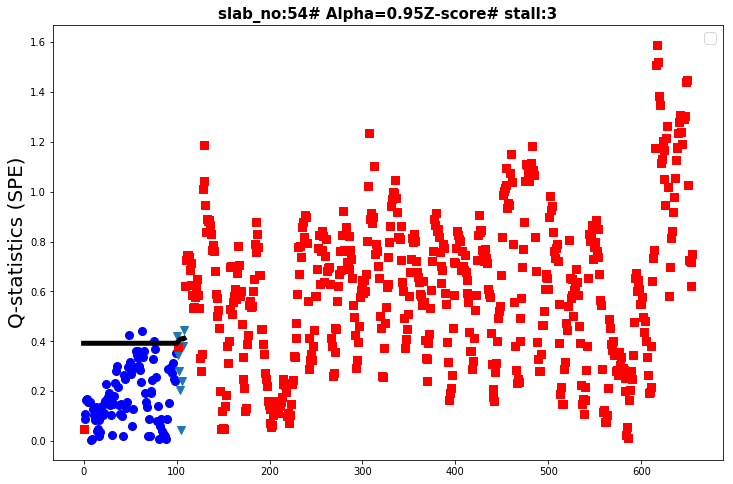

In [62]:
fig = plt.figure(figsize=(12, 8))

x0 = op['IND_x0']
x1 = op['IND_x1']
plt.plot(x0, Q['Qdist'][x0], 'bo', linewidth=2, markersize=8)
plt.plot(x1, Q['Qdist'][x1], 'v', linewidth=2, markersize=8)

alpha = 0.95
SD_type = 'Z-score'
PCA_par = {}
PCA_par['n_stall'] = 3;

IND_abnor = np.argwhere(PC['Updated']==0)
IND_nor = np.argwhere(PC['Updated']==1)
plt.plot(IND_abnor,Q['Qdist'][IND_abnor],'rs',linewidth=2, markersize=8) # Outlier and faulty samples
plt.plot(IND_nor,Q['distcrit'][IND_nor][:,:, 0],'k-',linewidth=5, markersize=8) # Outlier and faulty samples
plt.ylabel('Q-statistics (SPE)',fontsize=20)
plt.title('slab_no:'+str(slab_no) + '# Alpha='+str(alpha)+str(SD_type)+'# stall:'+str(PCA_par['n_stall']),fontsize=15,fontweight='bold')
plt.legend(fontsize='x-large')
plt.show

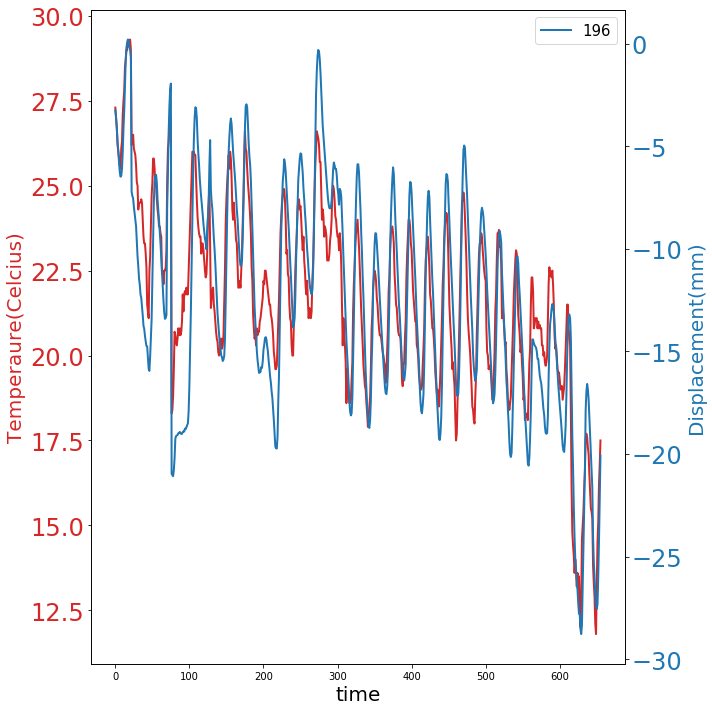

In [63]:
fig, ax1 = plt.subplots(figsize=(10, 10))
color = 'tab:red'
ax1.set_xlabel('time', fontsize = 20.0)
ax1.set_ylabel('Temperaure(Celcius)', color=color, fontsize = 20.0)
ax1.plot(op['t'].T, color=color, linewidth=2)
ax1.tick_params(axis='y', labelcolor=color, labelsize = 24)

ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis

color = 'tab:blue'
ax2.set_ylabel('Displacement(mm)', color=color, fontsize = 20.0)  # we already handled the x-label with ax1
ax2.plot(op['f'], linewidth=2)
ax2.tick_params(axis='y', labelcolor=color, labelsize = 24)
ax2.legend(disp_sensor_list, fontsize=15)

fig.tight_layout()  # otherwise the right y-label is slightly clipped